# Bayesian Optimization Pythia Tune using Ax - Reduced Parameters with Custom GP
> Created: June 9 2024 AAK, Harrison B. Prosper

## Running the notebook
All code and program dependencies such as pythia, rivet, hepmc, Ax are preinstalled on the docker image `alialkadhim/pythia_sbi_tune:latest`. Here is how to install the image and run this notebook:

```
git clone https://github.com/AliAlkadhim/Pythia8_SBI_Tune.git
```
Then,
```
cd Pythia8_SBI_Tune/code/BayesOpt
bash docker_run.sh
```

Then, inside the docker container, do

```
jupyter-lab --ip 0.0.0.0 --port 8889 --allow-root &
```

Now copy and paste the link displayed at the bottom of the terminal to your browser

----

This notebook is an extension for `BO_TuneAx_all_params.ipynb` and it performs Bayesian Optimizaion using [Ax](https://github.com/facebook/Ax) of the Lund string model parameters $a$ and $b$ that appear in the fragmentation function

$$
f_{\text{Lund}}(z) \propto \frac{(1-z)^a}{z} \exp \left(-\frac{b m_{\perp}^2}{z}\right)
$$

which are referred to as `StringZ:aLund` and `StringZ:bLund` in pythia8, respectively.

We use the data from `ALEPH_1996_S3486095` from the paper ["Studies of quantum chromodynamics with the ALEPH detector"](https://www.sciencedirect.com/science/article/pii/S0370157397000458)


## Key Observations
The default values of these parameters in pythia is due to the [Monash Tune](https://arxiv.org/pdf/1404.5630.pdf). Other papers have corroborated the results of that tune and attained similar values for some of the parameters. Therefore, when performing the Bayesian Optimization, we want to take that into account by forcing the algorithm to sample the Monash tune point. Observe how with few number of iterations, while forcing the sobol quasirandom sampling to explore the Monash tune, we will most likely end up with the Monash tune as the best-fit point. However, when we increase the number of iterations, we arrive at a tune that is slightly different than the Monash tune.

## Diferences from the previous notebook
This notebook differs from the previous notebook, `BO_TuneAx_all_params.ipynb`, in the following ways:

1. Instead of using the following test statistic:

$$
    \lambda(X; \theta) = \sqrt{\frac{1}{N}\sum_\text{histograms} \sum_i \left( \frac{D_i - T_i(\theta)}{\delta_i} \right)^2}, \tag{1}
$$


we will use a linear sum of $\chi^2$ variates:
$$
    \lambda(X; \theta) = \sum_\text{histograms} \sum_i \left( \frac{D_i - T_i(\theta)}{\delta_i} \right)^2, \tag{2}
$$

where $N$ is the total number of bins summed over histograms and $\delta_i^2$ is the sum of the variances associated with the data $D_i$ and the theoretical prediction $T_i$ with the latter obtained via Monte Carlo simulation.

The reason is that the peculiar objective function in Eq. (1) is designed for use in a neural network, so we cannot correctly interpret the minos errors as confidence intervals because the objective function doesn't have a $\chi^2$ distribution. On the other hand using Eq. (2) we can interpret this as a $\chi^2$ function for which the usual rules can be applied to derive the errors.


2. We keep fixed all the parameters which are not well determined to the values we found in `BO_TuneAx_all_params.ipynb`. We keep the parameters which are well-determined floating.

Well-determined parameters: [sigma, aExtraSQuark, enhancedFraction, probStoUD, probQQtoQ, probSQtoQQ, alphaSvalue, pTmin]

not well-determined parameters: [aLund, bLund, rFactC, rFactB, aExtraDiquark, enhancedWidth, ProbQQ1toQQ0]

In addition to floating the parameters which are well-determined, we also float $a$ and $b$ again. Therefore:

**floating parameters**: [ aLund, bLund, sigma, aExtraSQuark, enhancedFraction, probStoUD, probQQtoQ, probSQtoQQ, alphaSvalue, pTmin ]

**fixed parameters**: [rFactC, rFactB, aExtraDiquark, enhancedWidth, ProbQQ1toQQ0]

3. We remove histograms that have large discrepancies between theory and data in `BO_TuneAx_all_params.ipynb`, as these histograms could be causing biasing. These observables are just not well modeled by pythia. These observables (histograms) are: ['d35-x01-y01', 'd36-x01-y01','d39-x01-y01', 'd40-x01-y01']

----

## Considererations for Data and Effective counts
Notice (unfortunately) that the total effective counts for every histogram is different! This is a huge complication because, in principle, we would need to generate different numbers of events for every histogram. But, as is true of much of what we do in science, we should make some simplifying assumptions to reduce to complexity of the problem. 

**Assumptions**

  1. Since we are not given correlation matrices for the measured cross sections, we assume that the bin-by-bin cross section measurements are conditionally independent: given fixed values of the tune parameters the measured cross sections are statistically independent.
  2. The counts per bin are Poisson-distributed and the cross sections are just scaled values of the counts.  We can, therefore, compute the effective count in each bin using the following *ansatz*
\begin{align}
    n_i & = k_i \sigma_i,\\
    \sqrt{n_i} & = k_i \delta \sigma_i \quad \text{and, therefore, }\\
    n_i & = \left( \frac{\sigma_i}{\delta\sigma_i} \right)^2 ,
\end{align}
where $\sigma_i \pm \delta\sigma_i$ is the measured cross section in bin $i$ and $k_i$, the *effective integrated luminosity*, is the product $\epsilon_i {\cal L}$ of the efficiency times acceptance, $\epsilon_i$, and  the integrated luminosity ${\cal L}$. The total effective count for a histogram is then just $n = \sum_{i} n_i$.

Therefore, for each tune parameter point, a sufficiently large sample of simulated events will result in histograms that serve both as the predictions as well as the basis for simulating events counts in all the simulated "observed" histograms. Given our assumptions, we can write down an approximation of the statistical model, $p(X | \theta)$, where $X$ are *potentially observable* counts and $\theta$ are the tune parameters. With the assumptions above, the statistical model for the $\texttt{ALEPH}$ data can be approximated as a product of either gamma or Gaussian densities depending on the size of the effective bin counts. We see that about 300,000 events need to be simulated per point in order to match the statistical precision of the data.

## .yoda format
The .yoda histograms for the data look like:

```
# xval	 xerr-	 xerr+	 yval	 yerr-	 yerr+
```
`xval` is the bin center, while `yval` is the height of the bin center. `xerr-=xerr+` is the positive and uncertainties in the bin center location, and `yerr-=yerr+` is the uncertainty in the height.

The data recorded is the cross section. so let's call that cross section in bin i $\hat{\sigma}_i^{Data} =yval$ and the uncertainty in bin i $\Delta^{Data}_i = yerr-$ . 


while the simulation histograms look like:
```
xlow	 xhigh	 sumw	 sumw2	 sumwx	 sumwx2	 numEntries
```

`xlow` is the left edge and `xhigh` is the right edge for a bin $i$. `sumw` is the sum of weights per bin $i$ $sumw^{bin, i} \sum_{k=1}^{N_{counts \ in \ bin \ i}} w_k^{bin \ i}$ and `sumw2` is sum of weights squared $sumw2^{bin \ i}=\sum_{k=1}^{N_{counts \ in \ bin \ i}} (w_k^{bin \ i})^2$ . To convert to differential cross section we divide by the bin widths, i.e. we calculate $\Delta x = xhigh-xlow$ and divide $\hat{\sigma}_i^{MC} = sumw/\Delta x$ and $sumw2/\Delta x ^2$ and $sumwx/\Delta x$ and $sumwx2/Delta x^2$ . Then the MC error for the cross section per bin is $\Delta_i^{MC} =\sqrt{sumw2/\Delta x ^2}$ 

We can write the effective count can be as
$$\frac{\sqrt{\sum_i w_i^2}}{\sum_i w_i}=\frac{1}{\sqrt{N_{e f f}}}$$
So 
$$N_{eff,\ i} = \left( \frac{\sum_i w_i }{\sqrt{\sum_i w_i^2 } } \right)^2 = \left( \frac{\sum_i w_i}{\Delta_{i, MC}} \right)^2$$
Therefore the scale factor per bin is

$$K_i = \frac{\sum_i w_i}{\sum_i w_i^2 }= \frac{\sum_i w_i}{\Delta_{i,MC}^2}$$

------

In [ ]:
import os, sys, re
import numpy as np
import pandas as pd
import matplotlib as mp
import matplotlib.pyplot as plt
import importlib

# from bayes_opt import BayesianOptimization, UtilityFunction 


from ax.service.ax_client import AxClient, ObjectiveProperties
from ax.utils.measurement.synthetic_functions import hartmann6
from ax.utils.notebook.plotting import init_notebook_plotting, render
from ax.core.observation import ObservationFeatures


from typing import Optional

from botorch.models.gpytorch import GPyTorchModel
from gpytorch.distributions import MultivariateNormal
from gpytorch.kernels import RBFKernel, ScaleKernel
from gpytorch.likelihoods import GaussianLikelihood
from gpytorch.means import ConstantMean
from gpytorch.models import ExactGP
from torch import Tensor


import torch
init_notebook_plotting()
# import plotly.io as pio
# pio.renderers.default = "jupyterlab"


#`source /cvmfs/sft.cern.ch/lcg/views/LCG_102/x86_64-centos7-gcc11-opt/setup.sh`
from glob import glob
from tqdm import tqdm
import yoda2numpy_BayesOpt
from yoda2numpy_BayesOpt import Yoda2Numpy

import pythia_SBI_utils
from pythia_SBI_utils import *

FONTSIZE = 14
font = {'family' : 'serif',
        'weight' : 'normal',
        'size'   : FONTSIZE}
mp.rc('font', **font)

# set usetex = False if LaTex is not 
# available on your system or if the 
# rendering is too slow
mp.rc('text', usetex=True)

In [3]:
BAYES_OPT=False
AX=True

In [19]:
class SimpleCustomGP(ExactGP, GPyTorchModel):

    _num_outputs = 1  # to inform GPyTorchModel API

    def __init__(self, train_X, train_Y, train_Yvar: Optional[Tensor] = None):
        # NOTE: This ignores train_Yvar and uses inferred noise instead.
        # squeeze output dim before passing train_Y to ExactGP
        super().__init__(train_X, train_Y.squeeze(-1), GaussianLikelihood())
        self.mean_module = ConstantMean()
        self.covar_module = ScaleKernel(
            base_kernel=RBFKernel(ard_num_dims=train_X.shape[-1]),
        )
        self.to(train_X)  # make sure we're on the right device/dtype

    def forward(self, x):
        mean_x = self.mean_module(x)
        covar_x = self.covar_module(x)
        return MultivariateNormal(mean_x, covar_x)

### Get the SimpleCustomGP (kernel) parameters, and look at the commented optional things like acquisiion function

In [20]:
from ax.models.torch.botorch_modular.model import BoTorchModel
from ax.models.torch.botorch_modular.surrogate import Surrogate


ax_model = BoTorchModel(
    surrogate=Surrogate(
        # The model class to use
        botorch_model_class=SimpleCustomGP,
        # Optional, MLL class with which to optimize model parameters
        # mll_class=ExactMarginalLogLikelihood,
        # Optional, dictionary of keyword arguments to model constructor
        # model_options={}
    ),
    # Optional, acquisition function class to use - see custom acquisition tutorial
    # botorch_acqf_class=qExpectedImprovement,
)

In [29]:
from ax.modelbridge.generation_strategy import GenerationStep, GenerationStrategy
from ax.modelbridge.registry import Models


gs = GenerationStrategy(
    steps=[
        # Quasi-random initialization step
        GenerationStep(
            model=Models.SOBOL,
            num_trials=30,  # How many trials should be produced from this generation step
        ),
        # Bayesian optimization step using the custom acquisition function
        GenerationStep(
            model=Models.BOTORCH_MODULAR,
            num_trials=-1,  # No limitation on how many trials should be produced from this step
            # For `BOTORCH_MODULAR`, we pass in kwargs to specify what surrogate or acquisition function to use.
            model_kwargs={
                "surrogate": Surrogate(SimpleCustomGP),
            },
        ),
    ]
)

In [106]:
ax_client.create_experiment?

Signature:
ax_client.create_experiment(
    parameters: List[Dict[str, Union[NoneType, str, bool, float, int, Sequence[Union[NoneType, str, bool, float, int]], Dict[str, List[str]]]]],
    name: Optional[str] = None,
    description: Optional[str] = None,
    owners: Optional[List[str]] = None,
    objectives: Optional[Dict[str, ax.service.utils.instantiation.ObjectiveProperties]] = None,
    parameter_constraints: Optional[List[str]] = None,
    outcome_constraints: Optional[List[str]] = None,
    status_quo: Optional[Dict[str, Union[NoneType, str, bool, float, int]]] = None,
    overwrite_existing_experiment: bool = False,
    experiment_type: Optional[str] = None,
    tracking_metric_names: Optional[List[str]] = None,
    choose_generation_strategy_kwargs: Optional[Dict[str, Any]] = None,
    support_intermediate_data: bool = False,
    immutable_search_space_and_opt_config: bool = True,
    is_test: bool = False,
    metric_definitions: Optional[Dict[str, Dict[str, Any]]] = None,
)

In [30]:
N_ITER = 120
best_param_filename_120 = f"best_parameters/all_parameters_Niter_{N_ITER}.csv"
best_parameters_120 = pd.read_csv(best_param_filename_120)
best_parameters_120

,Unnamed: 0,aLund,bLund,rFactC,rFactB,aExtraSQuark,aExtraDiquark,sigma,enhancedFraction,enhancedWidth,ProbStoUD,probQQtoQ,probSQtoQQ,ProbQQ1toQQ0,alphaSvalue,pTmin
0,0,0.75248,1.049841,1.38034,0.819206,0.0,0.931775,0.316637,0.0,1.939937,0.217093,0.104321,0.949422,0.164353,0.13793,0.495941


In [31]:
# FLOATING PARAAMS: 
# aLund, 
# bLund, 
# sigma, 
# aExtraSQuark, 
# enhancedFraction, 
# probStoUD, 
# probQQtoQ, 
# probSQtoQQ, 
# alphaSvalue, 
# pTmin

def make_pythia_card(aLund, 
                     bLund,
                    aExtraSQuark,
                    sigma,
                    enhancedFraction,
                    ProbStoUD,
                    probQQtoQ,
                    probSQtoQQ,
                    alphaSvalue,
                    pTmin):
    
    cards_dir = os.path.join(os.getcwd(), "BO_Cards")
    filename = f"ALEPH_1996_S3486095_BO_card.cmnd"
    file_path = os.path.join(cards_dir, filename)
    with open(file_path,'w') as f:
        first_block="""Main:numberOfEvents = 250000          ! number of events to generate
Next:numberShowEvent = 0           ! suppress full listing of first events
# random seed
Random:setSeed = on
Random:seed= 0
! 2) Beam parameter settings.
Beams:idA = 11                ! first beam,  e- = 11
Beams:idB = -11                ! second beam, e+ = -11
Beams:eCM = 91.2               ! CM energy of collision
# Pythia 8 settings for LEP
# Hadronic decays including b quarks, with ISR photons switched off
WeakSingleBoson:ffbar2gmZ = on
23:onMode = off
23:onIfAny = 1 2 3 4 5
PDF:lepton = off
SpaceShower:QEDshowerByL = off\n\n"""
        f.write(first_block)
        # f.write(f"Random:seed={indx+1}")
        f.write(f"StringZ:aLund = {aLund}\n\n")
        f.write(f"StringZ:bLund = {bLund}\n\n")
        f.write(f"StringZ:rFactC = {float(best_parameters_120['rFactC'])}\n\n")
        f.write(f"StringZ:rFactB = {float(best_parameters_120['rFactB'])}\n\n")
        f.write(f"StringZ:aExtraSQuark = {aExtraSQuark}\n\n")
        f.write(f"StringZ:aExtraDiquark = {float(best_parameters_120['aExtraDiquark'])}\n\n")
        f.write(f"StringPT:sigma = {sigma}\n\n")
        f.write(f"StringPT:enhancedFraction = {enhancedFraction}\n\n")
        f.write(f"StringPT:enhancedWidth = {float(best_parameters_120['enhancedWidth'])}\n\n")
        f.write(f"StringFlav:ProbStoUD = {ProbStoUD}\n\n")
        f.write(f"StringFlav:probQQtoQ = {probQQtoQ}\n\n")
        f.write(f"StringFlav:probSQtoQQ = {probSQtoQQ}\n\n")
        f.write(f"StringFlav:ProbQQ1toQQ0 = {float(best_parameters_120['ProbQQ1toQQ0'])}\n\n")
        f.write(f"TimeShower:alphaSvalue = {alphaSvalue}\n\n")
        f.write(f"TimeShower:pTmin = {pTmin}\n\n")
        


def get_pbounds(PARAM_DICT):
    pbounds = {}
    for key, value in PARAM_DICT.items():
        p_name = key.split(':')[1]
        p_bound = tuple(value)
        pbounds[p_name] = p_bound
    return pbounds

In [32]:
dfdata, dfsims, generated_indices = get_data()
print('DATA DATAFRAME')
print(dfdata['/REF/ALEPH_1996_S3486095/d01-x01-y01'].head())
print('FIRST SIM DATAFRAME')
print(dfsims[generated_indices[0]]['/ALEPH_1996_S3486095/d01-x01-y01'].head())

data_keys, mc_keys = get_hist_names(dfdata)

filtered_data_keys, filtered_mc_keys = filter_keys(dfdata, dfsims, data_keys, mc_keys)

print(f'length of filtered_data_keys = {len(filtered_data_keys)}')

[0]
looping over 1 sim yoda files...



  0%|                                                                                                                                                                                        | 0/1 [00:00<?, ?it/s]

using filename ALEPH_YODAS_BayesOpt/ALEPH_1996_S3486095_hist_0.yoda


FileNotFoundError: ALEPH_YODAS_BayesOpt/ALEPH_1996_S3486095_hist_0.yoda

In [33]:
def reduce_filtered_keys(filtered_data_keys, filtered_mc_keys):
    # Initialize empty list for the reduced keys
    reduced_data_keys = []
    reduced_mc_keys = []
    # List of histogram keys that need to be removed
    hists_to_remove = ['d35-x01-y01', 'd36-x01-y01', 'd39-x01-y01', 'd40-x01-y01']
    
    # Iterate over each data key
    for data_key in filtered_data_keys:
        # Add the key to reduced_data_keys only if it does not match any hist_to_remove
        if not any(hist_to_remove in str(data_key) for hist_to_remove in hists_to_remove):
            reduced_data_keys.append(data_key)

    for mc_key in filtered_mc_keys:
        # Add the key to reduced_data_keys only if it does not match any hist_to_remove
        if not any(hist_to_remove in str(mc_key) for hist_to_remove in hists_to_remove):
            reduced_mc_keys.append(mc_key)
            
        
    return reduced_data_keys, reduced_mc_keys

        

In [34]:
reduced_data_keys, reduced_mc_keys = reduce_filtered_keys(filtered_data_keys, filtered_mc_keys)
print(reduced_data_keys, reduced_mc_keys)
print(f'length of reduced data keys = {len(reduced_data_keys)}')
print(f'length of reduced mc keys = {len(reduced_mc_keys)}')

['/REF/ALEPH_1996_S3486095/d01-x01-y01', '/REF/ALEPH_1996_S3486095/d02-x01-y01', '/REF/ALEPH_1996_S3486095/d03-x01-y01', '/REF/ALEPH_1996_S3486095/d04-x01-y01', '/REF/ALEPH_1996_S3486095/d05-x01-y01', '/REF/ALEPH_1996_S3486095/d06-x01-y01', '/REF/ALEPH_1996_S3486095/d07-x01-y01', '/REF/ALEPH_1996_S3486095/d08-x01-y01', '/REF/ALEPH_1996_S3486095/d09-x01-y01', '/REF/ALEPH_1996_S3486095/d10-x01-y01', '/REF/ALEPH_1996_S3486095/d11-x01-y01', '/REF/ALEPH_1996_S3486095/d12-x01-y01', '/REF/ALEPH_1996_S3486095/d17-x01-y01', '/REF/ALEPH_1996_S3486095/d18-x01-y01', '/REF/ALEPH_1996_S3486095/d25-x01-y01', '/REF/ALEPH_1996_S3486095/d26-x01-y01', '/REF/ALEPH_1996_S3486095/d27-x01-y01', '/REF/ALEPH_1996_S3486095/d28-x01-y01', '/REF/ALEPH_1996_S3486095/d29-x01-y01', '/REF/ALEPH_1996_S3486095/d30-x01-y01', '/REF/ALEPH_1996_S3486095/d31-x01-y01', '/REF/ALEPH_1996_S3486095/d32-x01-y01', '/REF/ALEPH_1996_S3486095/d33-x01-y01', '/REF/ALEPH_1996_S3486095/d34-x01-y01', '/REF/ALEPH_1996_S3486095/d37-x01-y01',

In [35]:
importlib.reload(yoda2numpy_BayesOpt)
from yoda2numpy_BayesOpt import Yoda2Numpy
importlib.reload(pythia_SBI_utils)
from pythia_SBI_utils import *

def true_objective_func(aLund, 
                     bLund,
                    aExtraSQuark,
                    sigma,
                    enhancedFraction,
                    ProbStoUD,
                    probQQtoQ,
                    probSQtoQQ,
                    alphaSvalue,
                    pTmin):
    
    # step 1: write .cmnd file 
    make_pythia_card(aLund, 
                     bLund,
                    aExtraSQuark,
                    sigma,
                    enhancedFraction,
                    ProbStoUD,
                    probQQtoQ,
                    probSQtoQQ,
                    alphaSvalue,
                    pTmin)
    #step 2 run main42 and rivet
    os.system("""./main42 BO_Cards/ALEPH_1996_S3486095_BO_card.cmnd /media/ali/DATA/TEMP/ALEPH_1996_S3486095_card.fifo
    rivet -o ALEPH_1996_S3486095_hist_0.yoda -a ALEPH_1996_S3486095 /media/ali/DATA/TEMP/ALEPH_1996_S3486095_card.fifo

    /media/ali/DATA/TEMP/rm ALEPH_1996_S3486095_card.fifo
    mv ALEPH_1996_S3486095_hist_0.yoda ALEPH_YODAS_BayesOpt/""")
    

    #step 3: get generated yoda file histograms in the form of dataframes
    dfdata, dfsims, generated_indices = get_data()
    print('DATA DATAFRAME')
    print(dfdata['/REF/ALEPH_1996_S3486095/d01-x01-y01'].head())
    print('FIRST SIM DATAFRAME')
    print(dfsims[generated_indices[0]]['/ALEPH_1996_S3486095/d01-x01-y01'].head())

    #step 4: fileter histograms based on our criteria
    data_keys, mc_keys = get_hist_names(dfdata)

    filtered_data_keys, filtered_mc_keys = filter_keys(dfdata, dfsims, data_keys, mc_keys)

    #step 4.5: take out bad histograms
    reduced_data_keys, reduced_mc_keys = reduce_filtered_keys(filtered_data_keys, filtered_mc_keys)

    
    #step 5: get test statistic at each point
    X0 = {}
    for ii, gen_ind in enumerate(generated_indices):
        # X0.append(test_statistic(filtered_data_keys,filtered_mc_keys, dfdata, dfsims[gen_ind], which = 0))
        # try:
        #     X0.append(test_statistic(filtered_data_keys,filtered_mc_keys, dfdata, dfsims[ii], which = 0))
        try:
            X0[gen_ind] = test_statistic(reduced_data_keys,
                                         reduced_mc_keys, 
                                         dfdata, 
                                         dfsims[gen_ind], 
                                         which = 0)
        except Exception:
            print('test statistic error in file index: ', gen_ind)
            
    if BAYES_OPT:        
        objective_func = - X0[0]
    else:
        objective_func = X0[0]
    os.system("rm ALEPH_YODAS_BayesOpt/ALEPH_1996_S3486095_hist_0.yoda")
        
    print(f"objective function = {objective_func}")
    return objective_func

In [36]:
PARAM_DICT = {
        'StringZ:aLund' : [0.5, 2.0],
        'StringZ:bLund': [0.5, 2.0],
        # 'StringZ:rFactC':[0.0, 2.0],
        # 'StringZ:rFactB': [0., 2.0],
        'StringZ:aExtraSQuark':[0.,2.],
        # 'StringZ:aExtraDiquark':[0.,2.],
        'StringPT:sigma':[0.,1.],
        'StringPT:enhancedFraction':[0.,1.],
        # 'StringPT:enhancedWidth':[1.0,4.0],
        'StringFlav:ProbStoUD':[0,4.0],
        'StringFlav:probQQtoQ':[0,4.0],
        'StringFlav:probSQtoQQ':[0,4.0],
        # 'StringFlav:ProbQQ1toQQ0':[0,4.0],
        'TimeShower:alphaSvalue':[0.06,0.25],
        'TimeShower:pTmin':[0.1,2.0]


}

MONASH_DICT = {
    "aLund" : 0.68, 
    "bLund" : 0.98,
    "rFactC": 1.32,
    "rFactB":0.855,
    "aExtraSQuark": 0.0,
    "aExtraDiquark":0.97,
    "sigma":0.335,
    "enhancedFraction":0.01,
    "enhancedWidth":2.0,
    "ProbStoUD":0.217,
    "probQQtoQ":0.081,
    "probSQtoQQ":0.915,
    "ProbQQ1toQQ0": 0.0275,
    "alphaSvalue": 0.1365,
    "pTmin": 0.5
}

REDUCED_MONASH_DICT = {
    "aLund" : 0.68, 
    "bLund" : 0.98,
    "aExtraSQuark": 0.0,
    "sigma":0.335,
    "enhancedFraction":0.01,
    "ProbStoUD":0.217,
    "probQQtoQ":0.081,
    "probSQtoQQ":0.915,
    "alphaSvalue": 0.1365,
    "pTmin": 0.5
}

ab_tune_Monash_rest = REDUCED_MONASH_DICT.copy()
ab_tune_Monash_rest["aLund"] = 1.1279257649367096
ab_tune_Monash_rest["bLund"] =1.349756967243872
ab_tune_Monash_rest

{'aLund': 1.1279257649367096,
 'bLund': 1.349756967243872,
 'aExtraSQuark': 0.0,
 'sigma': 0.335,
 'enhancedFraction': 0.01,
 'ProbStoUD': 0.217,
 'probQQtoQ': 0.081,
 'probSQtoQQ': 0.915,
 'alphaSvalue': 0.1365,
 'pTmin': 0.5}

In [37]:
ax_client = AxClient(generation_strategy=gs)
ax_client.create_experiment(
name="Ax_Tune_Pythia",
        parameters = [
                    {
                        "name": "aLund",
                        "type": "range",
                        "bounds": [0.5, 2.0],
                    }, 
                    {
                        "name": "bLund",
                        "type": "range",
                        "bounds": [0.5, 2.0],
                    },

                    {
                        "name": "aExtraSQuark",
                        "type": "range",
                        "bounds": [0.0, 2.0],
                    }, 

                    {
                        "name": "sigma",
                        "type": "range",
                        "bounds": [0.,1.],
                    }, 
                    {
                        "name": "enhancedFraction",
                        "type": "range",
                        "bounds": [0.,1.],
                    }, 

                    {
                        "name": "ProbStoUD",
                        "type": "range",
                        "value_type": "float",
                        "bounds": [0,4.0],
                    }, 
                    {
                        "name": "probQQtoQ",
                        "type": "range",
                        "value_type": "float",
                        "bounds": [0,4.0],
                    }, 
                    {
                        "name": "probSQtoQQ",
                        "type": "range",
                        "value_type": "float",
                        "bounds": [0,4.0],
                    }, 
   
                    {
                        "name": "alphaSvalue",
                        "type": "range",
                        "value_type": "float",
                        "bounds": [0.06,0.25],
                    }, 
                    {
                        "name": "pTmin",
                        "type": "range",
                        "value_type": "float",
                        "bounds": [0.1,2.0],
                    }, 
            
                ],
objectives = {"true_objective_func": ObjectiveProperties(minimize=True)},
)

[INFO 06-09 19:31:42] ax.service.ax_client: Starting optimization with verbose logging. To disable logging, set the `verbose_logging` argument to `False`. Note that float values in the logs are rounded to 6 decimal points.
[INFO 06-09 19:31:42] ax.service.utils.instantiation: Inferred value type of ParameterType.FLOAT for parameter aLund. If that is not the expected value type, you can explicitly specify 'value_type' ('int', 'float', 'bool' or 'str') in parameter dict.
[INFO 06-09 19:31:42] ax.service.utils.instantiation: Inferred value type of ParameterType.FLOAT for parameter bLund. If that is not the expected value type, you can explicitly specify 'value_type' ('int', 'float', 'bool' or 'str') in parameter dict.
[INFO 06-09 19:31:42] ax.service.utils.instantiation: Inferred value type of ParameterType.FLOAT for parameter aExtraSQuark. If that is not the expected value type, you can explicitly specify 'value_type' ('int', 'float', 'bool' or 'str') in parameter dict.
[INFO 06-09 19:31

In [38]:


##########################################
# Sample Monash Tune point
suggest_param, suggest_ind = ax_client.attach_trial(
    parameters=REDUCED_MONASH_DICT
)
ax_client.complete_trial(trial_index=suggest_ind, raw_data=true_objective_func(
        aLund=suggest_param["aLund"], 
        bLund=suggest_param["bLund"],
        aExtraSQuark=suggest_param["aExtraSQuark"],
        sigma=suggest_param["sigma"],
        enhancedFraction=suggest_param["enhancedFraction"],
        ProbStoUD=suggest_param["ProbStoUD"],
        probQQtoQ=suggest_param["probQQtoQ"],
        probSQtoQQ=suggest_param["probSQtoQQ"],
        alphaSvalue=suggest_param["alphaSvalue"],
        pTmin=suggest_param["pTmin"]
))
##########################################
# Sample ab tune point with the rest of the parameters from the Monash tune
suggest_param_ab, suggest_ind_ab = ax_client.attach_trial(
    parameters=ab_tune_Monash_rest
)
ax_client.complete_trial(trial_index=suggest_ind_ab, raw_data=true_objective_func(
        aLund=suggest_param_ab["aLund"], 
        bLund=suggest_param_ab["bLund"],
        aExtraSQuark=suggest_param_ab["aExtraSQuark"],
        sigma=suggest_param_ab["sigma"],
        enhancedFraction=suggest_param_ab["enhancedFraction"],
        ProbStoUD=suggest_param_ab["ProbStoUD"],
        probQQtoQ=suggest_param_ab["probQQtoQ"],
        probSQtoQQ=suggest_param_ab["probSQtoQQ"],
        alphaSvalue=suggest_param_ab["alphaSvalue"],
        pTmin=suggest_param_ab["pTmin"]
))


##########################################
# start main tuning loop
N_ITER = 100
for i in range(N_ITER):
    parameterization, trial_index = ax_client.get_next_trial()
    print(parameterization)
    ax_client.complete_trial(trial_index=trial_index, raw_data=true_objective_func(
        aLund=parameterization["aLund"], 
        bLund=parameterization["bLund"],
        aExtraSQuark=parameterization["aExtraSQuark"],
        sigma=parameterization["sigma"],
        enhancedFraction=parameterization["enhancedFraction"],
        ProbStoUD=parameterization["ProbStoUD"],
        probQQtoQ=parameterization["probQQtoQ"],
        probSQtoQQ=parameterization["probSQtoQQ"],
        alphaSvalue=parameterization["alphaSvalue"],
        pTmin=parameterization["pTmin"]
    ))



[INFO 06-09 19:31:43] ax.core.experiment: Attached custom parameterizations [{'aLund': 0.68, 'bLund': 0.98, 'aExtraSQuark': 0.0, 'sigma': 0.335, 'enhancedFraction': 0.01, 'ProbStoUD': 0.217, 'probQQtoQ': 0.081, 'probSQtoQQ': 0.915, 'alphaSvalue': 0.1365, 'pTmin': 0.5}] as trial 0.
/tmp/ipykernel_57/4242634014.py:48: FutureWarning:

Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead

/tmp/ipykernel_57/4242634014.py:49: FutureWarning:

Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead

/tmp/ipykernel_57/4242634014.py:51: FutureWarning:

Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead

/tmp/ipykernel_57/4242634014.py:54: FutureWarning:

Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) ins


 >>> PYTHIA settings will be read from file BO_Cards/ALEPH_1996_S3486095_BO_card.cmnd <<< 
 >>> HepMC events will be written to file /media/ali/DATA/TEMP/ALEPH_1996_S3486095_card.fifo <<< 


 *------------------------------------------------------------------------------------* 
 |                                                                                    | 
 |  *------------------------------------------------------------------------------*  | 
 |  |                                                                              |  | 
 |  |                                                                              |  | 
 |  |   PPP   Y   Y  TTTTT  H   H  III    A      Welcome to the Lund Monte Carlo!  |  | 
 |  |   P  P   Y Y     T    H   H   I    A A     This is PYTHIA version 8.309      |  | 
 |  |   PPP     Y      T    HHHHH   I   AAAAA    Last date of change: 16 Feb 2023  |  | 
 |  |   P       Y      T    H   H   I   A   A                                      |  | 
 |  |  

Rivet 3.1.9 running on machine ba99a65a1f23 (x86_64) at 2024-06-09 19:34:59
Reading events from '/media/ali/DATA/TEMP/ALEPH_1996_S3486095_card.fifo'
Event 100 (0:00:01 elapsed)
Event 200 (0:00:01 elapsed)
Event 300 (0:00:01 elapsed)
Event 400 (0:00:01 elapsed)
Event 500 (0:00:01 elapsed)
Event 600 (0:00:01 elapsed)
Event 700 (0:00:01 elapsed)
Event 800 (0:00:01 elapsed)
Event 900 (0:00:02 elapsed)
Event 1000 (0:00:02 elapsed)
Event 1100 (0:00:02 elapsed)
Event 1200 (0:00:02 elapsed)
Event 1300 (0:00:02 elapsed)
Event 1400 (0:00:02 elapsed)
Event 1500 (0:00:03 elapsed)
Event 1600 (0:00:03 elapsed)
Event 1700 (0:00:03 elapsed)
Event 1800 (0:00:03 elapsed)
Event 1900 (0:00:04 elapsed)
Event 2000 (0:00:04 elapsed)
Event 2100 (0:00:04 elapsed)
Event 2200 (0:00:04 elapsed)
Event 2300 (0:00:04 elapsed)
Event 2400 (0:00:04 elapsed)
Event 2500 (0:00:04 elapsed)
Event 2600 (0:00:04 elapsed)
Event 2700 (0:00:05 elapsed)
Event 2800 (0:00:05 elapsed)
Event 2900 (0:00:05 elapsed)
Event 3000 (0:00:05





Rivet.AnalysisHandler: INFO  Using named weights
[0, 0]
looping over 2 sim yoda files...



 50%|████████████████████████████████████████████████████████████████████████████████████████                                                                                        | 1/2 [00:00<00:00,  9.42it/s]

using filename ALEPH_YODAS_BayesOpt/ALEPH_1996_S3486095_hist_0.yoda
using filename ALEPH_YODAS_BayesOpt/ALEPH_1996_S3486095_hist_0.yoda


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:00<00:00,  9.81it/s]
[INFO 06-09 19:42:05] ax.service.ax_client: Completed trial 0 with data: {'true_objective_func': (6558.369987, None)}.
[INFO 06-09 19:42:05] ax.core.experiment: Attached custom parameterizations [{'aLund': 1.127926, 'bLund': 1.349757, 'aExtraSQuark': 0.0, 'sigma': 0.335, 'enhancedFraction': 0.01, 'ProbStoUD': 0.217, 'probQQtoQ': 0.081, 'probSQtoQQ': 0.915, 'alphaSvalue': 0.1365, 'pTmin': 0.5}] as trial 1.
/tmp/ipykernel_57/4242634014.py:48: FutureWarning:

Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead

/tmp/ipykernel_57/4242634014.py:49: FutureWarning:

Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead

/tmp/ipykernel_57


using filename ALEPH_YODAS_BayesOpt/data/ALEPH_1996_S3486095.yoda
DATA DATAFRAME
     xval   xerr-   xerr+       yval     yerr-     yerr+
0  0.0025  0.0025  0.0025  12.360000  0.407922  0.407922
1  0.0075  0.0025  0.0025  23.330000  0.254951  0.254951
2  0.0125  0.0025  0.0025  20.230000  0.156205  0.156205
3  0.0175  0.0025  0.0025  16.690001  0.120416  0.120416
4  0.0225  0.0025  0.0025  13.410000  0.100000  0.100000
FIRST SIM DATAFRAME
    xlow  xhigh       sumw     sumw2     sumwx    sumwx2  numEntries
0  0.000  0.005  11.678400  0.009343  0.040083  0.030144     14598.0
1  0.005  0.010  23.425600  0.018740  0.175794  0.273501     29282.0
2  0.010  0.015  20.879999  0.016704  0.258824  0.650408     26100.0
3  0.015  0.020  17.140800  0.013713  0.298478  1.046575     21426.0
4  0.020  0.025  13.576000  0.010861  0.304297  1.369808     16970.0
 new data keys ['/REF/ALEPH_1996_S3486095/d01-x01-y01', '/REF/ALEPH_1996_S3486095/d02-x01-y01', '/REF/ALEPH_1996_S3486095/d03-x01-y01', '/REF/

Rivet 3.1.9 running on machine ba99a65a1f23 (x86_64) at 2024-06-09 19:45:23
Reading events from '/media/ali/DATA/TEMP/ALEPH_1996_S3486095_card.fifo'
Event 100 (0:00:01 elapsed)
Event 200 (0:00:01 elapsed)
Event 300 (0:00:01 elapsed)
Event 400 (0:00:01 elapsed)
Event 500 (0:00:01 elapsed)
Event 600 (0:00:02 elapsed)
Event 700 (0:00:02 elapsed)
Event 800 (0:00:02 elapsed)
Event 900 (0:00:02 elapsed)
Event 1000 (0:00:02 elapsed)
Event 1100 (0:00:02 elapsed)
Event 1200 (0:00:03 elapsed)
Event 1300 (0:00:03 elapsed)
Event 1400 (0:00:03 elapsed)
Event 1500 (0:00:03 elapsed)
Event 1600 (0:00:03 elapsed)
Event 1700 (0:00:03 elapsed)
Event 1800 (0:00:03 elapsed)
Event 1900 (0:00:03 elapsed)
Event 2000 (0:00:03 elapsed)
Event 2100 (0:00:03 elapsed)
Event 2200 (0:00:04 elapsed)
Event 2300 (0:00:04 elapsed)
Event 2400 (0:00:04 elapsed)
Event 2500 (0:00:04 elapsed)
Event 2600 (0:00:04 elapsed)
Event 2700 (0:00:04 elapsed)
Event 2800 (0:00:04 elapsed)
Event 2900 (0:00:04 elapsed)
Event 3000 (0:00:05





Rivet.AnalysisHandler: INFO  Using named weights
[0, 0]
looping over 2 sim yoda files...



  0%|                                                                                                                                                                                        | 0/2 [00:00<?, ?it/s]

using filename ALEPH_YODAS_BayesOpt/ALEPH_1996_S3486095_hist_0.yoda
using filename ALEPH_YODAS_BayesOpt/ALEPH_1996_S3486095_hist_0.yoda


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:00<00:00, 12.80it/s]



using filename ALEPH_YODAS_BayesOpt/data/ALEPH_1996_S3486095.yoda
DATA DATAFRAME
     xval   xerr-   xerr+       yval     yerr-     yerr+
0  0.0025  0.0025  0.0025  12.360000  0.407922  0.407922
1  0.0075  0.0025  0.0025  23.330000  0.254951  0.254951
2  0.0125  0.0025  0.0025  20.230000  0.156205  0.156205
3  0.0175  0.0025  0.0025  16.690001  0.120416  0.120416
4  0.0225  0.0025  0.0025  13.410000  0.100000  0.100000
FIRST SIM DATAFRAME
    xlow  xhigh       sumw     sumw2     sumwx    sumwx2  numEntries
0  0.000  0.005  11.020800  0.008817  0.038352  0.029089     13776.0
1  0.005  0.010  23.508801  0.018807  0.176546  0.274852     29386.0
2  0.010  0.015  20.892799  0.016714  0.259807  0.654799     26116.0
3  0.015  0.020  17.252001  0.013802  0.300248  1.052320     21565.0
4  0.020  0.025  13.820800  0.011057  0.309425  1.391315     17276.0
 new data keys ['/REF/ALEPH_1996_S3486095/d01-x01-y01', '/REF/ALEPH_1996_S3486095/d02-x01-y01', '/REF/ALEPH_1996_S3486095/d03-x01-y01', '/REF/

[INFO 06-09 19:51:09] ax.service.ax_client: Completed trial 1 with data: {'true_objective_func': (6754.631631, None)}.
[INFO 06-09 19:51:10] ax.service.ax_client: Generated new trial 2 with parameters {'aLund': 0.608981, 'bLund': 1.32423, 'aExtraSQuark': 1.899114, 'sigma': 0.225051, 'enhancedFraction': 0.770693, 'ProbStoUD': 3.293426, 'probQQtoQ': 3.688798, 'probSQtoQQ': 3.793795, 'alphaSvalue': 0.161718, 'pTmin': 1.109107} using model Sobol.
/tmp/ipykernel_57/4242634014.py:48: FutureWarning:

Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead

/tmp/ipykernel_57/4242634014.py:49: FutureWarning:

Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead

/tmp/ipykernel_57/4242634014.py:51: FutureWarning:

Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead

/tmp/ipyke

{'aLund': 0.6089807003736496, 'bLund': 1.3242295980453491, 'aExtraSQuark': 1.8991142511367798, 'sigma': 0.225050687789917, 'enhancedFraction': 0.7706929445266724, 'ProbStoUD': 3.293426275253296, 'probQQtoQ': 3.688797950744629, 'probSQtoQQ': 3.793794870376587, 'alphaSvalue': 0.16171801090240479, 'pTmin': 1.1091068267822266}

 >>> PYTHIA settings will be read from file BO_Cards/ALEPH_1996_S3486095_BO_card.cmnd <<< 
 >>> HepMC events will be written to file /media/ali/DATA/TEMP/ALEPH_1996_S3486095_card.fifo <<< 


 *------------------------------------------------------------------------------------* 
 |                                                                                    | 
 |  *------------------------------------------------------------------------------*  | 
 |  |                                                                              |  | 
 |  |                                                                              |  | 
 |  |   PPP   Y   Y  TTTTT  H   H  III

Rivet 3.1.9 running on machine ba99a65a1f23 (x86_64) at 2024-06-09 19:54:16
Reading events from '/media/ali/DATA/TEMP/ALEPH_1996_S3486095_card.fifo'
Event 100 (0:00:00 elapsed)
Event 200 (0:00:00 elapsed)
Event 300 (0:00:00 elapsed)
Event 400 (0:00:00 elapsed)
Event 500 (0:00:01 elapsed)
Event 600 (0:00:01 elapsed)
Event 700 (0:00:01 elapsed)
Event 800 (0:00:01 elapsed)
Event 900 (0:00:01 elapsed)
Event 1000 (0:00:02 elapsed)
Event 1100 (0:00:02 elapsed)
Event 1200 (0:00:03 elapsed)
Event 1300 (0:00:04 elapsed)
Event 1400 (0:00:04 elapsed)
Event 1500 (0:00:05 elapsed)
Event 1600 (0:00:06 elapsed)
Event 1700 (0:00:07 elapsed)
Event 1800 (0:00:07 elapsed)
Event 1900 (0:00:08 elapsed)
Event 2000 (0:00:08 elapsed)
Event 2100 (0:00:08 elapsed)
Event 2200 (0:00:09 elapsed)
Event 2300 (0:00:09 elapsed)
Event 2400 (0:00:09 elapsed)
Event 2500 (0:00:09 elapsed)
Event 2600 (0:00:09 elapsed)
Event 2700 (0:00:09 elapsed)
Event 2800 (0:00:10 elapsed)
Event 2900 (0:00:10 elapsed)
Event 3000 (0:00:10





Rivet.AnalysisHandler: INFO  Using named weights
[0, 0]
looping over 2 sim yoda files...



  0%|                                                                                                                                                                                        | 0/2 [00:00<?, ?it/s]

using filename ALEPH_YODAS_BayesOpt/ALEPH_1996_S3486095_hist_0.yoda


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:00<00:00,  4.45it/s]


using filename ALEPH_YODAS_BayesOpt/ALEPH_1996_S3486095_hist_0.yoda

using filename ALEPH_YODAS_BayesOpt/data/ALEPH_1996_S3486095.yoda
DATA DATAFRAME


[INFO 06-09 20:00:55] ax.service.ax_client: Completed trial 2 with data: {'true_objective_func': (747129.924095, None)}.


     xval   xerr-   xerr+       yval     yerr-     yerr+
0  0.0025  0.0025  0.0025  12.360000  0.407922  0.407922
1  0.0075  0.0025  0.0025  23.330000  0.254951  0.254951
2  0.0125  0.0025  0.0025  20.230000  0.156205  0.156205
3  0.0175  0.0025  0.0025  16.690001  0.120416  0.120416
4  0.0225  0.0025  0.0025  13.410000  0.100000  0.100000
FIRST SIM DATAFRAME
    xlow  xhigh       sumw     sumw2     sumwx    sumwx2  numEntries
0  0.000  0.005   9.512038  0.007610  0.031660  0.023434     11890.0
1  0.005  0.010  18.060871  0.014449  0.136070  0.212465     22576.0
2  0.010  0.015  17.179268  0.013743  0.214022  0.540425     21474.0
3  0.015  0.020  14.823260  0.011859  0.258201  0.905608     18529.0
4  0.020  0.025  12.495250  0.009996  0.280365  1.263345     15619.0
 new data keys ['/REF/ALEPH_1996_S3486095/d01-x01-y01', '/REF/ALEPH_1996_S3486095/d02-x01-y01', '/REF/ALEPH_1996_S3486095/d03-x01-y01', '/REF/ALEPH_1996_S3486095/d04-x01-y01', '/REF/ALEPH_1996_S3486095/d05-x01-y01', '/REF/AL

[INFO 06-09 20:00:56] ax.service.ax_client: Generated new trial 3 with parameters {'aLund': 0.650913, 'bLund': 1.948799, 'aExtraSQuark': 1.228738, 'sigma': 0.961238, 'enhancedFraction': 0.513215, 'ProbStoUD': 0.344964, 'probQQtoQ': 1.192487, 'probSQtoQQ': 1.685515, 'alphaSvalue': 0.073201, 'pTmin': 1.669719} using model Sobol.
/tmp/ipykernel_57/4242634014.py:48: FutureWarning:

Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead

/tmp/ipykernel_57/4242634014.py:49: FutureWarning:

Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead

/tmp/ipykernel_57/4242634014.py:51: FutureWarning:

Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead

/tmp/ipykernel_57/4242634014.py:54: FutureWarning:

Calling float on a single element Series is deprecated and will raise a Type

{'aLund': 0.6509126001037657, 'bLund': 1.9487990899942815, 'aExtraSQuark': 1.228738335892558, 'sigma': 0.9612379679456353, 'enhancedFraction': 0.5132150277495384, 'ProbStoUD': 0.34496424719691277, 'probQQtoQ': 1.1924874931573868, 'probSQtoQQ': 1.685514871031046, 'alphaSvalue': 0.07320140934549271, 'pTmin': 1.6697190013714134}

 >>> PYTHIA settings will be read from file BO_Cards/ALEPH_1996_S3486095_BO_card.cmnd <<< 
 >>> HepMC events will be written to file /media/ali/DATA/TEMP/ALEPH_1996_S3486095_card.fifo <<< 


 *------------------------------------------------------------------------------------* 
 |                                                                                    | 
 |  *------------------------------------------------------------------------------*  | 
 |  |                                                                              |  | 
 |  |                                                                              |  | 
 |  |   PPP   Y   Y  TTTTT  H   H  

Rivet 3.1.9 running on machine ba99a65a1f23 (x86_64) at 2024-06-09 20:02:48
Reading events from '/media/ali/DATA/TEMP/ALEPH_1996_S3486095_card.fifo'
Event 100 (0:00:00 elapsed)
Event 200 (0:00:00 elapsed)
Event 300 (0:00:00 elapsed)
Event 400 (0:00:00 elapsed)
Event 500 (0:00:01 elapsed)
Event 600 (0:00:01 elapsed)
Event 700 (0:00:01 elapsed)
Event 800 (0:00:01 elapsed)
Event 900 (0:00:01 elapsed)
Event 1000 (0:00:01 elapsed)
Event 1100 (0:00:01 elapsed)
Event 1200 (0:00:01 elapsed)
Event 1300 (0:00:01 elapsed)
Event 1400 (0:00:01 elapsed)
Event 1500 (0:00:01 elapsed)
Event 1600 (0:00:01 elapsed)
Event 1700 (0:00:01 elapsed)
Event 1800 (0:00:01 elapsed)
Event 1900 (0:00:01 elapsed)
Event 2000 (0:00:01 elapsed)
Event 2100 (0:00:01 elapsed)
Event 2200 (0:00:01 elapsed)
Event 2300 (0:00:01 elapsed)
Event 2400 (0:00:01 elapsed)
Event 2500 (0:00:01 elapsed)
Event 2600 (0:00:01 elapsed)
Event 2700 (0:00:02 elapsed)
Event 2800 (0:00:02 elapsed)
Event 2900 (0:00:02 elapsed)
Event 3000 (0:00:02





Rivet.AnalysisHandler: INFO  Using named weights
[0, 0]
looping over 2 sim yoda files...



100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:00<00:00, 15.57it/s]

using filename ALEPH_YODAS_BayesOpt/ALEPH_1996_S3486095_hist_0.yoda
using filename ALEPH_YODAS_BayesOpt/ALEPH_1996_S3486095_hist_0.yoda

using filename ALEPH_YODAS_BayesOpt/data/ALEPH_1996_S3486095.yoda
DATA DATAFRAME
     xval   xerr-   xerr+       yval     yerr-     yerr+
0  0.0025  0.0025  0.0025  12.360000  0.407922  0.407922
1  0.0075  0.0025  0.0025  23.330000  0.254951  0.254951
2  0.0125  0.0025  0.0025  20.230000  0.156205  0.156205
3  0.0175  0.0025  0.0025  16.690001  0.120416  0.120416
4  0.0225  0.0025  0.0025  13.410000  0.100000  0.100000
FIRST SIM DATAFRAME
    xlow  xhigh       sumw     sumw2     sumwx    sumwx2  numEntries
0  0.000  0.005  37.447239  0.029987  0.102896  0.070181     46763.0
1  0.005  0.010  35.568600  0.028483  0.261798  0.400123     44417.0
2  0.010  0.015  24.942141  0.019973  0.307767  0.769832     31147.0
3  0.015  0.020  17.410732  0.013942  0.302109  1.055654     21742.0
4  0.020  0.025  12.302506  0.009852  0.275152  1.235855     15363.0
 new d


[INFO 06-09 20:04:46] ax.service.ax_client: Completed trial 3 with data: {'true_objective_func': (1391351.46661, None)}.
[INFO 06-09 20:04:46] ax.service.ax_client: Generated new trial 4 with parameters {'aLund': 0.936369, 'bLund': 0.823007, 'aExtraSQuark': 0.120655, 'sigma': 0.367288, 'enhancedFraction': 0.953317, 'ProbStoUD': 1.871962, 'probQQtoQ': 3.020735, 'probSQtoQQ': 3.050878, 'alphaSvalue': 0.125819, 'pTmin': 1.524966} using model Sobol.
/tmp/ipykernel_57/4242634014.py:48: FutureWarning:

Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead

/tmp/ipykernel_57/4242634014.py:49: FutureWarning:

Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead

/tmp/ipykernel_57/4242634014.py:51: FutureWarning:

Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead

/tmp/i

objective function = 1391351.4666099548
{'aLund': 0.9363689073361456, 'bLund': 0.823006808757782, 'aExtraSQuark': 0.12065472453832626, 'sigma': 0.3672884600237012, 'enhancedFraction': 0.9533169493079185, 'ProbStoUD': 1.8719616457819939, 'probQQtoQ': 3.0207346118986607, 'probSQtoQQ': 3.0508775152266026, 'alphaSvalue': 0.12581860475242138, 'pTmin': 1.5249662465415896}

 >>> PYTHIA settings will be read from file BO_Cards/ALEPH_1996_S3486095_BO_card.cmnd <<< 
 >>> HepMC events will be written to file /media/ali/DATA/TEMP/ALEPH_1996_S3486095_card.fifo <<< 


 *------------------------------------------------------------------------------------* 
 |                                                                                    | 
 |  *------------------------------------------------------------------------------*  | 
 |  |                                                                              |  | 
 |  |                                                                              

Rivet 3.1.9 running on machine ba99a65a1f23 (x86_64) at 2024-06-09 20:07:09
Reading events from '/media/ali/DATA/TEMP/ALEPH_1996_S3486095_card.fifo'
Event 100 (0:00:00 elapsed)
Event 200 (0:00:00 elapsed)
Event 300 (0:00:00 elapsed)
Event 400 (0:00:01 elapsed)
Event 500 (0:00:01 elapsed)
Event 600 (0:00:01 elapsed)
Event 700 (0:00:01 elapsed)
Event 800 (0:00:01 elapsed)
Event 900 (0:00:01 elapsed)
Event 1000 (0:00:01 elapsed)
Event 1100 (0:00:01 elapsed)
Event 1200 (0:00:01 elapsed)
Event 1300 (0:00:01 elapsed)
Event 1400 (0:00:01 elapsed)
Event 1500 (0:00:01 elapsed)
Event 1600 (0:00:01 elapsed)
Event 1700 (0:00:01 elapsed)
Event 1800 (0:00:01 elapsed)
Event 1900 (0:00:01 elapsed)
Event 2000 (0:00:02 elapsed)
Event 2100 (0:00:02 elapsed)
Event 2200 (0:00:02 elapsed)
Event 2300 (0:00:02 elapsed)
Event 2400 (0:00:02 elapsed)
Event 2500 (0:00:02 elapsed)
Event 2600 (0:00:02 elapsed)
Event 2700 (0:00:02 elapsed)
Event 2800 (0:00:02 elapsed)
Event 2900 (0:00:02 elapsed)
Event 3000 (0:00:02





Rivet.AnalysisHandler: INFO  Using named weights
[0, 0]
looping over 2 sim yoda files...



  0%|                                                                                                                                                                                        | 0/2 [00:00<?, ?it/s]

using filename ALEPH_YODAS_BayesOpt/ALEPH_1996_S3486095_hist_0.yoda
using filename ALEPH_YODAS_BayesOpt/ALEPH_1996_S3486095_hist_0.yoda


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:00<00:00,  3.16it/s]
[INFO 06-09 20:09:49] ax.service.ax_client: Completed trial 4 with data: {'true_objective_func': (663741.626451, None)}.
[INFO 06-09 20:09:49] ax.service.ax_client: Generated new trial 5 with parameters {'aLund': 1.03634, 'bLund': 1.537361, 'aExtraSQuark': 0.561157, 'sigma': 0.292802, 'enhancedFraction': 0.978687, 'ProbStoUD': 2.261514, 'probQQtoQ': 1.314512, 'probSQtoQQ': 2.66321, 'alphaSvalue': 0.232378, 'pTmin': 0.558816} using model Sobol.
/tmp/ipykernel_57/4242634014.py:48: FutureWarning:

Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead

/tmp/ipykernel_57/4242634014.py:49: FutureWarning:

Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(


using filename ALEPH_YODAS_BayesOpt/data/ALEPH_1996_S3486095.yoda
DATA DATAFRAME
     xval   xerr-   xerr+       yval     yerr-     yerr+
0  0.0025  0.0025  0.0025  12.360000  0.407922  0.407922
1  0.0075  0.0025  0.0025  23.330000  0.254951  0.254951
2  0.0125  0.0025  0.0025  20.230000  0.156205  0.156205
3  0.0175  0.0025  0.0025  16.690001  0.120416  0.120416
4  0.0225  0.0025  0.0025  13.410000  0.100000  0.100000
FIRST SIM DATAFRAME
    xlow  xhigh       sumw     sumw2     sumwx    sumwx2  numEntries
0  0.000  0.005  13.704964  0.010964  0.045122  0.033305     17131.0
1  0.005  0.010  25.007500  0.020006  0.187894  0.292590     31259.0
2  0.010  0.015  22.253059  0.017803  0.276488  0.696279     27816.0
3  0.015  0.020  17.673012  0.014139  0.307561  1.077772     22091.0
4  0.020  0.025  14.085770  0.011269  0.315797  1.421891     17607.0
 new data keys ['/REF/ALEPH_1996_S3486095/d01-x01-y01', '/REF/ALEPH_1996_S3486095/d02-x01-y01', '/REF/ALEPH_1996_S3486095/d03-x01-y01', '/REF/

Rivet 3.1.9 running on machine ba99a65a1f23 (x86_64) at 2024-06-09 20:13:48
Reading events from '/media/ali/DATA/TEMP/ALEPH_1996_S3486095_card.fifo'
Event 100 (0:00:00 elapsed)
Event 200 (0:00:00 elapsed)
Event 300 (0:00:00 elapsed)
Event 400 (0:00:01 elapsed)
Event 500 (0:00:01 elapsed)
Event 600 (0:00:01 elapsed)
Event 700 (0:00:01 elapsed)
Event 800 (0:00:01 elapsed)
Event 900 (0:00:01 elapsed)
Event 1000 (0:00:01 elapsed)
Event 1100 (0:00:01 elapsed)
Event 1200 (0:00:02 elapsed)
Event 1300 (0:00:02 elapsed)
Event 1400 (0:00:02 elapsed)
Event 1500 (0:00:02 elapsed)
Event 1600 (0:00:02 elapsed)
Event 1700 (0:00:02 elapsed)
Event 1800 (0:00:03 elapsed)
Event 1900 (0:00:03 elapsed)
Event 2000 (0:00:03 elapsed)
Event 2100 (0:00:03 elapsed)
Event 2200 (0:00:03 elapsed)
Event 2300 (0:00:03 elapsed)
Event 2400 (0:00:03 elapsed)
Event 2500 (0:00:03 elapsed)
Event 2600 (0:00:04 elapsed)
Event 2700 (0:00:04 elapsed)
Event 2800 (0:00:04 elapsed)
Event 2900 (0:00:04 elapsed)
Event 3000 (0:00:04





Rivet.AnalysisHandler: INFO  Using named weights
[0, 0]
looping over 2 sim yoda files...



100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:00<00:00, 13.91it/s]

using filename ALEPH_YODAS_BayesOpt/ALEPH_1996_S3486095_hist_0.yoda
using filename ALEPH_YODAS_BayesOpt/ALEPH_1996_S3486095_hist_0.yoda



using filename ALEPH_YODAS_BayesOpt/data/ALEPH_1996_S3486095.yoda
DATA DATAFRAME
     xval   xerr-   xerr+       yval     yerr-     yerr+
0  0.0025  0.0025  0.0025  12.360000  0.407922  0.407922
1  0.0075  0.0025  0.0025  23.330000  0.254951  0.254951
2  0.0125  0.0025  0.0025  20.230000  0.156205  0.156205
3  0.0175  0.0025  0.0025  16.690001  0.120416  0.120416
4  0.0225  0.0025  0.0025  13.410000  0.100000  0.100000
FIRST SIM DATAFRAME
    xlow  xhigh      sumw     sumw2     sumwx    sumwx2  numEntries
0  0.000  0.005  0.550402  0.000440  0.001968  0.001526       688.0
1  0.005  0.010  2.368010  0.001894  0.018638  0.030262      2960.0
2  0.010  0.015  3.815216  0.003052  0.048139  0.123028      4769.0
3  0.015  0.020  4.976820  0.003981  0.087511  0.309815      6221.0
4  0.020  0.025  5.660822  0.004529  0.127470  0.576402      7076.0
 new data keys ['/REF/ALEPH_1996_S3486095/d01-x01-y01', '/REF/ALEPH_1996_S3486095/d02-x01-y01', '/REF/ALEPH_1996_S3486095/d03-x01-y01', '/REF/ALEPH_

[INFO 06-09 20:19:33] ax.service.ax_client: Completed trial 5 with data: {'true_objective_func': (1726211.621628, None)}.


objective function = 1726211.6216278076


[INFO 06-09 20:19:33] ax.service.ax_client: Generated new trial 6 with parameters {'aLund': 1.426693, 'bLund': 1.669105, 'aExtraSQuark': 1.835653, 'sigma': 0.364759, 'enhancedFraction': 0.885064, 'ProbStoUD': 0.397121, 'probQQtoQ': 3.894447, 'probSQtoQQ': 3.062891, 'alphaSvalue': 0.197555, 'pTmin': 1.19866} using model Sobol.


{'aLund': 1.4266932331956923, 'bLund': 1.6691045854240656, 'aExtraSQuark': 1.8356533031910658, 'sigma': 0.3647586265578866, 'enhancedFraction': 0.8850641520693898, 'ProbStoUD': 0.3971205875277519, 'probQQtoQ': 3.894447311758995, 'probSQtoQQ': 3.062890939414501, 'alphaSvalue': 0.19755538837052883, 'pTmin': 1.1986601896584035}


/tmp/ipykernel_57/4242634014.py:48: FutureWarning:

Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead

/tmp/ipykernel_57/4242634014.py:49: FutureWarning:

Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead

/tmp/ipykernel_57/4242634014.py:51: FutureWarning:

Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead

/tmp/ipykernel_57/4242634014.py:54: FutureWarning:

Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead

/tmp/ipykernel_57/4242634014.py:58: FutureWarning:

Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead




 >>> PYTHIA settings will be read from file BO_Cards/ALEPH_1996_S3486095_BO_card.cmnd <<< 
 >>> HepMC events will be written to file /media/ali/DATA/TEMP/ALEPH_1996_S3486095_card.fifo <<< 


 *------------------------------------------------------------------------------------* 
 |                                                                                    | 
 |  *------------------------------------------------------------------------------*  | 
 |  |                                                                              |  | 
 |  |                                                                              |  | 
 |  |   PPP   Y   Y  TTTTT  H   H  III    A      Welcome to the Lund Monte Carlo!  |  | 
 |  |   P  P   Y Y     T    H   H   I    A A     This is PYTHIA version 8.309      |  | 
 |  |   PPP     Y      T    HHHHH   I   AAAAA    Last date of change: 16 Feb 2023  |  | 
 |  |   P       Y      T    H   H   I   A   A                                      |  | 
 |  |  

Rivet 3.1.9 running on machine ba99a65a1f23 (x86_64) at 2024-06-09 20:23:01
Reading events from '/media/ali/DATA/TEMP/ALEPH_1996_S3486095_card.fifo'
Event 100 (0:00:01 elapsed)
Event 200 (0:00:02 elapsed)
Event 300 (0:00:02 elapsed)
Event 400 (0:00:02 elapsed)
Event 500 (0:00:02 elapsed)
Event 600 (0:00:02 elapsed)
Event 700 (0:00:02 elapsed)
Event 800 (0:00:03 elapsed)
Event 900 (0:00:03 elapsed)
Event 1000 (0:00:03 elapsed)
Event 1100 (0:00:03 elapsed)
Event 1200 (0:00:04 elapsed)
Event 1300 (0:00:04 elapsed)
Event 1400 (0:00:04 elapsed)
Event 1500 (0:00:04 elapsed)
Event 1600 (0:00:04 elapsed)
Event 1700 (0:00:04 elapsed)
Event 1800 (0:00:05 elapsed)
Event 1900 (0:00:05 elapsed)
Event 2000 (0:00:05 elapsed)
Event 2100 (0:00:05 elapsed)
Event 2200 (0:00:05 elapsed)
Event 2300 (0:00:05 elapsed)
Event 2400 (0:00:05 elapsed)
Event 2500 (0:00:05 elapsed)
Event 2600 (0:00:05 elapsed)
Event 2700 (0:00:06 elapsed)
Event 2800 (0:00:06 elapsed)
Event 2900 (0:00:06 elapsed)
Event 3000 (0:00:06





Rivet.AnalysisHandler: INFO  Using named weights
[0, 0]
looping over 2 sim yoda files...



100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:00<00:00, 13.09it/s]

using filename ALEPH_YODAS_BayesOpt/ALEPH_1996_S3486095_hist_0.yoda
using filename ALEPH_YODAS_BayesOpt/ALEPH_1996_S3486095_hist_0.yoda

using filename ALEPH_YODAS_BayesOpt/data/ALEPH_1996_S3486095.yoda
DATA DATAFRAME
     xval   xerr-   xerr+       yval     yerr-     yerr+
0  0.0025  0.0025  0.0025  12.360000  0.407922  0.407922
1  0.0075  0.0025  0.0025  23.330000  0.254951  0.254951
2  0.0125  0.0025  0.0025  20.230000  0.156205  0.156205
3  0.0175  0.0025  0.0025  16.690001  0.120416  0.120416
4  0.0225  0.0025  0.0025  13.410000  0.100000  0.100000
FIRST SIM DATAFRAME
    xlow  xhigh    sumw     sumw2     sumwx    sumwx2  numEntries
0  0.000  0.005  1.0520  0.000842  0.003802  0.002979      1315.0
1  0.005  0.010  4.4152  0.003532  0.034461  0.055513      5519.0
2  0.010  0.015  7.0808  0.005665  0.089518  0.229249      8851.0
3  0.015  0.020  8.5200  0.006816  0.149205  0.526173     10650.0
4  0.020  0.025  8.7640  0.007011  0.197237  0.891417     10955.0
 new data keys ['/REF/AL


[INFO 06-09 20:26:48] ax.service.ax_client: Completed trial 6 with data: {'true_objective_func': (698753.118946, None)}.
[INFO 06-09 20:26:48] ax.service.ax_client: Generated new trial 7 with parameters {'aLund': 1.288224, 'bLund': 1.304291, 'aExtraSQuark': 1.488844, 'sigma': 0.141202, 'enhancedFraction': 0.96826, 'ProbStoUD': 3.871977, 'probQQtoQ': 2.501329, 'probSQtoQQ': 0.732765, 'alphaSvalue': 0.174713, 'pTmin': 1.203502} using model Sobol.


objective function = 698753.1189460754
{'aLund': 1.2882241536863148, 'bLund': 1.3042905731126666, 'aExtraSQuark': 1.4888435881584883, 'sigma': 0.14120249170809984, 'enhancedFraction': 0.9682598561048508, 'ProbStoUD': 3.8719766177237034, 'probQQtoQ': 2.501329105347395, 'probSQtoQQ': 0.7327645868062973, 'alphaSvalue': 0.17471279847435653, 'pTmin': 1.2035022015683354}

 >>> PYTHIA settings will be read from file BO_Cards/ALEPH_1996_S3486095_BO_card.cmnd <<< 
 >>> HepMC events will be written to file /media/ali/DATA/TEMP/ALEPH_1996_S3486095_card.fifo <<< 



/tmp/ipykernel_57/4242634014.py:48: FutureWarning:

Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead

/tmp/ipykernel_57/4242634014.py:49: FutureWarning:

Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead

/tmp/ipykernel_57/4242634014.py:51: FutureWarning:

Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead

/tmp/ipykernel_57/4242634014.py:54: FutureWarning:

Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead

/tmp/ipykernel_57/4242634014.py:58: FutureWarning:

Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead




 *------------------------------------------------------------------------------------* 
 |                                                                                    | 
 |  *------------------------------------------------------------------------------*  | 
 |  |                                                                              |  | 
 |  |                                                                              |  | 
 |  |   PPP   Y   Y  TTTTT  H   H  III    A      Welcome to the Lund Monte Carlo!  |  | 
 |  |   P  P   Y Y     T    H   H   I    A A     This is PYTHIA version 8.309      |  | 
 |  |   PPP     Y      T    HHHHH   I   AAAAA    Last date of change: 16 Feb 2023  |  | 
 |  |   P       Y      T    H   H   I   A   A                                      |  | 
 |  |   P       Y      T    H   H  III  A   A    Now is 09 Jun 2024 at 20:26:49    |  | 
 |  |                                                                              |  | 
 |  |   Program docu

Rivet 3.1.9 running on machine ba99a65a1f23 (x86_64) at 2024-06-09 20:30:52
Reading events from '/media/ali/DATA/TEMP/ALEPH_1996_S3486095_card.fifo'
Event 100 (0:00:01 elapsed)
Event 200 (0:00:01 elapsed)
Event 300 (0:00:01 elapsed)
Event 400 (0:00:01 elapsed)
Event 500 (0:00:01 elapsed)
Event 600 (0:00:01 elapsed)
Event 700 (0:00:01 elapsed)
Event 800 (0:00:01 elapsed)
Event 900 (0:00:02 elapsed)
Event 1000 (0:00:02 elapsed)
Event 1100 (0:00:02 elapsed)
Event 1200 (0:00:02 elapsed)
Event 1300 (0:00:02 elapsed)
Event 1400 (0:00:02 elapsed)
Event 1500 (0:00:02 elapsed)
Event 1600 (0:00:02 elapsed)
Event 1700 (0:00:03 elapsed)
Event 1800 (0:00:03 elapsed)
Event 1900 (0:00:03 elapsed)
Event 2000 (0:00:03 elapsed)
Event 2100 (0:00:03 elapsed)
Event 2200 (0:00:03 elapsed)
Event 2300 (0:00:03 elapsed)
Event 2400 (0:00:03 elapsed)
Event 2500 (0:00:03 elapsed)
Event 2600 (0:00:04 elapsed)
Event 2700 (0:00:04 elapsed)
Event 2800 (0:00:04 elapsed)
Event 2900 (0:00:04 elapsed)
Event 3000 (0:00:04





Rivet.AnalysisHandler: INFO  Using named weights
[0, 0]
looping over 2 sim yoda files...



100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:00<00:00, 15.69it/s]

using filename ALEPH_YODAS_BayesOpt/ALEPH_1996_S3486095_hist_0.yoda
using filename ALEPH_YODAS_BayesOpt/ALEPH_1996_S3486095_hist_0.yoda



using filename ALEPH_YODAS_BayesOpt/data/ALEPH_1996_S3486095.yoda
DATA DATAFRAME
     xval   xerr-   xerr+       yval     yerr-     yerr+
0  0.0025  0.0025  0.0025  12.360000  0.407922  0.407922
1  0.0075  0.0025  0.0025  23.330000  0.254951  0.254951
2  0.0125  0.0025  0.0025  20.230000  0.156205  0.156205
3  0.0175  0.0025  0.0025  16.690001  0.120416  0.120416
4  0.0225  0.0025  0.0025  13.410000  0.100000  0.100000
FIRST SIM DATAFRAME
    xlow  xhigh     sumw     sumw2     sumwx    sumwx2  numEntries
0  0.000  0.005   5.5112  0.004409  0.019536  0.015013      6889.0
1  0.005  0.010  14.0600  0.011248  0.106765  0.167893     17575.0
2  0.010  0.015  15.4896  0.012392  0.193331  0.489090     19362.0
3  0.015  0.020  14.1096  0.011288  0.246051  0.864068     17637.0
4  0.020  0.025  12.4232  0.009939  0.278830  1.256748     15529.0
 new data keys ['/REF/ALEPH_1996_S3486095/d01-x01-y01', '/REF/ALEPH_1996_S3486095/d02-x01-y01', '/REF/ALEPH_1996_S3486095/d03-x01-y01', '/REF/ALEPH_1996_S

[INFO 06-09 20:36:43] ax.service.ax_client: Completed trial 7 with data: {'true_objective_func': (948992.972275, None)}.
[INFO 06-09 20:36:43] ax.service.ax_client: Generated new trial 8 with parameters {'aLund': 0.595547, 'bLund': 0.889494, 'aExtraSQuark': 0.296554, 'sigma': 0.196017, 'enhancedFraction': 0.548309, 'ProbStoUD': 3.272925, 'probQQtoQ': 0.140583, 'probSQtoQQ': 1.3552, 'alphaSvalue': 0.085367, 'pTmin': 0.530647} using model Sobol.
/tmp/ipykernel_57/4242634014.py:48: FutureWarning:

Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead

/tmp/ipykernel_57/4242634014.py:49: FutureWarning:

Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead

/tmp/ipykernel_57/4242634014.py:51: FutureWarning:

Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead

/tmp/ipyk

objective function = 948992.9722747803
{'aLund': 0.5955474767833948, 'bLund': 0.8894938668236136, 'aExtraSQuark': 0.2965535297989845, 'sigma': 0.19601676613092422, 'enhancedFraction': 0.5483094872906804, 'ProbStoUD': 3.272924978286028, 'probQQtoQ': 0.14058324322104454, 'probSQtoQQ': 1.3551998250186443, 'alphaSvalue': 0.08536694832146167, 'pTmin': 0.5306468850933015}

 >>> PYTHIA settings will be read from file BO_Cards/ALEPH_1996_S3486095_BO_card.cmnd <<< 
 >>> HepMC events will be written to file /media/ali/DATA/TEMP/ALEPH_1996_S3486095_card.fifo <<< 


 *------------------------------------------------------------------------------------* 
 |                                                                                    | 
 |  *------------------------------------------------------------------------------*  | 
 |  |                                                                              |  | 
 |  |                                                                              

Rivet 3.1.9 running on machine ba99a65a1f23 (x86_64) at 2024-06-09 20:38:57
Reading events from '/media/ali/DATA/TEMP/ALEPH_1996_S3486095_card.fifo'
Event 100 (0:00:00 elapsed)
Event 200 (0:00:00 elapsed)
Event 300 (0:00:00 elapsed)
Event 400 (0:00:00 elapsed)
Event 500 (0:00:00 elapsed)
Event 600 (0:00:00 elapsed)
Event 700 (0:00:00 elapsed)
Event 800 (0:00:01 elapsed)
Event 900 (0:00:01 elapsed)
Event 1000 (0:00:01 elapsed)
Event 1100 (0:00:01 elapsed)
Event 1200 (0:00:01 elapsed)
Event 1300 (0:00:01 elapsed)
Event 1400 (0:00:01 elapsed)
Event 1500 (0:00:01 elapsed)
Event 1600 (0:00:01 elapsed)
Event 1700 (0:00:01 elapsed)
Event 1800 (0:00:01 elapsed)
Event 1900 (0:00:01 elapsed)
Event 2000 (0:00:01 elapsed)
Event 2100 (0:00:01 elapsed)
Event 2200 (0:00:01 elapsed)
Event 2300 (0:00:02 elapsed)
Event 2400 (0:00:02 elapsed)
Event 2500 (0:00:02 elapsed)
Event 2600 (0:00:02 elapsed)
Event 2700 (0:00:02 elapsed)
Event 2800 (0:00:02 elapsed)
Event 2900 (0:00:02 elapsed)
Event 3000 (0:00:02





Rivet.AnalysisHandler: INFO  Using named weights
[0, 0]
looping over 2 sim yoda files...



100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:00<00:00, 16.07it/s]

using filename ALEPH_YODAS_BayesOpt/ALEPH_1996_S3486095_hist_0.yoda
using filename ALEPH_YODAS_BayesOpt/ALEPH_1996_S3486095_hist_0.yoda

using filename ALEPH_YODAS_BayesOpt/data/ALEPH_1996_S3486095.yoda
DATA DATAFRAME
     xval   xerr-   xerr+       yval     yerr-     yerr+
0  0.0025  0.0025  0.0025  12.360000  0.407922  0.407922
1  0.0075  0.0025  0.0025  23.330000  0.254951  0.254951
2  0.0125  0.0025  0.0025  20.230000  0.156205  0.156205
3  0.0175  0.0025  0.0025  16.690001  0.120416  0.120416
4  0.0225  0.0025  0.0025  13.410000  0.100000  0.100000
FIRST SIM DATAFRAME
    xlow  xhigh       sumw     sumw2     sumwx    sumwx2  numEntries
0  0.000  0.005  48.880199  0.039104  0.140602  0.095123     61100.0
1  0.005  0.010  38.249760  0.030600  0.277513  0.418496     47812.0
2  0.010  0.015  23.635300  0.018908  0.291182  0.727166     29544.0
3  0.015  0.020  16.001663  0.012801  0.277455  0.968785     20002.0
4  0.020  0.025  10.800844  0.008641  0.241599  1.085329     13501.0
 new d


[INFO 06-09 20:41:38] ax.service.ax_client: Completed trial 8 with data: {'true_objective_func': (459505.465317, None)}.
[INFO 06-09 20:41:38] ax.service.ax_client: Generated new trial 9 with parameters {'aLund': 0.501221, 'bLund': 1.086696, 'aExtraSQuark': 1.242691, 'sigma': 0.913674, 'enhancedFraction': 0.899219, 'ProbStoUD': 0.660248, 'probQQtoQ': 3.608546, 'probSQtoQQ': 0.677125, 'alphaSvalue': 0.141377, 'pTmin': 0.275623} using model Sobol.
/tmp/ipykernel_57/4242634014.py:48: FutureWarning:

Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead

/tmp/ipykernel_57/4242634014.py:49: FutureWarning:

Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead

/tmp/ipykernel_57/4242634014.py:51: FutureWarning:

Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead

/tmp/i

objective function = 459505.46531677246
{'aLund': 0.5012205350212753, 'bLund': 1.0866956026293337, 'aExtraSQuark': 1.2426912542432547, 'sigma': 0.9136744318529963, 'enhancedFraction': 0.8992187082767487, 'ProbStoUD': 0.660248301923275, 'probQQtoQ': 3.608546245843172, 'probSQtoQQ': 0.677125234156847, 'alphaSvalue': 0.14137743243016304, 'pTmin': 0.27562284506857393}

 >>> PYTHIA settings will be read from file BO_Cards/ALEPH_1996_S3486095_BO_card.cmnd <<< 
 >>> HepMC events will be written to file /media/ali/DATA/TEMP/ALEPH_1996_S3486095_card.fifo <<< 


 *------------------------------------------------------------------------------------* 
 |                                                                                    | 
 |  *------------------------------------------------------------------------------*  | 
 |  |                                                                              |  | 
 |  |                                                                              | 

Rivet 3.1.9 running on machine ba99a65a1f23 (x86_64) at 2024-06-09 20:46:35
Reading events from '/media/ali/DATA/TEMP/ALEPH_1996_S3486095_card.fifo'
Event 100 (0:00:01 elapsed)
Event 200 (0:00:01 elapsed)
Event 300 (0:00:01 elapsed)
Event 400 (0:00:01 elapsed)
Event 500 (0:00:02 elapsed)
Event 600 (0:00:03 elapsed)
Event 700 (0:00:03 elapsed)
Event 800 (0:00:03 elapsed)
Event 900 (0:00:03 elapsed)
Event 1000 (0:00:03 elapsed)
Event 1100 (0:00:03 elapsed)
Event 1200 (0:00:03 elapsed)
Event 1300 (0:00:03 elapsed)
Event 1400 (0:00:03 elapsed)
Event 1500 (0:00:03 elapsed)
Event 1600 (0:00:04 elapsed)
Event 1700 (0:00:04 elapsed)
Event 1800 (0:00:04 elapsed)
Event 1900 (0:00:04 elapsed)
Event 2000 (0:00:04 elapsed)
Event 2100 (0:00:04 elapsed)
Event 2200 (0:00:04 elapsed)
Event 2300 (0:00:04 elapsed)
Event 2400 (0:00:04 elapsed)
Event 2500 (0:00:04 elapsed)
Event 2600 (0:00:04 elapsed)
Event 2700 (0:00:05 elapsed)
Event 2800 (0:00:05 elapsed)
Event 2900 (0:00:05 elapsed)
Event 3000 (0:00:05





Rivet.AnalysisHandler: INFO  Using named weights
[0, 0]
looping over 2 sim yoda files...



  0%|                                                                                                                                                                                        | 0/2 [00:00<?, ?it/s]

using filename ALEPH_YODAS_BayesOpt/ALEPH_1996_S3486095_hist_0.yoda
using filename ALEPH_YODAS_BayesOpt/ALEPH_1996_S3486095_hist_0.yoda


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:00<00:00, 13.69it/s]



using filename ALEPH_YODAS_BayesOpt/data/ALEPH_1996_S3486095.yoda
DATA DATAFRAME
     xval   xerr-   xerr+       yval     yerr-     yerr+
0  0.0025  0.0025  0.0025  12.360000  0.407922  0.407922
1  0.0075  0.0025  0.0025  23.330000  0.254951  0.254951
2  0.0125  0.0025  0.0025  20.230000  0.156205  0.156205
3  0.0175  0.0025  0.0025  16.690001  0.120416  0.120416
4  0.0225  0.0025  0.0025  13.410000  0.100000  0.100000
FIRST SIM DATAFRAME
    xlow  xhigh       sumw     sumw2     sumwx    sumwx2  numEntries
0  0.000  0.005   5.808442  0.004647  0.018151  0.013290      7260.0
1  0.005  0.010  12.191326  0.009754  0.092941  0.146692     15238.0
2  0.010  0.015  14.160276  0.011329  0.177399  0.450398     17699.0
3  0.015  0.020  14.074670  0.011261  0.245867  0.864766     17592.0
4  0.020  0.025  12.632160  0.010106  0.283892  1.281268     15789.0
 new data keys ['/REF/ALEPH_1996_S3486095/d01-x01-y01', '/REF/ALEPH_1996_S3486095/d02-x01-y01', '/REF/ALEPH_1996_S3486095/d03-x01-y01', '/REF/

[INFO 06-09 20:52:27] ax.service.ax_client: Completed trial 9 with data: {'true_objective_func': (791567.333678, None)}.
[INFO 06-09 20:52:27] ax.service.ax_client: Generated new trial 10 with parameters {'aLund': 1.249779, 'bLund': 1.530341, 'aExtraSQuark': 1.375093, 'sigma': 0.902404, 'enhancedFraction': 0.077063, 'ProbStoUD': 1.685932, 'probQQtoQ': 1.817591, 'probSQtoQQ': 2.643898, 'alphaSvalue': 0.124834, 'pTmin': 0.592551} using model Sobol.
/tmp/ipykernel_57/4242634014.py:48: FutureWarning:

Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead

/tmp/ipykernel_57/4242634014.py:49: FutureWarning:

Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead

/tmp/ipykernel_57/4242634014.py:51: FutureWarning:

Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead

/tmp/i

objective function = 791567.3336782455
{'aLund': 1.2497789831832051, 'bLund': 1.5303406626917422, 'aExtraSQuark': 1.375092649832368, 'sigma': 0.9024040466174483, 'enhancedFraction': 0.07706339750438929, 'ProbStoUD': 1.6859318017959595, 'probQQtoQ': 1.817591268569231, 'probSQtoQQ': 2.6438977271318436, 'alphaSvalue': 0.12483371688053012, 'pTmin': 0.5925509330816566}

 >>> PYTHIA settings will be read from file BO_Cards/ALEPH_1996_S3486095_BO_card.cmnd <<< 
 >>> HepMC events will be written to file /media/ali/DATA/TEMP/ALEPH_1996_S3486095_card.fifo <<< 


 *------------------------------------------------------------------------------------* 
 |                                                                                    | 
 |  *------------------------------------------------------------------------------*  | 
 |  |                                                                              |  | 
 |  |                                                                              | 

Rivet 3.1.9 running on machine ba99a65a1f23 (x86_64) at 2024-06-09 20:55:19
Reading events from '/media/ali/DATA/TEMP/ALEPH_1996_S3486095_card.fifo'
Event 100 (0:00:01 elapsed)
Event 200 (0:00:01 elapsed)
Event 300 (0:00:01 elapsed)
Event 400 (0:00:01 elapsed)
Event 500 (0:00:01 elapsed)
Event 600 (0:00:01 elapsed)
Event 700 (0:00:01 elapsed)
Event 800 (0:00:01 elapsed)
Event 900 (0:00:01 elapsed)
Event 1000 (0:00:01 elapsed)
Event 1100 (0:00:01 elapsed)
Event 1200 (0:00:01 elapsed)
Event 1300 (0:00:01 elapsed)
Event 1400 (0:00:01 elapsed)
Event 1500 (0:00:01 elapsed)
Event 1600 (0:00:02 elapsed)
Event 1700 (0:00:02 elapsed)
Event 1800 (0:00:02 elapsed)
Event 1900 (0:00:02 elapsed)
Event 2000 (0:00:02 elapsed)
Event 2100 (0:00:02 elapsed)
Event 2200 (0:00:02 elapsed)
Event 2300 (0:00:02 elapsed)
Event 2400 (0:00:02 elapsed)
Event 2500 (0:00:02 elapsed)
Event 2600 (0:00:02 elapsed)
Event 2700 (0:00:02 elapsed)
Event 2800 (0:00:02 elapsed)
Event 2900 (0:00:02 elapsed)
Event 3000 (0:00:02





Rivet.AnalysisHandler: INFO  Using named weights
[0, 0]
looping over 2 sim yoda files...



100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:00<00:00, 15.98it/s]

using filename ALEPH_YODAS_BayesOpt/ALEPH_1996_S3486095_hist_0.yoda
using filename ALEPH_YODAS_BayesOpt/ALEPH_1996_S3486095_hist_0.yoda

using filename ALEPH_YODAS_BayesOpt/data/ALEPH_1996_S3486095.yoda
DATA DATAFRAME
     xval   xerr-   xerr+       yval     yerr-     yerr+
0  0.0025  0.0025  0.0025  12.360000  0.407922  0.407922
1  0.0075  0.0025  0.0025  23.330000  0.254951  0.254951
2  0.0125  0.0025  0.0025  20.230000  0.156205  0.156205
3  0.0175  0.0025  0.0025  16.690001  0.120416  0.120416
4  0.0225  0.0025  0.0025  13.410000  0.100000  0.100000
FIRST SIM DATAFRAME
    xlow  xhigh       sumw     sumw2     sumwx    sumwx2  numEntries
0  0.000  0.005  11.018664  0.008815  0.036383  0.026984     13773.0
1  0.005  0.010  22.178940  0.017744  0.167988  0.263531     27723.0
2  0.010  0.015  21.033300  0.016827  0.261138  0.657152     26291.0
3  0.015  0.020  17.643623  0.014115  0.307264  1.077440     22054.0
4  0.020  0.025  14.283542  0.011427  0.320284  1.442281     17854.0
 new d


[INFO 06-09 20:58:14] ax.service.ax_client: Completed trial 10 with data: {'true_objective_func': (721983.930916, None)}.
[INFO 06-09 20:58:14] ax.service.ax_client: Generated new trial 11 with parameters {'aLund': 1.38001, 'bLund': 1.483035, 'aExtraSQuark': 0.758918, 'sigma': 0.990799, 'enhancedFraction': 0.754694, 'ProbStoUD': 2.50258, 'probQQtoQ': 0.306193, 'probSQtoQQ': 1.53027, 'alphaSvalue': 0.097601, 'pTmin': 0.662583} using model Sobol.
/tmp/ipykernel_57/4242634014.py:48: FutureWarning:

Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead

/tmp/ipykernel_57/4242634014.py:49: FutureWarning:

Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead

/tmp/ipykernel_57/4242634014.py:51: FutureWarning:

Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead

/tmp/ip

objective function = 721983.9309158325
{'aLund': 1.3800103799439967, 'bLund': 1.4830349334515631, 'aExtraSQuark': 0.7589180804789066, 'sigma': 0.990798537619412, 'enhancedFraction': 0.7546936729922891, 'ProbStoUD': 2.5025804229080677, 'probQQtoQ': 0.306192759424448, 'probSQtoQQ': 1.5302701219916344, 'alphaSvalue': 0.09760080111213029, 'pTmin': 0.6625828740186989}

 >>> PYTHIA settings will be read from file BO_Cards/ALEPH_1996_S3486095_BO_card.cmnd <<< 
 >>> HepMC events will be written to file /media/ali/DATA/TEMP/ALEPH_1996_S3486095_card.fifo <<< 


 *------------------------------------------------------------------------------------* 
 |                                                                                    | 
 |  *------------------------------------------------------------------------------*  | 
 |  |                                                                              |  | 
 |  |                                                                              |  

Rivet 3.1.9 running on machine ba99a65a1f23 (x86_64) at 2024-06-09 21:00:24
Reading events from '/media/ali/DATA/TEMP/ALEPH_1996_S3486095_card.fifo'
Event 100 (0:00:00 elapsed)
Event 200 (0:00:00 elapsed)
Event 300 (0:00:00 elapsed)
Event 400 (0:00:00 elapsed)
Event 500 (0:00:00 elapsed)
Event 600 (0:00:00 elapsed)
Event 700 (0:00:00 elapsed)
Event 800 (0:00:00 elapsed)
Event 900 (0:00:00 elapsed)
Event 1000 (0:00:00 elapsed)
Event 1100 (0:00:00 elapsed)
Event 1200 (0:00:00 elapsed)
Event 1300 (0:00:00 elapsed)
Event 1400 (0:00:00 elapsed)
Event 1500 (0:00:00 elapsed)
Event 1600 (0:00:00 elapsed)
Event 1700 (0:00:00 elapsed)
Event 1800 (0:00:01 elapsed)
Event 1900 (0:00:01 elapsed)
Event 2000 (0:00:01 elapsed)
Event 2100 (0:00:01 elapsed)
Event 2200 (0:00:01 elapsed)
Event 2300 (0:00:01 elapsed)
Event 2400 (0:00:01 elapsed)
Event 2500 (0:00:01 elapsed)
Event 2600 (0:00:01 elapsed)
Event 2700 (0:00:01 elapsed)
Event 2800 (0:00:01 elapsed)
Event 2900 (0:00:01 elapsed)
Event 3000 (0:00:01





Rivet.AnalysisHandler: INFO  Using named weights
[0, 0]
looping over 2 sim yoda files...



100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:00<00:00, 16.33it/s]

using filename ALEPH_YODAS_BayesOpt/ALEPH_1996_S3486095_hist_0.yoda
using filename ALEPH_YODAS_BayesOpt/ALEPH_1996_S3486095_hist_0.yoda

using filename ALEPH_YODAS_BayesOpt/data/ALEPH_1996_S3486095.yoda
DATA DATAFRAME
     xval   xerr-   xerr+       yval     yerr-     yerr+
0  0.0025  0.0025  0.0025  12.360000  0.407922  0.407922
1  0.0075  0.0025  0.0025  23.330000  0.254951  0.254951
2  0.0125  0.0025  0.0025  20.230000  0.156205  0.156205
3  0.0175  0.0025  0.0025  16.690001  0.120416  0.120416
4  0.0225  0.0025  0.0025  13.410000  0.100000  0.100000
FIRST SIM DATAFRAME
    xlow  xhigh       sumw     sumw2     sumwx    sumwx2  numEntries
0  0.000  0.005  12.014450  0.009614  0.036761  0.026670     15015.0
1  0.005  0.010  21.162720  0.016934  0.159656  0.249575     26448.0
2  0.010  0.015  20.883459  0.016710  0.260496  0.658468     26099.0
3  0.015  0.020  18.214115  0.014574  0.317416  1.113997     22763.0
4  0.020  0.025  15.088678  0.012073  0.338136  1.521833     18857.0
 new d


[INFO 06-09 21:03:16] ax.service.ax_client: Completed trial 11 with data: {'true_objective_func': (948170.373032, None)}.
[INFO 06-09 21:03:16] ax.service.ax_client: Generated new trial 12 with parameters {'aLund': 1.02141, 'bLund': 1.666803, 'aExtraSQuark': 0.604841, 'sigma': 0.625167, 'enhancedFraction': 0.552122, 'ProbStoUD': 0.716643, 'probQQtoQ': 2.241889, 'probSQtoQQ': 0.152949, 'alphaSvalue': 0.118109, 'pTmin': 0.325918} using model Sobol.


objective function = 948170.3730316162
{'aLund': 1.0214096712879837, 'bLund': 1.6668026759289205, 'aExtraSQuark': 0.6048405021429062, 'sigma': 0.625166766345501, 'enhancedFraction': 0.5521216504275799, 'ProbStoUD': 0.7166431061923504, 'probQQtoQ': 2.2418886832892895, 'probSQtoQQ': 0.15294942632317543, 'alphaSvalue': 0.11810924619436264, 'pTmin': 0.32591846203431485}

 >>> PYTHIA settings will be read from file BO_Cards/ALEPH_1996_S3486095_BO_card.cmnd <<< 
 >>> HepMC events will be written to file /media/ali/DATA/TEMP/ALEPH_1996_S3486095_card.fifo <<< 



/tmp/ipykernel_57/4242634014.py:48: FutureWarning:

Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead

/tmp/ipykernel_57/4242634014.py:49: FutureWarning:

Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead

/tmp/ipykernel_57/4242634014.py:51: FutureWarning:

Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead

/tmp/ipykernel_57/4242634014.py:54: FutureWarning:

Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead

/tmp/ipykernel_57/4242634014.py:58: FutureWarning:

Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead




 *------------------------------------------------------------------------------------* 
 |                                                                                    | 
 |  *------------------------------------------------------------------------------*  | 
 |  |                                                                              |  | 
 |  |                                                                              |  | 
 |  |   PPP   Y   Y  TTTTT  H   H  III    A      Welcome to the Lund Monte Carlo!  |  | 
 |  |   P  P   Y Y     T    H   H   I    A A     This is PYTHIA version 8.309      |  | 
 |  |   PPP     Y      T    HHHHH   I   AAAAA    Last date of change: 16 Feb 2023  |  | 
 |  |   P       Y      T    H   H   I   A   A                                      |  | 
 |  |   P       Y      T    H   H  III  A   A    Now is 09 Jun 2024 at 21:03:16    |  | 
 |  |                                                                              |  | 
 |  |   Program docu

Rivet 3.1.9 running on machine ba99a65a1f23 (x86_64) at 2024-06-09 21:06:24
Reading events from '/media/ali/DATA/TEMP/ALEPH_1996_S3486095_card.fifo'
Event 100 (0:00:00 elapsed)
Event 200 (0:00:00 elapsed)
Event 300 (0:00:00 elapsed)
Event 400 (0:00:00 elapsed)
Event 500 (0:00:00 elapsed)
Event 600 (0:00:01 elapsed)
Event 700 (0:00:01 elapsed)
Event 800 (0:00:01 elapsed)
Event 900 (0:00:01 elapsed)
Event 1000 (0:00:01 elapsed)
Event 1100 (0:00:01 elapsed)
Event 1200 (0:00:01 elapsed)
Event 1300 (0:00:01 elapsed)
Event 1400 (0:00:01 elapsed)
Event 1500 (0:00:01 elapsed)
Event 1600 (0:00:01 elapsed)
Event 1700 (0:00:01 elapsed)
Event 1800 (0:00:01 elapsed)
Event 1900 (0:00:01 elapsed)
Event 2000 (0:00:01 elapsed)
Event 2100 (0:00:02 elapsed)
Event 2200 (0:00:02 elapsed)
Event 2300 (0:00:02 elapsed)
Event 2400 (0:00:02 elapsed)
Event 2500 (0:00:02 elapsed)
Event 2600 (0:00:02 elapsed)
Event 2700 (0:00:02 elapsed)
Event 2800 (0:00:02 elapsed)
Event 2900 (0:00:02 elapsed)
Event 3000 (0:00:02





Rivet.AnalysisHandler: INFO  Using named weights
[0, 0]
looping over 2 sim yoda files...



100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:00<00:00, 16.47it/s]


using filename ALEPH_YODAS_BayesOpt/ALEPH_1996_S3486095_hist_0.yoda
using filename ALEPH_YODAS_BayesOpt/ALEPH_1996_S3486095_hist_0.yoda

using filename ALEPH_YODAS_BayesOpt/data/ALEPH_1996_S3486095.yoda
DATA DATAFRAME
     xval   xerr-   xerr+       yval     yerr-     yerr+
0  0.0025  0.0025  0.0025  12.360000  0.407922  0.407922
1  0.0075  0.0025  0.0025  23.330000  0.254951  0.254951
2  0.0125  0.0025  0.0025  20.230000  0.156205  0.156205
3  0.0175  0.0025  0.0025  16.690001  0.120416  0.120416
4  0.0225  0.0025  0.0025  13.410000  0.100000  0.100000
FIRST SIM DATAFRAME
    xlow  xhigh       sumw     sumw2     sumwx    sumwx2  numEntries
0  0.000  0.005  14.837750  0.011871  0.047073  0.034197     18546.0
1  0.005  0.010  24.783979  0.019828  0.185661  0.288307     30978.0
2  0.010  0.015  22.254219  0.017805  0.276654  0.697144     27816.0
3  0.015  0.020  17.321909  0.013858  0.301256  1.055144     21651.0
4  0.020  0.025  14.034498  0.011228  0.314466  1.414997     17542.0
 new d

[INFO 06-09 21:09:26] ax.service.ax_client: Completed trial 12 with data: {'true_objective_func': (596377.288052, None)}.
[INFO 06-09 21:09:26] ax.service.ax_client: Generated new trial 13 with parameters {'aLund': 1.59226, 'bLund': 1.542593, 'aExtraSQuark': 0.371235, 'sigma': 0.39332, 'enhancedFraction': 0.781019, 'ProbStoUD': 0.44256, 'probQQtoQ': 2.061067, 'probSQtoQQ': 2.966972, 'alphaSvalue': 0.07466, 'pTmin': 1.338457} using model Sobol.
/tmp/ipykernel_57/4242634014.py:48: FutureWarning:

Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead

/tmp/ipykernel_57/4242634014.py:49: FutureWarning:

Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead

/tmp/ipykernel_57/4242634014.py:51: FutureWarning:

Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead

/tmp/ipyk

objective function = 596377.2880516052
{'aLund': 1.592260340694338, 'bLund': 1.542593281250447, 'aExtraSQuark': 0.37123474664986134, 'sigma': 0.3933197921141982, 'enhancedFraction': 0.7810193533077836, 'ProbStoUD': 0.44255970790982246, 'probQQtoQ': 2.0610674507915974, 'probSQtoQQ': 2.9669720344245434, 'alphaSvalue': 0.07465995211154222, 'pTmin': 1.338456986565143}

 >>> PYTHIA settings will be read from file BO_Cards/ALEPH_1996_S3486095_BO_card.cmnd <<< 
 >>> HepMC events will be written to file /media/ali/DATA/TEMP/ALEPH_1996_S3486095_card.fifo <<< 


 *------------------------------------------------------------------------------------* 
 |                                                                                    | 
 |  *------------------------------------------------------------------------------*  | 
 |  |                                                                              |  | 
 |  |                                                                              | 

Rivet 3.1.9 running on machine ba99a65a1f23 (x86_64) at 2024-06-09 21:11:17
Reading events from '/media/ali/DATA/TEMP/ALEPH_1996_S3486095_card.fifo'
Event 100 (0:00:00 elapsed)
Event 200 (0:00:00 elapsed)
Event 300 (0:00:00 elapsed)
Event 400 (0:00:00 elapsed)
Event 500 (0:00:00 elapsed)
Event 600 (0:00:00 elapsed)
Event 700 (0:00:00 elapsed)
Event 800 (0:00:00 elapsed)
Event 900 (0:00:00 elapsed)
Event 1000 (0:00:00 elapsed)
Event 1100 (0:00:00 elapsed)
Event 1200 (0:00:00 elapsed)
Event 1300 (0:00:00 elapsed)
Event 1400 (0:00:00 elapsed)
Event 1500 (0:00:01 elapsed)
Event 1600 (0:00:01 elapsed)
Event 1700 (0:00:01 elapsed)
Event 1800 (0:00:01 elapsed)
Event 1900 (0:00:01 elapsed)
Event 2000 (0:00:01 elapsed)
Event 2100 (0:00:01 elapsed)
Event 2200 (0:00:01 elapsed)
Event 2300 (0:00:01 elapsed)
Event 2400 (0:00:01 elapsed)
Event 2500 (0:00:01 elapsed)
Event 2600 (0:00:01 elapsed)
Event 2700 (0:00:01 elapsed)
Event 2800 (0:00:01 elapsed)
Event 2900 (0:00:01 elapsed)
Event 3000 (0:00:01





Rivet.AnalysisHandler: INFO  Using named weights
[0, 0]
looping over 2 sim yoda files...



100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:00<00:00, 16.77it/s]


using filename ALEPH_YODAS_BayesOpt/ALEPH_1996_S3486095_hist_0.yoda
using filename ALEPH_YODAS_BayesOpt/ALEPH_1996_S3486095_hist_0.yoda

using filename ALEPH_YODAS_BayesOpt/data/ALEPH_1996_S3486095.yoda
DATA DATAFRAME
     xval   xerr-   xerr+       yval     yerr-     yerr+
0  0.0025  0.0025  0.0025  12.360000  0.407922  0.407922
1  0.0075  0.0025  0.0025  23.330000  0.254951  0.254951
2  0.0125  0.0025  0.0025  20.230000  0.156205  0.156205
3  0.0175  0.0025  0.0025  16.690001  0.120416  0.120416
4  0.0225  0.0025  0.0025  13.410000  0.100000  0.100000
FIRST SIM DATAFRAME
    xlow  xhigh       sumw     sumw2     sumwx    sumwx2  numEntries
0  0.000  0.005  34.024960  0.027221  0.106618  0.076307     42530.0
1  0.005  0.010  41.877178  0.033503  0.307649  0.469214     52345.0
2  0.010  0.015  27.869579  0.022296  0.343134  0.856464     34836.0
3  0.015  0.020  18.320513  0.014657  0.317448  1.107705     22900.0
4  0.020  0.025  12.624354  0.010100  0.282205  1.266949     15780.0
 new d

[INFO 06-09 21:13:29] ax.service.ax_client: Completed trial 13 with data: {'true_objective_func': (814463.768545, None)}.
[INFO 06-09 21:13:29] ax.service.ax_client: Generated new trial 14 with parameters {'aLund': 1.446408, 'bLund': 0.895035, 'aExtraSQuark': 0.477895, 'sigma': 0.890409, 'enhancedFraction': 0.944411, 'ProbStoUD': 2.608875, 'probQQtoQ': 1.889121, 'probSQtoQQ': 0.253949, 'alphaSvalue': 0.146322, 'pTmin': 1.648618} using model Sobol.
/tmp/ipykernel_57/4242634014.py:48: FutureWarning:

Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead

/tmp/ipykernel_57/4242634014.py:49: FutureWarning:

Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead

/tmp/ipykernel_57/4242634014.py:51: FutureWarning:

Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead

/tmp/

objective function = 814463.7685451508
{'aLund': 1.446407871786505, 'bLund': 0.8950346414931118, 'aExtraSQuark': 0.4778945706784725, 'sigma': 0.8904089750722051, 'enhancedFraction': 0.9444108819589019, 'ProbStoUD': 2.608874998986721, 'probQQtoQ': 1.8891210108995438, 'probSQtoQQ': 0.2539493776857853, 'alphaSvalue': 0.1463224593643099, 'pTmin': 1.6486178149469197}

 >>> PYTHIA settings will be read from file BO_Cards/ALEPH_1996_S3486095_BO_card.cmnd <<< 
 >>> HepMC events will be written to file /media/ali/DATA/TEMP/ALEPH_1996_S3486095_card.fifo <<< 


 *------------------------------------------------------------------------------------* 
 |                                                                                    | 
 |  *------------------------------------------------------------------------------*  | 
 |  |                                                                              |  | 
 |  |                                                                              |  |

Rivet 3.1.9 running on machine ba99a65a1f23 (x86_64) at 2024-06-09 21:16:13
Reading events from '/media/ali/DATA/TEMP/ALEPH_1996_S3486095_card.fifo'
Event 100 (0:00:00 elapsed)
Event 200 (0:00:00 elapsed)
Event 300 (0:00:00 elapsed)
Event 400 (0:00:00 elapsed)
Event 500 (0:00:00 elapsed)
Event 600 (0:00:00 elapsed)
Event 700 (0:00:00 elapsed)
Event 800 (0:00:00 elapsed)
Event 900 (0:00:00 elapsed)
Event 1000 (0:00:00 elapsed)
Event 1100 (0:00:00 elapsed)
Event 1200 (0:00:00 elapsed)
Event 1300 (0:00:00 elapsed)
Event 1400 (0:00:00 elapsed)
Event 1500 (0:00:01 elapsed)
Event 1600 (0:00:01 elapsed)
Event 1700 (0:00:01 elapsed)
Event 1800 (0:00:01 elapsed)
Event 1900 (0:00:01 elapsed)
Event 2000 (0:00:01 elapsed)
Event 2100 (0:00:01 elapsed)
Event 2200 (0:00:01 elapsed)
Event 2300 (0:00:01 elapsed)
Event 2400 (0:00:01 elapsed)
Event 2500 (0:00:01 elapsed)
Event 2600 (0:00:01 elapsed)
Event 2700 (0:00:01 elapsed)
Event 2800 (0:00:01 elapsed)
Event 2900 (0:00:01 elapsed)
Event 3000 (0:00:01





Rivet.AnalysisHandler: INFO  Using named weights
[0, 0]
looping over 2 sim yoda files...



100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:00<00:00, 15.98it/s]

using filename ALEPH_YODAS_BayesOpt/ALEPH_1996_S3486095_hist_0.yoda
using filename ALEPH_YODAS_BayesOpt/ALEPH_1996_S3486095_hist_0.yoda

using filename ALEPH_YODAS_BayesOpt/data/ALEPH_1996_S3486095.yoda
DATA DATAFRAME
     xval   xerr-   xerr+       yval     yerr-     yerr+
0  0.0025  0.0025  0.0025  12.360000  0.407922  0.407922
1  0.0075  0.0025  0.0025  23.330000  0.254951  0.254951
2  0.0125  0.0025  0.0025  20.230000  0.156205  0.156205
3  0.0175  0.0025  0.0025  16.690001  0.120416  0.120416
4  0.0225  0.0025  0.0025  13.410000  0.100000  0.100000
FIRST SIM DATAFRAME
    xlow  xhigh       sumw     sumw2     sumwx    sumwx2  numEntries
0  0.000  0.005   4.189968  0.003352  0.013088  0.009608      5237.0
1  0.005  0.010   9.320820  0.007457  0.071407  0.113229     11650.0
2  0.010  0.015  11.721832  0.009378  0.147031  0.373700     14651.0
3  0.015  0.020  12.164270  0.009732  0.212716  0.749020     15204.0
4  0.020  0.025  11.805838  0.009446  0.265165  1.196128     14756.0
 new d


[INFO 06-09 21:19:08] ax.service.ax_client: Completed trial 14 with data: {'true_objective_func': (885677.763664, None)}.
[INFO 06-09 21:19:08] ax.service.ax_client: Generated new trial 15 with parameters {'aLund': 1.088085, 'bLund': 0.866562, 'aExtraSQuark': 0.02642, 'sigma': 0.804459, 'enhancedFraction': 0.871493, 'ProbStoUD': 3.571082, 'probQQtoQ': 0.465202, 'probSQtoQQ': 2.164258, 'alphaSvalue': 0.246641, 'pTmin': 1.502258} using model Sobol.
/tmp/ipykernel_57/4242634014.py:48: FutureWarning:

Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead

/tmp/ipykernel_57/4242634014.py:49: FutureWarning:

Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead

/tmp/ipykernel_57/4242634014.py:51: FutureWarning:

Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead

/tmp/

objective function = 885677.7636637688
{'aLund': 1.088084704708308, 'bLund': 0.8665620079264045, 'aExtraSQuark': 0.026420138776302338, 'sigma': 0.8044591676443815, 'enhancedFraction': 0.8714926317334175, 'ProbStoUD': 3.571081832051277, 'probQQtoQ': 0.4652015343308449, 'probSQtoQQ': 2.164257802069187, 'alphaSvalue': 0.24664141852408647, 'pTmin': 1.5022577124647796}

 >>> PYTHIA settings will be read from file BO_Cards/ALEPH_1996_S3486095_BO_card.cmnd <<< 
 >>> HepMC events will be written to file /media/ali/DATA/TEMP/ALEPH_1996_S3486095_card.fifo <<< 


 *------------------------------------------------------------------------------------* 
 |                                                                                    | 
 |  *------------------------------------------------------------------------------*  | 
 |  |                                                                              |  | 
 |  |                                                                              | 

Rivet 3.1.9 running on machine ba99a65a1f23 (x86_64) at 2024-06-09 21:22:46
Reading events from '/media/ali/DATA/TEMP/ALEPH_1996_S3486095_card.fifo'
Event 100 (0:00:00 elapsed)
Event 200 (0:00:00 elapsed)
Event 300 (0:00:00 elapsed)
Event 400 (0:00:01 elapsed)
Event 500 (0:00:01 elapsed)
Event 600 (0:00:01 elapsed)
Event 700 (0:00:01 elapsed)
Event 800 (0:00:01 elapsed)
Event 900 (0:00:01 elapsed)
Event 1000 (0:00:01 elapsed)
Event 1100 (0:00:01 elapsed)
Event 1200 (0:00:01 elapsed)
Event 1300 (0:00:01 elapsed)
Event 1400 (0:00:01 elapsed)
Event 1500 (0:00:02 elapsed)
Event 1600 (0:00:02 elapsed)
Event 1700 (0:00:02 elapsed)
Event 1800 (0:00:03 elapsed)
Event 1900 (0:00:04 elapsed)
Event 2000 (0:00:04 elapsed)
Event 2100 (0:00:04 elapsed)
Event 2200 (0:00:05 elapsed)
Event 2300 (0:00:05 elapsed)
Event 2400 (0:00:05 elapsed)
Event 2500 (0:00:05 elapsed)
Event 2600 (0:00:05 elapsed)
Event 2700 (0:00:05 elapsed)
Event 2800 (0:00:05 elapsed)
Event 2900 (0:00:05 elapsed)
Event 3000 (0:00:05





Rivet.AnalysisHandler: INFO  Using named weights
[0, 0]
looping over 2 sim yoda files...



100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:00<00:00, 16.05it/s]


using filename ALEPH_YODAS_BayesOpt/ALEPH_1996_S3486095_hist_0.yoda
using filename ALEPH_YODAS_BayesOpt/ALEPH_1996_S3486095_hist_0.yoda

using filename ALEPH_YODAS_BayesOpt/data/ALEPH_1996_S3486095.yoda
DATA DATAFRAME
     xval   xerr-   xerr+       yval     yerr-     yerr+
0  0.0025  0.0025  0.0025  12.360000  0.407922  0.407922
1  0.0075  0.0025  0.0025  23.330000  0.254951  0.254951
2  0.0125  0.0025  0.0025  20.230000  0.156205  0.156205
3  0.0175  0.0025  0.0025  16.690001  0.120416  0.120416
4  0.0225  0.0025  0.0025  13.410000  0.100000  0.100000
FIRST SIM DATAFRAME
    xlow  xhigh    sumw     sumw2     sumwx    sumwx2  numEntries
0  0.000  0.005  0.2384  0.000191  0.000792  0.000598       298.0
1  0.005  0.010  0.8400  0.000672  0.006598  0.010691      1050.0
2  0.010  0.015  1.5080  0.001206  0.019148  0.049249      1885.0
3  0.015  0.020  2.2056  0.001764  0.038777  0.137254      2757.0
4  0.020  0.025  2.7528  0.002202  0.062127  0.281578      3441.0
 new data keys ['/REF/AL

[INFO 06-09 21:26:29] ax.service.ax_client: Completed trial 15 with data: {'true_objective_func': (1610703.670494, None)}.
[INFO 06-09 21:26:29] ax.service.ax_client: Generated new trial 16 with parameters {'aLund': 0.617541, 'bLund': 0.587401, 'aExtraSQuark': 0.82752, 'sigma': 0.006405, 'enhancedFraction': 0.195817, 'ProbStoUD': 2.203975, 'probQQtoQ': 1.988325, 'probSQtoQQ': 2.739342, 'alphaSvalue': 0.19856, 'pTmin': 0.915999} using model Sobol.
/tmp/ipykernel_57/4242634014.py:48: FutureWarning:

Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead

/tmp/ipykernel_57/4242634014.py:49: FutureWarning:

Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead

/tmp/ipykernel_57/4242634014.py:51: FutureWarning:

Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead

/tmp/i

objective function = 1610703.6704940796
{'aLund': 0.617540517821908, 'bLund': 0.5874014277942479, 'aExtraSQuark': 0.827520202845335, 'sigma': 0.006404959596693516, 'enhancedFraction': 0.1958172032609582, 'ProbStoUD': 2.2039745822548866, 'probQQtoQ': 1.9883248545229435, 'probSQtoQQ': 2.73934219032526, 'alphaSvalue': 0.19855971434153616, 'pTmin': 0.9159986427053809}

 >>> PYTHIA settings will be read from file BO_Cards/ALEPH_1996_S3486095_BO_card.cmnd <<< 
 >>> HepMC events will be written to file /media/ali/DATA/TEMP/ALEPH_1996_S3486095_card.fifo <<< 


 *------------------------------------------------------------------------------------* 
 |                                                                                    | 
 |  *------------------------------------------------------------------------------*  | 
 |  |                                                                              |  | 
 |  |                                                                              | 

Rivet 3.1.9 running on machine ba99a65a1f23 (x86_64) at 2024-06-09 21:30:32
Reading events from '/media/ali/DATA/TEMP/ALEPH_1996_S3486095_card.fifo'
Event 100 (0:00:00 elapsed)
Event 200 (0:00:00 elapsed)
Event 300 (0:00:00 elapsed)
Event 400 (0:00:01 elapsed)
Event 500 (0:00:01 elapsed)
Event 600 (0:00:01 elapsed)
Event 700 (0:00:01 elapsed)
Event 800 (0:00:01 elapsed)
Event 900 (0:00:01 elapsed)
Event 1000 (0:00:01 elapsed)
Event 1100 (0:00:02 elapsed)
Event 1200 (0:00:02 elapsed)
Event 1300 (0:00:02 elapsed)
Event 1400 (0:00:02 elapsed)
Event 1500 (0:00:03 elapsed)
Event 1600 (0:00:03 elapsed)
Event 1700 (0:00:03 elapsed)
Event 1800 (0:00:03 elapsed)
Event 1900 (0:00:03 elapsed)
Event 2000 (0:00:03 elapsed)
Event 2100 (0:00:03 elapsed)
Event 2200 (0:00:04 elapsed)
Event 2300 (0:00:04 elapsed)
Event 2400 (0:00:04 elapsed)
Event 2500 (0:00:04 elapsed)
Event 2600 (0:00:04 elapsed)
Event 2700 (0:00:04 elapsed)
Event 2800 (0:00:05 elapsed)
Event 2900 (0:00:05 elapsed)
Event 3000 (0:00:05





Rivet.AnalysisHandler: INFO  Using named weights
[0, 0]
looping over 2 sim yoda files...



100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:00<00:00, 15.50it/s]

using filename ALEPH_YODAS_BayesOpt/ALEPH_1996_S3486095_hist_0.yoda
using filename ALEPH_YODAS_BayesOpt/ALEPH_1996_S3486095_hist_0.yoda

using filename ALEPH_YODAS_BayesOpt/data/ALEPH_1996_S3486095.yoda


DATA DATAFRAME
     xval   xerr-   xerr+       yval     yerr-     yerr+
0  0.0025  0.0025  0.0025  12.360000  0.407922  0.407922
1  0.0075  0.0025  0.0025  23.330000  0.254951  0.254951
2  0.0125  0.0025  0.0025  20.230000  0.156205  0.156205
3  0.0175  0.0025  0.0025  16.690001  0.120416  0.120416
4  0.0225  0.0025  0.0025  13.410000  0.100000  0.100000
FIRST SIM DATAFRAME
    xlow  xhigh     sumw     sumw2     sumwx    sumwx2  numEntries
0  0.000  0.005   2.8464  0.002277  0.009972  0.007640      3558.0
1  0.005  0.010   8.3632  0.006691  0.064269  0.102105     10454.0
2  0.010  0.015  10.7768  0.008621  0.135313  0.344250     13471.0
3  0.015  0.020  11.0520  0.008842  0.193523  0.682316     13815.0
4  0.020  0.025  10.8384  0.008671  0.243485  1.098448     13548.0
 new data keys ['/REF/ALEPH_1996_S3486095/d01-x01-y01', '/REF/ALEPH_1996_S3486095/d02-x01-y01', '/REF/ALEPH_1996_S3486095/d03-x01-y01', '/REF/ALEPH_1996_S3486095/d04-x01-y01', '/REF/ALEPH_1996_S3486095/d05-x01-y01', '/REF

[INFO 06-09 21:38:08] ax.service.ax_client: Completed trial 16 with data: {'true_objective_func': (1887645.659088, None)}.
[INFO 06-09 21:38:08] ax.service.ax_client: Generated new trial 17 with parameters {'aLund': 1.972217, 'bLund': 1.624286, 'aExtraSQuark': 1.671023, 'sigma': 0.528263, 'enhancedFraction': 0.73097, 'ProbStoUD': 0.676179, 'probQQtoQ': 1.673527, 'probSQtoQQ': 3.652859, 'alphaSvalue': 0.06736, 'pTmin': 1.975388} using model Sobol.
/tmp/ipykernel_57/4242634014.py:48: FutureWarning:

Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead

/tmp/ipykernel_57/4242634014.py:49: FutureWarning:

Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead

/tmp/ipykernel_57/4242634014.py:51: FutureWarning:

Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead

/tmp/i

objective function = 1887645.6590881348
{'aLund': 1.9722167123109102, 'bLund': 1.6242855335585773, 'aExtraSQuark': 1.671022903174162, 'sigma': 0.5282632233574986, 'enhancedFraction': 0.7309702448546886, 'ProbStoUD': 0.6761793941259384, 'probQQtoQ': 1.673527266830206, 'probSQtoQQ': 3.6528588011860847, 'alphaSvalue': 0.06736047378741204, 'pTmin': 1.9753883123397826}

 >>> PYTHIA settings will be read from file BO_Cards/ALEPH_1996_S3486095_BO_card.cmnd <<< 
 >>> HepMC events will be written to file /media/ali/DATA/TEMP/ALEPH_1996_S3486095_card.fifo <<< 


 *------------------------------------------------------------------------------------* 
 |                                                                                    | 
 |  *------------------------------------------------------------------------------*  | 
 |  |                                                                              |  | 
 |  |                                                                              | 

Rivet 3.1.9 running on machine ba99a65a1f23 (x86_64) at 2024-06-09 21:40:04
Reading events from '/media/ali/DATA/TEMP/ALEPH_1996_S3486095_card.fifo'
Event 100 (0:00:00 elapsed)
Event 200 (0:00:00 elapsed)
Event 300 (0:00:00 elapsed)
Event 400 (0:00:00 elapsed)
Event 500 (0:00:00 elapsed)
Event 600 (0:00:00 elapsed)
Event 700 (0:00:00 elapsed)
Event 800 (0:00:00 elapsed)
Event 900 (0:00:00 elapsed)
Event 1000 (0:00:00 elapsed)
Event 1100 (0:00:00 elapsed)
Event 1200 (0:00:00 elapsed)
Event 1300 (0:00:00 elapsed)
Event 1400 (0:00:00 elapsed)
Event 1500 (0:00:00 elapsed)
Event 1600 (0:00:00 elapsed)
Event 1700 (0:00:01 elapsed)
Event 1800 (0:00:01 elapsed)
Event 1900 (0:00:01 elapsed)
Event 2000 (0:00:01 elapsed)
Event 2100 (0:00:01 elapsed)
Event 2200 (0:00:01 elapsed)
Event 2300 (0:00:01 elapsed)
Event 2400 (0:00:01 elapsed)
Event 2500 (0:00:01 elapsed)
Event 2600 (0:00:01 elapsed)
Event 2700 (0:00:01 elapsed)
Event 2800 (0:00:01 elapsed)
Event 2900 (0:00:01 elapsed)
Event 3000 (0:00:01





Rivet.AnalysisHandler: INFO  Using named weights
[0, 0]
looping over 2 sim yoda files...



100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:00<00:00, 15.95it/s]


using filename ALEPH_YODAS_BayesOpt/ALEPH_1996_S3486095_hist_0.yoda
using filename ALEPH_YODAS_BayesOpt/ALEPH_1996_S3486095_hist_0.yoda

using filename ALEPH_YODAS_BayesOpt/data/ALEPH_1996_S3486095.yoda
DATA DATAFRAME
     xval   xerr-   xerr+       yval     yerr-     yerr+
0  0.0025  0.0025  0.0025  12.360000  0.407922  0.407922
1  0.0075  0.0025  0.0025  23.330000  0.254951  0.254951
2  0.0125  0.0025  0.0025  20.230000  0.156205  0.156205
3  0.0175  0.0025  0.0025  16.690001  0.120416  0.120416
4  0.0225  0.0025  0.0025  13.410000  0.100000  0.100000
FIRST SIM DATAFRAME
    xlow  xhigh       sumw     sumw2     sumwx    sumwx2  numEntries
0  0.000  0.005  25.386520  0.020310  0.082272  0.060246     31732.0
1  0.005  0.010  40.271839  0.032219  0.299090  0.460816     50338.0
2  0.010  0.015  30.205879  0.024166  0.373412  0.935697     37756.0
3  0.015  0.020  20.909559  0.016728  0.362599  1.266175     26136.0
4  0.020  0.025  14.309316  0.011448  0.319741  1.434799     17886.0
 new d

[INFO 06-09 21:42:16] ax.service.ax_client: Completed trial 17 with data: {'true_objective_func': (921425.910686, None)}.
[INFO 06-09 21:42:16] ax.service.ax_client: Generated new trial 18 with parameters {'aLund': 1.58512, 'bLund': 1.561188, 'aExtraSQuark': 0.417869, 'sigma': 0.77901, 'enhancedFraction': 0.043753, 'ProbStoUD': 2.042042, 'probQQtoQ': 0.374972, 'probSQtoQQ': 0.132058, 'alphaSvalue': 0.11459, 'pTmin': 1.678477} using model Sobol.
/tmp/ipykernel_57/4242634014.py:48: FutureWarning:

Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead

/tmp/ipykernel_57/4242634014.py:49: FutureWarning:

Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead

/tmp/ipykernel_57/4242634014.py:51: FutureWarning:

Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead

/tmp/ipy

objective function = 921425.9106855392
{'aLund': 1.5851200097240508, 'bLund': 1.5611877385526896, 'aExtraSQuark': 0.41786912456154823, 'sigma': 0.7790100071579218, 'enhancedFraction': 0.04375256225466728, 'ProbStoUD': 2.042041890323162, 'probQQtoQ': 0.37497202679514885, 'probSQtoQQ': 0.1320575214922428, 'alphaSvalue': 0.11459038011729716, 'pTmin': 1.6784770833328366}

 >>> PYTHIA settings will be read from file BO_Cards/ALEPH_1996_S3486095_BO_card.cmnd <<< 
 >>> HepMC events will be written to file /media/ali/DATA/TEMP/ALEPH_1996_S3486095_card.fifo <<< 


 *------------------------------------------------------------------------------------* 
 |                                                                                    | 
 |  *------------------------------------------------------------------------------*  | 
 |  |                                                                              |  | 
 |  |                                                                             

Rivet 3.1.9 running on machine ba99a65a1f23 (x86_64) at 2024-06-09 21:44:25
Reading events from '/media/ali/DATA/TEMP/ALEPH_1996_S3486095_card.fifo'
Event 100 (0:00:00 elapsed)
Event 200 (0:00:00 elapsed)
Event 300 (0:00:00 elapsed)
Event 400 (0:00:00 elapsed)
Event 500 (0:00:00 elapsed)
Event 600 (0:00:00 elapsed)
Event 700 (0:00:00 elapsed)
Event 800 (0:00:00 elapsed)
Event 900 (0:00:00 elapsed)
Event 1000 (0:00:00 elapsed)
Event 1100 (0:00:00 elapsed)
Event 1200 (0:00:00 elapsed)
Event 1300 (0:00:01 elapsed)
Event 1400 (0:00:01 elapsed)
Event 1500 (0:00:01 elapsed)
Event 1600 (0:00:01 elapsed)
Event 1700 (0:00:01 elapsed)
Event 1800 (0:00:01 elapsed)
Event 1900 (0:00:01 elapsed)
Event 2000 (0:00:01 elapsed)
Event 2100 (0:00:01 elapsed)
Event 2200 (0:00:01 elapsed)
Event 2300 (0:00:01 elapsed)
Event 2400 (0:00:01 elapsed)
Event 2500 (0:00:01 elapsed)
Event 2600 (0:00:01 elapsed)
Event 2700 (0:00:01 elapsed)
Event 2800 (0:00:01 elapsed)
Event 2900 (0:00:01 elapsed)
Event 3000 (0:00:01





Rivet.AnalysisHandler: INFO  Using named weights
[0, 0]
looping over 2 sim yoda files...



100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:00<00:00, 16.58it/s]

using filename ALEPH_YODAS_BayesOpt/ALEPH_1996_S3486095_hist_0.yoda
using filename ALEPH_YODAS_BayesOpt/ALEPH_1996_S3486095_hist_0.yoda

using filename ALEPH_YODAS_BayesOpt/data/ALEPH_1996_S3486095.yoda
DATA DATAFRAME
     xval   xerr-   xerr+       yval     yerr-     yerr+
0  0.0025  0.0025  0.0025  12.360000  0.407922  0.407922
1  0.0075  0.0025  0.0025  23.330000  0.254951  0.254951
2  0.0125  0.0025  0.0025  20.230000  0.156205  0.156205
3  0.0175  0.0025  0.0025  16.690001  0.120416  0.120416
4  0.0225  0.0025  0.0025  13.410000  0.100000  0.100000
FIRST SIM DATAFRAME
    xlow  xhigh       sumw     sumw2     sumwx    sumwx2  numEntries
0  0.000  0.005  15.016300  0.012013  0.049495  0.036634     18770.0
1  0.005  0.010  27.487740  0.021991  0.205682  0.319144     34359.0
2  0.010  0.015  23.463659  0.018771  0.290623  0.729656     29329.0
3  0.015  0.020  18.169964  0.014536  0.316123  1.107537     22712.0
4  0.020  0.025  14.188284  0.011351  0.318010  1.431449     17735.0
 new d


[INFO 06-09 21:46:48] ax.service.ax_client: Completed trial 18 with data: {'true_objective_func': (455553.056849, None)}.
[INFO 06-09 21:46:48] ax.service.ax_client: Generated new trial 19 with parameters {'aLund': 0.593224, 'bLund': 0.704267, 'aExtraSQuark': 1.255356, 'sigma': 0.483942, 'enhancedFraction': 0.986083, 'ProbStoUD': 2.198372, 'probQQtoQ': 1.888804, 'probSQtoQQ': 3.37255, 'alphaSvalue': 0.188879, 'pTmin': 0.118201} using model Sobol.
/tmp/ipykernel_57/4242634014.py:48: FutureWarning:

Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead

/tmp/ipykernel_57/4242634014.py:49: FutureWarning:

Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead

/tmp/ipykernel_57/4242634014.py:51: FutureWarning:

Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead

/tmp/

objective function = 455553.056848526
{'aLund': 0.5932236975058913, 'bLund': 0.7042666478082538, 'aExtraSQuark': 1.2553556691855192, 'sigma': 0.4839419713243842, 'enhancedFraction': 0.9860830288380384, 'ProbStoUD': 2.198372181504965, 'probQQtoQ': 1.8888037726283073, 'probSQtoQQ': 3.3725495375692844, 'alphaSvalue': 0.18887907843105495, 'pTmin': 0.11820137770846487}

 >>> PYTHIA settings will be read from file BO_Cards/ALEPH_1996_S3486095_BO_card.cmnd <<< 
 >>> HepMC events will be written to file /media/ali/DATA/TEMP/ALEPH_1996_S3486095_card.fifo <<< 


 *------------------------------------------------------------------------------------* 
 |                                                                                    | 
 |  *------------------------------------------------------------------------------*  | 
 |  |                                                                              |  | 
 |  |                                                                              | 

Rivet 3.1.9 running on machine ba99a65a1f23 (x86_64) at 2024-06-09 21:50:40
Reading events from '/media/ali/DATA/TEMP/ALEPH_1996_S3486095_card.fifo'
Event 100 (0:00:01 elapsed)
Event 200 (0:00:01 elapsed)
Event 300 (0:00:01 elapsed)
Event 400 (0:00:02 elapsed)
Event 500 (0:00:02 elapsed)
Event 600 (0:00:02 elapsed)
Event 700 (0:00:02 elapsed)
Event 800 (0:00:02 elapsed)
Event 900 (0:00:02 elapsed)
Event 1000 (0:00:02 elapsed)
Event 1100 (0:00:02 elapsed)
Event 1200 (0:00:02 elapsed)
Event 1300 (0:00:02 elapsed)
Event 1400 (0:00:02 elapsed)
Event 1500 (0:00:03 elapsed)
Event 1600 (0:00:03 elapsed)
Event 1700 (0:00:03 elapsed)
Event 1800 (0:00:03 elapsed)
Event 1900 (0:00:03 elapsed)
Event 2000 (0:00:03 elapsed)
Event 2100 (0:00:03 elapsed)
Event 2200 (0:00:04 elapsed)
Event 2300 (0:00:04 elapsed)
Event 2400 (0:00:04 elapsed)
Event 2500 (0:00:04 elapsed)
Event 2600 (0:00:04 elapsed)
Event 2700 (0:00:04 elapsed)
Event 2800 (0:00:04 elapsed)
Event 2900 (0:00:05 elapsed)
Event 3000 (0:00:05





Rivet.AnalysisHandler: INFO  Using named weights
[0, 0]
looping over 2 sim yoda files...



 50%|████████████████████████████████████████████████████████████████████████████████████████                                                                                        | 1/2 [00:00<00:00,  9.97it/s]

using filename ALEPH_YODAS_BayesOpt/ALEPH_1996_S3486095_hist_0.yoda
using filename ALEPH_YODAS_BayesOpt/ALEPH_1996_S3486095_hist_0.yoda


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:00<00:00, 12.20it/s]



using filename ALEPH_YODAS_BayesOpt/data/ALEPH_1996_S3486095.yoda
DATA DATAFRAME
     xval   xerr-   xerr+       yval     yerr-     yerr+
0  0.0025  0.0025  0.0025  12.360000  0.407922  0.407922
1  0.0075  0.0025  0.0025  23.330000  0.254951  0.254951
2  0.0125  0.0025  0.0025  20.230000  0.156205  0.156205
3  0.0175  0.0025  0.0025  16.690001  0.120416  0.120416
4  0.0225  0.0025  0.0025  13.410000  0.100000  0.100000
FIRST SIM DATAFRAME
    xlow  xhigh    sumw     sumw2     sumwx    sumwx2  numEntries
0  0.000  0.005  0.9608  0.000769  0.003404  0.002637      1201.0
1  0.005  0.010  3.8960  0.003117  0.030543  0.049448      4870.0
2  0.010  0.015  6.5624  0.005250  0.082980  0.212518      8203.0
3  0.015  0.020  8.2416  0.006593  0.144831  0.512382     10302.0
4  0.020  0.025  8.7320  0.006986  0.196565  0.888593     10915.0
 new data keys ['/REF/ALEPH_1996_S3486095/d01-x01-y01', '/REF/ALEPH_1996_S3486095/d02-x01-y01', '/REF/ALEPH_1996_S3486095/d03-x01-y01', '/REF/ALEPH_1996_S348609

[INFO 06-09 21:57:00] ax.service.ax_client: Completed trial 19 with data: {'true_objective_func': (1114756.683386, None)}.
[INFO 06-09 21:57:00] ax.service.ax_client: Generated new trial 20 with parameters {'aLund': 1.304468, 'bLund': 1.183091, 'aExtraSQuark': 0.279373, 'sigma': 0.729121, 'enhancedFraction': 0.694361, 'ProbStoUD': 1.618322, 'probQQtoQ': 1.765572, 'probSQtoQQ': 1.009135, 'alphaSvalue': 0.12036, 'pTmin': 0.101935} using model Sobol.


objective function = 1114756.683385849
{'aLund': 1.3044683043844998, 'bLund': 1.1830914271995425, 'aExtraSQuark': 0.2793729640543461, 'sigma': 0.7291205199435353, 'enhancedFraction': 0.6943608531728387, 'ProbStoUD': 1.6183218359947205, 'probQQtoQ': 1.7655717357993126, 'probSQtoQQ': 1.0091348364949226, 'alphaSvalue': 0.12036008871160447, 'pTmin': 0.10193526847288013}


/tmp/ipykernel_57/4242634014.py:48: FutureWarning:

Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead

/tmp/ipykernel_57/4242634014.py:49: FutureWarning:

Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead

/tmp/ipykernel_57/4242634014.py:51: FutureWarning:

Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead

/tmp/ipykernel_57/4242634014.py:54: FutureWarning:

Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead

/tmp/ipykernel_57/4242634014.py:58: FutureWarning:

Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead




 >>> PYTHIA settings will be read from file BO_Cards/ALEPH_1996_S3486095_BO_card.cmnd <<< 
 >>> HepMC events will be written to file /media/ali/DATA/TEMP/ALEPH_1996_S3486095_card.fifo <<< 


 *------------------------------------------------------------------------------------* 
 |                                                                                    | 
 |  *------------------------------------------------------------------------------*  | 
 |  |                                                                              |  | 
 |  |                                                                              |  | 
 |  |   PPP   Y   Y  TTTTT  H   H  III    A      Welcome to the Lund Monte Carlo!  |  | 
 |  |   P  P   Y Y     T    H   H   I    A A     This is PYTHIA version 8.309      |  | 
 |  |   PPP     Y      T    HHHHH   I   AAAAA    Last date of change: 16 Feb 2023  |  | 
 |  |   P       Y      T    H   H   I   A   A                                      |  | 
 |  |  

Rivet 3.1.9 running on machine ba99a65a1f23 (x86_64) at 2024-06-09 22:02:17
Reading events from '/media/ali/DATA/TEMP/ALEPH_1996_S3486095_card.fifo'
Event 100 (0:00:01 elapsed)
Event 200 (0:00:01 elapsed)
Event 300 (0:00:01 elapsed)
Event 400 (0:00:01 elapsed)
Event 500 (0:00:01 elapsed)
Event 600 (0:00:01 elapsed)
Event 700 (0:00:01 elapsed)
Event 800 (0:00:02 elapsed)
Event 900 (0:00:02 elapsed)
Event 1000 (0:00:02 elapsed)
Event 1100 (0:00:02 elapsed)
Event 1200 (0:00:02 elapsed)
Event 1300 (0:00:02 elapsed)
Event 1400 (0:00:03 elapsed)
Event 1500 (0:00:03 elapsed)
Event 1600 (0:00:03 elapsed)
Event 1700 (0:00:03 elapsed)
Event 1800 (0:00:03 elapsed)
Event 1900 (0:00:03 elapsed)
Event 2000 (0:00:04 elapsed)
Event 2100 (0:00:04 elapsed)
Event 2200 (0:00:04 elapsed)
Event 2300 (0:00:04 elapsed)
Event 2400 (0:00:04 elapsed)
Event 2500 (0:00:05 elapsed)
Event 2600 (0:00:05 elapsed)
Event 2700 (0:00:05 elapsed)
Event 2800 (0:00:05 elapsed)
Event 2900 (0:00:05 elapsed)
Event 3000 (0:00:05





Rivet.AnalysisHandler: INFO  Using named weights
[0, 0]
looping over 2 sim yoda files...



  0%|                                                                                                                                                                                        | 0/2 [00:00<?, ?it/s]

using filename ALEPH_YODAS_BayesOpt/ALEPH_1996_S3486095_hist_0.yoda
using filename ALEPH_YODAS_BayesOpt/ALEPH_1996_S3486095_hist_0.yoda


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:00<00:00, 14.95it/s]



using filename ALEPH_YODAS_BayesOpt/data/ALEPH_1996_S3486095.yoda
DATA DATAFRAME
     xval   xerr-   xerr+       yval     yerr-     yerr+
0  0.0025  0.0025  0.0025  12.360000  0.407922  0.407922
1  0.0075  0.0025  0.0025  23.330000  0.254951  0.254951
2  0.0125  0.0025  0.0025  20.230000  0.156205  0.156205
3  0.0175  0.0025  0.0025  16.690001  0.120416  0.120416
4  0.0225  0.0025  0.0025  13.410000  0.100000  0.100000
FIRST SIM DATAFRAME
    xlow  xhigh       sumw     sumw2     sumwx    sumwx2  numEntries
0  0.000  0.005   8.317032  0.006654  0.027210  0.020192     10396.0
1  0.005  0.010  18.263712  0.014611  0.138804  0.218347     22829.0
2  0.010  0.015  19.576548  0.015662  0.244207  0.617432     24470.0
3  0.015  0.020  17.589293  0.014072  0.306903  1.078322     21986.0
4  0.020  0.025  14.802814  0.011843  0.332036  1.495758     18503.0
 new data keys ['/REF/ALEPH_1996_S3486095/d01-x01-y01', '/REF/ALEPH_1996_S3486095/d02-x01-y01', '/REF/ALEPH_1996_S3486095/d03-x01-y01', '/REF/

[INFO 06-09 22:11:26] ax.service.ax_client: Completed trial 20 with data: {'true_objective_func': (757465.192074, None)}.
[INFO 06-09 22:11:26] ax.service.ax_client: Generated new trial 21 with parameters {'aLund': 1.625604, 'bLund': 1.920464, 'aExtraSQuark': 0.62756, 'sigma': 0.66222, 'enhancedFraction': 0.233027, 'ProbStoUD': 3.014803, 'probQQtoQ': 2.451976, 'probSQtoQQ': 3.390793, 'alphaSvalue': 0.091742, 'pTmin': 0.929512} using model Sobol.
/tmp/ipykernel_57/4242634014.py:48: FutureWarning:

Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead

/tmp/ipykernel_57/4242634014.py:49: FutureWarning:

Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead

/tmp/ipykernel_57/4242634014.py:51: FutureWarning:

Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead

/tmp/ip

objective function = 757465.192073822
{'aLund': 1.6256038839928806, 'bLund': 1.9204643471166492, 'aExtraSQuark': 0.6275595668703318, 'sigma': 0.6622200990095735, 'enhancedFraction': 0.23302690591663122, 'ProbStoUD': 3.0148031637072563, 'probQQtoQ': 2.45197631418705, 'probSQtoQQ': 3.3907934837043285, 'alphaSvalue': 0.09174223518930374, 'pTmin': 0.9295123755000531}

 >>> PYTHIA settings will be read from file BO_Cards/ALEPH_1996_S3486095_BO_card.cmnd <<< 
 >>> HepMC events will be written to file /media/ali/DATA/TEMP/ALEPH_1996_S3486095_card.fifo <<< 


 *------------------------------------------------------------------------------------* 
 |                                                                                    | 
 |  *------------------------------------------------------------------------------*  | 
 |  |                                                                              |  | 
 |  |                                                                              |  

Rivet 3.1.9 running on machine ba99a65a1f23 (x86_64) at 2024-06-09 22:13:32
Reading events from '/media/ali/DATA/TEMP/ALEPH_1996_S3486095_card.fifo'
Event 100 (0:00:00 elapsed)
Event 200 (0:00:00 elapsed)
Event 300 (0:00:00 elapsed)
Event 400 (0:00:00 elapsed)
Event 500 (0:00:00 elapsed)
Event 600 (0:00:00 elapsed)
Event 700 (0:00:00 elapsed)
Event 800 (0:00:01 elapsed)
Event 900 (0:00:01 elapsed)
Event 1000 (0:00:01 elapsed)
Event 1100 (0:00:01 elapsed)
Event 1200 (0:00:01 elapsed)
Event 1300 (0:00:01 elapsed)
Event 1400 (0:00:01 elapsed)
Event 1500 (0:00:01 elapsed)
Event 1600 (0:00:01 elapsed)
Event 1700 (0:00:01 elapsed)
Event 1800 (0:00:01 elapsed)
Event 1900 (0:00:01 elapsed)
Event 2000 (0:00:01 elapsed)
Event 2100 (0:00:01 elapsed)
Event 2200 (0:00:01 elapsed)
Event 2300 (0:00:01 elapsed)
Event 2400 (0:00:01 elapsed)
Event 2500 (0:00:02 elapsed)
Event 2600 (0:00:02 elapsed)
Event 2700 (0:00:02 elapsed)
Event 2800 (0:00:02 elapsed)
Event 2900 (0:00:02 elapsed)
Event 3000 (0:00:02





Rivet.AnalysisHandler: INFO  Using named weights
[0, 0]
looping over 2 sim yoda files...



100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:00<00:00, 16.21it/s]


using filename ALEPH_YODAS_BayesOpt/ALEPH_1996_S3486095_hist_0.yoda
using filename ALEPH_YODAS_BayesOpt/ALEPH_1996_S3486095_hist_0.yoda

using filename ALEPH_YODAS_BayesOpt/data/ALEPH_1996_S3486095.yoda
DATA DATAFRAME
     xval   xerr-   xerr+       yval     yerr-     yerr+
0  0.0025  0.0025  0.0025  12.360000  0.407922  0.407922
1  0.0075  0.0025  0.0025  23.330000  0.254951  0.254951
2  0.0125  0.0025  0.0025  20.230000  0.156205  0.156205
3  0.0175  0.0025  0.0025  16.690001  0.120416  0.120416
4  0.0225  0.0025  0.0025  13.410000  0.100000  0.100000
FIRST SIM DATAFRAME
    xlow  xhigh       sumw     sumw2     sumwx    sumwx2  numEntries
0  0.000  0.005  27.540079  0.022033  0.086118  0.061675     34424.0
1  0.005  0.010  35.593140  0.028475  0.262725  0.402458     44490.0
2  0.010  0.015  25.712021  0.020570  0.317911  0.796740     32139.0
3  0.015  0.020  18.027777  0.014423  0.312651  1.091889     22534.0
4  0.020  0.025  13.174822  0.010540  0.294401  1.321116     16468.0
 new d

[INFO 06-09 22:15:57] ax.service.ax_client: Completed trial 21 with data: {'true_objective_func': (866797.412971, None)}.
[INFO 06-09 22:15:57] ax.service.ax_client: Generated new trial 22 with parameters {'aLund': 1.048403, 'bLund': 1.08007, 'aExtraSQuark': 0.340686, 'sigma': 0.678331, 'enhancedFraction': 0.872231, 'ProbStoUD': 2.459177, 'probQQtoQ': 1.777058, 'probSQtoQQ': 3.578809, 'alphaSvalue': 0.229632, 'pTmin': 1.269898} using model Sobol.
/tmp/ipykernel_57/4242634014.py:48: FutureWarning:

Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead

/tmp/ipykernel_57/4242634014.py:49: FutureWarning:

Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead

/tmp/ipykernel_57/4242634014.py:51: FutureWarning:

Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead

/tmp/i

objective function = 866797.4129714966
{'aLund': 1.0484027983620763, 'bLund': 1.0800699973478913, 'aExtraSQuark': 0.3406856022775173, 'sigma': 0.6783309634774923, 'enhancedFraction': 0.8722308706492186, 'ProbStoUD': 2.4591772072017193, 'probQQtoQ': 1.7770581915974617, 'probSQtoQQ': 3.5788091979920864, 'alphaSvalue': 0.22963205158710479, 'pTmin': 1.2698982217349113}

 >>> PYTHIA settings will be read from file BO_Cards/ALEPH_1996_S3486095_BO_card.cmnd <<< 
 >>> HepMC events will be written to file /media/ali/DATA/TEMP/ALEPH_1996_S3486095_card.fifo <<< 


 *------------------------------------------------------------------------------------* 
 |                                                                                    | 
 |  *------------------------------------------------------------------------------*  | 
 |  |                                                                              |  | 
 |  |                                                                              |

Rivet 3.1.9 running on machine ba99a65a1f23 (x86_64) at 2024-06-09 22:19:40
Reading events from '/media/ali/DATA/TEMP/ALEPH_1996_S3486095_card.fifo'
Event 100 (0:00:01 elapsed)
Event 200 (0:00:01 elapsed)
Event 300 (0:00:01 elapsed)
Event 400 (0:00:01 elapsed)
Event 500 (0:00:01 elapsed)
Event 600 (0:00:02 elapsed)
Event 700 (0:00:02 elapsed)
Event 800 (0:00:02 elapsed)
Event 900 (0:00:02 elapsed)
Event 1000 (0:00:02 elapsed)
Event 1100 (0:00:02 elapsed)
Event 1200 (0:00:02 elapsed)
Event 1300 (0:00:02 elapsed)
Event 1400 (0:00:03 elapsed)
Event 1500 (0:00:03 elapsed)
Event 1600 (0:00:03 elapsed)
Event 1700 (0:00:03 elapsed)
Event 1800 (0:00:03 elapsed)
Event 1900 (0:00:03 elapsed)
Event 2000 (0:00:03 elapsed)
Event 2100 (0:00:04 elapsed)
Event 2200 (0:00:04 elapsed)
Event 2300 (0:00:04 elapsed)
Event 2400 (0:00:04 elapsed)
Event 2500 (0:00:04 elapsed)
Event 2600 (0:00:04 elapsed)
Event 2700 (0:00:04 elapsed)
Event 2800 (0:00:04 elapsed)
Event 2900 (0:00:04 elapsed)
Event 3000 (0:00:05





Rivet.AnalysisHandler: INFO  Using named weights
[0, 0]
looping over 2 sim yoda files...



100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:00<00:00, 15.53it/s]

using filename ALEPH_YODAS_BayesOpt/ALEPH_1996_S3486095_hist_0.yoda
using filename ALEPH_YODAS_BayesOpt/ALEPH_1996_S3486095_hist_0.yoda

using filename ALEPH_YODAS_BayesOpt/data/ALEPH_1996_S3486095.yoda
DATA DATAFRAME
     xval   xerr-   xerr+       yval     yerr-     yerr+
0  0.0025  0.0025  0.0025  12.360000  0.407922  0.407922
1  0.0075  0.0025  0.0025  23.330000  0.254951  0.254951
2  0.0125  0.0025  0.0025  20.230000  0.156205  0.156205
3  0.0175  0.0025  0.0025  16.690001  0.120416  0.120416
4  0.0225  0.0025  0.0025  13.410000  0.100000  0.100000
FIRST SIM DATAFRAME
    xlow  xhigh    sumw     sumw2     sumwx    sumwx2  numEntries
0  0.000  0.005  0.3912  0.000313  0.001316  0.001003       489.0
1  0.005  0.010  1.4520  0.001162  0.011307  0.018190      1815.0
2  0.010  0.015  2.6144  0.002092  0.033194  0.085364      3268.0
3  0.015  0.020  3.4952  0.002796  0.061546  0.218177      4369.0
4  0.020  0.025  4.1896  0.003352  0.094566  0.428653      5237.0
 new data keys ['/REF/AL


[INFO 06-09 22:23:08] ax.service.ax_client: Completed trial 22 with data: {'true_objective_func': (1557289.926969, None)}.
[INFO 06-09 22:23:08] ax.service.ax_client: Generated new trial 23 with parameters {'aLund': 1.035565, 'bLund': 1.833566, 'aExtraSQuark': 1.245845, 'sigma': 0.359237, 'enhancedFraction': 0.035527, 'ProbStoUD': 2.31517, 'probQQtoQ': 0.204801, 'probSQtoQQ': 3.419081, 'alphaSvalue': 0.228302, 'pTmin': 0.583032} using model Sobol.
/tmp/ipykernel_57/4242634014.py:48: FutureWarning:

Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead

/tmp/ipykernel_57/4242634014.py:49: FutureWarning:

Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead

/tmp/ipykernel_57/4242634014.py:51: FutureWarning:

Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead

/tmp

objective function = 1557289.9269685745
{'aLund': 1.0355646451935172, 'bLund': 1.8335664090700448, 'aExtraSQuark': 1.2458450719714165, 'sigma': 0.35923679545521736, 'enhancedFraction': 0.03552680741995573, 'ProbStoUD': 2.3151703774929047, 'probQQtoQ': 0.2048005908727646, 'probSQtoQQ': 3.4190807715058327, 'alphaSvalue': 0.22830167959444225, 'pTmin': 0.5830320419743656}

 >>> PYTHIA settings will be read from file BO_Cards/ALEPH_1996_S3486095_BO_card.cmnd <<< 
 >>> HepMC events will be written to file /media/ali/DATA/TEMP/ALEPH_1996_S3486095_card.fifo <<< 


 *------------------------------------------------------------------------------------* 
 |                                                                                    | 
 |  *------------------------------------------------------------------------------*  | 
 |  |                                                                              |  | 
 |  |                                                                            

Rivet 3.1.9 running on machine ba99a65a1f23 (x86_64) at 2024-06-09 22:27:06
Reading events from '/media/ali/DATA/TEMP/ALEPH_1996_S3486095_card.fifo'
Event 100 (0:00:00 elapsed)
Event 200 (0:00:01 elapsed)
Event 300 (0:00:01 elapsed)
Event 400 (0:00:01 elapsed)
Event 500 (0:00:01 elapsed)
Event 600 (0:00:01 elapsed)
Event 700 (0:00:01 elapsed)
Event 800 (0:00:02 elapsed)
Event 900 (0:00:02 elapsed)
Event 1000 (0:00:02 elapsed)
Event 1100 (0:00:02 elapsed)
Event 1200 (0:00:02 elapsed)
Event 1300 (0:00:02 elapsed)
Event 1400 (0:00:02 elapsed)
Event 1500 (0:00:02 elapsed)
Event 1600 (0:00:03 elapsed)
Event 1700 (0:00:03 elapsed)
Event 1800 (0:00:03 elapsed)
Event 1900 (0:00:03 elapsed)
Event 2000 (0:00:03 elapsed)
Event 2100 (0:00:03 elapsed)
Event 2200 (0:00:03 elapsed)
Event 2300 (0:00:03 elapsed)
Event 2400 (0:00:03 elapsed)
Event 2500 (0:00:03 elapsed)
Event 2600 (0:00:04 elapsed)
Event 2700 (0:00:04 elapsed)
Event 2800 (0:00:04 elapsed)
Event 2900 (0:00:04 elapsed)
Event 3000 (0:00:04





Rivet.AnalysisHandler: INFO  Using named weights
[0, 0]
looping over 2 sim yoda files...



  0%|                                                                                                                                                                                        | 0/2 [00:00<?, ?it/s]

using filename ALEPH_YODAS_BayesOpt/ALEPH_1996_S3486095_hist_0.yoda
using filename ALEPH_YODAS_BayesOpt/ALEPH_1996_S3486095_hist_0.yoda


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:00<00:00, 14.12it/s]



using filename ALEPH_YODAS_BayesOpt/data/ALEPH_1996_S3486095.yoda
DATA DATAFRAME
     xval   xerr-   xerr+       yval     yerr-     yerr+
0  0.0025  0.0025  0.0025  12.360000  0.407922  0.407922
1  0.0075  0.0025  0.0025  23.330000  0.254951  0.254951
2  0.0125  0.0025  0.0025  20.230000  0.156205  0.156205
3  0.0175  0.0025  0.0025  16.690001  0.120416  0.120416
4  0.0225  0.0025  0.0025  13.410000  0.100000  0.100000
FIRST SIM DATAFRAME
    xlow  xhigh    sumw     sumw2     sumwx    sumwx2  numEntries
0  0.000  0.005  0.5272  0.000422  0.001977  0.001570       659.0
1  0.005  0.010  2.4720  0.001978  0.019288  0.031063      3090.0
2  0.010  0.015  4.0280  0.003222  0.050984  0.130754      5035.0
3  0.015  0.020  5.1936  0.004155  0.091315  0.323264      6492.0
4  0.020  0.025  5.9112  0.004729  0.133076  0.601642      7389.0
 new data keys ['/REF/ALEPH_1996_S3486095/d01-x01-y01', '/REF/ALEPH_1996_S3486095/d02-x01-y01', '/REF/ALEPH_1996_S3486095/d03-x01-y01', '/REF/ALEPH_1996_S348609

[INFO 06-09 22:33:13] ax.service.ax_client: Completed trial 23 with data: {'true_objective_func': (1373829.66621, None)}.
[INFO 06-09 22:33:13] ax.service.ax_client: Generated new trial 24 with parameters {'aLund': 1.441716, 'bLund': 0.725342, 'aExtraSQuark': 0.945276, 'sigma': 0.410234, 'enhancedFraction': 0.755221, 'ProbStoUD': 1.421874, 'probQQtoQ': 0.764916, 'probSQtoQQ': 0.009597, 'alphaSvalue': 0.139667, 'pTmin': 0.742995} using model Sobol.
/tmp/ipykernel_57/4242634014.py:48: FutureWarning:

Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead

/tmp/ipykernel_57/4242634014.py:49: FutureWarning:

Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead

/tmp/ipykernel_57/4242634014.py:51: FutureWarning:

Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead

/tmp/

objective function = 1373829.6662101746
{'aLund': 1.4417162677273154, 'bLund': 0.7253418928012252, 'aExtraSQuark': 0.9452755693346262, 'sigma': 0.4102336736395955, 'enhancedFraction': 0.7552211778238416, 'ProbStoUD': 1.4218741916120052, 'probQQtoQ': 0.7649157978594303, 'probSQtoQQ': 0.009597323834896088, 'alphaSvalue': 0.13966746683232487, 'pTmin': 0.742995096091181}

 >>> PYTHIA settings will be read from file BO_Cards/ALEPH_1996_S3486095_BO_card.cmnd <<< 
 >>> HepMC events will be written to file /media/ali/DATA/TEMP/ALEPH_1996_S3486095_card.fifo <<< 


 *------------------------------------------------------------------------------------* 
 |                                                                                    | 
 |  *------------------------------------------------------------------------------*  | 
 |  |                                                                              |  | 
 |  |                                                                             

Rivet 3.1.9 running on machine ba99a65a1f23 (x86_64) at 2024-06-09 22:36:17
Reading events from '/media/ali/DATA/TEMP/ALEPH_1996_S3486095_card.fifo'
Event 100 (0:00:00 elapsed)
Event 200 (0:00:00 elapsed)
Event 300 (0:00:00 elapsed)
Event 400 (0:00:00 elapsed)
Event 500 (0:00:00 elapsed)
Event 600 (0:00:01 elapsed)
Event 700 (0:00:01 elapsed)
Event 800 (0:00:01 elapsed)
Event 900 (0:00:01 elapsed)
Event 1000 (0:00:01 elapsed)
Event 1100 (0:00:01 elapsed)
Event 1200 (0:00:01 elapsed)
Event 1300 (0:00:01 elapsed)
Event 1400 (0:00:01 elapsed)
Event 1500 (0:00:01 elapsed)
Event 1600 (0:00:01 elapsed)
Event 1700 (0:00:02 elapsed)
Event 1800 (0:00:02 elapsed)
Event 1900 (0:00:02 elapsed)
Event 2000 (0:00:02 elapsed)
Event 2100 (0:00:02 elapsed)
Event 2200 (0:00:02 elapsed)
Event 2300 (0:00:02 elapsed)
Event 2400 (0:00:02 elapsed)
Event 2500 (0:00:02 elapsed)
Event 2600 (0:00:02 elapsed)
Event 2700 (0:00:02 elapsed)
Event 2800 (0:00:02 elapsed)
Event 2900 (0:00:02 elapsed)
Event 3000 (0:00:02





Rivet.AnalysisHandler: INFO  Using named weights
[0, 0]
looping over 2 sim yoda files...



100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:00<00:00, 16.43it/s]


using filename ALEPH_YODAS_BayesOpt/ALEPH_1996_S3486095_hist_0.yoda
using filename ALEPH_YODAS_BayesOpt/ALEPH_1996_S3486095_hist_0.yoda

using filename ALEPH_YODAS_BayesOpt/data/ALEPH_1996_S3486095.yoda
DATA DATAFRAME
     xval   xerr-   xerr+       yval     yerr-     yerr+
0  0.0025  0.0025  0.0025  12.360000  0.407922  0.407922
1  0.0075  0.0025  0.0025  23.330000  0.254951  0.254951
2  0.0125  0.0025  0.0025  20.230000  0.156205  0.156205
3  0.0175  0.0025  0.0025  16.690001  0.120416  0.120416
4  0.0225  0.0025  0.0025  13.410000  0.100000  0.100000
FIRST SIM DATAFRAME
    xlow  xhigh       sumw     sumw2     sumwx    sumwx2  numEntries
0  0.000  0.005   3.648814  0.002919  0.013200  0.010336      4561.0
1  0.005  0.010  12.765652  0.010213  0.098657  0.157588     15957.0
2  0.010  0.015  16.890469  0.013512  0.211535  0.536864     21113.0
3  0.015  0.020  16.419266  0.013135  0.286662  1.007733     20524.0
4  0.020  0.025  14.885660  0.011909  0.334229  1.507113     18607.0
 new d

[INFO 06-09 22:39:29] ax.service.ax_client: Completed trial 24 with data: {'true_objective_func': (275857.556299, None)}.
[INFO 06-09 22:39:30] ax.service.ax_client: Generated new trial 25 with parameters {'aLund': 1.305168, 'bLund': 1.128502, 'aExtraSQuark': 1.068955, 'sigma': 0.580004, 'enhancedFraction': 0.605662, 'ProbStoUD': 3.709916, 'probQQtoQ': 0.85656, 'probSQtoQQ': 3.032306, 'alphaSvalue': 0.115683, 'pTmin': 0.159486} using model Sobol.
/tmp/ipykernel_57/4242634014.py:48: FutureWarning:

Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead

/tmp/ipykernel_57/4242634014.py:49: FutureWarning:

Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead

/tmp/ipykernel_57/4242634014.py:51: FutureWarning:

Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead

/tmp/i

objective function = 275857.5562992096
{'aLund': 1.3051684531383216, 'bLund': 1.1285024276003242, 'aExtraSQuark': 1.0689553432166576, 'sigma': 0.5800039060413837, 'enhancedFraction': 0.6056622555479407, 'ProbStoUD': 3.70991563051939, 'probQQtoQ': 0.8565603718161583, 'probSQtoQQ': 3.032305620610714, 'alphaSvalue': 0.11568279173225164, 'pTmin': 0.15948601216077804}

 >>> PYTHIA settings will be read from file BO_Cards/ALEPH_1996_S3486095_BO_card.cmnd <<< 
 >>> HepMC events will be written to file /media/ali/DATA/TEMP/ALEPH_1996_S3486095_card.fifo <<< 


 *------------------------------------------------------------------------------------* 
 |                                                                                    | 
 |  *------------------------------------------------------------------------------*  | 
 |  |                                                                              |  | 
 |  |                                                                              |  

Rivet 3.1.9 running on machine ba99a65a1f23 (x86_64) at 2024-06-09 22:44:38
Reading events from '/media/ali/DATA/TEMP/ALEPH_1996_S3486095_card.fifo'
Event 100 (0:00:01 elapsed)
Event 200 (0:00:01 elapsed)
Event 300 (0:00:01 elapsed)
Event 400 (0:00:02 elapsed)
Event 500 (0:00:02 elapsed)
Event 600 (0:00:02 elapsed)
Event 700 (0:00:02 elapsed)
Event 800 (0:00:02 elapsed)
Event 900 (0:00:02 elapsed)
Event 1000 (0:00:03 elapsed)
Event 1100 (0:00:03 elapsed)
Event 1200 (0:00:03 elapsed)
Event 1300 (0:00:03 elapsed)
Event 1400 (0:00:03 elapsed)
Event 1500 (0:00:04 elapsed)
Event 1600 (0:00:04 elapsed)
Event 1700 (0:00:04 elapsed)
Event 1800 (0:00:04 elapsed)
Event 1900 (0:00:04 elapsed)
Event 2000 (0:00:04 elapsed)
Event 2100 (0:00:05 elapsed)
Event 2200 (0:00:05 elapsed)
Event 2300 (0:00:05 elapsed)
Event 2400 (0:00:05 elapsed)
Event 2500 (0:00:05 elapsed)
Event 2600 (0:00:05 elapsed)
Event 2700 (0:00:06 elapsed)
Event 2800 (0:00:06 elapsed)
Event 2900 (0:00:06 elapsed)
Event 3000 (0:00:06





Rivet.AnalysisHandler: INFO  Using named weights
[0, 0]
looping over 2 sim yoda files...



100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:00<00:00, 14.99it/s]

using filename ALEPH_YODAS_BayesOpt/ALEPH_1996_S3486095_hist_0.yoda
using filename ALEPH_YODAS_BayesOpt/ALEPH_1996_S3486095_hist_0.yoda

using filename ALEPH_YODAS_BayesOpt/data/ALEPH_1996_S3486095.yoda


DATA DATAFRAME
     xval   xerr-   xerr+       yval     yerr-     yerr+
0  0.0025  0.0025  0.0025  12.360000  0.407922  0.407922
1  0.0075  0.0025  0.0025  23.330000  0.254951  0.254951
2  0.0125  0.0025  0.0025  20.230000  0.156205  0.156205
3  0.0175  0.0025  0.0025  16.690001  0.120416  0.120416
4  0.0225  0.0025  0.0025  13.410000  0.100000  0.100000
FIRST SIM DATAFRAME
    xlow  xhigh       sumw     sumw2     sumwx    sumwx2  numEntries
0  0.000  0.005   9.664232  0.007732  0.032327  0.024175     12080.0
1  0.005  0.010  22.058920  0.017648  0.167572  0.263629     27573.0
2  0.010  0.015  22.409340  0.017928  0.279062  0.704394     28011.0
3  0.015  0.020  18.825253  0.015061  0.327980  1.150657     23531.0
4  0.020  0.025  15.457170  0.012366  0.346300  1.558099     19321.0
 new data keys ['/REF/ALEPH_1996_S3486095/d01-x01-y01', '/REF/ALEPH_1996_S3486095/d02-x01-y01', '/REF/ALEPH_1996_S3486095/d03-x01-y01', '/REF/ALEPH_1996_S3486095/d04-x01-y01', '/REF/ALEPH_1996_S3486095/d05-x01

[INFO 06-09 22:52:35] ax.service.ax_client: Completed trial 25 with data: {'true_objective_func': (650485.276311, None)}.
[INFO 06-09 22:52:35] ax.service.ax_client: Generated new trial 26 with parameters {'aLund': 1.776285, 'bLund': 0.786215, 'aExtraSQuark': 0.183171, 'sigma': 0.415183, 'enhancedFraction': 0.501598, 'ProbStoUD': 1.830901, 'probQQtoQ': 3.69232, 'probSQtoQQ': 2.689997, 'alphaSvalue': 0.080528, 'pTmin': 0.226989} using model Sobol.
/tmp/ipykernel_57/4242634014.py:48: FutureWarning:

Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead

/tmp/ipykernel_57/4242634014.py:49: FutureWarning:

Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead

/tmp/ipykernel_57/4242634014.py:51: FutureWarning:

Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead

/tmp/i

objective function = 650485.2763109207
{'aLund': 1.7762852916494012, 'bLund': 0.7862150426954031, 'aExtraSQuark': 0.1831714455038309, 'sigma': 0.4151827348396182, 'enhancedFraction': 0.5015977052971721, 'ProbStoUD': 1.830901376903057, 'probQQtoQ': 3.6923199743032455, 'probSQtoQQ': 2.6899965405464172, 'alphaSvalue': 0.08052754272706807, 'pTmin': 0.22698895819485188}

 >>> PYTHIA settings will be read from file BO_Cards/ALEPH_1996_S3486095_BO_card.cmnd <<< 
 >>> HepMC events will be written to file /media/ali/DATA/TEMP/ALEPH_1996_S3486095_card.fifo <<< 


 *------------------------------------------------------------------------------------* 
 |                                                                                    | 
 |  *------------------------------------------------------------------------------*  | 
 |  |                                                                              |  | 
 |  |                                                                              |

Rivet 3.1.9 running on machine ba99a65a1f23 (x86_64) at 2024-06-09 22:55:07
Reading events from '/media/ali/DATA/TEMP/ALEPH_1996_S3486095_card.fifo'
Event 100 (0:00:01 elapsed)
Event 200 (0:00:01 elapsed)
Event 300 (0:00:01 elapsed)
Event 400 (0:00:01 elapsed)
Event 500 (0:00:01 elapsed)
Event 600 (0:00:01 elapsed)
Event 700 (0:00:01 elapsed)
Event 800 (0:00:01 elapsed)
Event 900 (0:00:01 elapsed)
Event 1000 (0:00:01 elapsed)
Event 1100 (0:00:01 elapsed)
Event 1200 (0:00:01 elapsed)
Event 1300 (0:00:01 elapsed)
Event 1400 (0:00:01 elapsed)
Event 1500 (0:00:02 elapsed)
Event 1600 (0:00:02 elapsed)
Event 1700 (0:00:02 elapsed)
Event 1800 (0:00:02 elapsed)
Event 1900 (0:00:02 elapsed)
Event 2000 (0:00:02 elapsed)
Event 2100 (0:00:02 elapsed)
Event 2200 (0:00:02 elapsed)
Event 2300 (0:00:02 elapsed)
Event 2400 (0:00:02 elapsed)
Event 2500 (0:00:02 elapsed)
Event 2600 (0:00:02 elapsed)
Event 2700 (0:00:02 elapsed)
Event 2800 (0:00:02 elapsed)
Event 2900 (0:00:02 elapsed)
Event 3000 (0:00:02





Rivet.AnalysisHandler: INFO  Using named weights
[0, 0]
looping over 2 sim yoda files...



100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:00<00:00, 14.34it/s]


using filename ALEPH_YODAS_BayesOpt/ALEPH_1996_S3486095_hist_0.yoda
using filename ALEPH_YODAS_BayesOpt/ALEPH_1996_S3486095_hist_0.yoda

using filename ALEPH_YODAS_BayesOpt/data/ALEPH_1996_S3486095.yoda
DATA DATAFRAME
     xval   xerr-   xerr+       yval     yerr-     yerr+
0  0.0025  0.0025  0.0025  12.360000  0.407922  0.407922
1  0.0075  0.0025  0.0025  23.330000  0.254951  0.254951
2  0.0125  0.0025  0.0025  20.230000  0.156205  0.156205
3  0.0175  0.0025  0.0025  16.690001  0.120416  0.120416
4  0.0225  0.0025  0.0025  13.410000  0.100000  0.100000
FIRST SIM DATAFRAME
    xlow  xhigh       sumw     sumw2     sumwx    sumwx2  numEntries
0  0.000  0.005  16.483999  0.013187  0.056674  0.042824     20605.0
1  0.005  0.010  35.006401  0.028005  0.262721  0.408540     43758.0
2  0.010  0.015  30.252800  0.024202  0.374779  0.941121     37816.0
3  0.015  0.020  22.427999  0.017942  0.389511  1.362161     28035.0
4  0.020  0.025  16.192801  0.012954  0.362417  1.629028     20241.0
 new d

[INFO 06-09 22:58:13] ax.service.ax_client: Completed trial 26 with data: {'true_objective_func': (745729.350321, None)}.
[INFO 06-09 22:58:13] ax.service.ax_client: Generated new trial 27 with parameters {'aLund': 1.269431, 'bLund': 1.998619, 'aExtraSQuark': 0.102407, 'sigma': 0.702558, 'enhancedFraction': 0.915918, 'ProbStoUD': 1.967985, 'probQQtoQ': 1.608412, 'probSQtoQQ': 1.526723, 'alphaSvalue': 0.201212, 'pTmin': 1.343758} using model Sobol.
/tmp/ipykernel_57/4242634014.py:48: FutureWarning:

Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead

/tmp/ipykernel_57/4242634014.py:49: FutureWarning:

Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead

/tmp/ipykernel_57/4242634014.py:51: FutureWarning:

Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead

/tmp/

objective function = 745729.350320816
{'aLund': 1.2694306317716837, 'bLund': 1.9986192183569074, 'aExtraSQuark': 0.10240661911666393, 'sigma': 0.7025575852021575, 'enhancedFraction': 0.9159181145951152, 'ProbStoUD': 1.9679847545921803, 'probQQtoQ': 1.6084115132689476, 'probSQtoQQ': 1.5267230123281479, 'alphaSvalue': 0.20121208428405224, 'pTmin': 1.3437580490484835}

 >>> PYTHIA settings will be read from file BO_Cards/ALEPH_1996_S3486095_BO_card.cmnd <<< 
 >>> HepMC events will be written to file /media/ali/DATA/TEMP/ALEPH_1996_S3486095_card.fifo <<< 


 *------------------------------------------------------------------------------------* 
 |                                                                                    | 
 |  *------------------------------------------------------------------------------*  | 
 |  |                                                                              |  | 
 |  |                                                                              |

Rivet 3.1.9 running on machine ba99a65a1f23 (x86_64) at 2024-06-09 23:02:02
Reading events from '/media/ali/DATA/TEMP/ALEPH_1996_S3486095_card.fifo'
Event 100 (0:00:01 elapsed)
Event 200 (0:00:01 elapsed)
Event 300 (0:00:01 elapsed)
Event 400 (0:00:01 elapsed)
Event 500 (0:00:01 elapsed)
Event 600 (0:00:01 elapsed)
Event 700 (0:00:01 elapsed)
Event 800 (0:00:01 elapsed)
Event 900 (0:00:02 elapsed)
Event 1000 (0:00:02 elapsed)
Event 1100 (0:00:02 elapsed)
Event 1200 (0:00:02 elapsed)
Event 1300 (0:00:02 elapsed)
Event 1400 (0:00:02 elapsed)
Event 1500 (0:00:02 elapsed)
Event 1600 (0:00:02 elapsed)
Event 1700 (0:00:03 elapsed)
Event 1800 (0:00:03 elapsed)
Event 1900 (0:00:03 elapsed)
Event 2000 (0:00:03 elapsed)
Event 2100 (0:00:03 elapsed)
Event 2200 (0:00:03 elapsed)
Event 2300 (0:00:03 elapsed)
Event 2400 (0:00:03 elapsed)
Event 2500 (0:00:04 elapsed)
Event 2600 (0:00:04 elapsed)
Event 2700 (0:00:04 elapsed)
Event 2800 (0:00:04 elapsed)
Event 2900 (0:00:04 elapsed)
Event 3000 (0:00:04





Rivet.AnalysisHandler: INFO  Using named weights
[0, 0]
looping over 2 sim yoda files...



100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:00<00:00, 15.37it/s]

using filename ALEPH_YODAS_BayesOpt/ALEPH_1996_S3486095_hist_0.yoda
using filename ALEPH_YODAS_BayesOpt/ALEPH_1996_S3486095_hist_0.yoda

using filename ALEPH_YODAS_BayesOpt/data/ALEPH_1996_S3486095.yoda
DATA DATAFRAME
     xval   xerr-   xerr+       yval     yerr-     yerr+
0  0.0025  0.0025  0.0025  12.360000  0.407922  0.407922
1  0.0075  0.0025  0.0025  23.330000  0.254951  0.254951
2  0.0125  0.0025  0.0025  20.230000  0.156205  0.156205
3  0.0175  0.0025  0.0025  16.690001  0.120416  0.120416
4  0.0225  0.0025  0.0025  13.410000  0.100000  0.100000
FIRST SIM DATAFRAME
    xlow  xhigh      sumw     sumw2     sumwx    sumwx2  numEntries
0  0.000  0.005  1.218415  0.000975  0.004028  0.003024      1523.0
1  0.005  0.010  3.696844  0.002958  0.028771  0.046274      4621.0
2  0.010  0.015  5.553666  0.004443  0.069917  0.178304      6942.0
3  0.015  0.020  6.651280  0.005321  0.116644  0.411912      8314.0
4  0.020  0.025  7.148886  0.005719  0.160929  0.727534      8936.0
 new data ke


[INFO 06-09 23:06:14] ax.service.ax_client: Completed trial 27 with data: {'true_objective_func': (1152513.1099, None)}.
[INFO 06-09 23:06:14] ax.service.ax_client: Generated new trial 28 with parameters {'aLund': 1.488249, 'bLund': 1.063854, 'aExtraSQuark': 1.120645, 'sigma': 0.68739, 'enhancedFraction': 0.224061, 'ProbStoUD': 1.699533, 'probQQtoQ': 1.52947, 'probSQtoQQ': 2.616363, 'alphaSvalue': 0.245716, 'pTmin': 1.77363} using model Sobol.


objective function = 1152513.1098995209
{'aLund': 1.488248998299241, 'bLund': 1.063854280859232, 'aExtraSQuark': 1.1206452138721943, 'sigma': 0.6873901365324855, 'enhancedFraction': 0.22406129445880651, 'ProbStoUD': 1.699532575905323, 'probQQtoQ': 1.529470071196556, 'probSQtoQQ': 2.6163625195622444, 'alphaSvalue': 0.24571633558720352, 'pTmin': 1.7736303316429258}


/tmp/ipykernel_57/4242634014.py:48: FutureWarning:

Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead

/tmp/ipykernel_57/4242634014.py:49: FutureWarning:

Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead

/tmp/ipykernel_57/4242634014.py:51: FutureWarning:

Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead

/tmp/ipykernel_57/4242634014.py:54: FutureWarning:

Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead

/tmp/ipykernel_57/4242634014.py:58: FutureWarning:

Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead




 >>> PYTHIA settings will be read from file BO_Cards/ALEPH_1996_S3486095_BO_card.cmnd <<< 
 >>> HepMC events will be written to file /media/ali/DATA/TEMP/ALEPH_1996_S3486095_card.fifo <<< 


 *------------------------------------------------------------------------------------* 
 |                                                                                    | 
 |  *------------------------------------------------------------------------------*  | 
 |  |                                                                              |  | 
 |  |                                                                              |  | 
 |  |   PPP   Y   Y  TTTTT  H   H  III    A      Welcome to the Lund Monte Carlo!  |  | 
 |  |   P  P   Y Y     T    H   H   I    A A     This is PYTHIA version 8.309      |  | 
 |  |   PPP     Y      T    HHHHH   I   AAAAA    Last date of change: 16 Feb 2023  |  | 
 |  |   P       Y      T    H   H   I   A   A                                      |  | 
 |  |  

Rivet 3.1.9 running on machine ba99a65a1f23 (x86_64) at 2024-06-09 23:09:44
Reading events from '/media/ali/DATA/TEMP/ALEPH_1996_S3486095_card.fifo'
Event 100 (0:00:01 elapsed)
Event 200 (0:00:01 elapsed)
Event 300 (0:00:01 elapsed)
Event 400 (0:00:01 elapsed)
Event 500 (0:00:01 elapsed)
Event 600 (0:00:01 elapsed)
Event 700 (0:00:01 elapsed)
Event 800 (0:00:02 elapsed)
Event 900 (0:00:02 elapsed)
Event 1000 (0:00:02 elapsed)
Event 1100 (0:00:02 elapsed)
Event 1200 (0:00:02 elapsed)
Event 1300 (0:00:02 elapsed)
Event 1400 (0:00:03 elapsed)
Event 1500 (0:00:03 elapsed)
Event 1600 (0:00:03 elapsed)
Event 1700 (0:00:03 elapsed)
Event 1800 (0:00:03 elapsed)
Event 1900 (0:00:03 elapsed)
Event 2000 (0:00:03 elapsed)
Event 2100 (0:00:04 elapsed)
Event 2200 (0:00:04 elapsed)
Event 2300 (0:00:04 elapsed)
Event 2400 (0:00:04 elapsed)
Event 2500 (0:00:04 elapsed)
Event 2600 (0:00:04 elapsed)
Event 2700 (0:00:04 elapsed)
Event 2800 (0:00:04 elapsed)
Event 2900 (0:00:05 elapsed)
Event 3000 (0:00:05





Rivet.AnalysisHandler: INFO  Using named weights
[0, 0]
looping over 2 sim yoda files...



  0%|                                                                                                                                                                                        | 0/2 [00:00<?, ?it/s]

using filename ALEPH_YODAS_BayesOpt/ALEPH_1996_S3486095_hist_0.yoda
using filename ALEPH_YODAS_BayesOpt/ALEPH_1996_S3486095_hist_0.yoda


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:00<00:00, 12.98it/s]



using filename ALEPH_YODAS_BayesOpt/data/ALEPH_1996_S3486095.yoda
DATA DATAFRAME
     xval   xerr-   xerr+       yval     yerr-     yerr+
0  0.0025  0.0025  0.0025  12.360000  0.407922  0.407922
1  0.0075  0.0025  0.0025  23.330000  0.254951  0.254951
2  0.0125  0.0025  0.0025  20.230000  0.156205  0.156205
3  0.0175  0.0025  0.0025  16.690001  0.120416  0.120416
4  0.0225  0.0025  0.0025  13.410000  0.100000  0.100000
FIRST SIM DATAFRAME
    xlow  xhigh    sumw     sumw2     sumwx    sumwx2  numEntries
0  0.000  0.005  0.1752  0.000140  0.000639  0.000509       219.0
1  0.005  0.010  0.9712  0.000777  0.007704  0.012595      1214.0
2  0.010  0.015  1.8888  0.001511  0.024092  0.062240      2361.0
3  0.015  0.020  2.7928  0.002234  0.049144  0.174091      3491.0
4  0.020  0.025  3.5176  0.002814  0.079446  0.360304      4397.0
 new data keys ['/REF/ALEPH_1996_S3486095/d01-x01-y01', '/REF/ALEPH_1996_S3486095/d02-x01-y01', '/REF/ALEPH_1996_S3486095/d03-x01-y01', '/REF/ALEPH_1996_S348609

[INFO 06-09 23:16:33] ax.service.ax_client: Completed trial 28 with data: {'true_objective_func': (1997738.963295, None)}.
[INFO 06-09 23:16:33] ax.service.ax_client: Generated new trial 29 with parameters {'aLund': 1.567471, 'bLund': 1.380872, 'aExtraSQuark': 1.121779, 'sigma': 0.207635, 'enhancedFraction': 0.459015, 'ProbStoUD': 1.749897, 'probQQtoQ': 1.66487, 'probSQtoQQ': 1.482511, 'alphaSvalue': 0.089125, 'pTmin': 1.053928} using model Sobol.
/tmp/ipykernel_57/4242634014.py:48: FutureWarning:

Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead

/tmp/ipykernel_57/4242634014.py:49: FutureWarning:

Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead

/tmp/ipykernel_57/4242634014.py:51: FutureWarning:

Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead

/tmp/

objective function = 1997738.963294983
{'aLund': 1.567470695823431, 'bLund': 1.3808716526255012, 'aExtraSQuark': 1.1217787805944681, 'sigma': 0.20763501431792974, 'enhancedFraction': 0.45901537872850895, 'ProbStoUD': 1.7498972788453102, 'probQQtoQ': 1.664869986474514, 'probSQtoQQ': 1.482510533183813, 'alphaSvalue': 0.08912456981837749, 'pTmin': 1.0539277966134253}

 >>> PYTHIA settings will be read from file BO_Cards/ALEPH_1996_S3486095_BO_card.cmnd <<< 
 >>> HepMC events will be written to file /media/ali/DATA/TEMP/ALEPH_1996_S3486095_card.fifo <<< 


 *------------------------------------------------------------------------------------* 
 |                                                                                    | 
 |  *------------------------------------------------------------------------------*  | 
 |  |                                                                              |  | 
 |  |                                                                              | 

Rivet 3.1.9 running on machine ba99a65a1f23 (x86_64) at 2024-06-09 23:18:48
Reading events from '/media/ali/DATA/TEMP/ALEPH_1996_S3486095_card.fifo'
Event 100 (0:00:00 elapsed)
Event 200 (0:00:00 elapsed)
Event 300 (0:00:00 elapsed)
Event 400 (0:00:00 elapsed)
Event 500 (0:00:00 elapsed)
Event 600 (0:00:00 elapsed)
Event 700 (0:00:01 elapsed)
Event 800 (0:00:01 elapsed)
Event 900 (0:00:01 elapsed)
Event 1000 (0:00:01 elapsed)
Event 1100 (0:00:01 elapsed)
Event 1200 (0:00:01 elapsed)
Event 1300 (0:00:01 elapsed)
Event 1400 (0:00:01 elapsed)
Event 1500 (0:00:01 elapsed)
Event 1600 (0:00:01 elapsed)
Event 1700 (0:00:01 elapsed)
Event 1800 (0:00:01 elapsed)
Event 1900 (0:00:01 elapsed)
Event 2000 (0:00:01 elapsed)
Event 2100 (0:00:01 elapsed)
Event 2200 (0:00:01 elapsed)
Event 2300 (0:00:01 elapsed)
Event 2400 (0:00:02 elapsed)
Event 2500 (0:00:02 elapsed)
Event 2600 (0:00:02 elapsed)
Event 2700 (0:00:02 elapsed)
Event 2800 (0:00:02 elapsed)
Event 2900 (0:00:02 elapsed)
Event 3000 (0:00:02





Rivet.AnalysisHandler: INFO  Using named weights
[0, 0]
looping over 2 sim yoda files...



100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:00<00:00, 16.03it/s]


using filename ALEPH_YODAS_BayesOpt/ALEPH_1996_S3486095_hist_0.yoda
using filename ALEPH_YODAS_BayesOpt/ALEPH_1996_S3486095_hist_0.yoda

using filename ALEPH_YODAS_BayesOpt/data/ALEPH_1996_S3486095.yoda
DATA DATAFRAME
     xval   xerr-   xerr+       yval     yerr-     yerr+
0  0.0025  0.0025  0.0025  12.360000  0.407922  0.407922
1  0.0075  0.0025  0.0025  23.330000  0.254951  0.254951
2  0.0125  0.0025  0.0025  20.230000  0.156205  0.156205
3  0.0175  0.0025  0.0025  16.690001  0.120416  0.120416
4  0.0225  0.0025  0.0025  13.410000  0.100000  0.100000
FIRST SIM DATAFRAME
    xlow  xhigh       sumw     sumw2     sumwx    sumwx2  numEntries
0  0.000  0.005  52.001598  0.041601  0.147684  0.098847     65002.0
1  0.005  0.010  37.903198  0.030323  0.274733  0.413948     47379.0
2  0.010  0.015  22.685600  0.018148  0.279098  0.696013     28357.0
3  0.015  0.020  15.192000  0.012154  0.263333  0.919208     18990.0
4  0.020  0.025  10.380800  0.008305  0.232193  1.042999     12976.0
 new d

[INFO 06-09 23:21:16] ax.service.ax_client: Completed trial 29 with data: {'true_objective_func': (928182.269484, None)}.
[INFO 06-09 23:21:16] ax.service.ax_client: Generated new trial 30 with parameters {'aLund': 1.878284, 'bLund': 1.212716, 'aExtraSQuark': 0.457661, 'sigma': 0.065605, 'enhancedFraction': 0.9956, 'ProbStoUD': 2.123683, 'probQQtoQ': 0.555958, 'probSQtoQQ': 1.042039, 'alphaSvalue': 0.170251, 'pTmin': 1.204276} using model Sobol.
/tmp/ipykernel_57/4242634014.py:48: FutureWarning:

Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead

/tmp/ipykernel_57/4242634014.py:49: FutureWarning:

Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead

/tmp/ipykernel_57/4242634014.py:51: FutureWarning:

Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead

/tmp/ip

objective function = 928182.2694835663
{'aLund': 1.8782837465405464, 'bLund': 1.2127159885130823, 'aExtraSQuark': 0.45766097493469715, 'sigma': 0.0656054187566042, 'enhancedFraction': 0.9956002738326788, 'ProbStoUD': 2.1236833930015564, 'probQQtoQ': 0.5559581629931927, 'probSQtoQQ': 1.042038932442665, 'alphaSvalue': 0.17025111593306064, 'pTmin': 1.2042757689021528}

 >>> PYTHIA settings will be read from file BO_Cards/ALEPH_1996_S3486095_BO_card.cmnd <<< 
 >>> HepMC events will be written to file /media/ali/DATA/TEMP/ALEPH_1996_S3486095_card.fifo <<< 


 *------------------------------------------------------------------------------------* 
 |                                                                                    | 
 |  *------------------------------------------------------------------------------*  | 
 |  |                                                                              |  | 
 |  |                                                                              |

Rivet 3.1.9 running on machine ba99a65a1f23 (x86_64) at 2024-06-09 23:24:42
Reading events from '/media/ali/DATA/TEMP/ALEPH_1996_S3486095_card.fifo'
Event 100 (0:00:01 elapsed)
Event 200 (0:00:01 elapsed)
Event 300 (0:00:02 elapsed)
Event 400 (0:00:02 elapsed)
Event 500 (0:00:02 elapsed)
Event 600 (0:00:02 elapsed)
Event 700 (0:00:02 elapsed)
Event 800 (0:00:03 elapsed)
Event 900 (0:00:03 elapsed)
Event 1000 (0:00:03 elapsed)
Event 1100 (0:00:03 elapsed)
Event 1200 (0:00:03 elapsed)
Event 1300 (0:00:04 elapsed)
Event 1400 (0:00:04 elapsed)
Event 1500 (0:00:04 elapsed)
Event 1600 (0:00:04 elapsed)
Event 1700 (0:00:04 elapsed)
Event 1800 (0:00:04 elapsed)
Event 1900 (0:00:04 elapsed)
Event 2000 (0:00:04 elapsed)
Event 2100 (0:00:05 elapsed)
Event 2200 (0:00:05 elapsed)
Event 2300 (0:00:05 elapsed)
Event 2400 (0:00:05 elapsed)
Event 2500 (0:00:05 elapsed)
Event 2600 (0:00:05 elapsed)
Event 2700 (0:00:05 elapsed)
Event 2800 (0:00:05 elapsed)
Event 2900 (0:00:06 elapsed)
Event 3000 (0:00:06





Rivet.AnalysisHandler: INFO  Using named weights
[0, 0]
looping over 2 sim yoda files...



  0%|                                                                                                                                                                                        | 0/2 [00:00<?, ?it/s]

using filename ALEPH_YODAS_BayesOpt/ALEPH_1996_S3486095_hist_0.yoda
using filename ALEPH_YODAS_BayesOpt/ALEPH_1996_S3486095_hist_0.yoda


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:00<00:00, 13.63it/s]



using filename ALEPH_YODAS_BayesOpt/data/ALEPH_1996_S3486095.yoda
DATA DATAFRAME
     xval   xerr-   xerr+       yval     yerr-     yerr+
0  0.0025  0.0025  0.0025  12.360000  0.407922  0.407922
1  0.0075  0.0025  0.0025  23.330000  0.254951  0.254951
2  0.0125  0.0025  0.0025  20.230000  0.156205  0.156205
3  0.0175  0.0025  0.0025  16.690001  0.120416  0.120416
4  0.0225  0.0025  0.0025  13.410000  0.100000  0.100000
FIRST SIM DATAFRAME
    xlow  xhigh       sumw     sumw2     sumwx    sumwx2  numEntries
0  0.000  0.005   8.234400  0.006588  0.028071  0.021051     10293.0
1  0.005  0.010  16.930401  0.013544  0.127891  0.200181     21163.0
2  0.010  0.015  16.623199  0.013299  0.206931  0.522014     20779.0
3  0.015  0.020  14.724800  0.011780  0.257031  0.903430     18406.0
4  0.020  0.025  12.604000  0.010083  0.282716  1.273496     15755.0
 new data keys ['/REF/ALEPH_1996_S3486095/d01-x01-y01', '/REF/ALEPH_1996_S3486095/d02-x01-y01', '/REF/ALEPH_1996_S3486095/d03-x01-y01', '/REF/

[INFO 06-09 23:30:45] ax.service.ax_client: Completed trial 30 with data: {'true_objective_func': (1066630.460205, None)}.
[INFO 06-09 23:30:45] ax.service.ax_client: Generated new trial 31 with parameters {'aLund': 1.486184, 'bLund': 1.582062, 'aExtraSQuark': 0.151456, 'sigma': 0.154823, 'enhancedFraction': 0.672114, 'ProbStoUD': 1.683744, 'probQQtoQ': 0.055568, 'probSQtoQQ': 3.57212, 'alphaSvalue': 0.159128, 'pTmin': 0.751665} using model Sobol.
/tmp/ipykernel_57/4242634014.py:48: FutureWarning:

Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead

/tmp/ipykernel_57/4242634014.py:49: FutureWarning:

Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead

/tmp/ipykernel_57/4242634014.py:51: FutureWarning:

Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead

/tmp/

objective function = 1066630.4602050781
{'aLund': 1.4861837616190314, 'bLund': 1.5820618863217533, 'aExtraSQuark': 0.15145626664161682, 'sigma': 0.1548230117186904, 'enhancedFraction': 0.6721143424510956, 'ProbStoUD': 1.6837436147034168, 'probQQtoQ': 0.05556771531701088, 'probSQtoQQ': 3.572120066732168, 'alphaSvalue': 0.15912833834066986, 'pTmin': 0.7516647059470415}

 >>> PYTHIA settings will be read from file BO_Cards/ALEPH_1996_S3486095_BO_card.cmnd <<< 
 >>> HepMC events will be written to file /media/ali/DATA/TEMP/ALEPH_1996_S3486095_card.fifo <<< 


 *------------------------------------------------------------------------------------* 
 |                                                                                    | 
 |  *------------------------------------------------------------------------------*  | 
 |  |                                                                              |  | 
 |  |                                                                             

Rivet 3.1.9 running on machine ba99a65a1f23 (x86_64) at 2024-06-09 23:34:51
Reading events from '/media/ali/DATA/TEMP/ALEPH_1996_S3486095_card.fifo'
Event 100 (0:00:01 elapsed)
Event 200 (0:00:01 elapsed)
Event 300 (0:00:01 elapsed)
Event 400 (0:00:01 elapsed)
Event 500 (0:00:02 elapsed)
Event 600 (0:00:02 elapsed)
Event 700 (0:00:02 elapsed)
Event 800 (0:00:02 elapsed)
Event 900 (0:00:02 elapsed)
Event 1000 (0:00:02 elapsed)
Event 1100 (0:00:03 elapsed)
Event 1200 (0:00:03 elapsed)
Event 1300 (0:00:03 elapsed)
Event 1400 (0:00:03 elapsed)
Event 1500 (0:00:03 elapsed)
Event 1600 (0:00:03 elapsed)
Event 1700 (0:00:04 elapsed)
Event 1800 (0:00:04 elapsed)
Event 1900 (0:00:04 elapsed)
Event 2000 (0:00:04 elapsed)
Event 2100 (0:00:04 elapsed)
Event 2200 (0:00:04 elapsed)
Event 2300 (0:00:04 elapsed)
Event 2400 (0:00:05 elapsed)
Event 2500 (0:00:05 elapsed)
Event 2600 (0:00:05 elapsed)
Event 2700 (0:00:05 elapsed)
Event 2800 (0:00:05 elapsed)
Event 2900 (0:00:05 elapsed)
Event 3000 (0:00:05





Rivet.AnalysisHandler: INFO  Using named weights
[0, 0]
looping over 2 sim yoda files...



  0%|                                                                                                                                                                                        | 0/2 [00:00<?, ?it/s]

using filename ALEPH_YODAS_BayesOpt/ALEPH_1996_S3486095_hist_0.yoda


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:00<00:00, 12.52it/s]


using filename ALEPH_YODAS_BayesOpt/ALEPH_1996_S3486095_hist_0.yoda

using filename ALEPH_YODAS_BayesOpt/data/ALEPH_1996_S3486095.yoda
DATA DATAFRAME
     xval   xerr-   xerr+       yval     yerr-     yerr+
0  0.0025  0.0025  0.0025  12.360000  0.407922  0.407922
1  0.0075  0.0025  0.0025  23.330000  0.254951  0.254951
2  0.0125  0.0025  0.0025  20.230000  0.156205  0.156205
3  0.0175  0.0025  0.0025  16.690001  0.120416  0.120416
4  0.0225  0.0025  0.0025  13.410000  0.100000  0.100000
FIRST SIM DATAFRAME
    xlow  xhigh     sumw     sumw2     sumwx    sumwx2  numEntries
0  0.000  0.005   5.1712  0.004137  0.018793  0.014633      6464.0
1  0.005  0.010  15.6352  0.012508  0.119075  0.187662     19544.0
2  0.010  0.015  16.9016  0.013521  0.210878  0.533251     21127.0
3  0.015  0.020  15.4936  0.012395  0.269937  0.947110     19367.0
4  0.020  0.025  13.4144  0.010732  0.301323  1.359236     16768.0
 new data keys ['/REF/ALEPH_1996_S3486095/d01-x01-y01', '/REF/ALEPH_1996_S3486095/d02-

[INFO 06-09 23:41:42] ax.service.ax_client: Completed trial 31 with data: {'true_objective_func': (312423.32407, None)}.


objective function = 312423.3240699768


[INFO 06-09 23:41:48] ax.service.ax_client: Generated new trial 32 with parameters {'aLund': 1.67443, 'bLund': 1.506693, 'aExtraSQuark': 1.110919, 'sigma': 0.376296, 'enhancedFraction': 0.42398, 'ProbStoUD': 0.956624, 'probQQtoQ': 0.0, 'probSQtoQQ': 3.026932, 'alphaSvalue': 0.138197, 'pTmin': 0.727352} using model BoTorch.
/tmp/ipykernel_57/4242634014.py:48: FutureWarning:

Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead

/tmp/ipykernel_57/4242634014.py:49: FutureWarning:

Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead

/tmp/ipykernel_57/4242634014.py:51: FutureWarning:

Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead

/tmp/ipykernel_57/4242634014.py:54: FutureWarning:

Calling float on a single element Series is deprecated and will raise a TypeErro

{'aLund': 1.6744303615580727, 'bLund': 1.5066930893406545, 'aExtraSQuark': 1.1109188883579373, 'sigma': 0.3762959277309821, 'enhancedFraction': 0.42398028562476703, 'ProbStoUD': 0.9566242870235432, 'probQQtoQ': 0.0, 'probSQtoQQ': 3.026932031894157, 'alphaSvalue': 0.1381971056295142, 'pTmin': 0.7273515218432351}

 >>> PYTHIA settings will be read from file BO_Cards/ALEPH_1996_S3486095_BO_card.cmnd <<< 
 >>> HepMC events will be written to file /media/ali/DATA/TEMP/ALEPH_1996_S3486095_card.fifo <<< 


 *------------------------------------------------------------------------------------* 
 |                                                                                    | 
 |  *------------------------------------------------------------------------------*  | 
 |  |                                                                              |  | 
 |  |                                                                              |  | 
 |  |   PPP   Y   Y  TTTTT  H   H  III    A      W

Rivet 3.1.9 running on machine ba99a65a1f23 (x86_64) at 2024-06-09 23:44:44
Reading events from '/media/ali/DATA/TEMP/ALEPH_1996_S3486095_card.fifo'
Event 100 (0:00:00 elapsed)
Event 200 (0:00:00 elapsed)
Event 300 (0:00:00 elapsed)
Event 400 (0:00:00 elapsed)
Event 500 (0:00:00 elapsed)
Event 600 (0:00:00 elapsed)
Event 700 (0:00:00 elapsed)
Event 800 (0:00:00 elapsed)
Event 900 (0:00:00 elapsed)
Event 1000 (0:00:00 elapsed)
Event 1100 (0:00:00 elapsed)
Event 1200 (0:00:00 elapsed)
Event 1300 (0:00:01 elapsed)
Event 1400 (0:00:01 elapsed)
Event 1500 (0:00:01 elapsed)
Event 1600 (0:00:01 elapsed)
Event 1700 (0:00:01 elapsed)
Event 1800 (0:00:01 elapsed)
Event 1900 (0:00:01 elapsed)
Event 2000 (0:00:01 elapsed)
Event 2100 (0:00:01 elapsed)
Event 2200 (0:00:01 elapsed)
Event 2300 (0:00:01 elapsed)
Event 2400 (0:00:01 elapsed)
Event 2500 (0:00:01 elapsed)
Event 2600 (0:00:01 elapsed)
Event 2700 (0:00:02 elapsed)
Event 2800 (0:00:02 elapsed)
Event 2900 (0:00:02 elapsed)
Event 3000 (0:00:02





Rivet.AnalysisHandler: INFO  Using named weights
[0, 0]
looping over 2 sim yoda files...



100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:00<00:00, 15.40it/s]


using filename ALEPH_YODAS_BayesOpt/ALEPH_1996_S3486095_hist_0.yoda
using filename ALEPH_YODAS_BayesOpt/ALEPH_1996_S3486095_hist_0.yoda

using filename ALEPH_YODAS_BayesOpt/data/ALEPH_1996_S3486095.yoda
DATA DATAFRAME
     xval   xerr-   xerr+       yval     yerr-     yerr+
0  0.0025  0.0025  0.0025  12.360000  0.407922  0.407922
1  0.0075  0.0025  0.0025  23.330000  0.254951  0.254951
2  0.0125  0.0025  0.0025  20.230000  0.156205  0.156205
3  0.0175  0.0025  0.0025  16.690001  0.120416  0.120416
4  0.0225  0.0025  0.0025  13.410000  0.100000  0.100000
FIRST SIM DATAFRAME
    xlow  xhigh       sumw     sumw2     sumwx    sumwx2  numEntries
0  0.000  0.005   5.025620  0.004021  0.018312  0.014316      6282.0
1  0.005  0.010  17.098469  0.013679  0.130983  0.207527     21373.0
2  0.010  0.015  19.199276  0.015359  0.239609  0.606118     23999.0
3  0.015  0.020  17.482470  0.013986  0.304861  1.070479     21853.0
4  0.020  0.025  14.844860  0.011876  0.332822  1.498608     18556.0
 new d

[INFO 06-09 23:47:52] ax.service.ax_client: Completed trial 32 with data: {'true_objective_func': (148899.680298, None)}.


objective function = 148899.68029785156


[INFO 06-09 23:47:54] ax.service.ax_client: Generated new trial 33 with parameters {'aLund': 1.816652, 'bLund': 1.478117, 'aExtraSQuark': 1.527718, 'sigma': 0.227133, 'enhancedFraction': 0.0, 'ProbStoUD': 0.702972, 'probQQtoQ': 0.352408, 'probSQtoQQ': 1.098338, 'alphaSvalue': 0.143076, 'pTmin': 1.930687} using model BoTorch.
/tmp/ipykernel_57/4242634014.py:48: FutureWarning:

Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead

/tmp/ipykernel_57/4242634014.py:49: FutureWarning:

Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead

/tmp/ipykernel_57/4242634014.py:51: FutureWarning:

Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead

/tmp/ipykernel_57/4242634014.py:54: FutureWarning:

Calling float on a single element Series is deprecated and will raise a TypeEr

{'aLund': 1.8166522504960894, 'bLund': 1.4781169501055287, 'aExtraSQuark': 1.5277183745602374, 'sigma': 0.22713299415771268, 'enhancedFraction': 0.0, 'ProbStoUD': 0.7029719326827222, 'probQQtoQ': 0.3524077255658409, 'probSQtoQQ': 1.0983380200348978, 'alphaSvalue': 0.14307618505512174, 'pTmin': 1.930686793629468}

 >>> PYTHIA settings will be read from file BO_Cards/ALEPH_1996_S3486095_BO_card.cmnd <<< 
 >>> HepMC events will be written to file /media/ali/DATA/TEMP/ALEPH_1996_S3486095_card.fifo <<< 


 *------------------------------------------------------------------------------------* 
 |                                                                                    | 
 |  *------------------------------------------------------------------------------*  | 
 |  |                                                                              |  | 
 |  |                                                                              |  | 
 |  |   PPP   Y   Y  TTTTT  H   H  III    A      

Rivet 3.1.9 running on machine ba99a65a1f23 (x86_64) at 2024-06-09 23:50:50
Reading events from '/media/ali/DATA/TEMP/ALEPH_1996_S3486095_card.fifo'
Event 100 (0:00:00 elapsed)
Event 200 (0:00:00 elapsed)
Event 300 (0:00:00 elapsed)
Event 400 (0:00:00 elapsed)
Event 500 (0:00:00 elapsed)
Event 600 (0:00:00 elapsed)
Event 700 (0:00:00 elapsed)
Event 800 (0:00:00 elapsed)
Event 900 (0:00:00 elapsed)
Event 1000 (0:00:00 elapsed)
Event 1100 (0:00:00 elapsed)
Event 1200 (0:00:00 elapsed)
Event 1300 (0:00:00 elapsed)
Event 1400 (0:00:01 elapsed)
Event 1500 (0:00:01 elapsed)
Event 1600 (0:00:01 elapsed)
Event 1700 (0:00:01 elapsed)
Event 1800 (0:00:01 elapsed)
Event 1900 (0:00:01 elapsed)
Event 2000 (0:00:01 elapsed)
Event 2100 (0:00:01 elapsed)
Event 2200 (0:00:01 elapsed)
Event 2300 (0:00:01 elapsed)
Event 2400 (0:00:01 elapsed)
Event 2500 (0:00:01 elapsed)
Event 2600 (0:00:01 elapsed)
Event 2700 (0:00:01 elapsed)
Event 2800 (0:00:01 elapsed)
Event 2900 (0:00:01 elapsed)
Event 3000 (0:00:02





Rivet.AnalysisHandler: INFO  Using named weights
[0, 0]
looping over 2 sim yoda files...



100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:00<00:00, 16.25it/s]

using filename ALEPH_YODAS_BayesOpt/ALEPH_1996_S3486095_hist_0.yoda
using filename ALEPH_YODAS_BayesOpt/ALEPH_1996_S3486095_hist_0.yoda

using filename ALEPH_YODAS_BayesOpt/data/ALEPH_1996_S3486095.yoda
DATA DATAFRAME
     xval   xerr-   xerr+       yval     yerr-     yerr+
0  0.0025  0.0025  0.0025  12.360000  0.407922  0.407922
1  0.0075  0.0025  0.0025  23.330000  0.254951  0.254951
2  0.0125  0.0025  0.0025  20.230000  0.156205  0.156205
3  0.0175  0.0025  0.0025  16.690001  0.120416  0.120416
4  0.0225  0.0025  0.0025  13.410000  0.100000  0.100000
FIRST SIM DATAFRAME
    xlow  xhigh       sumw     sumw2     sumwx    sumwx2  numEntries
0  0.000  0.005  23.243200  0.018595  0.070376  0.049138     29054.0
1  0.005  0.010  25.840000  0.020672  0.190472  0.291511     32300.0
2  0.010  0.015  19.832001  0.015866  0.245638  0.616734     24790.0
3  0.015  0.020  15.406400  0.012325  0.267863  0.937763     19258.0
4  0.020  0.025  11.992800  0.009594  0.268542  1.207645     14991.0



[INFO 06-09 23:53:41] ax.service.ax_client: Completed trial 33 with data: {'true_objective_func': (320517.258745, None)}.


 new data keys ['/REF/ALEPH_1996_S3486095/d01-x01-y01', '/REF/ALEPH_1996_S3486095/d02-x01-y01', '/REF/ALEPH_1996_S3486095/d03-x01-y01', '/REF/ALEPH_1996_S3486095/d04-x01-y01', '/REF/ALEPH_1996_S3486095/d05-x01-y01', '/REF/ALEPH_1996_S3486095/d06-x01-y01', '/REF/ALEPH_1996_S3486095/d07-x01-y01', '/REF/ALEPH_1996_S3486095/d08-x01-y01', '/REF/ALEPH_1996_S3486095/d09-x01-y01', '/REF/ALEPH_1996_S3486095/d10-x01-y01', '/REF/ALEPH_1996_S3486095/d11-x01-y01', '/REF/ALEPH_1996_S3486095/d12-x01-y01', '/REF/ALEPH_1996_S3486095/d17-x01-y01', '/REF/ALEPH_1996_S3486095/d18-x01-y01', '/REF/ALEPH_1996_S3486095/d25-x01-y01', '/REF/ALEPH_1996_S3486095/d26-x01-y01', '/REF/ALEPH_1996_S3486095/d27-x01-y01', '/REF/ALEPH_1996_S3486095/d28-x01-y01', '/REF/ALEPH_1996_S3486095/d29-x01-y01', '/REF/ALEPH_1996_S3486095/d30-x01-y01', '/REF/ALEPH_1996_S3486095/d31-x01-y01', '/REF/ALEPH_1996_S3486095/d32-x01-y01', '/REF/ALEPH_1996_S3486095/d33-x01-y01', '/REF/ALEPH_1996_S3486095/d34-x01-y01', '/REF/ALEPH_1996_S348609

[INFO 06-09 23:53:42] ax.service.ax_client: Generated new trial 34 with parameters {'aLund': 1.244594, 'bLund': 0.786626, 'aExtraSQuark': 0.448832, 'sigma': 0.432507, 'enhancedFraction': 0.0, 'ProbStoUD': 3.606759, 'probQQtoQ': 0.0, 'probSQtoQQ': 0.0, 'alphaSvalue': 0.134169, 'pTmin': 0.281947} using model BoTorch.
/tmp/ipykernel_57/4242634014.py:48: FutureWarning:

Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead

/tmp/ipykernel_57/4242634014.py:49: FutureWarning:

Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead

/tmp/ipykernel_57/4242634014.py:51: FutureWarning:

Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead

/tmp/ipykernel_57/4242634014.py:54: FutureWarning:

Calling float on a single element Series is deprecated and will raise a TypeError in the

{'aLund': 1.2445939544522409, 'bLund': 0.7866261272729549, 'aExtraSQuark': 0.44883206863554737, 'sigma': 0.4325073008630326, 'enhancedFraction': 0.0, 'ProbStoUD': 3.606758768722615, 'probQQtoQ': 0.0, 'probSQtoQQ': 0.0, 'alphaSvalue': 0.1341691600568879, 'pTmin': 0.2819471137776327}

 >>> PYTHIA settings will be read from file BO_Cards/ALEPH_1996_S3486095_BO_card.cmnd <<< 
 >>> HepMC events will be written to file /media/ali/DATA/TEMP/ALEPH_1996_S3486095_card.fifo <<< 


 *------------------------------------------------------------------------------------* 
 |                                                                                    | 
 |  *------------------------------------------------------------------------------*  | 
 |  |                                                                              |  | 
 |  |                                                                              |  | 
 |  |   PPP   Y   Y  TTTTT  H   H  III    A      Welcome to the Lund Monte Carlo

Rivet 3.1.9 running on machine ba99a65a1f23 (x86_64) at 2024-06-09 23:58:02
Reading events from '/media/ali/DATA/TEMP/ALEPH_1996_S3486095_card.fifo'
Event 100 (0:00:01 elapsed)
Event 200 (0:00:01 elapsed)
Event 300 (0:00:01 elapsed)
Event 400 (0:00:01 elapsed)
Event 500 (0:00:01 elapsed)
Event 600 (0:00:01 elapsed)
Event 700 (0:00:02 elapsed)
Event 800 (0:00:02 elapsed)
Event 900 (0:00:03 elapsed)
Event 1000 (0:00:03 elapsed)
Event 1100 (0:00:03 elapsed)
Event 1200 (0:00:04 elapsed)
Event 1300 (0:00:04 elapsed)
Event 1400 (0:00:04 elapsed)
Event 1500 (0:00:04 elapsed)
Event 1600 (0:00:04 elapsed)
Event 1700 (0:00:05 elapsed)
Event 1800 (0:00:05 elapsed)
Event 1900 (0:00:05 elapsed)
Event 2000 (0:00:05 elapsed)
Event 2100 (0:00:05 elapsed)
Event 2200 (0:00:05 elapsed)
Event 2300 (0:00:05 elapsed)
Event 2400 (0:00:05 elapsed)
Event 2500 (0:00:06 elapsed)
Event 2600 (0:00:06 elapsed)
Event 2700 (0:00:06 elapsed)
Event 2800 (0:00:06 elapsed)
Event 2900 (0:00:07 elapsed)
Event 3000 (0:00:07





Rivet.AnalysisHandler: INFO  Using named weights
[0, 0]
looping over 2 sim yoda files...



  0%|                                                                                                                                                                                        | 0/2 [00:00<?, ?it/s]

using filename ALEPH_YODAS_BayesOpt/ALEPH_1996_S3486095_hist_0.yoda
using filename ALEPH_YODAS_BayesOpt/ALEPH_1996_S3486095_hist_0.yoda


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:00<00:00, 14.30it/s]



using filename ALEPH_YODAS_BayesOpt/data/ALEPH_1996_S3486095.yoda
DATA DATAFRAME
     xval   xerr-   xerr+       yval     yerr-     yerr+
0  0.0025  0.0025  0.0025  12.360000  0.407922  0.407922
1  0.0075  0.0025  0.0025  23.330000  0.254951  0.254951
2  0.0125  0.0025  0.0025  20.230000  0.156205  0.156205
3  0.0175  0.0025  0.0025  16.690001  0.120416  0.120416
4  0.0225  0.0025  0.0025  13.410000  0.100000  0.100000
FIRST SIM DATAFRAME
    xlow  xhigh       sumw     sumw2     sumwx    sumwx2  numEntries
0  0.000  0.005   5.541600  0.004433  0.020036  0.015577      6927.0
1  0.005  0.010  18.478399  0.014783  0.141488  0.224062     23098.0
2  0.010  0.015  20.437599  0.016350  0.255075  0.645208     25547.0
3  0.015  0.020  18.157600  0.014526  0.316336  1.109728     22697.0
4  0.020  0.025  15.336000  0.012269  0.343914  1.548777     19170.0
 new data keys ['/REF/ALEPH_1996_S3486095/d01-x01-y01', '/REF/ALEPH_1996_S3486095/d02-x01-y01', '/REF/ALEPH_1996_S3486095/d03-x01-y01', '/REF/

[INFO 06-10 00:06:57] ax.service.ax_client: Completed trial 34 with data: {'true_objective_func': (163062.618238, None)}.


objective function = 163062.6182384491


[INFO 06-10 00:07:00] ax.service.ax_client: Generated new trial 35 with parameters {'aLund': 1.286722, 'bLund': 1.956164, 'aExtraSQuark': 0.0, 'sigma': 0.135166, 'enhancedFraction': 0.349953, 'ProbStoUD': 0.114294, 'probQQtoQ': 0.306914, 'probSQtoQQ': 0.497437, 'alphaSvalue': 0.136443, 'pTmin': 0.492029} using model BoTorch.
/tmp/ipykernel_57/4242634014.py:48: FutureWarning:

Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead

/tmp/ipykernel_57/4242634014.py:49: FutureWarning:

Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead

/tmp/ipykernel_57/4242634014.py:51: FutureWarning:

Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead

/tmp/ipykernel_57/4242634014.py:54: FutureWarning:

Calling float on a single element Series is deprecated and will raise a TypeEr

{'aLund': 1.286722443425705, 'bLund': 1.956163730089409, 'aExtraSQuark': 0.0, 'sigma': 0.13516562753437772, 'enhancedFraction': 0.34995292519601345, 'ProbStoUD': 0.1142940506156176, 'probQQtoQ': 0.306913794052785, 'probSQtoQQ': 0.4974370768075982, 'alphaSvalue': 0.1364426788296048, 'pTmin': 0.492028930661879}

 >>> PYTHIA settings will be read from file BO_Cards/ALEPH_1996_S3486095_BO_card.cmnd <<< 
 >>> HepMC events will be written to file /media/ali/DATA/TEMP/ALEPH_1996_S3486095_card.fifo <<< 


 *------------------------------------------------------------------------------------* 
 |                                                                                    | 
 |  *------------------------------------------------------------------------------*  | 
 |  |                                                                              |  | 
 |  |                                                                              |  | 
 |  |   PPP   Y   Y  TTTTT  H   H  III    A      Wel

Rivet 3.1.9 running on machine ba99a65a1f23 (x86_64) at 2024-06-10 00:10:12
Reading events from '/media/ali/DATA/TEMP/ALEPH_1996_S3486095_card.fifo'
Event 100 (0:00:00 elapsed)
Event 200 (0:00:01 elapsed)
Event 300 (0:00:01 elapsed)
Event 400 (0:00:01 elapsed)
Event 500 (0:00:01 elapsed)
Event 600 (0:00:01 elapsed)
Event 700 (0:00:01 elapsed)
Event 800 (0:00:01 elapsed)
Event 900 (0:00:01 elapsed)
Event 1000 (0:00:01 elapsed)
Event 1100 (0:00:01 elapsed)
Event 1200 (0:00:02 elapsed)
Event 1300 (0:00:02 elapsed)
Event 1400 (0:00:02 elapsed)
Event 1500 (0:00:02 elapsed)
Event 1600 (0:00:02 elapsed)
Event 1700 (0:00:02 elapsed)
Event 1800 (0:00:02 elapsed)
Event 1900 (0:00:02 elapsed)
Event 2000 (0:00:02 elapsed)
Event 2100 (0:00:02 elapsed)
Event 2200 (0:00:03 elapsed)
Event 2300 (0:00:03 elapsed)
Event 2400 (0:00:03 elapsed)
Event 2500 (0:00:03 elapsed)
Event 2600 (0:00:03 elapsed)
Event 2700 (0:00:03 elapsed)
Event 2800 (0:00:03 elapsed)
Event 2900 (0:00:03 elapsed)
Event 3000 (0:00:03





Rivet.AnalysisHandler: INFO  Using named weights
[0, 0]
looping over 2 sim yoda files...



100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:00<00:00, 14.60it/s]

using filename ALEPH_YODAS_BayesOpt/ALEPH_1996_S3486095_hist_0.yoda
using filename ALEPH_YODAS_BayesOpt/ALEPH_1996_S3486095_hist_0.yoda

using filename ALEPH_YODAS_BayesOpt/data/ALEPH_1996_S3486095.yoda
DATA DATAFRAME
     xval   xerr-   xerr+       yval     yerr-     yerr+
0  0.0025  0.0025  0.0025  12.360000  0.407922  0.407922
1  0.0075  0.0025  0.0025  23.330000  0.254951  0.254951
2  0.0125  0.0025  0.0025  20.230000  0.156205  0.156205
3  0.0175  0.0025  0.0025  16.690001  0.120416  0.120416
4  0.0225  0.0025  0.0025  13.410000  0.100000  0.100000
FIRST SIM DATAFRAME
    xlow  xhigh       sumw     sumw2     sumwx    sumwx2  numEntries
0  0.000  0.005  21.456800  0.017165  0.067551  0.048154     26821.0
1  0.005  0.010  26.724001  0.021379  0.197397  0.302726     33405.0
2  0.010  0.015  20.636000  0.016509  0.255865  0.643056     25795.0
3  0.015  0.020  16.004000  0.012803  0.278428  0.975520     20005.0
4  0.020  0.025  12.420000  0.009936  0.278177  1.251269     15525.0
 new d


[INFO 06-10 00:14:06] ax.service.ax_client: Completed trial 35 with data: {'true_objective_func': (62213.1915, None)}.


objective function = 62213.19149971008


[INFO 06-10 00:14:08] ax.service.ax_client: Generated new trial 36 with parameters {'aLund': 1.647942, 'bLund': 1.212009, 'aExtraSQuark': 0.0, 'sigma': 0.264185, 'enhancedFraction': 0.419801, 'ProbStoUD': 0.569953, 'probQQtoQ': 0.0, 'probSQtoQQ': 3.377398, 'alphaSvalue': 0.137319, 'pTmin': 1.48399} using model BoTorch.
/tmp/ipykernel_57/4242634014.py:48: FutureWarning:

Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead

/tmp/ipykernel_57/4242634014.py:49: FutureWarning:

Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead

/tmp/ipykernel_57/4242634014.py:51: FutureWarning:

Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead

/tmp/ipykernel_57/4242634014.py:54: FutureWarning:

Calling float on a single element Series is deprecated and will raise a TypeError in

{'aLund': 1.6479415663559418, 'bLund': 1.2120091823580736, 'aExtraSQuark': 0.0, 'sigma': 0.26418487189482703, 'enhancedFraction': 0.41980053703806497, 'ProbStoUD': 0.5699527726945428, 'probQQtoQ': 0.0, 'probSQtoQQ': 3.3773975994902927, 'alphaSvalue': 0.13731949126153414, 'pTmin': 1.4839896390392628}

 >>> PYTHIA settings will be read from file BO_Cards/ALEPH_1996_S3486095_BO_card.cmnd <<< 
 >>> HepMC events will be written to file /media/ali/DATA/TEMP/ALEPH_1996_S3486095_card.fifo <<< 


 *------------------------------------------------------------------------------------* 
 |                                                                                    | 
 |  *------------------------------------------------------------------------------*  | 
 |  |                                                                              |  | 
 |  |                                                                              |  | 
 |  |   PPP   Y   Y  TTTTT  H   H  III    A      Welcome to th

Rivet 3.1.9 running on machine ba99a65a1f23 (x86_64) at 2024-06-10 00:16:38
Reading events from '/media/ali/DATA/TEMP/ALEPH_1996_S3486095_card.fifo'
Event 100 (0:00:01 elapsed)
Event 200 (0:00:01 elapsed)
Event 300 (0:00:01 elapsed)
Event 400 (0:00:01 elapsed)
Event 500 (0:00:01 elapsed)
Event 600 (0:00:01 elapsed)
Event 700 (0:00:01 elapsed)
Event 800 (0:00:01 elapsed)
Event 900 (0:00:01 elapsed)
Event 1000 (0:00:01 elapsed)
Event 1100 (0:00:01 elapsed)
Event 1200 (0:00:01 elapsed)
Event 1300 (0:00:01 elapsed)
Event 1400 (0:00:01 elapsed)
Event 1500 (0:00:01 elapsed)
Event 1600 (0:00:02 elapsed)
Event 1700 (0:00:02 elapsed)
Event 1800 (0:00:02 elapsed)
Event 1900 (0:00:02 elapsed)
Event 2000 (0:00:02 elapsed)
Event 2100 (0:00:02 elapsed)
Event 2200 (0:00:02 elapsed)
Event 2300 (0:00:02 elapsed)
Event 2400 (0:00:02 elapsed)
Event 2500 (0:00:02 elapsed)
Event 2600 (0:00:02 elapsed)
Event 2700 (0:00:02 elapsed)
Event 2800 (0:00:02 elapsed)
Event 2900 (0:00:02 elapsed)
Event 3000 (0:00:02





Rivet.AnalysisHandler: INFO  Using named weights
[0, 0]
looping over 2 sim yoda files...



100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:00<00:00, 15.58it/s]

using filename ALEPH_YODAS_BayesOpt/ALEPH_1996_S3486095_hist_0.yoda
using filename ALEPH_YODAS_BayesOpt/ALEPH_1996_S3486095_hist_0.yoda

using filename ALEPH_YODAS_BayesOpt/data/ALEPH_1996_S3486095.yoda
DATA DATAFRAME
     xval   xerr-   xerr+       yval     yerr-     yerr+
0  0.0025  0.0025  0.0025  12.360000  0.407922  0.407922
1  0.0075  0.0025  0.0025  23.330000  0.254951  0.254951
2  0.0125  0.0025  0.0025  20.230000  0.156205  0.156205
3  0.0175  0.0025  0.0025  16.690001  0.120416  0.120416
4  0.0225  0.0025  0.0025  13.410000  0.100000  0.100000
FIRST SIM DATAFRAME
    xlow  xhigh       sumw     sumw2     sumwx    sumwx2  numEntries
0  0.000  0.005  10.248000  0.008198  0.035706  0.027073     12810.0
1  0.005  0.010  22.480801  0.017985  0.169060  0.263463     28101.0
2  0.010  0.015  20.869600  0.016696  0.259614  0.654617     26087.0
3  0.015  0.020  17.188000  0.013750  0.299547  1.051154     21485.0
4  0.020  0.025  14.034400  0.011228  0.314206  1.412671     17543.0


 new data keys ['/REF/ALEPH_1996_S3486095/d01-x01-y01', '/REF/ALEPH_1996_S3486095/d02-x01-y01', '/REF/ALEPH_1996_S3486095/d03-x01-y01', '/REF/ALEPH_1996_S3486095/d04-x01-y01', '/REF/ALEPH_1996_S3486095/d05-x01-y01', '/REF/ALEPH_1996_S3486095/d06-x01-y01', '/REF/ALEPH_1996_S3486095/d07-x01-y01', '/REF/ALEPH_1996_S3486095/d08-x01-y01', '/REF/ALEPH_1996_S3486095/d09-x01-y01', '/REF/ALEPH_1996_S3486095/d10-x01-y01', '/REF/ALEPH_1996_S3486095/d11-x01-y01', '/REF/ALEPH_1996_S3486095/d12-x01-y01', '/REF/ALEPH_1996_S3486095/d17-x01-y01', '/REF/ALEPH_1996_S3486095/d18-x01-y01', '/REF/ALEPH_1996_S3486095/d25-x01-y01', '/REF/ALEPH_1996_S3486095/d26-x01-y01', '/REF/ALEPH_1996_S3486095/d27-x01-y01', '/REF/ALEPH_1996_S3486095/d28-x01-y01', '/REF/ALEPH_1996_S3486095/d29-x01-y01', '/REF/ALEPH_1996_S3486095/d30-x01-y01', '/REF/ALEPH_1996_S3486095/d31-x01-y01', '/REF/ALEPH_1996_S3486095/d32-x01-y01', '/REF/ALEPH_1996_S3486095/d33-x01-y01', '/REF/ALEPH_1996_S3486095/d34-x01-y01', '/REF/ALEPH_1996_S348609

[INFO 06-10 00:19:32] ax.service.ax_client: Completed trial 36 with data: {'true_objective_func': (77444.184089, None)}.


objective function = 77444.18408870697


/usr/local/lib/python3.10/dist-packages/botorch/optim/optimize.py:588: RuntimeWarning:

Optimization failed in `gen_candidates_scipy` with the following warning(s):
[OptimizationWarning('Optimization failed within `scipy.optimize.minimize` with status 2 and message ABNORMAL_TERMINATION_IN_LNSRCH.')]
Trying again with a new set of initial conditions.

[INFO 06-10 00:19:36] ax.service.ax_client: Generated new trial 37 with parameters {'aLund': 1.447226, 'bLund': 1.83193, 'aExtraSQuark': 0.0, 'sigma': 0.501258, 'enhancedFraction': 0.004536, 'ProbStoUD': 0.0, 'probQQtoQ': 0.242243, 'probSQtoQQ': 0.291924, 'alphaSvalue': 0.140746, 'pTmin': 0.869869} using model BoTorch.
/tmp/ipykernel_57/4242634014.py:48: FutureWarning:

Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead

/tmp/ipykernel_57/4242634014.py:49: FutureWarning:

Calling float on a single element Series is deprecated and will raise a TypeError in the futu

{'aLund': 1.447225565413808, 'bLund': 1.8319299158219207, 'aExtraSQuark': 0.0, 'sigma': 0.5012584758750992, 'enhancedFraction': 0.004536071795866326, 'ProbStoUD': 0.0, 'probQQtoQ': 0.24224256944074174, 'probSQtoQQ': 0.291924266887382, 'alphaSvalue': 0.14074597269430572, 'pTmin': 0.8698692823954428}

 >>> PYTHIA settings will be read from file BO_Cards/ALEPH_1996_S3486095_BO_card.cmnd <<< 
 >>> HepMC events will be written to file /media/ali/DATA/TEMP/ALEPH_1996_S3486095_card.fifo <<< 


 *------------------------------------------------------------------------------------* 
 |                                                                                    | 
 |  *------------------------------------------------------------------------------*  | 
 |  |                                                                              |  | 
 |  |                                                                              |  | 
 |  |   PPP   Y   Y  TTTTT  H   H  III    A      Welcome to the

Rivet 3.1.9 running on machine ba99a65a1f23 (x86_64) at 2024-06-10 00:22:12
Reading events from '/media/ali/DATA/TEMP/ALEPH_1996_S3486095_card.fifo'
Event 100 (0:00:00 elapsed)
Event 200 (0:00:00 elapsed)
Event 300 (0:00:00 elapsed)
Event 400 (0:00:00 elapsed)
Event 500 (0:00:00 elapsed)
Event 600 (0:00:00 elapsed)
Event 700 (0:00:00 elapsed)
Event 800 (0:00:00 elapsed)
Event 900 (0:00:01 elapsed)
Event 1000 (0:00:01 elapsed)
Event 1100 (0:00:01 elapsed)
Event 1200 (0:00:01 elapsed)
Event 1300 (0:00:01 elapsed)
Event 1400 (0:00:01 elapsed)
Event 1500 (0:00:01 elapsed)
Event 1600 (0:00:01 elapsed)
Event 1700 (0:00:01 elapsed)
Event 1800 (0:00:01 elapsed)
Event 1900 (0:00:02 elapsed)
Event 2000 (0:00:02 elapsed)
Event 2100 (0:00:02 elapsed)
Event 2200 (0:00:02 elapsed)
Event 2300 (0:00:02 elapsed)
Event 2400 (0:00:02 elapsed)
Event 2500 (0:00:02 elapsed)
Event 2600 (0:00:02 elapsed)
Event 2700 (0:00:02 elapsed)
Event 2800 (0:00:03 elapsed)
Event 2900 (0:00:03 elapsed)
Event 3000 (0:00:03





Rivet.AnalysisHandler: INFO  Using named weights
[0, 0]
looping over 2 sim yoda files...



100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:00<00:00, 16.25it/s]

using filename ALEPH_YODAS_BayesOpt/ALEPH_1996_S3486095_hist_0.yoda
using filename ALEPH_YODAS_BayesOpt/ALEPH_1996_S3486095_hist_0.yoda

using filename ALEPH_YODAS_BayesOpt/data/ALEPH_1996_S3486095.yoda
DATA DATAFRAME
     xval   xerr-   xerr+       yval     yerr-     yerr+
0  0.0025  0.0025  0.0025  12.360000  0.407922  0.407922
1  0.0075  0.0025  0.0025  23.330000  0.254951  0.254951
2  0.0125  0.0025  0.0025  20.230000  0.156205  0.156205
3  0.0175  0.0025  0.0025  16.690001  0.120416  0.120416
4  0.0225  0.0025  0.0025  13.410000  0.100000  0.100000
FIRST SIM DATAFRAME
    xlow  xhigh       sumw     sumw2     sumwx    sumwx2  numEntries
0  0.000  0.005   9.938400  0.007951  0.034040  0.025635     12423.0
1  0.005  0.010  21.257601  0.017006  0.159991  0.249487     26572.0
2  0.010  0.015  19.643200  0.015715  0.244354  0.616050     24554.0
3  0.015  0.020  16.503201  0.013203  0.287266  1.006937     20629.0
4  0.020  0.025  13.728000  0.010982  0.307759  1.385588     17160.0
 new d


[INFO 06-10 00:25:11] ax.service.ax_client: Completed trial 37 with data: {'true_objective_func': (143231.968493, None)}.


objective function = 143231.96849250793


[INFO 06-10 00:25:13] ax.service.ax_client: Generated new trial 38 with parameters {'aLund': 0.799349, 'bLund': 1.681624, 'aExtraSQuark': 0.0, 'sigma': 0.232698, 'enhancedFraction': 0.90984, 'ProbStoUD': 0.0, 'probQQtoQ': 0.0, 'probSQtoQQ': 2.680129, 'alphaSvalue': 0.140917, 'pTmin': 0.1} using model BoTorch.
/tmp/ipykernel_57/4242634014.py:48: FutureWarning:

Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead

/tmp/ipykernel_57/4242634014.py:49: FutureWarning:

Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead

/tmp/ipykernel_57/4242634014.py:51: FutureWarning:

Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead

/tmp/ipykernel_57/4242634014.py:54: FutureWarning:

Calling float on a single element Series is deprecated and will raise a TypeError in the futur

{'aLund': 0.7993492038658637, 'bLund': 1.68162351145423, 'aExtraSQuark': 0.0, 'sigma': 0.23269765503475345, 'enhancedFraction': 0.9098403182095689, 'ProbStoUD': 0.0, 'probQQtoQ': 0.0, 'probSQtoQQ': 2.6801285152231245, 'alphaSvalue': 0.14091724648909826, 'pTmin': 0.1}

 >>> PYTHIA settings will be read from file BO_Cards/ALEPH_1996_S3486095_BO_card.cmnd <<< 
 >>> HepMC events will be written to file /media/ali/DATA/TEMP/ALEPH_1996_S3486095_card.fifo <<< 


 *------------------------------------------------------------------------------------* 
 |                                                                                    | 
 |  *------------------------------------------------------------------------------*  | 
 |  |                                                                              |  | 
 |  |                                                                              |  | 
 |  |   PPP   Y   Y  TTTTT  H   H  III    A      Welcome to the Lund Monte Carlo!  |  | 
 |  | 

Rivet 3.1.9 running on machine ba99a65a1f23 (x86_64) at 2024-06-10 00:29:09
Reading events from '/media/ali/DATA/TEMP/ALEPH_1996_S3486095_card.fifo'
Event 100 (0:00:01 elapsed)
Event 200 (0:00:01 elapsed)
Event 300 (0:00:01 elapsed)
Event 400 (0:00:01 elapsed)
Event 500 (0:00:01 elapsed)
Event 600 (0:00:02 elapsed)
Event 700 (0:00:02 elapsed)
Event 800 (0:00:02 elapsed)
Event 900 (0:00:02 elapsed)
Event 1000 (0:00:03 elapsed)
Event 1100 (0:00:03 elapsed)
Event 1200 (0:00:04 elapsed)
Event 1300 (0:00:04 elapsed)
Event 1400 (0:00:04 elapsed)
Event 1500 (0:00:04 elapsed)
Event 1600 (0:00:04 elapsed)
Event 1700 (0:00:04 elapsed)
Event 1800 (0:00:04 elapsed)
Event 1900 (0:00:05 elapsed)
Event 2000 (0:00:05 elapsed)
Event 2100 (0:00:05 elapsed)
Event 2200 (0:00:05 elapsed)
Event 2300 (0:00:05 elapsed)
Event 2400 (0:00:06 elapsed)
Event 2500 (0:00:06 elapsed)
Event 2600 (0:00:06 elapsed)
Event 2700 (0:00:06 elapsed)
Event 2800 (0:00:06 elapsed)
Event 2900 (0:00:06 elapsed)
Event 3000 (0:00:07





Rivet.AnalysisHandler: INFO  Using named weights
[0, 0]
looping over 2 sim yoda files...



  0%|                                                                                                                                                                                        | 0/2 [00:00<?, ?it/s]

using filename ALEPH_YODAS_BayesOpt/ALEPH_1996_S3486095_hist_0.yoda


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:00<00:00, 14.38it/s]


using filename ALEPH_YODAS_BayesOpt/ALEPH_1996_S3486095_hist_0.yoda

using filename ALEPH_YODAS_BayesOpt/data/ALEPH_1996_S3486095.yoda
DATA DATAFRAME
     xval   xerr-   xerr+       yval     yerr-     yerr+
0  0.0025  0.0025  0.0025  12.360000  0.407922  0.407922
1  0.0075  0.0025  0.0025  23.330000  0.254951  0.254951
2  0.0125  0.0025  0.0025  20.230000  0.156205  0.156205
3  0.0175  0.0025  0.0025  16.690001  0.120416  0.120416
4  0.0225  0.0025  0.0025  13.410000  0.100000  0.100000
FIRST SIM DATAFRAME
    xlow  xhigh       sumw     sumw2     sumwx    sumwx2  numEntries
0  0.000  0.005   7.601600  0.006081  0.026846  0.020553      9502.0
1  0.005  0.010  19.419201  0.015535  0.147302  0.231401     24274.0
2  0.010  0.015  19.321600  0.015457  0.240661  0.607586     24152.0
3  0.015  0.020  16.683201  0.013347  0.290538  1.018875     20854.0
4  0.020  0.025  13.959200  0.011167  0.313269  1.411838     17449.0
 new data keys ['/REF/ALEPH_1996_S3486095/d01-x01-y01', '/REF/ALEPH_1996_S

[INFO 06-10 00:35:58] ax.service.ax_client: Completed trial 38 with data: {'true_objective_func': (87142.619935, None)}.


objective function = 87142.6199350357


[INFO 06-10 00:36:00] ax.service.ax_client: Generated new trial 39 with parameters {'aLund': 1.373612, 'bLund': 1.914385, 'aExtraSQuark': 0.0, 'sigma': 0.219128, 'enhancedFraction': 0.0, 'ProbStoUD': 2.234683, 'probQQtoQ': 0.0, 'probSQtoQQ': 1.056423, 'alphaSvalue': 0.139831, 'pTmin': 0.531072} using model BoTorch.
/tmp/ipykernel_57/4242634014.py:48: FutureWarning:

Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead

/tmp/ipykernel_57/4242634014.py:49: FutureWarning:

Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead

/tmp/ipykernel_57/4242634014.py:51: FutureWarning:

Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead

/tmp/ipykernel_57/4242634014.py:54: FutureWarning:

Calling float on a single element Series is deprecated and will raise a TypeError in the

{'aLund': 1.3736118571440759, 'bLund': 1.914385478008659, 'aExtraSQuark': 0.0, 'sigma': 0.21912772679821327, 'enhancedFraction': 0.0, 'ProbStoUD': 2.234682979387411, 'probQQtoQ': 0.0, 'probSQtoQQ': 1.056422763807994, 'alphaSvalue': 0.13983139484358553, 'pTmin': 0.531071618658614}

 >>> PYTHIA settings will be read from file BO_Cards/ALEPH_1996_S3486095_BO_card.cmnd <<< 
 >>> HepMC events will be written to file /media/ali/DATA/TEMP/ALEPH_1996_S3486095_card.fifo <<< 


 *------------------------------------------------------------------------------------* 
 |                                                                                    | 
 |  *------------------------------------------------------------------------------*  | 
 |  |                                                                              |  | 
 |  |                                                                              |  | 
 |  |   PPP   Y   Y  TTTTT  H   H  III    A      Welcome to the Lund Monte Carlo! 

Rivet 3.1.9 running on machine ba99a65a1f23 (x86_64) at 2024-06-10 00:39:39
Reading events from '/media/ali/DATA/TEMP/ALEPH_1996_S3486095_card.fifo'
Event 100 (0:00:01 elapsed)
Event 200 (0:00:01 elapsed)
Event 300 (0:00:01 elapsed)
Event 400 (0:00:01 elapsed)
Event 500 (0:00:02 elapsed)
Event 600 (0:00:02 elapsed)
Event 700 (0:00:02 elapsed)
Event 800 (0:00:02 elapsed)
Event 900 (0:00:03 elapsed)
Event 1000 (0:00:03 elapsed)
Event 1100 (0:00:03 elapsed)
Event 1200 (0:00:03 elapsed)
Event 1300 (0:00:03 elapsed)
Event 1400 (0:00:04 elapsed)
Event 1500 (0:00:04 elapsed)
Event 1600 (0:00:04 elapsed)
Event 1700 (0:00:04 elapsed)
Event 1800 (0:00:05 elapsed)
Event 1900 (0:00:05 elapsed)
Event 2000 (0:00:05 elapsed)
Event 2100 (0:00:05 elapsed)
Event 2200 (0:00:05 elapsed)
Event 2300 (0:00:06 elapsed)
Event 2400 (0:00:06 elapsed)
Event 2500 (0:00:06 elapsed)
Event 2600 (0:00:06 elapsed)
Event 2700 (0:00:06 elapsed)
Event 2800 (0:00:07 elapsed)
Event 2900 (0:00:07 elapsed)
Event 3000 (0:00:07





Rivet.AnalysisHandler: INFO  Using named weights
[0, 0]
looping over 2 sim yoda files...



  0%|                                                                                                                                                                                        | 0/2 [00:00<?, ?it/s]

using filename ALEPH_YODAS_BayesOpt/ALEPH_1996_S3486095_hist_0.yoda
using filename ALEPH_YODAS_BayesOpt/ALEPH_1996_S3486095_hist_0.yoda


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:00<00:00, 14.34it/s]



using filename ALEPH_YODAS_BayesOpt/data/ALEPH_1996_S3486095.yoda
DATA DATAFRAME
     xval   xerr-   xerr+       yval     yerr-     yerr+
0  0.0025  0.0025  0.0025  12.360000  0.407922  0.407922
1  0.0075  0.0025  0.0025  23.330000  0.254951  0.254951
2  0.0125  0.0025  0.0025  20.230000  0.156205  0.156205
3  0.0175  0.0025  0.0025  16.690001  0.120416  0.120416
4  0.0225  0.0025  0.0025  13.410000  0.100000  0.100000
FIRST SIM DATAFRAME
    xlow  xhigh       sumw     sumw2     sumwx    sumwx2  numEntries
0  0.000  0.005  14.635200  0.011708  0.049018  0.036172     18294.0
1  0.005  0.010  24.596800  0.019677  0.183375  0.283611     30746.0
2  0.010  0.015  20.798401  0.016639  0.257924  0.648310     25998.0
3  0.015  0.020  16.369600  0.013096  0.284744  0.997372     20462.0
4  0.020  0.025  13.184000  0.010547  0.295463  1.329821     16480.0
 new data keys ['/REF/ALEPH_1996_S3486095/d01-x01-y01', '/REF/ALEPH_1996_S3486095/d02-x01-y01', '/REF/ALEPH_1996_S3486095/d03-x01-y01', '/REF/

[INFO 06-10 00:45:40] ax.service.ax_client: Completed trial 39 with data: {'true_objective_func': (175121.495047, None)}.


objective function = 175121.4950466156


[INFO 06-10 00:45:42] ax.service.ax_client: Generated new trial 40 with parameters {'aLund': 0.824666, 'bLund': 0.704603, 'aExtraSQuark': 0.0, 'sigma': 0.233493, 'enhancedFraction': 0.434215, 'ProbStoUD': 0.0, 'probQQtoQ': 0.0, 'probSQtoQQ': 0.0, 'alphaSvalue': 0.118041, 'pTmin': 1.737178} using model BoTorch.
/tmp/ipykernel_57/4242634014.py:48: FutureWarning:

Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead

/tmp/ipykernel_57/4242634014.py:49: FutureWarning:

Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead

/tmp/ipykernel_57/4242634014.py:51: FutureWarning:

Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead

/tmp/ipykernel_57/4242634014.py:54: FutureWarning:

Calling float on a single element Series is deprecated and will raise a TypeError in the futu

{'aLund': 0.8246662935439639, 'bLund': 0.7046033330711794, 'aExtraSQuark': 0.0, 'sigma': 0.2334928660917641, 'enhancedFraction': 0.43421469656497574, 'ProbStoUD': 0.0, 'probQQtoQ': 0.0, 'probSQtoQQ': 0.0, 'alphaSvalue': 0.11804126251524381, 'pTmin': 1.737178121016606}

 >>> PYTHIA settings will be read from file BO_Cards/ALEPH_1996_S3486095_BO_card.cmnd <<< 
 >>> HepMC events will be written to file /media/ali/DATA/TEMP/ALEPH_1996_S3486095_card.fifo <<< 


 *------------------------------------------------------------------------------------* 
 |                                                                                    | 
 |  *------------------------------------------------------------------------------*  | 
 |  |                                                                              |  | 
 |  |                                                                              |  | 
 |  |   PPP   Y   Y  TTTTT  H   H  III    A      Welcome to the Lund Monte Carlo!  |  | 
 |  |

Rivet 3.1.9 running on machine ba99a65a1f23 (x86_64) at 2024-06-10 00:47:51
Reading events from '/media/ali/DATA/TEMP/ALEPH_1996_S3486095_card.fifo'
Event 100 (0:00:00 elapsed)
Event 200 (0:00:00 elapsed)
Event 300 (0:00:00 elapsed)
Event 400 (0:00:00 elapsed)
Event 500 (0:00:00 elapsed)
Event 600 (0:00:01 elapsed)
Event 700 (0:00:01 elapsed)
Event 800 (0:00:01 elapsed)
Event 900 (0:00:01 elapsed)
Event 1000 (0:00:01 elapsed)
Event 1100 (0:00:01 elapsed)
Event 1200 (0:00:01 elapsed)
Event 1300 (0:00:01 elapsed)
Event 1400 (0:00:01 elapsed)
Event 1500 (0:00:01 elapsed)
Event 1600 (0:00:01 elapsed)
Event 1700 (0:00:01 elapsed)
Event 1800 (0:00:01 elapsed)
Event 1900 (0:00:01 elapsed)
Event 2000 (0:00:01 elapsed)
Event 2100 (0:00:01 elapsed)
Event 2200 (0:00:02 elapsed)
Event 2300 (0:00:02 elapsed)
Event 2400 (0:00:02 elapsed)
Event 2500 (0:00:02 elapsed)
Event 2600 (0:00:02 elapsed)
Event 2700 (0:00:02 elapsed)
Event 2800 (0:00:02 elapsed)
Event 2900 (0:00:02 elapsed)
Event 3000 (0:00:02





Rivet.AnalysisHandler: INFO  Using named weights
[0, 0]
looping over 2 sim yoda files...



100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:00<00:00, 15.78it/s]

using filename ALEPH_YODAS_BayesOpt/ALEPH_1996_S3486095_hist_0.yoda
using filename ALEPH_YODAS_BayesOpt/ALEPH_1996_S3486095_hist_0.yoda

using filename ALEPH_YODAS_BayesOpt/data/ALEPH_1996_S3486095.yoda
DATA DATAFRAME
     xval   xerr-   xerr+       yval     yerr-     yerr+
0  0.0025  0.0025  0.0025  12.360000  0.407922  0.407922
1  0.0075  0.0025  0.0025  23.330000  0.254951  0.254951
2  0.0125  0.0025  0.0025  20.230000  0.156205  0.156205
3  0.0175  0.0025  0.0025  16.690001  0.120416  0.120416
4  0.0225  0.0025  0.0025  13.410000  0.100000  0.100000
FIRST SIM DATAFRAME
    xlow  xhigh       sumw     sumw2     sumwx    sumwx2  numEntries
0  0.000  0.005  19.897600  0.015918  0.064202  0.046607     24872.0
1  0.005  0.010  29.467199  0.023574  0.218561  0.336426     36834.0
2  0.010  0.015  22.849600  0.018280  0.283177  0.711394     28562.0
3  0.015  0.020  17.605600  0.014084  0.306262  1.072760     22007.0
4  0.020  0.025  13.548800  0.010839  0.303348  1.363990     16936.0
 new d

objective function = 80418.55606555939


[INFO 06-10 00:50:36] ax.service.ax_client: Completed trial 40 with data: {'true_objective_func': (80418.556066, None)}.
[INFO 06-10 00:50:38] ax.service.ax_client: Generated new trial 41 with parameters {'aLund': 1.002027, 'bLund': 0.5, 'aExtraSQuark': 0.072918, 'sigma': 0.235873, 'enhancedFraction': 0.385695, 'ProbStoUD': 0.55674, 'probQQtoQ': 0.127117, 'probSQtoQQ': 1.961126, 'alphaSvalue': 0.138398, 'pTmin': 1.246648} using model BoTorch.
/tmp/ipykernel_57/4242634014.py:48: FutureWarning:

Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead

/tmp/ipykernel_57/4242634014.py:49: FutureWarning:

Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead

/tmp/ipykernel_57/4242634014.py:51: FutureWarning:

Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead

/tmp/ipyke

{'aLund': 1.0020267794407745, 'bLund': 0.5, 'aExtraSQuark': 0.07291793843366229, 'sigma': 0.23587263457656468, 'enhancedFraction': 0.38569511632328607, 'ProbStoUD': 0.5567403186719289, 'probQQtoQ': 0.12711746151624903, 'probSQtoQQ': 1.961125675839902, 'alphaSvalue': 0.1383977917759646, 'pTmin': 1.246648166664006}

 >>> PYTHIA settings will be read from file BO_Cards/ALEPH_1996_S3486095_BO_card.cmnd <<< 
 >>> HepMC events will be written to file /media/ali/DATA/TEMP/ALEPH_1996_S3486095_card.fifo <<< 


 *------------------------------------------------------------------------------------* 
 |                                                                                    | 
 |  *------------------------------------------------------------------------------*  | 
 |  |                                                                              |  | 
 |  |                                                                              |  | 
 |  |   PPP   Y   Y  TTTTT  H   H  III    A     

Rivet 3.1.9 running on machine ba99a65a1f23 (x86_64) at 2024-06-10 00:53:14
Reading events from '/media/ali/DATA/TEMP/ALEPH_1996_S3486095_card.fifo'
Event 100 (0:00:00 elapsed)
Event 200 (0:00:00 elapsed)
Event 300 (0:00:00 elapsed)
Event 400 (0:00:00 elapsed)
Event 500 (0:00:00 elapsed)
Event 600 (0:00:00 elapsed)
Event 700 (0:00:00 elapsed)
Event 800 (0:00:00 elapsed)
Event 900 (0:00:00 elapsed)
Event 1000 (0:00:00 elapsed)
Event 1100 (0:00:00 elapsed)
Event 1200 (0:00:00 elapsed)
Event 1300 (0:00:01 elapsed)
Event 1400 (0:00:01 elapsed)
Event 1500 (0:00:01 elapsed)
Event 1600 (0:00:01 elapsed)
Event 1700 (0:00:01 elapsed)
Event 1800 (0:00:01 elapsed)
Event 1900 (0:00:01 elapsed)
Event 2000 (0:00:01 elapsed)
Event 2100 (0:00:01 elapsed)
Event 2200 (0:00:01 elapsed)
Event 2300 (0:00:01 elapsed)
Event 2400 (0:00:01 elapsed)
Event 2500 (0:00:01 elapsed)
Event 2600 (0:00:01 elapsed)
Event 2700 (0:00:01 elapsed)
Event 2800 (0:00:02 elapsed)
Event 2900 (0:00:02 elapsed)
Event 3000 (0:00:02





Rivet.AnalysisHandler: INFO  Using named weights
[0, 0]
looping over 2 sim yoda files...



100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:00<00:00, 15.23it/s]

using filename ALEPH_YODAS_BayesOpt/ALEPH_1996_S3486095_hist_0.yoda
using filename ALEPH_YODAS_BayesOpt/ALEPH_1996_S3486095_hist_0.yoda

using filename ALEPH_YODAS_BayesOpt/data/ALEPH_1996_S3486095.yoda
DATA DATAFRAME
     xval   xerr-   xerr+       yval     yerr-     yerr+
0  0.0025  0.0025  0.0025  12.360000  0.407922  0.407922
1  0.0075  0.0025  0.0025  23.330000  0.254951  0.254951
2  0.0125  0.0025  0.0025  20.230000  0.156205  0.156205
3  0.0175  0.0025  0.0025  16.690001  0.120416  0.120416
4  0.0225  0.0025  0.0025  13.410000  0.100000  0.100000
FIRST SIM DATAFRAME
    xlow  xhigh     sumw     sumw2     sumwx    sumwx2  numEntries
0  0.000  0.005   9.5176  0.007614  0.032964  0.024973     11897.0
1  0.005  0.010  21.2696  0.017016  0.160546  0.251074     26587.0
2  0.010  0.015  20.6112  0.016489  0.256475  0.646829     25764.0
3  0.015  0.020  17.4128  0.013930  0.303529  1.065464     21766.0
4  0.020  0.025  14.2104  0.011368  0.318268  1.431525     17763.0
 new data keys ['/


[INFO 06-10 00:56:40] ax.service.ax_client: Completed trial 41 with data: {'true_objective_func': (110801.850826, None)}.


objective function = 110801.85082626343


[INFO 06-10 00:56:43] ax.service.ax_client: Generated new trial 42 with parameters {'aLund': 1.298318, 'bLund': 1.218615, 'aExtraSQuark': 0.0, 'sigma': 0.31646, 'enhancedFraction': 0.339778, 'ProbStoUD': 0.0, 'probQQtoQ': 0.166274, 'probSQtoQQ': 0.0, 'alphaSvalue': 0.129686, 'pTmin': 0.1} using model BoTorch.
/tmp/ipykernel_57/4242634014.py:48: FutureWarning:

Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead

/tmp/ipykernel_57/4242634014.py:49: FutureWarning:

Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead

/tmp/ipykernel_57/4242634014.py:51: FutureWarning:

Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead

/tmp/ipykernel_57/4242634014.py:54: FutureWarning:

Calling float on a single element Series is deprecated and will raise a TypeError in the futur

{'aLund': 1.2983184652412052, 'bLund': 1.218614696391207, 'aExtraSQuark': 0.0, 'sigma': 0.31645985047557745, 'enhancedFraction': 0.33977820016937704, 'ProbStoUD': 0.0, 'probQQtoQ': 0.16627382928436357, 'probSQtoQQ': 0.0, 'alphaSvalue': 0.129686274951886, 'pTmin': 0.1}

 >>> PYTHIA settings will be read from file BO_Cards/ALEPH_1996_S3486095_BO_card.cmnd <<< 
 >>> HepMC events will be written to file /media/ali/DATA/TEMP/ALEPH_1996_S3486095_card.fifo <<< 


 *------------------------------------------------------------------------------------* 
 |                                                                                    | 
 |  *------------------------------------------------------------------------------*  | 
 |  |                                                                              |  | 
 |  |                                                                              |  | 
 |  |   PPP   Y   Y  TTTTT  H   H  III    A      Welcome to the Lund Monte Carlo!  |  | 
 |  |

Rivet 3.1.9 running on machine ba99a65a1f23 (x86_64) at 2024-06-10 01:00:47
Reading events from '/media/ali/DATA/TEMP/ALEPH_1996_S3486095_card.fifo'
Event 100 (0:00:01 elapsed)
Event 200 (0:00:01 elapsed)
Event 300 (0:00:01 elapsed)
Event 400 (0:00:01 elapsed)
Event 500 (0:00:01 elapsed)
Event 600 (0:00:02 elapsed)
Event 700 (0:00:02 elapsed)
Event 800 (0:00:02 elapsed)
Event 900 (0:00:02 elapsed)
Event 1000 (0:00:02 elapsed)
Event 1100 (0:00:02 elapsed)
Event 1200 (0:00:03 elapsed)
Event 1300 (0:00:03 elapsed)
Event 1400 (0:00:03 elapsed)
Event 1500 (0:00:03 elapsed)
Event 1600 (0:00:03 elapsed)
Event 1700 (0:00:04 elapsed)
Event 1800 (0:00:04 elapsed)
Event 1900 (0:00:04 elapsed)
Event 2000 (0:00:04 elapsed)
Event 2100 (0:00:04 elapsed)
Event 2200 (0:00:04 elapsed)
Event 2300 (0:00:05 elapsed)
Event 2400 (0:00:05 elapsed)
Event 2500 (0:00:05 elapsed)
Event 2600 (0:00:05 elapsed)
Event 2700 (0:00:05 elapsed)
Event 2800 (0:00:05 elapsed)
Event 2900 (0:00:05 elapsed)
Event 3000 (0:00:05





Rivet.AnalysisHandler: INFO  Using named weights
[0, 0]
looping over 2 sim yoda files...



  0%|                                                                                                                                                                                        | 0/2 [00:00<?, ?it/s]

using filename ALEPH_YODAS_BayesOpt/ALEPH_1996_S3486095_hist_0.yoda
using filename ALEPH_YODAS_BayesOpt/ALEPH_1996_S3486095_hist_0.yoda


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:00<00:00, 14.69it/s]



using filename ALEPH_YODAS_BayesOpt/data/ALEPH_1996_S3486095.yoda
DATA DATAFRAME
     xval   xerr-   xerr+       yval     yerr-     yerr+
0  0.0025  0.0025  0.0025  12.360000  0.407922  0.407922
1  0.0075  0.0025  0.0025  23.330000  0.254951  0.254951
2  0.0125  0.0025  0.0025  20.230000  0.156205  0.156205
3  0.0175  0.0025  0.0025  16.690001  0.120416  0.120416
4  0.0225  0.0025  0.0025  13.410000  0.100000  0.100000
FIRST SIM DATAFRAME
    xlow  xhigh     sumw     sumw2     sumwx    sumwx2  numEntries
0  0.000  0.005   9.8816  0.007905  0.034631  0.026434     12352.0
1  0.005  0.010  23.5952  0.018876  0.178034  0.278266     29494.0
2  0.010  0.015  21.9960  0.017597  0.273589  0.689710     27495.0
3  0.015  0.020  17.9872  0.014390  0.313232  1.098373     22484.0
4  0.020  0.025  14.5776  0.011662  0.326737  1.470742     18222.0
 new data keys ['/REF/ALEPH_1996_S3486095/d01-x01-y01', '/REF/ALEPH_1996_S3486095/d02-x01-y01', '/REF/ALEPH_1996_S3486095/d03-x01-y01', '/REF/ALEPH_1996_S

[INFO 06-10 01:08:20] ax.service.ax_client: Completed trial 42 with data: {'true_objective_func': (57570.476257, None)}.


objective function = 57570.47625732422


[INFO 06-10 01:08:22] ax.service.ax_client: Generated new trial 43 with parameters {'aLund': 0.81664, 'bLund': 1.745402, 'aExtraSQuark': 0.022572, 'sigma': 1.0, 'enhancedFraction': 0.11935, 'ProbStoUD': 4.0, 'probQQtoQ': 3.222054, 'probSQtoQQ': 3.261405, 'alphaSvalue': 0.19651, 'pTmin': 0.1} using model BoTorch.
/tmp/ipykernel_57/4242634014.py:48: FutureWarning:

Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead

/tmp/ipykernel_57/4242634014.py:49: FutureWarning:

Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead

/tmp/ipykernel_57/4242634014.py:51: FutureWarning:

Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead

/tmp/ipykernel_57/4242634014.py:54: FutureWarning:

Calling float on a single element Series is deprecated and will raise a TypeError in the fu

{'aLund': 0.8166395505608243, 'bLund': 1.7454022678176493, 'aExtraSQuark': 0.02257153931025865, 'sigma': 1.0, 'enhancedFraction': 0.11934953864804251, 'ProbStoUD': 4.0, 'probQQtoQ': 3.222054095780566, 'probSQtoQQ': 3.2614046428400885, 'alphaSvalue': 0.19651009699452657, 'pTmin': 0.1}

 >>> PYTHIA settings will be read from file BO_Cards/ALEPH_1996_S3486095_BO_card.cmnd <<< 
 >>> HepMC events will be written to file /media/ali/DATA/TEMP/ALEPH_1996_S3486095_card.fifo <<< 


 *------------------------------------------------------------------------------------* 
 |                                                                                    | 
 |  *------------------------------------------------------------------------------*  | 
 |  |                                                                              |  | 
 |  |                                                                              |  | 
 |  |   PPP   Y   Y  TTTTT  H   H  III    A      Welcome to the Lund Monte Car

Rivet 3.1.9 running on machine ba99a65a1f23 (x86_64) at 2024-06-10 01:12:05
Reading events from '/media/ali/DATA/TEMP/ALEPH_1996_S3486095_card.fifo'
Event 100 (0:00:00 elapsed)
Event 200 (0:00:01 elapsed)
Event 300 (0:00:01 elapsed)
Event 400 (0:00:01 elapsed)
Event 500 (0:00:01 elapsed)
Event 600 (0:00:01 elapsed)
Event 700 (0:00:01 elapsed)
Event 800 (0:00:01 elapsed)
Event 900 (0:00:01 elapsed)
Event 1000 (0:00:01 elapsed)
Event 1100 (0:00:01 elapsed)
Event 1200 (0:00:01 elapsed)
Event 1300 (0:00:01 elapsed)
Event 1400 (0:00:02 elapsed)
Event 1500 (0:00:02 elapsed)
Event 1600 (0:00:02 elapsed)
Event 1700 (0:00:02 elapsed)
Event 1800 (0:00:02 elapsed)
Event 1900 (0:00:02 elapsed)
Event 2000 (0:00:02 elapsed)
Event 2100 (0:00:02 elapsed)
Event 2200 (0:00:02 elapsed)
Event 2300 (0:00:02 elapsed)
Event 2400 (0:00:02 elapsed)
Event 2500 (0:00:02 elapsed)
Event 2600 (0:00:02 elapsed)
Event 2700 (0:00:03 elapsed)
Event 2800 (0:00:03 elapsed)
Event 2900 (0:00:03 elapsed)
Event 3000 (0:00:03





Rivet.AnalysisHandler: INFO  Using named weights
[0, 0]
looping over 2 sim yoda files...



100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:00<00:00, 12.30it/s]

using filename ALEPH_YODAS_BayesOpt/ALEPH_1996_S3486095_hist_0.yoda
using filename ALEPH_YODAS_BayesOpt/ALEPH_1996_S3486095_hist_0.yoda

using filename ALEPH_YODAS_BayesOpt/data/ALEPH_1996_S3486095.yoda


DATA DATAFRAME
     xval   xerr-   xerr+       yval     yerr-     yerr+
0  0.0025  0.0025  0.0025  12.360000  0.407922  0.407922
1  0.0075  0.0025  0.0025  23.330000  0.254951  0.254951
2  0.0125  0.0025  0.0025  20.230000  0.156205  0.156205
3  0.0175  0.0025  0.0025  16.690001  0.120416  0.120416
4  0.0225  0.0025  0.0025  13.410000  0.100000  0.100000
FIRST SIM DATAFRAME
    xlow  xhigh      sumw     sumw2     sumwx    sumwx2  numEntries
0  0.000  0.005  1.464806  0.001172  0.004970  0.003766      1831.0
1  0.005  0.010  4.659218  0.003727  0.036044  0.057598      5824.0
2  0.010  0.015  6.681626  0.005345  0.084186  0.214896      8352.0
3  0.015  0.020  7.728830  0.006183  0.135361  0.477368      9661.0
4  0.020  0.025  8.075232  0.006460  0.181795  0.821854     10094.0
 new data keys ['/REF/ALEPH_1996_S3486095/d01-x01-y01', '/REF/ALEPH_1996_S3486095/d02-x01-y01', '/REF/ALEPH_1996_S3486095/d03-x01-y01', '/REF/ALEPH_1996_S3486095/d04-x01-y01', '/REF/ALEPH_1996_S3486095/d05-x01-y01',

[INFO 06-10 01:16:15] ax.service.ax_client: Completed trial 43 with data: {'true_objective_func': (1069834.502007, None)}.


objective function = 1069834.5020065308


[INFO 06-10 01:16:17] ax.service.ax_client: Generated new trial 44 with parameters {'aLund': 0.880764, 'bLund': 1.627715, 'aExtraSQuark': 1.206357, 'sigma': 0.350853, 'enhancedFraction': 0.361562, 'ProbStoUD': 0.0, 'probQQtoQ': 0.0, 'probSQtoQQ': 0.418419, 'alphaSvalue': 0.137294, 'pTmin': 1.24782} using model BoTorch.
/tmp/ipykernel_57/4242634014.py:48: FutureWarning:

Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead

/tmp/ipykernel_57/4242634014.py:49: FutureWarning:

Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead

/tmp/ipykernel_57/4242634014.py:51: FutureWarning:

Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead

/tmp/ipykernel_57/4242634014.py:54: FutureWarning:

Calling float on a single element Series is deprecated and will raise a TypeError in

{'aLund': 0.8807640015311549, 'bLund': 1.6277148805028947, 'aExtraSQuark': 1.2063572049728213, 'sigma': 0.35085338791354925, 'enhancedFraction': 0.36156223525723713, 'ProbStoUD': 0.0, 'probQQtoQ': 0.0, 'probSQtoQQ': 0.4184190833889312, 'alphaSvalue': 0.13729418892702164, 'pTmin': 1.2478201904660384}

 >>> PYTHIA settings will be read from file BO_Cards/ALEPH_1996_S3486095_BO_card.cmnd <<< 
 >>> HepMC events will be written to file /media/ali/DATA/TEMP/ALEPH_1996_S3486095_card.fifo <<< 


 *------------------------------------------------------------------------------------* 
 |                                                                                    | 
 |  *------------------------------------------------------------------------------*  | 
 |  |                                                                              |  | 
 |  |                                                                              |  | 
 |  |   PPP   Y   Y  TTTTT  H   H  III    A      Welcome to th

Rivet 3.1.9 running on machine ba99a65a1f23 (x86_64) at 2024-06-10 01:18:44
Reading events from '/media/ali/DATA/TEMP/ALEPH_1996_S3486095_card.fifo'
Event 100 (0:00:00 elapsed)
Event 200 (0:00:00 elapsed)
Event 300 (0:00:00 elapsed)
Event 400 (0:00:01 elapsed)
Event 500 (0:00:01 elapsed)
Event 600 (0:00:01 elapsed)
Event 700 (0:00:01 elapsed)
Event 800 (0:00:01 elapsed)
Event 900 (0:00:01 elapsed)
Event 1000 (0:00:01 elapsed)
Event 1100 (0:00:01 elapsed)
Event 1200 (0:00:01 elapsed)
Event 1300 (0:00:01 elapsed)
Event 1400 (0:00:01 elapsed)
Event 1500 (0:00:01 elapsed)
Event 1600 (0:00:01 elapsed)
Event 1700 (0:00:01 elapsed)
Event 1800 (0:00:01 elapsed)
Event 1900 (0:00:01 elapsed)
Event 2000 (0:00:01 elapsed)
Event 2100 (0:00:02 elapsed)
Event 2200 (0:00:02 elapsed)
Event 2300 (0:00:02 elapsed)
Event 2400 (0:00:02 elapsed)
Event 2500 (0:00:02 elapsed)
Event 2600 (0:00:02 elapsed)
Event 2700 (0:00:02 elapsed)
Event 2800 (0:00:02 elapsed)
Event 2900 (0:00:02 elapsed)
Event 3000 (0:00:02





Rivet.AnalysisHandler: INFO  Using named weights
[0, 0]
looping over 2 sim yoda files...



100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:00<00:00, 11.04it/s]

using filename ALEPH_YODAS_BayesOpt/ALEPH_1996_S3486095_hist_0.yoda
using filename ALEPH_YODAS_BayesOpt/ALEPH_1996_S3486095_hist_0.yoda

using filename ALEPH_YODAS_BayesOpt/data/ALEPH_1996_S3486095.yoda



[INFO 06-10 01:21:25] ax.service.ax_client: Completed trial 44 with data: {'true_objective_func': (145763.542361, None)}.


DATA DATAFRAME
     xval   xerr-   xerr+       yval     yerr-     yerr+
0  0.0025  0.0025  0.0025  12.360000  0.407922  0.407922
1  0.0075  0.0025  0.0025  23.330000  0.254951  0.254951
2  0.0125  0.0025  0.0025  20.230000  0.156205  0.156205
3  0.0175  0.0025  0.0025  16.690001  0.120416  0.120416
4  0.0225  0.0025  0.0025  13.410000  0.100000  0.100000
FIRST SIM DATAFRAME
    xlow  xhigh       sumw     sumw2     sumwx    sumwx2  numEntries
0  0.000  0.005  12.699200  0.010159  0.042375  0.031414     15874.0
1  0.005  0.010  22.702400  0.018162  0.169927  0.263752     28378.0
2  0.010  0.015  19.900801  0.015921  0.247471  0.623718     24876.0
3  0.015  0.020  16.327200  0.013062  0.284039  0.994984     20409.0
4  0.020  0.025  13.192000  0.010554  0.295556  1.329838     16490.0
 new data keys ['/REF/ALEPH_1996_S3486095/d01-x01-y01', '/REF/ALEPH_1996_S3486095/d02-x01-y01', '/REF/ALEPH_1996_S3486095/d03-x01-y01', '/REF/ALEPH_1996_S3486095/d04-x01-y01', '/REF/ALEPH_1996_S3486095/d05-x01

[INFO 06-10 01:21:28] ax.service.ax_client: Generated new trial 45 with parameters {'aLund': 0.971437, 'bLund': 1.15287, 'aExtraSQuark': 0.0, 'sigma': 0.251244, 'enhancedFraction': 0.063482, 'ProbStoUD': 0.0, 'probQQtoQ': 0.229966, 'probSQtoQQ': 1.808614, 'alphaSvalue': 0.132531, 'pTmin': 0.806062} using model BoTorch.
/tmp/ipykernel_57/4242634014.py:48: FutureWarning:

Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead

/tmp/ipykernel_57/4242634014.py:49: FutureWarning:

Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead

/tmp/ipykernel_57/4242634014.py:51: FutureWarning:

Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead

/tmp/ipykernel_57/4242634014.py:54: FutureWarning:

Calling float on a single element Series is deprecated and will raise a TypeError in

{'aLund': 0.9714368525106343, 'bLund': 1.1528696571613586, 'aExtraSQuark': 0.0, 'sigma': 0.25124412024273296, 'enhancedFraction': 0.06348156820112565, 'ProbStoUD': 0.0, 'probQQtoQ': 0.22996594917950497, 'probSQtoQQ': 1.808613828695609, 'alphaSvalue': 0.13253134073110456, 'pTmin': 0.8060618791678624}

 >>> PYTHIA settings will be read from file BO_Cards/ALEPH_1996_S3486095_BO_card.cmnd <<< 
 >>> HepMC events will be written to file /media/ali/DATA/TEMP/ALEPH_1996_S3486095_card.fifo <<< 


 *------------------------------------------------------------------------------------* 
 |                                                                                    | 
 |  *------------------------------------------------------------------------------*  | 
 |  |                                                                              |  | 
 |  |                                                                              |  | 
 |  |   PPP   Y   Y  TTTTT  H   H  III    A      Welcome to th

Rivet 3.1.9 running on machine ba99a65a1f23 (x86_64) at 2024-06-10 01:24:02
Reading events from '/media/ali/DATA/TEMP/ALEPH_1996_S3486095_card.fifo'
Event 100 (0:00:01 elapsed)
Event 200 (0:00:01 elapsed)
Event 300 (0:00:01 elapsed)
Event 400 (0:00:01 elapsed)
Event 500 (0:00:01 elapsed)
Event 600 (0:00:01 elapsed)
Event 700 (0:00:01 elapsed)
Event 800 (0:00:01 elapsed)
Event 900 (0:00:01 elapsed)
Event 1000 (0:00:01 elapsed)
Event 1100 (0:00:01 elapsed)
Event 1200 (0:00:01 elapsed)
Event 1300 (0:00:01 elapsed)
Event 1400 (0:00:01 elapsed)
Event 1500 (0:00:01 elapsed)
Event 1600 (0:00:02 elapsed)
Event 1700 (0:00:02 elapsed)
Event 1800 (0:00:02 elapsed)
Event 1900 (0:00:02 elapsed)
Event 2000 (0:00:02 elapsed)
Event 2100 (0:00:02 elapsed)
Event 2200 (0:00:02 elapsed)
Event 2300 (0:00:02 elapsed)
Event 2400 (0:00:02 elapsed)
Event 2500 (0:00:02 elapsed)
Event 2600 (0:00:02 elapsed)
Event 2700 (0:00:02 elapsed)
Event 2800 (0:00:02 elapsed)
Event 2900 (0:00:02 elapsed)
Event 3000 (0:00:02





Rivet.AnalysisHandler: INFO  Using named weights
[0, 0]
looping over 2 sim yoda files...



100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:00<00:00, 14.85it/s]


using filename ALEPH_YODAS_BayesOpt/ALEPH_1996_S3486095_hist_0.yoda
using filename ALEPH_YODAS_BayesOpt/ALEPH_1996_S3486095_hist_0.yoda

using filename ALEPH_YODAS_BayesOpt/data/ALEPH_1996_S3486095.yoda
DATA DATAFRAME
     xval   xerr-   xerr+       yval     yerr-     yerr+
0  0.0025  0.0025  0.0025  12.360000  0.407922  0.407922
1  0.0075  0.0025  0.0025  23.330000  0.254951  0.254951
2  0.0125  0.0025  0.0025  20.230000  0.156205  0.156205
3  0.0175  0.0025  0.0025  16.690001  0.120416  0.120416
4  0.0225  0.0025  0.0025  13.410000  0.100000  0.100000
FIRST SIM DATAFRAME
    xlow  xhigh       sumw     sumw2     sumwx    sumwx2  numEntries
0  0.000  0.005  18.640800  0.014913  0.060403  0.043950     23301.0
1  0.005  0.010  26.856800  0.021485  0.199508  0.307475     33571.0
2  0.010  0.015  21.590401  0.017272  0.267677  0.672629     26988.0
3  0.015  0.020  16.559200  0.013247  0.288181  1.009936     20699.0
4  0.020  0.025  12.921600  0.010337  0.289580  1.303283     16152.0
 new d

[INFO 06-10 01:26:54] ax.service.ax_client: Completed trial 45 with data: {'true_objective_func': (62366.630214, None)}.


objective function = 62366.63021373749


[INFO 06-10 01:26:57] ax.service.ax_client: Generated new trial 46 with parameters {'aLund': 1.366405, 'bLund': 1.884436, 'aExtraSQuark': 0.0, 'sigma': 0.0, 'enhancedFraction': 1.0, 'ProbStoUD': 0.0, 'probQQtoQ': 0.0, 'probSQtoQQ': 0.001821, 'alphaSvalue': 0.122886, 'pTmin': 1.458688} using model BoTorch.
/tmp/ipykernel_57/4242634014.py:48: FutureWarning:

Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead

/tmp/ipykernel_57/4242634014.py:49: FutureWarning:

Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead

/tmp/ipykernel_57/4242634014.py:51: FutureWarning:

Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead

/tmp/ipykernel_57/4242634014.py:54: FutureWarning:

Calling float on a single element Series is deprecated and will raise a TypeError in the future. U

{'aLund': 1.3664053091362542, 'bLund': 1.8844359927680823, 'aExtraSQuark': 0.0, 'sigma': 0.0, 'enhancedFraction': 1.0, 'ProbStoUD': 0.0, 'probQQtoQ': 0.0, 'probSQtoQQ': 0.0018212775049964822, 'alphaSvalue': 0.12288638821770305, 'pTmin': 1.458688337472789}

 >>> PYTHIA settings will be read from file BO_Cards/ALEPH_1996_S3486095_BO_card.cmnd <<< 
 >>> HepMC events will be written to file /media/ali/DATA/TEMP/ALEPH_1996_S3486095_card.fifo <<< 


 *------------------------------------------------------------------------------------* 
 |                                                                                    | 
 |  *------------------------------------------------------------------------------*  | 
 |  |                                                                              |  | 
 |  |                                                                              |  | 
 |  |   PPP   Y   Y  TTTTT  H   H  III    A      Welcome to the Lund Monte Carlo!  |  | 
 |  |   P  P   Y Y

Rivet 3.1.9 running on machine ba99a65a1f23 (x86_64) at 2024-06-10 01:29:35
Reading events from '/media/ali/DATA/TEMP/ALEPH_1996_S3486095_card.fifo'
Event 100 (0:00:02 elapsed)
Event 200 (0:00:03 elapsed)
Event 300 (0:00:04 elapsed)
Event 400 (0:00:04 elapsed)
Event 500 (0:00:04 elapsed)
Event 600 (0:00:04 elapsed)
Event 700 (0:00:04 elapsed)
Event 800 (0:00:04 elapsed)
Event 900 (0:00:04 elapsed)
Event 1000 (0:00:05 elapsed)
Event 1100 (0:00:05 elapsed)
Event 1200 (0:00:05 elapsed)
Event 1300 (0:00:05 elapsed)
Event 1400 (0:00:05 elapsed)
Event 1500 (0:00:05 elapsed)
Event 1600 (0:00:06 elapsed)
Event 1700 (0:00:06 elapsed)
Event 1800 (0:00:06 elapsed)
Event 1900 (0:00:06 elapsed)
Event 2000 (0:00:06 elapsed)
Event 2100 (0:00:06 elapsed)
Event 2200 (0:00:07 elapsed)
Event 2300 (0:00:07 elapsed)
Event 2400 (0:00:07 elapsed)
Event 2500 (0:00:07 elapsed)
Event 2600 (0:00:07 elapsed)
Event 2700 (0:00:07 elapsed)
Event 2800 (0:00:07 elapsed)
Event 2900 (0:00:08 elapsed)
Event 3000 (0:00:08





Rivet.AnalysisHandler: INFO  Using named weights
[0, 0]
looping over 2 sim yoda files...



100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:00<00:00, 15.39it/s]

using filename ALEPH_YODAS_BayesOpt/ALEPH_1996_S3486095_hist_0.yoda
using filename ALEPH_YODAS_BayesOpt/ALEPH_1996_S3486095_hist_0.yoda

using filename ALEPH_YODAS_BayesOpt/data/ALEPH_1996_S3486095.yoda
DATA DATAFRAME
     xval   xerr-   xerr+       yval     yerr-     yerr+
0  0.0025  0.0025  0.0025  12.360000  0.407922  0.407922
1  0.0075  0.0025  0.0025  23.330000  0.254951  0.254951
2  0.0125  0.0025  0.0025  20.230000  0.156205  0.156205
3  0.0175  0.0025  0.0025  16.690001  0.120416  0.120416
4  0.0225  0.0025  0.0025  13.410000  0.100000  0.100000
FIRST SIM DATAFRAME
    xlow  xhigh       sumw     sumw2     sumwx    sumwx2  numEntries
0  0.000  0.005  35.339199  0.028271  0.096225  0.063798     44174.0
1  0.005  0.010  28.383200  0.022707  0.208478  0.318080     35479.0
2  0.010  0.015  20.322399  0.016258  0.251646  0.631719     25403.0
3  0.015  0.020  15.200800  0.012161  0.264105  0.924047     19001.0
4  0.020  0.025  11.314400  0.009052  0.253230  1.138219     14143.0
 new d


[INFO 06-10 01:33:13] ax.service.ax_client: Completed trial 46 with data: {'true_objective_func': (287783.698954, None)}.


objective function = 287783.69895362854


[INFO 06-10 01:33:15] ax.service.ax_client: Generated new trial 47 with parameters {'aLund': 1.603704, 'bLund': 0.973507, 'aExtraSQuark': 0.0, 'sigma': 0.34633, 'enhancedFraction': 0.0, 'ProbStoUD': 0.0, 'probQQtoQ': 0.0, 'probSQtoQQ': 3.301714, 'alphaSvalue': 0.127361, 'pTmin': 0.926474} using model BoTorch.
/tmp/ipykernel_57/4242634014.py:48: FutureWarning:

Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead

/tmp/ipykernel_57/4242634014.py:49: FutureWarning:

Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead

/tmp/ipykernel_57/4242634014.py:51: FutureWarning:

Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead

/tmp/ipykernel_57/4242634014.py:54: FutureWarning:

Calling float on a single element Series is deprecated and will raise a TypeError in the futur

{'aLund': 1.6037035667101007, 'bLund': 0.9735069310192311, 'aExtraSQuark': 0.0, 'sigma': 0.34632978896468575, 'enhancedFraction': 0.0, 'ProbStoUD': 0.0, 'probQQtoQ': 0.0, 'probSQtoQQ': 3.30171423576999, 'alphaSvalue': 0.12736062356344827, 'pTmin': 0.9264741052498702}

 >>> PYTHIA settings will be read from file BO_Cards/ALEPH_1996_S3486095_BO_card.cmnd <<< 
 >>> HepMC events will be written to file /media/ali/DATA/TEMP/ALEPH_1996_S3486095_card.fifo <<< 


 *------------------------------------------------------------------------------------* 
 |                                                                                    | 
 |  *------------------------------------------------------------------------------*  | 
 |  |                                                                              |  | 
 |  |                                                                              |  | 
 |  |   PPP   Y   Y  TTTTT  H   H  III    A      Welcome to the Lund Monte Carlo!  |  | 
 |  | 

Rivet 3.1.9 running on machine ba99a65a1f23 (x86_64) at 2024-06-10 01:35:44
Reading events from '/media/ali/DATA/TEMP/ALEPH_1996_S3486095_card.fifo'
Event 100 (0:00:00 elapsed)
Event 200 (0:00:00 elapsed)
Event 300 (0:00:00 elapsed)
Event 400 (0:00:00 elapsed)
Event 500 (0:00:00 elapsed)
Event 600 (0:00:00 elapsed)
Event 700 (0:00:01 elapsed)
Event 800 (0:00:01 elapsed)
Event 900 (0:00:01 elapsed)
Event 1000 (0:00:01 elapsed)
Event 1100 (0:00:01 elapsed)
Event 1200 (0:00:01 elapsed)
Event 1300 (0:00:01 elapsed)
Event 1400 (0:00:01 elapsed)
Event 1500 (0:00:01 elapsed)
Event 1600 (0:00:01 elapsed)
Event 1700 (0:00:01 elapsed)
Event 1800 (0:00:01 elapsed)
Event 1900 (0:00:01 elapsed)
Event 2000 (0:00:01 elapsed)
Event 2100 (0:00:02 elapsed)
Event 2200 (0:00:02 elapsed)
Event 2300 (0:00:02 elapsed)
Event 2400 (0:00:02 elapsed)
Event 2500 (0:00:02 elapsed)
Event 2600 (0:00:02 elapsed)
Event 2700 (0:00:02 elapsed)
Event 2800 (0:00:02 elapsed)
Event 2900 (0:00:02 elapsed)
Event 3000 (0:00:02





Rivet.AnalysisHandler: INFO  Using named weights
[0, 0]
looping over 2 sim yoda files...



100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:00<00:00, 15.81it/s]

using filename ALEPH_YODAS_BayesOpt/ALEPH_1996_S3486095_hist_0.yoda
using filename ALEPH_YODAS_BayesOpt/ALEPH_1996_S3486095_hist_0.yoda

using filename ALEPH_YODAS_BayesOpt/data/ALEPH_1996_S3486095.yoda
DATA DATAFRAME
     xval   xerr-   xerr+       yval     yerr-     yerr+
0  0.0025  0.0025  0.0025  12.360000  0.407922  0.407922
1  0.0075  0.0025  0.0025  23.330000  0.254951  0.254951
2  0.0125  0.0025  0.0025  20.230000  0.156205  0.156205
3  0.0175  0.0025  0.0025  16.690001  0.120416  0.120416
4  0.0225  0.0025  0.0025  13.410000  0.100000  0.100000
FIRST SIM DATAFRAME
    xlow  xhigh       sumw     sumw2     sumwx    sumwx2  numEntries
0  0.000  0.005   7.852000  0.006282  0.028641  0.022366      9815.0
1  0.005  0.010  22.534401  0.018028  0.170997  0.268567     28168.0
2  0.010  0.015  22.414400  0.017932  0.278538  0.701677     28018.0
3  0.015  0.020  18.828800  0.015063  0.328109  1.151282     23536.0
4  0.020  0.025  15.306400  0.012245  0.343125  1.544652     19133.0
 new d


[INFO 06-10 01:38:49] ax.service.ax_client: Completed trial 47 with data: {'true_objective_func': (113538.58823, None)}.


objective function = 113538.58823013306


[INFO 06-10 01:38:51] ax.service.ax_client: Generated new trial 48 with parameters {'aLund': 0.5, 'bLund': 0.5, 'aExtraSQuark': 0.0, 'sigma': 0.448753, 'enhancedFraction': 0.367476, 'ProbStoUD': 1.800142, 'probQQtoQ': 0.0, 'probSQtoQQ': 0.458445, 'alphaSvalue': 0.128409, 'pTmin': 1.023138} using model BoTorch.
/tmp/ipykernel_57/4242634014.py:48: FutureWarning:

Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead

/tmp/ipykernel_57/4242634014.py:49: FutureWarning:

Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead

/tmp/ipykernel_57/4242634014.py:51: FutureWarning:

Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead

/tmp/ipykernel_57/4242634014.py:54: FutureWarning:

Calling float on a single element Series is deprecated and will raise a TypeError in the futu

{'aLund': 0.5, 'bLund': 0.5, 'aExtraSQuark': 0.0, 'sigma': 0.4487532207621872, 'enhancedFraction': 0.36747641410353893, 'ProbStoUD': 1.8001420995291808, 'probQQtoQ': 0.0, 'probSQtoQQ': 0.458445449778209, 'alphaSvalue': 0.12840892712636104, 'pTmin': 1.0231379059885362}

 >>> PYTHIA settings will be read from file BO_Cards/ALEPH_1996_S3486095_BO_card.cmnd <<< 
 >>> HepMC events will be written to file /media/ali/DATA/TEMP/ALEPH_1996_S3486095_card.fifo <<< 


 *------------------------------------------------------------------------------------* 
 |                                                                                    | 
 |  *------------------------------------------------------------------------------*  | 
 |  |                                                                              |  | 
 |  |                                                                              |  | 
 |  |   PPP   Y   Y  TTTTT  H   H  III    A      Welcome to the Lund Monte Carlo!  |  | 
 |  |

Rivet 3.1.9 running on machine ba99a65a1f23 (x86_64) at 2024-06-10 01:41:24
Reading events from '/media/ali/DATA/TEMP/ALEPH_1996_S3486095_card.fifo'
Event 100 (0:00:00 elapsed)
Event 200 (0:00:00 elapsed)
Event 300 (0:00:00 elapsed)
Event 400 (0:00:00 elapsed)
Event 500 (0:00:00 elapsed)
Event 600 (0:00:00 elapsed)
Event 700 (0:00:01 elapsed)
Event 800 (0:00:01 elapsed)
Event 900 (0:00:01 elapsed)
Event 1000 (0:00:01 elapsed)
Event 1100 (0:00:01 elapsed)
Event 1200 (0:00:01 elapsed)
Event 1300 (0:00:01 elapsed)
Event 1400 (0:00:01 elapsed)
Event 1500 (0:00:01 elapsed)
Event 1600 (0:00:01 elapsed)
Event 1700 (0:00:01 elapsed)
Event 1800 (0:00:01 elapsed)
Event 1900 (0:00:01 elapsed)
Event 2000 (0:00:01 elapsed)
Event 2100 (0:00:01 elapsed)
Event 2200 (0:00:01 elapsed)
Event 2300 (0:00:01 elapsed)
Event 2400 (0:00:02 elapsed)
Event 2500 (0:00:02 elapsed)
Event 2600 (0:00:02 elapsed)
Event 2700 (0:00:02 elapsed)
Event 2800 (0:00:02 elapsed)
Event 2900 (0:00:02 elapsed)
Event 3000 (0:00:02





Rivet.AnalysisHandler: INFO  Using named weights
[0, 0]
looping over 2 sim yoda files...



100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:00<00:00, 15.71it/s]

using filename ALEPH_YODAS_BayesOpt/ALEPH_1996_S3486095_hist_0.yoda
using filename ALEPH_YODAS_BayesOpt/ALEPH_1996_S3486095_hist_0.yoda

using filename ALEPH_YODAS_BayesOpt/data/ALEPH_1996_S3486095.yoda
DATA DATAFRAME
     xval   xerr-   xerr+       yval     yerr-     yerr+
0  0.0025  0.0025  0.0025  12.360000  0.407922  0.407922
1  0.0075  0.0025  0.0025  23.330000  0.254951  0.254951
2  0.0125  0.0025  0.0025  20.230000  0.156205  0.156205
3  0.0175  0.0025  0.0025  16.690001  0.120416  0.120416
4  0.0225  0.0025  0.0025  13.410000  0.100000  0.100000
FIRST SIM DATAFRAME
    xlow  xhigh       sumw     sumw2     sumwx    sumwx2  numEntries
0  0.000  0.005   8.884036  0.007107  0.030155  0.022639     11105.0
1  0.005  0.010  19.719278  0.015775  0.149271  0.234074     24649.0
2  0.010  0.015  19.947281  0.015958  0.248556  0.627689     24934.0
3  0.015  0.020  17.321671  0.013857  0.302095  1.060958     21652.0
4  0.020  0.025  14.684058  0.011747  0.329152  1.481754     18355.0
 new d


[INFO 06-10 01:44:10] ax.service.ax_client: Completed trial 48 with data: {'true_objective_func': (183420.289047, None)}.


objective function = 183420.2890472412


[INFO 06-10 01:44:13] ax.service.ax_client: Generated new trial 49 with parameters {'aLund': 0.92288, 'bLund': 0.587636, 'aExtraSQuark': 0.0, 'sigma': 0.273853, 'enhancedFraction': 0.305646, 'ProbStoUD': 0.0, 'probQQtoQ': 0.0, 'probSQtoQQ': 0.632089, 'alphaSvalue': 0.138316, 'pTmin': 0.1} using model BoTorch.
/tmp/ipykernel_57/4242634014.py:48: FutureWarning:

Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead

/tmp/ipykernel_57/4242634014.py:49: FutureWarning:

Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead

/tmp/ipykernel_57/4242634014.py:51: FutureWarning:

Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead

/tmp/ipykernel_57/4242634014.py:54: FutureWarning:

Calling float on a single element Series is deprecated and will raise a TypeError in the futur

{'aLund': 0.9228804006506942, 'bLund': 0.5876360380897128, 'aExtraSQuark': 0.0, 'sigma': 0.27385348067930404, 'enhancedFraction': 0.30564582868308865, 'ProbStoUD': 0.0, 'probQQtoQ': 0.0, 'probSQtoQQ': 0.6320888479728735, 'alphaSvalue': 0.1383162629978032, 'pTmin': 0.1}

 >>> PYTHIA settings will be read from file BO_Cards/ALEPH_1996_S3486095_BO_card.cmnd <<< 
 >>> HepMC events will be written to file /media/ali/DATA/TEMP/ALEPH_1996_S3486095_card.fifo <<< 


 *------------------------------------------------------------------------------------* 
 |                                                                                    | 
 |  *------------------------------------------------------------------------------*  | 
 |  |                                                                              |  | 
 |  |                                                                              |  | 
 |  |   PPP   Y   Y  TTTTT  H   H  III    A      Welcome to the Lund Monte Carlo!  |  | 
 |  

Rivet 3.1.9 running on machine ba99a65a1f23 (x86_64) at 2024-06-10 01:48:51
Reading events from '/media/ali/DATA/TEMP/ALEPH_1996_S3486095_card.fifo'
Event 100 (0:00:01 elapsed)
Event 200 (0:00:01 elapsed)
Event 300 (0:00:01 elapsed)
Event 400 (0:00:01 elapsed)
Event 500 (0:00:02 elapsed)
Event 600 (0:00:02 elapsed)
Event 700 (0:00:02 elapsed)
Event 800 (0:00:02 elapsed)
Event 900 (0:00:02 elapsed)
Event 1000 (0:00:03 elapsed)
Event 1100 (0:00:03 elapsed)
Event 1200 (0:00:03 elapsed)
Event 1300 (0:00:03 elapsed)
Event 1400 (0:00:03 elapsed)
Event 1500 (0:00:04 elapsed)
Event 1600 (0:00:04 elapsed)
Event 1700 (0:00:04 elapsed)
Event 1800 (0:00:04 elapsed)
Event 1900 (0:00:04 elapsed)
Event 2000 (0:00:04 elapsed)
Event 2100 (0:00:04 elapsed)
Event 2200 (0:00:04 elapsed)
Event 2300 (0:00:04 elapsed)
Event 2400 (0:00:05 elapsed)
Event 2500 (0:00:05 elapsed)
Event 2600 (0:00:05 elapsed)
Event 2700 (0:00:05 elapsed)
Event 2800 (0:00:05 elapsed)
Event 2900 (0:00:05 elapsed)
Event 3000 (0:00:05





Rivet.AnalysisHandler: INFO  Using named weights
[0, 0]
looping over 2 sim yoda files...



  0%|                                                                                                                                                                                        | 0/2 [00:00<?, ?it/s]

using filename ALEPH_YODAS_BayesOpt/ALEPH_1996_S3486095_hist_0.yoda


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:00<00:00, 11.57it/s]


using filename ALEPH_YODAS_BayesOpt/ALEPH_1996_S3486095_hist_0.yoda

using filename ALEPH_YODAS_BayesOpt/data/ALEPH_1996_S3486095.yoda


[INFO 06-10 01:56:19] ax.service.ax_client: Completed trial 49 with data: {'true_objective_func': (164305.583801, None)}.


DATA DATAFRAME
     xval   xerr-   xerr+       yval     yerr-     yerr+
0  0.0025  0.0025  0.0025  12.360000  0.407922  0.407922
1  0.0075  0.0025  0.0025  23.330000  0.254951  0.254951
2  0.0125  0.0025  0.0025  20.230000  0.156205  0.156205
3  0.0175  0.0025  0.0025  16.690001  0.120416  0.120416
4  0.0225  0.0025  0.0025  13.410000  0.100000  0.100000
FIRST SIM DATAFRAME
    xlow  xhigh       sumw     sumw2     sumwx    sumwx2  numEntries
0  0.000  0.005   4.976800  0.003981  0.017927  0.013908      6221.0
1  0.005  0.010  16.178400  0.012943  0.123995  0.196570     20223.0
2  0.010  0.015  18.923201  0.015139  0.236394  0.598448     23654.0
3  0.015  0.020  17.539200  0.014031  0.305823  1.073848     21924.0
4  0.020  0.025  15.097600  0.012078  0.338848  1.527259     18872.0
 new data keys ['/REF/ALEPH_1996_S3486095/d01-x01-y01', '/REF/ALEPH_1996_S3486095/d02-x01-y01', '/REF/ALEPH_1996_S3486095/d03-x01-y01', '/REF/ALEPH_1996_S3486095/d04-x01-y01', '/REF/ALEPH_1996_S3486095/d05-x01

[INFO 06-10 01:56:22] ax.service.ax_client: Generated new trial 50 with parameters {'aLund': 0.797177, 'bLund': 0.623106, 'aExtraSQuark': 0.0, 'sigma': 0.750725, 'enhancedFraction': 1.0, 'ProbStoUD': 0.0, 'probQQtoQ': 0.0, 'probSQtoQQ': 0.441671, 'alphaSvalue': 0.162322, 'pTmin': 0.565409} using model BoTorch.
/tmp/ipykernel_57/4242634014.py:48: FutureWarning:

Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead

/tmp/ipykernel_57/4242634014.py:49: FutureWarning:

Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead

/tmp/ipykernel_57/4242634014.py:51: FutureWarning:

Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead

/tmp/ipykernel_57/4242634014.py:54: FutureWarning:

Calling float on a single element Series is deprecated and will raise a TypeError in the futu

{'aLund': 0.7971773584417228, 'bLund': 0.6231056199278252, 'aExtraSQuark': 0.0, 'sigma': 0.7507249416340901, 'enhancedFraction': 1.0, 'ProbStoUD': 0.0, 'probQQtoQ': 0.0, 'probSQtoQQ': 0.4416712415334173, 'alphaSvalue': 0.16232245427689213, 'pTmin': 0.5654091890054737}

 >>> PYTHIA settings will be read from file BO_Cards/ALEPH_1996_S3486095_BO_card.cmnd <<< 
 >>> HepMC events will be written to file /media/ali/DATA/TEMP/ALEPH_1996_S3486095_card.fifo <<< 


 *------------------------------------------------------------------------------------* 
 |                                                                                    | 
 |  *------------------------------------------------------------------------------*  | 
 |  |                                                                              |  | 
 |  |                                                                              |  | 
 |  |   PPP   Y   Y  TTTTT  H   H  III    A      Welcome to the Lund Monte Carlo!  |  | 
 |  |

Rivet 3.1.9 running on machine ba99a65a1f23 (x86_64) at 2024-06-10 02:00:07
Reading events from '/media/ali/DATA/TEMP/ALEPH_1996_S3486095_card.fifo'
Event 100 (0:00:00 elapsed)
Event 200 (0:00:00 elapsed)
Event 300 (0:00:00 elapsed)
Event 400 (0:00:00 elapsed)
Event 500 (0:00:00 elapsed)
Event 600 (0:00:01 elapsed)
Event 700 (0:00:01 elapsed)
Event 800 (0:00:01 elapsed)
Event 900 (0:00:01 elapsed)
Event 1000 (0:00:01 elapsed)
Event 1100 (0:00:01 elapsed)
Event 1200 (0:00:01 elapsed)
Event 1300 (0:00:01 elapsed)
Event 1400 (0:00:01 elapsed)
Event 1500 (0:00:01 elapsed)
Event 1600 (0:00:01 elapsed)
Event 1700 (0:00:01 elapsed)
Event 1800 (0:00:01 elapsed)
Event 1900 (0:00:02 elapsed)
Event 2000 (0:00:02 elapsed)
Event 2100 (0:00:02 elapsed)
Event 2200 (0:00:02 elapsed)
Event 2300 (0:00:02 elapsed)
Event 2400 (0:00:02 elapsed)
Event 2500 (0:00:02 elapsed)
Event 2600 (0:00:02 elapsed)
Event 2700 (0:00:02 elapsed)
Event 2800 (0:00:02 elapsed)
Event 2900 (0:00:02 elapsed)
Event 3000 (0:00:02





Rivet.AnalysisHandler: INFO  Using named weights


sh: 4: /media/ali/DATA/TEMP/rm: not found


[0, 0]
looping over 2 sim yoda files...



100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:00<00:00, 14.98it/s]

using filename ALEPH_YODAS_BayesOpt/ALEPH_1996_S3486095_hist_0.yoda
using filename ALEPH_YODAS_BayesOpt/ALEPH_1996_S3486095_hist_0.yoda

using filename ALEPH_YODAS_BayesOpt/data/ALEPH_1996_S3486095.yoda
DATA DATAFRAME
     xval   xerr-   xerr+       yval     yerr-     yerr+
0  0.0025  0.0025  0.0025  12.360000  0.407922  0.407922
1  0.0075  0.0025  0.0025  23.330000  0.254951  0.254951
2  0.0125  0.0025  0.0025  20.230000  0.156205  0.156205
3  0.0175  0.0025  0.0025  16.690001  0.120416  0.120416
4  0.0225  0.0025  0.0025  13.410000  0.100000  0.100000
FIRST SIM DATAFRAME
    xlow  xhigh    sumw     sumw2     sumwx    sumwx2  numEntries
0  0.000  0.005  1.0616  0.000849  0.003617  0.002766      1327.0
1  0.005  0.010  4.0504  0.003240  0.031576  0.050815      5063.0
2  0.010  0.015  6.8064  0.005445  0.085877  0.219449      8508.0
3  0.015  0.020  8.3896  0.006712  0.147458  0.521830     10487.0
4  0.020  0.025  9.0520  0.007242  0.203856  0.921967     11315.0
 new data keys ['/REF/AL


[INFO 06-10 02:03:38] ax.service.ax_client: Completed trial 50 with data: {'true_objective_func': (789510.835392, None)}.


objective function = 789510.8353919983


[INFO 06-10 02:03:41] ax.service.ax_client: Generated new trial 51 with parameters {'aLund': 0.608801, 'bLund': 2.0, 'aExtraSQuark': 0.0, 'sigma': 0.309281, 'enhancedFraction': 0.350761, 'ProbStoUD': 0.0, 'probQQtoQ': 0.177441, 'probSQtoQQ': 2.388816, 'alphaSvalue': 0.132253, 'pTmin': 1.562914} using model BoTorch.
/tmp/ipykernel_57/4242634014.py:48: FutureWarning:

Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead

/tmp/ipykernel_57/4242634014.py:49: FutureWarning:

Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead

/tmp/ipykernel_57/4242634014.py:51: FutureWarning:

Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead

/tmp/ipykernel_57/4242634014.py:54: FutureWarning:

Calling float on a single element Series is deprecated and will raise a TypeError in the

{'aLund': 0.6088008110416949, 'bLund': 2.0, 'aExtraSQuark': 0.0, 'sigma': 0.30928125382146726, 'enhancedFraction': 0.35076090612774563, 'ProbStoUD': 0.0, 'probQQtoQ': 0.17744076024017277, 'probSQtoQQ': 2.388816397724596, 'alphaSvalue': 0.13225329601421512, 'pTmin': 1.5629138773603686}

 >>> PYTHIA settings will be read from file BO_Cards/ALEPH_1996_S3486095_BO_card.cmnd <<< 
 >>> HepMC events will be written to file /media/ali/DATA/TEMP/ALEPH_1996_S3486095_card.fifo <<< 


 *------------------------------------------------------------------------------------* 
 |                                                                                    | 
 |  *------------------------------------------------------------------------------*  | 
 |  |                                                                              |  | 
 |  |                                                                              |  | 
 |  |   PPP   Y   Y  TTTTT  H   H  III    A      Welcome to the Lund Monte Ca

Rivet 3.1.9 running on machine ba99a65a1f23 (x86_64) at 2024-06-10 02:06:04
Reading events from '/media/ali/DATA/TEMP/ALEPH_1996_S3486095_card.fifo'
Event 100 (0:00:00 elapsed)
Event 200 (0:00:00 elapsed)
Event 300 (0:00:00 elapsed)
Event 400 (0:00:00 elapsed)
Event 500 (0:00:00 elapsed)
Event 600 (0:00:00 elapsed)
Event 700 (0:00:00 elapsed)
Event 800 (0:00:00 elapsed)
Event 900 (0:00:00 elapsed)
Event 1000 (0:00:00 elapsed)
Event 1100 (0:00:00 elapsed)
Event 1200 (0:00:00 elapsed)
Event 1300 (0:00:00 elapsed)
Event 1400 (0:00:00 elapsed)
Event 1500 (0:00:00 elapsed)
Event 1600 (0:00:00 elapsed)
Event 1700 (0:00:00 elapsed)
Event 1800 (0:00:01 elapsed)
Event 1900 (0:00:01 elapsed)
Event 2000 (0:00:01 elapsed)
Event 2100 (0:00:01 elapsed)
Event 2200 (0:00:01 elapsed)
Event 2300 (0:00:01 elapsed)
Event 2400 (0:00:01 elapsed)
Event 2500 (0:00:01 elapsed)
Event 2600 (0:00:01 elapsed)
Event 2700 (0:00:01 elapsed)
Event 2800 (0:00:01 elapsed)
Event 2900 (0:00:01 elapsed)
Event 3000 (0:00:01





Rivet.AnalysisHandler: INFO  Using named weights
[0, 0]
looping over 2 sim yoda files...



100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:00<00:00, 15.68it/s]


using filename ALEPH_YODAS_BayesOpt/ALEPH_1996_S3486095_hist_0.yoda
using filename ALEPH_YODAS_BayesOpt/ALEPH_1996_S3486095_hist_0.yoda

using filename ALEPH_YODAS_BayesOpt/data/ALEPH_1996_S3486095.yoda
DATA DATAFRAME
     xval   xerr-   xerr+       yval     yerr-     yerr+
0  0.0025  0.0025  0.0025  12.360000  0.407922  0.407922
1  0.0075  0.0025  0.0025  23.330000  0.254951  0.254951
2  0.0125  0.0025  0.0025  20.230000  0.156205  0.156205
3  0.0175  0.0025  0.0025  16.690001  0.120416  0.120416
4  0.0225  0.0025  0.0025  13.410000  0.100000  0.100000
FIRST SIM DATAFRAME
    xlow  xhigh       sumw     sumw2     sumwx    sumwx2  numEntries
0  0.000  0.005  26.837820  0.021470  0.077082  0.052761     33547.0
1  0.005  0.010  26.278620  0.021023  0.193474  0.295673     32848.0
2  0.010  0.015  19.618555  0.015695  0.243075  0.610521     24523.0
3  0.015  0.020  14.987320  0.011990  0.260584  0.912372     18734.0
4  0.020  0.025  11.574492  0.009260  0.259312  1.166732     14468.0
 new d

[INFO 06-10 02:08:32] ax.service.ax_client: Completed trial 51 with data: {'true_objective_func': (324512.134447, None)}.


objective function = 324512.1344470978


[INFO 06-10 02:08:35] ax.service.ax_client: Generated new trial 52 with parameters {'aLund': 1.54905, 'bLund': 1.444132, 'aExtraSQuark': 0.0, 'sigma': 0.180078, 'enhancedFraction': 0.364592, 'ProbStoUD': 0.0, 'probQQtoQ': 0.289609, 'probSQtoQQ': 0.0, 'alphaSvalue': 0.140468, 'pTmin': 0.1} using model BoTorch.
/tmp/ipykernel_57/4242634014.py:48: FutureWarning:

Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead

/tmp/ipykernel_57/4242634014.py:49: FutureWarning:

Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead

/tmp/ipykernel_57/4242634014.py:51: FutureWarning:

Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead

/tmp/ipykernel_57/4242634014.py:54: FutureWarning:

Calling float on a single element Series is deprecated and will raise a TypeError in the futur

{'aLund': 1.5490500166565693, 'bLund': 1.4441320668511712, 'aExtraSQuark': 0.0, 'sigma': 0.18007806018020614, 'enhancedFraction': 0.3645915619691294, 'ProbStoUD': 0.0, 'probQQtoQ': 0.2896086576612244, 'probSQtoQQ': 0.0, 'alphaSvalue': 0.14046834987268908, 'pTmin': 0.1}

 >>> PYTHIA settings will be read from file BO_Cards/ALEPH_1996_S3486095_BO_card.cmnd <<< 
 >>> HepMC events will be written to file /media/ali/DATA/TEMP/ALEPH_1996_S3486095_card.fifo <<< 


 *------------------------------------------------------------------------------------* 
 |                                                                                    | 
 |  *------------------------------------------------------------------------------*  | 
 |  |                                                                              |  | 
 |  |                                                                              |  | 
 |  |   PPP   Y   Y  TTTTT  H   H  III    A      Welcome to the Lund Monte Carlo!  |  | 
 |  

Rivet 3.1.9 running on machine ba99a65a1f23 (x86_64) at 2024-06-10 02:12:29
Reading events from '/media/ali/DATA/TEMP/ALEPH_1996_S3486095_card.fifo'
Event 100 (0:00:00 elapsed)
Event 200 (0:00:00 elapsed)
Event 300 (0:00:01 elapsed)
Event 400 (0:00:01 elapsed)
Event 500 (0:00:01 elapsed)
Event 600 (0:00:01 elapsed)
Event 700 (0:00:01 elapsed)
Event 800 (0:00:01 elapsed)
Event 900 (0:00:01 elapsed)
Event 1000 (0:00:02 elapsed)
Event 1100 (0:00:02 elapsed)
Event 1200 (0:00:02 elapsed)
Event 1300 (0:00:02 elapsed)
Event 1400 (0:00:02 elapsed)
Event 1500 (0:00:02 elapsed)
Event 1600 (0:00:02 elapsed)
Event 1700 (0:00:03 elapsed)
Event 1800 (0:00:03 elapsed)
Event 1900 (0:00:03 elapsed)
Event 2000 (0:00:03 elapsed)
Event 2100 (0:00:03 elapsed)
Event 2200 (0:00:03 elapsed)
Event 2300 (0:00:04 elapsed)
Event 2400 (0:00:04 elapsed)
Event 2500 (0:00:04 elapsed)
Event 2600 (0:00:04 elapsed)
Event 2700 (0:00:04 elapsed)
Event 2800 (0:00:04 elapsed)
Event 2900 (0:00:04 elapsed)
Event 3000 (0:00:05





Rivet.AnalysisHandler: INFO  Using named weights
[0, 0]
looping over 2 sim yoda files...



  0%|                                                                                                                                                                                        | 0/2 [00:00<?, ?it/s]

using filename ALEPH_YODAS_BayesOpt/ALEPH_1996_S3486095_hist_0.yoda
using filename ALEPH_YODAS_BayesOpt/ALEPH_1996_S3486095_hist_0.yoda


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:00<00:00, 12.51it/s]



using filename ALEPH_YODAS_BayesOpt/data/ALEPH_1996_S3486095.yoda
DATA DATAFRAME
     xval   xerr-   xerr+       yval     yerr-     yerr+
0  0.0025  0.0025  0.0025  12.360000  0.407922  0.407922
1  0.0075  0.0025  0.0025  23.330000  0.254951  0.254951
2  0.0125  0.0025  0.0025  20.230000  0.156205  0.156205
3  0.0175  0.0025  0.0025  16.690001  0.120416  0.120416
4  0.0225  0.0025  0.0025  13.410000  0.100000  0.100000
FIRST SIM DATAFRAME
    xlow  xhigh       sumw     sumw2     sumwx    sumwx2  numEntries
0  0.000  0.005  12.373600  0.009899  0.042454  0.031930     15467.0
1  0.005  0.010  24.087999  0.019270  0.180208  0.279614     30110.0
2  0.010  0.015  20.734400  0.016588  0.257844  0.649873     25918.0
3  0.015  0.020  16.963200  0.013571  0.295528  1.036763     21204.0
4  0.020  0.025  13.728000  0.010982  0.307685  1.384918     17160.0
 new data keys ['/REF/ALEPH_1996_S3486095/d01-x01-y01', '/REF/ALEPH_1996_S3486095/d02-x01-y01', '/REF/ALEPH_1996_S3486095/d03-x01-y01', '/REF/

[INFO 06-10 02:19:20] ax.service.ax_client: Completed trial 52 with data: {'true_objective_func': (54003.067065, None)}.


objective function = 54003.06706547737


[INFO 06-10 02:19:24] ax.service.ax_client: Generated new trial 53 with parameters {'aLund': 0.5, 'bLund': 1.190428, 'aExtraSQuark': 0.0, 'sigma': 0.388476, 'enhancedFraction': 0.140089, 'ProbStoUD': 0.0, 'probQQtoQ': 0.0, 'probSQtoQQ': 0.0, 'alphaSvalue': 0.142718, 'pTmin': 1.046951} using model BoTorch.
/tmp/ipykernel_57/4242634014.py:48: FutureWarning:

Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead

/tmp/ipykernel_57/4242634014.py:49: FutureWarning:

Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead

/tmp/ipykernel_57/4242634014.py:51: FutureWarning:

Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead

/tmp/ipykernel_57/4242634014.py:54: FutureWarning:

Calling float on a single element Series is deprecated and will raise a TypeError in the future. U

{'aLund': 0.5, 'bLund': 1.1904280311051239, 'aExtraSQuark': 0.0, 'sigma': 0.38847643091654993, 'enhancedFraction': 0.14008856821923396, 'ProbStoUD': 0.0, 'probQQtoQ': 0.0, 'probSQtoQQ': 0.0, 'alphaSvalue': 0.1427180364140082, 'pTmin': 1.0469513378031792}

 >>> PYTHIA settings will be read from file BO_Cards/ALEPH_1996_S3486095_BO_card.cmnd <<< 
 >>> HepMC events will be written to file /media/ali/DATA/TEMP/ALEPH_1996_S3486095_card.fifo <<< 


 *------------------------------------------------------------------------------------* 
 |                                                                                    | 
 |  *------------------------------------------------------------------------------*  | 
 |  |                                                                              |  | 
 |  |                                                                              |  | 
 |  |   PPP   Y   Y  TTTTT  H   H  III    A      Welcome to the Lund Monte Carlo!  |  | 
 |  |   P  P   Y Y 

Rivet 3.1.9 running on machine ba99a65a1f23 (x86_64) at 2024-06-10 02:22:19
Reading events from '/media/ali/DATA/TEMP/ALEPH_1996_S3486095_card.fifo'
Event 100 (0:00:00 elapsed)
Event 200 (0:00:00 elapsed)
Event 300 (0:00:00 elapsed)
Event 400 (0:00:00 elapsed)
Event 500 (0:00:00 elapsed)
Event 600 (0:00:00 elapsed)
Event 700 (0:00:00 elapsed)
Event 800 (0:00:00 elapsed)
Event 900 (0:00:00 elapsed)
Event 1000 (0:00:00 elapsed)
Event 1100 (0:00:00 elapsed)
Event 1200 (0:00:01 elapsed)
Event 1300 (0:00:01 elapsed)
Event 1400 (0:00:01 elapsed)
Event 1500 (0:00:01 elapsed)
Event 1600 (0:00:01 elapsed)
Event 1700 (0:00:01 elapsed)
Event 1800 (0:00:01 elapsed)
Event 1900 (0:00:01 elapsed)
Event 2000 (0:00:01 elapsed)
Event 2100 (0:00:01 elapsed)
Event 2200 (0:00:01 elapsed)
Event 2300 (0:00:01 elapsed)
Event 2400 (0:00:01 elapsed)
Event 2500 (0:00:01 elapsed)
Event 2600 (0:00:01 elapsed)
Event 2700 (0:00:01 elapsed)
Event 2800 (0:00:02 elapsed)
Event 2900 (0:00:02 elapsed)
Event 3000 (0:00:02





Rivet.AnalysisHandler: INFO  Using named weights
[0, 0]
looping over 2 sim yoda files...



100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:00<00:00, 15.52it/s]

using filename ALEPH_YODAS_BayesOpt/ALEPH_1996_S3486095_hist_0.yoda
using filename ALEPH_YODAS_BayesOpt/ALEPH_1996_S3486095_hist_0.yoda

using filename ALEPH_YODAS_BayesOpt/data/ALEPH_1996_S3486095.yoda
DATA DATAFRAME
     xval   xerr-   xerr+       yval     yerr-     yerr+
0  0.0025  0.0025  0.0025  12.360000  0.407922  0.407922
1  0.0075  0.0025  0.0025  23.330000  0.254951  0.254951
2  0.0125  0.0025  0.0025  20.230000  0.156205  0.156205
3  0.0175  0.0025  0.0025  16.690001  0.120416  0.120416
4  0.0225  0.0025  0.0025  13.410000  0.100000  0.100000
FIRST SIM DATAFRAME
    xlow  xhigh     sumw     sumw2     sumwx    sumwx2  numEntries
0  0.000  0.005  11.2120  0.008970  0.037305  0.027640     14015.0
1  0.005  0.010  20.5912  0.016473  0.154893  0.241437     25739.0
2  0.010  0.015  18.7640  0.015011  0.233143  0.587123     23455.0
3  0.015  0.020  15.9480  0.012758  0.277706  0.973808     19935.0
4  0.020  0.025  13.1200  0.010496  0.294020  1.323258     16400.0
 new data keys ['/


[INFO 06-10 02:25:14] ax.service.ax_client: Completed trial 53 with data: {'true_objective_func': (113761.999505, None)}.


objective function = 113761.99950456619


[INFO 06-10 02:25:16] ax.service.ax_client: Generated new trial 54 with parameters {'aLund': 1.307075, 'bLund': 0.948801, 'aExtraSQuark': 0.143395, 'sigma': 0.075839, 'enhancedFraction': 0.426236, 'ProbStoUD': 2.370257, 'probQQtoQ': 0.0, 'probSQtoQQ': 0.0, 'alphaSvalue': 0.130811, 'pTmin': 0.776989} using model BoTorch.
/tmp/ipykernel_57/4242634014.py:48: FutureWarning:

Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead

/tmp/ipykernel_57/4242634014.py:49: FutureWarning:

Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead

/tmp/ipykernel_57/4242634014.py:51: FutureWarning:

Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead

/tmp/ipykernel_57/4242634014.py:54: FutureWarning:

Calling float on a single element Series is deprecated and will raise a TypeError i

{'aLund': 1.3070746727903102, 'bLund': 0.9488009832637183, 'aExtraSQuark': 0.14339456744946233, 'sigma': 0.07583935159233866, 'enhancedFraction': 0.4262356164339884, 'ProbStoUD': 2.3702572141374874, 'probQQtoQ': 0.0, 'probSQtoQQ': 0.0, 'alphaSvalue': 0.1308113294838737, 'pTmin': 0.7769890006875592}

 >>> PYTHIA settings will be read from file BO_Cards/ALEPH_1996_S3486095_BO_card.cmnd <<< 
 >>> HepMC events will be written to file /media/ali/DATA/TEMP/ALEPH_1996_S3486095_card.fifo <<< 


 *------------------------------------------------------------------------------------* 
 |                                                                                    | 
 |  *------------------------------------------------------------------------------*  | 
 |  |                                                                              |  | 
 |  |                                                                              |  | 
 |  |   PPP   Y   Y  TTTTT  H   H  III    A      Welcome to the

Rivet 3.1.9 running on machine ba99a65a1f23 (x86_64) at 2024-06-10 02:28:14
Reading events from '/media/ali/DATA/TEMP/ALEPH_1996_S3486095_card.fifo'
Event 100 (0:00:01 elapsed)
Event 200 (0:00:01 elapsed)
Event 300 (0:00:01 elapsed)
Event 400 (0:00:02 elapsed)
Event 500 (0:00:02 elapsed)
Event 600 (0:00:02 elapsed)
Event 700 (0:00:02 elapsed)
Event 800 (0:00:02 elapsed)
Event 900 (0:00:02 elapsed)
Event 1000 (0:00:02 elapsed)
Event 1100 (0:00:02 elapsed)
Event 1200 (0:00:03 elapsed)
Event 1300 (0:00:03 elapsed)
Event 1400 (0:00:03 elapsed)
Event 1500 (0:00:03 elapsed)
Event 1600 (0:00:03 elapsed)
Event 1700 (0:00:03 elapsed)
Event 1800 (0:00:03 elapsed)
Event 1900 (0:00:03 elapsed)
Event 2000 (0:00:04 elapsed)
Event 2100 (0:00:04 elapsed)
Event 2200 (0:00:04 elapsed)
Event 2300 (0:00:04 elapsed)
Event 2400 (0:00:04 elapsed)
Event 2500 (0:00:04 elapsed)
Event 2600 (0:00:05 elapsed)
Event 2700 (0:00:05 elapsed)
Event 2800 (0:00:05 elapsed)
Event 2900 (0:00:05 elapsed)
Event 3000 (0:00:05





Rivet.AnalysisHandler: INFO  Using named weights
[0, 0]
looping over 2 sim yoda files...



100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:00<00:00, 12.18it/s]

using filename ALEPH_YODAS_BayesOpt/ALEPH_1996_S3486095_hist_0.yoda
using filename ALEPH_YODAS_BayesOpt/ALEPH_1996_S3486095_hist_0.yoda

using filename ALEPH_YODAS_BayesOpt/data/ALEPH_1996_S3486095.yoda


DATA DATAFRAME
     xval   xerr-   xerr+       yval     yerr-     yerr+
0  0.0025  0.0025  0.0025  12.360000  0.407922  0.407922
1  0.0075  0.0025  0.0025  23.330000  0.254951  0.254951
2  0.0125  0.0025  0.0025  20.230000  0.156205  0.156205
3  0.0175  0.0025  0.0025  16.690001  0.120416  0.120416
4  0.0225  0.0025  0.0025  13.410000  0.100000  0.100000
FIRST SIM DATAFRAME
    xlow  xhigh       sumw     sumw2     sumwx    sumwx2  numEntries
0  0.000  0.005  21.844000  0.017475  0.069139  0.049416     27305.0
1  0.005  0.010  28.046400  0.022437  0.207279  0.317971     35058.0
2  0.010  0.015  21.443199  0.017155  0.265784  0.667752     26804.0
3  0.015  0.020  16.568800  0.013255  0.288201  1.009447     20711.0
4  0.020  0.025  12.864800  0.010292  0.287813  1.293120     16081.0
 new data keys ['/REF/ALEPH_1996_S3486095/d01-x01-y01', '/REF/ALEPH_1996_S3486095/d02-x01-y01', '/REF/ALEPH_1996_S3486095/d03-x01-y01', '/REF/ALEPH_1996_S3486095/d04-x01-y01', '/REF/ALEPH_1996_S3486095/d05-x01

[INFO 06-10 02:31:54] ax.service.ax_client: Completed trial 54 with data: {'true_objective_func': (379125.105829, None)}.


objective function = 379125.1058292389


[INFO 06-10 02:31:57] ax.service.ax_client: Generated new trial 55 with parameters {'aLund': 0.714115, 'bLund': 1.729048, 'aExtraSQuark': 0.384071, 'sigma': 0.339853, 'enhancedFraction': 0.0, 'ProbStoUD': 0.0, 'probQQtoQ': 0.668178, 'probSQtoQQ': 0.0, 'alphaSvalue': 0.140536, 'pTmin': 0.1} using model BoTorch.
/tmp/ipykernel_57/4242634014.py:48: FutureWarning:

Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead

/tmp/ipykernel_57/4242634014.py:49: FutureWarning:

Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead

/tmp/ipykernel_57/4242634014.py:51: FutureWarning:

Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead

/tmp/ipykernel_57/4242634014.py:54: FutureWarning:

Calling float on a single element Series is deprecated and will raise a TypeError in the futu

{'aLund': 0.7141153529928679, 'bLund': 1.7290477547110865, 'aExtraSQuark': 0.38407081221234124, 'sigma': 0.3398533514577796, 'enhancedFraction': 0.0, 'ProbStoUD': 0.0, 'probQQtoQ': 0.6681779079332009, 'probSQtoQQ': 0.0, 'alphaSvalue': 0.140536465055826, 'pTmin': 0.1}

 >>> PYTHIA settings will be read from file BO_Cards/ALEPH_1996_S3486095_BO_card.cmnd <<< 
 >>> HepMC events will be written to file /media/ali/DATA/TEMP/ALEPH_1996_S3486095_card.fifo <<< 


 *------------------------------------------------------------------------------------* 
 |                                                                                    | 
 |  *------------------------------------------------------------------------------*  | 
 |  |                                                                              |  | 
 |  |                                                                              |  | 
 |  |   PPP   Y   Y  TTTTT  H   H  III    A      Welcome to the Lund Monte Carlo!  |  | 
 |  | 

Rivet 3.1.9 running on machine ba99a65a1f23 (x86_64) at 2024-06-10 02:35:47
Reading events from '/media/ali/DATA/TEMP/ALEPH_1996_S3486095_card.fifo'
Event 100 (0:00:02 elapsed)
Event 200 (0:00:02 elapsed)
Event 300 (0:00:02 elapsed)
Event 400 (0:00:02 elapsed)
Event 500 (0:00:02 elapsed)
Event 600 (0:00:02 elapsed)
Event 700 (0:00:03 elapsed)
Event 800 (0:00:03 elapsed)
Event 900 (0:00:03 elapsed)
Event 1000 (0:00:03 elapsed)
Event 1100 (0:00:03 elapsed)
Event 1200 (0:00:03 elapsed)
Event 1300 (0:00:04 elapsed)
Event 1400 (0:00:04 elapsed)
Event 1500 (0:00:04 elapsed)
Event 1600 (0:00:04 elapsed)
Event 1700 (0:00:04 elapsed)
Event 1800 (0:00:04 elapsed)
Event 1900 (0:00:05 elapsed)
Event 2000 (0:00:05 elapsed)
Event 2100 (0:00:05 elapsed)
Event 2200 (0:00:05 elapsed)
Event 2300 (0:00:05 elapsed)
Event 2400 (0:00:05 elapsed)
Event 2500 (0:00:06 elapsed)
Event 2600 (0:00:06 elapsed)
Event 2700 (0:00:06 elapsed)
Event 2800 (0:00:06 elapsed)
Event 2900 (0:00:06 elapsed)
Event 3000 (0:00:06





Rivet.AnalysisHandler: INFO  Using named weights
[0, 0]
looping over 2 sim yoda files...



  0%|                                                                                                                                                                                        | 0/2 [00:00<?, ?it/s]

using filename ALEPH_YODAS_BayesOpt/ALEPH_1996_S3486095_hist_0.yoda
using filename ALEPH_YODAS_BayesOpt/ALEPH_1996_S3486095_hist_0.yoda


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:00<00:00, 14.28it/s]



using filename ALEPH_YODAS_BayesOpt/data/ALEPH_1996_S3486095.yoda
DATA DATAFRAME
     xval   xerr-   xerr+       yval     yerr-     yerr+
0  0.0025  0.0025  0.0025  12.360000  0.407922  0.407922
1  0.0075  0.0025  0.0025  23.330000  0.254951  0.254951
2  0.0125  0.0025  0.0025  20.230000  0.156205  0.156205
3  0.0175  0.0025  0.0025  16.690001  0.120416  0.120416
4  0.0225  0.0025  0.0025  13.410000  0.100000  0.100000
FIRST SIM DATAFRAME
    xlow  xhigh       sumw     sumw2     sumwx    sumwx2  numEntries
0  0.000  0.005  16.284996  0.013028  0.052901  0.038487     20356.0
1  0.005  0.010  24.799500  0.019840  0.184374  0.284527     30999.0
2  0.010  0.015  20.158640  0.016127  0.250067  0.628790     25198.0
3  0.015  0.020  16.182594  0.012946  0.281596  0.986679     20228.0
4  0.020  0.025  12.836954  0.010270  0.287690  1.294779     16046.0
 new data keys ['/REF/ALEPH_1996_S3486095/d01-x01-y01', '/REF/ALEPH_1996_S3486095/d02-x01-y01', '/REF/ALEPH_1996_S3486095/d03-x01-y01', '/REF/

[INFO 06-10 02:42:48] ax.service.ax_client: Completed trial 55 with data: {'true_objective_func': (159815.271358, None)}.


objective function = 159815.27135849


[INFO 06-10 02:42:51] ax.service.ax_client: Generated new trial 56 with parameters {'aLund': 1.703452, 'bLund': 1.815764, 'aExtraSQuark': 0.35759, 'sigma': 0.181746, 'enhancedFraction': 0.0, 'ProbStoUD': 0.0, 'probQQtoQ': 0.0, 'probSQtoQQ': 0.413846, 'alphaSvalue': 0.141156, 'pTmin': 0.1} using model BoTorch.
/tmp/ipykernel_57/4242634014.py:48: FutureWarning:

Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead

/tmp/ipykernel_57/4242634014.py:49: FutureWarning:

Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead

/tmp/ipykernel_57/4242634014.py:51: FutureWarning:

Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead

/tmp/ipykernel_57/4242634014.py:54: FutureWarning:

Calling float on a single element Series is deprecated and will raise a TypeError in the futur

{'aLund': 1.7034515239543195, 'bLund': 1.8157642385529797, 'aExtraSQuark': 0.3575895943332761, 'sigma': 0.18174638001518714, 'enhancedFraction': 0.0, 'ProbStoUD': 0.0, 'probQQtoQ': 0.0, 'probSQtoQQ': 0.41384627602953356, 'alphaSvalue': 0.14115576752060288, 'pTmin': 0.1}

 >>> PYTHIA settings will be read from file BO_Cards/ALEPH_1996_S3486095_BO_card.cmnd <<< 
 >>> HepMC events will be written to file /media/ali/DATA/TEMP/ALEPH_1996_S3486095_card.fifo <<< 


 *------------------------------------------------------------------------------------* 
 |                                                                                    | 
 |  *------------------------------------------------------------------------------*  | 
 |  |                                                                              |  | 
 |  |                                                                              |  | 
 |  |   PPP   Y   Y  TTTTT  H   H  III    A      Welcome to the Lund Monte Carlo!  |  | 
 | 

Rivet 3.1.9 running on machine ba99a65a1f23 (x86_64) at 2024-06-10 02:47:01
Reading events from '/media/ali/DATA/TEMP/ALEPH_1996_S3486095_card.fifo'
Event 100 (0:00:00 elapsed)
Event 200 (0:00:00 elapsed)
Event 300 (0:00:00 elapsed)
Event 400 (0:00:01 elapsed)
Event 500 (0:00:01 elapsed)
Event 600 (0:00:01 elapsed)
Event 700 (0:00:01 elapsed)
Event 800 (0:00:01 elapsed)
Event 900 (0:00:01 elapsed)
Event 1000 (0:00:01 elapsed)
Event 1100 (0:00:02 elapsed)
Event 1200 (0:00:02 elapsed)
Event 1300 (0:00:02 elapsed)
Event 1400 (0:00:02 elapsed)
Event 1500 (0:00:03 elapsed)
Event 1600 (0:00:03 elapsed)
Event 1700 (0:00:03 elapsed)
Event 1800 (0:00:03 elapsed)
Event 1900 (0:00:03 elapsed)
Event 2000 (0:00:03 elapsed)
Event 2100 (0:00:04 elapsed)
Event 2200 (0:00:04 elapsed)
Event 2300 (0:00:05 elapsed)
Event 2400 (0:00:05 elapsed)
Event 2500 (0:00:05 elapsed)
Event 2600 (0:00:05 elapsed)
Event 2700 (0:00:05 elapsed)
Event 2800 (0:00:05 elapsed)
Event 2900 (0:00:06 elapsed)
Event 3000 (0:00:06





Rivet.AnalysisHandler: INFO  Using named weights
[0, 0]
looping over 2 sim yoda files...



  0%|                                                                                                                                                                                        | 0/2 [00:00<?, ?it/s]

using filename ALEPH_YODAS_BayesOpt/ALEPH_1996_S3486095_hist_0.yoda


 50%|████████████████████████████████████████████████████████████████████████████████████████                                                                                        | 1/2 [00:00<00:00,  6.83it/s]

using filename ALEPH_YODAS_BayesOpt/ALEPH_1996_S3486095_hist_0.yoda


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:00<00:00,  6.81it/s]



using filename ALEPH_YODAS_BayesOpt/data/ALEPH_1996_S3486095.yoda
DATA DATAFRAME
     xval   xerr-   xerr+       yval     yerr-     yerr+
0  0.0025  0.0025  0.0025  12.360000  0.407922  0.407922
1  0.0075  0.0025  0.0025  23.330000  0.254951  0.254951
2  0.0125  0.0025  0.0025  20.230000  0.156205  0.156205
3  0.0175  0.0025  0.0025  16.690001  0.120416  0.120416
4  0.0225  0.0025  0.0025  13.410000  0.100000  0.100000
FIRST SIM DATAFRAME
    xlow  xhigh       sumw     sumw2     sumwx    sumwx2  numEntries
0  0.000  0.005   9.250400  0.007400  0.032927  0.025313     11563.0
1  0.005  0.010  22.302401  0.017842  0.167785  0.261543     27878.0
2  0.010  0.015  20.578400  0.016463  0.255990  0.645407     25723.0
3  0.015  0.020  17.191200  0.013753  0.299263  1.049078     21489.0
4  0.020  0.025  13.939200  0.011151  0.312257  1.404866     17424.0
 new data keys ['/REF/ALEPH_1996_S3486095/d01-x01-y01', '/REF/ALEPH_1996_S3486095/d02-x01-y01', '/REF/ALEPH_1996_S3486095/d03-x01-y01', '/REF/

[INFO 06-10 02:56:36] ax.service.ax_client: Completed trial 56 with data: {'true_objective_func': (298849.985054, None)}.


objective function = 298849.9850540161


[INFO 06-10 02:56:46] ax.service.ax_client: Generated new trial 57 with parameters {'aLund': 1.152773, 'bLund': 1.251044, 'aExtraSQuark': 0.0, 'sigma': 0.317699, 'enhancedFraction': 0.580879, 'ProbStoUD': 0.0, 'probQQtoQ': 0.0, 'probSQtoQQ': 1.656399, 'alphaSvalue': 0.137438, 'pTmin': 1.446716} using model BoTorch.
/tmp/ipykernel_57/4242634014.py:48: FutureWarning:

Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead

/tmp/ipykernel_57/4242634014.py:49: FutureWarning:

Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead

/tmp/ipykernel_57/4242634014.py:51: FutureWarning:

Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead

/tmp/ipykernel_57/4242634014.py:54: FutureWarning:

Calling float on a single element Series is deprecated and will raise a TypeError in the

{'aLund': 1.152772501228723, 'bLund': 1.251043851684481, 'aExtraSQuark': 0.0, 'sigma': 0.31769853246520346, 'enhancedFraction': 0.5808792162047591, 'ProbStoUD': 0.0, 'probQQtoQ': 0.0, 'probSQtoQQ': 1.6563985287661291, 'alphaSvalue': 0.13743764579345366, 'pTmin': 1.4467157173842584}

 >>> PYTHIA settings will be read from file BO_Cards/ALEPH_1996_S3486095_BO_card.cmnd <<< 
 >>> HepMC events will be written to file /media/ali/DATA/TEMP/ALEPH_1996_S3486095_card.fifo <<< 


 *------------------------------------------------------------------------------------* 
 |                                                                                    | 
 |  *------------------------------------------------------------------------------*  | 
 |  |                                                                              |  | 
 |  |                                                                              |  | 
 |  |   PPP   Y   Y  TTTTT  H   H  III    A      Welcome to the Lund Monte Carlo

Rivet 3.1.9 running on machine ba99a65a1f23 (x86_64) at 2024-06-10 02:59:29
Reading events from '/media/ali/DATA/TEMP/ALEPH_1996_S3486095_card.fifo'
Event 100 (0:00:00 elapsed)
Event 200 (0:00:00 elapsed)
Event 300 (0:00:00 elapsed)
Event 400 (0:00:00 elapsed)
Event 500 (0:00:00 elapsed)
Event 600 (0:00:00 elapsed)
Event 700 (0:00:00 elapsed)
Event 800 (0:00:00 elapsed)
Event 900 (0:00:00 elapsed)
Event 1000 (0:00:00 elapsed)
Event 1100 (0:00:00 elapsed)
Event 1200 (0:00:00 elapsed)
Event 1300 (0:00:00 elapsed)
Event 1400 (0:00:01 elapsed)
Event 1500 (0:00:01 elapsed)
Event 1600 (0:00:01 elapsed)
Event 1700 (0:00:01 elapsed)
Event 1800 (0:00:01 elapsed)
Event 1900 (0:00:01 elapsed)
Event 2000 (0:00:01 elapsed)
Event 2100 (0:00:01 elapsed)
Event 2200 (0:00:01 elapsed)
Event 2300 (0:00:01 elapsed)
Event 2400 (0:00:01 elapsed)
Event 2500 (0:00:01 elapsed)
Event 2600 (0:00:01 elapsed)
Event 2700 (0:00:01 elapsed)
Event 2800 (0:00:01 elapsed)
Event 2900 (0:00:01 elapsed)
Event 3000 (0:00:01





Rivet.AnalysisHandler: INFO  Using named weights
[0, 0]
looping over 2 sim yoda files...



100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:00<00:00, 15.48it/s]

using filename ALEPH_YODAS_BayesOpt/ALEPH_1996_S3486095_hist_0.yoda
using filename ALEPH_YODAS_BayesOpt/ALEPH_1996_S3486095_hist_0.yoda

using filename ALEPH_YODAS_BayesOpt/data/ALEPH_1996_S3486095.yoda
DATA DATAFRAME
     xval   xerr-   xerr+       yval     yerr-     yerr+
0  0.0025  0.0025  0.0025  12.360000  0.407922  0.407922
1  0.0075  0.0025  0.0025  23.330000  0.254951  0.254951
2  0.0125  0.0025  0.0025  20.230000  0.156205  0.156205
3  0.0175  0.0025  0.0025  16.690001  0.120416  0.120416
4  0.0225  0.0025  0.0025  13.410000  0.100000  0.100000
FIRST SIM DATAFRAME
    xlow  xhigh       sumw     sumw2     sumwx    sumwx2  numEntries
0  0.000  0.005   9.256800  0.007405  0.031942  0.024116     11571.0
1  0.005  0.010  20.669600  0.016536  0.155894  0.243618     25837.0
2  0.010  0.015  19.912001  0.015930  0.248080  0.626375     24890.0
3  0.015  0.020  16.788799  0.013431  0.292565  1.026652     20986.0
4  0.020  0.025  13.853600  0.011083  0.310438  1.397023     17317.0
 new d


[INFO 06-10 03:02:07] ax.service.ax_client: Completed trial 57 with data: {'true_objective_func': (122047.377292, None)}.


objective function = 122047.37729215622


[INFO 06-10 03:02:11] ax.service.ax_client: Generated new trial 58 with parameters {'aLund': 1.025841, 'bLund': 1.241532, 'aExtraSQuark': 0.365678, 'sigma': 0.324004, 'enhancedFraction': 0.041354, 'ProbStoUD': 1.230048, 'probQQtoQ': 0.083245, 'probSQtoQQ': 0.31429, 'alphaSvalue': 0.132166, 'pTmin': 1.301429} using model BoTorch.
/tmp/ipykernel_57/4242634014.py:48: FutureWarning:

Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead

/tmp/ipykernel_57/4242634014.py:49: FutureWarning:

Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead

/tmp/ipykernel_57/4242634014.py:51: FutureWarning:

Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead

/tmp/ipykernel_57/4242634014.py:54: FutureWarning:

Calling float on a single element Series is deprecated and will raise a Ty

{'aLund': 1.0258409985819585, 'bLund': 1.2415319204449837, 'aExtraSQuark': 0.36567849485837456, 'sigma': 0.3240039208011037, 'enhancedFraction': 0.04135387333044824, 'ProbStoUD': 1.230047956407091, 'probQQtoQ': 0.08324464141109035, 'probSQtoQQ': 0.3142901810544081, 'alphaSvalue': 0.1321656392328429, 'pTmin': 1.3014288637138227}

 >>> PYTHIA settings will be read from file BO_Cards/ALEPH_1996_S3486095_BO_card.cmnd <<< 
 >>> HepMC events will be written to file /media/ali/DATA/TEMP/ALEPH_1996_S3486095_card.fifo <<< 


 *------------------------------------------------------------------------------------* 
 |                                                                                    | 
 |  *------------------------------------------------------------------------------*  | 
 |  |                                                                              |  | 
 |  |                                                                              |  | 
 |  |   PPP   Y   Y  TTTTT  H   H

Rivet 3.1.9 running on machine ba99a65a1f23 (x86_64) at 2024-06-10 03:04:34
Reading events from '/media/ali/DATA/TEMP/ALEPH_1996_S3486095_card.fifo'
Event 100 (0:00:01 elapsed)
Event 200 (0:00:01 elapsed)
Event 300 (0:00:01 elapsed)
Event 400 (0:00:01 elapsed)
Event 500 (0:00:01 elapsed)
Event 600 (0:00:01 elapsed)
Event 700 (0:00:01 elapsed)
Event 800 (0:00:01 elapsed)
Event 900 (0:00:01 elapsed)
Event 1000 (0:00:01 elapsed)
Event 1100 (0:00:01 elapsed)
Event 1200 (0:00:01 elapsed)
Event 1300 (0:00:01 elapsed)
Event 1400 (0:00:01 elapsed)
Event 1500 (0:00:01 elapsed)
Event 1600 (0:00:01 elapsed)
Event 1700 (0:00:02 elapsed)
Event 1800 (0:00:02 elapsed)
Event 1900 (0:00:02 elapsed)
Event 2000 (0:00:02 elapsed)
Event 2100 (0:00:02 elapsed)
Event 2200 (0:00:02 elapsed)
Event 2300 (0:00:02 elapsed)
Event 2400 (0:00:02 elapsed)
Event 2500 (0:00:02 elapsed)
Event 2600 (0:00:02 elapsed)
Event 2700 (0:00:02 elapsed)
Event 2800 (0:00:02 elapsed)
Event 2900 (0:00:02 elapsed)
Event 3000 (0:00:02





Rivet.AnalysisHandler: INFO  Using named weights
[0, 0]
looping over 2 sim yoda files...



100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:00<00:00, 14.91it/s]

using filename ALEPH_YODAS_BayesOpt/ALEPH_1996_S3486095_hist_0.yoda
using filename ALEPH_YODAS_BayesOpt/ALEPH_1996_S3486095_hist_0.yoda

using filename ALEPH_YODAS_BayesOpt/data/ALEPH_1996_S3486095.yoda
DATA DATAFRAME
     xval   xerr-   xerr+       yval     yerr-     yerr+
0  0.0025  0.0025  0.0025  12.360000  0.407922  0.407922
1  0.0075  0.0025  0.0025  23.330000  0.254951  0.254951
2  0.0125  0.0025  0.0025  20.230000  0.156205  0.156205
3  0.0175  0.0025  0.0025  16.690001  0.120416  0.120416
4  0.0225  0.0025  0.0025  13.410000  0.100000  0.100000
FIRST SIM DATAFRAME
    xlow  xhigh       sumw     sumw2     sumwx    sumwx2  numEntries
0  0.000  0.005  19.489677  0.015592  0.062476  0.045125     24362.0
1  0.005  0.010  26.704901  0.021364  0.197883  0.304394     33381.0
2  0.010  0.015  21.286480  0.017029  0.263911  0.663313     26608.0
3  0.015  0.020  16.196863  0.012958  0.281699  0.986540     20246.0
4  0.020  0.025  12.760052  0.010208  0.285587  1.283691     15950.0
 new d


[INFO 06-10 03:07:27] ax.service.ax_client: Completed trial 58 with data: {'true_objective_func': (79653.954243, None)}.


objective function = 79653.9542427063


[INFO 06-10 03:07:29] ax.service.ax_client: Generated new trial 59 with parameters {'aLund': 2.0, 'bLund': 2.0, 'aExtraSQuark': 0.013663, 'sigma': 0.392256, 'enhancedFraction': 0.140989, 'ProbStoUD': 0.0, 'probQQtoQ': 3.327267, 'probSQtoQQ': 2.585135, 'alphaSvalue': 0.137559, 'pTmin': 0.299576} using model BoTorch.
/tmp/ipykernel_57/4242634014.py:48: FutureWarning:

Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead

/tmp/ipykernel_57/4242634014.py:49: FutureWarning:

Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead

/tmp/ipykernel_57/4242634014.py:51: FutureWarning:

Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead

/tmp/ipykernel_57/4242634014.py:54: FutureWarning:

Calling float on a single element Series is deprecated and will raise a TypeError in the

{'aLund': 2.0, 'bLund': 2.0, 'aExtraSQuark': 0.01366303254199624, 'sigma': 0.39225619029278086, 'enhancedFraction': 0.14098937276952153, 'ProbStoUD': 0.0, 'probQQtoQ': 3.3272668991644174, 'probSQtoQQ': 2.5851348147753996, 'alphaSvalue': 0.1375590961482262, 'pTmin': 0.2995763103683108}

 >>> PYTHIA settings will be read from file BO_Cards/ALEPH_1996_S3486095_BO_card.cmnd <<< 
 >>> HepMC events will be written to file /media/ali/DATA/TEMP/ALEPH_1996_S3486095_card.fifo <<< 


 *------------------------------------------------------------------------------------* 
 |                                                                                    | 
 |  *------------------------------------------------------------------------------*  | 
 |  |                                                                              |  | 
 |  |                                                                              |  | 
 |  |   PPP   Y   Y  TTTTT  H   H  III    A      Welcome to the Lund Monte Ca

Rivet 3.1.9 running on machine ba99a65a1f23 (x86_64) at 2024-06-10 03:11:23
Reading events from '/media/ali/DATA/TEMP/ALEPH_1996_S3486095_card.fifo'
Event 100 (0:00:01 elapsed)
Event 200 (0:00:01 elapsed)
Event 300 (0:00:02 elapsed)
Event 400 (0:00:03 elapsed)
Event 500 (0:00:03 elapsed)
Event 600 (0:00:04 elapsed)
Event 700 (0:00:05 elapsed)
Event 800 (0:00:07 elapsed)
Event 900 (0:00:08 elapsed)
Event 1000 (0:00:10 elapsed)
Event 1100 (0:00:11 elapsed)
Event 1200 (0:00:12 elapsed)
Event 1300 (0:00:13 elapsed)
Event 1400 (0:00:13 elapsed)
Event 1500 (0:00:13 elapsed)
Event 1600 (0:00:14 elapsed)
Event 1700 (0:00:14 elapsed)
Event 1800 (0:00:15 elapsed)
Event 1900 (0:00:15 elapsed)
Event 2000 (0:00:15 elapsed)
Event 2100 (0:00:16 elapsed)
Event 2200 (0:00:16 elapsed)
Event 2300 (0:00:17 elapsed)
Event 2400 (0:00:17 elapsed)
Event 2500 (0:00:17 elapsed)
Event 2600 (0:00:18 elapsed)
Event 2700 (0:00:19 elapsed)
Event 2800 (0:00:20 elapsed)
Event 2900 (0:00:21 elapsed)
Event 3000 (0:00:22





Rivet.AnalysisHandler: INFO  Using named weights
[0, 0]
looping over 2 sim yoda files...



  0%|                                                                                                                                                                                        | 0/2 [00:00<?, ?it/s]

using filename ALEPH_YODAS_BayesOpt/ALEPH_1996_S3486095_hist_0.yoda


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:00<00:00, 11.53it/s]


using filename ALEPH_YODAS_BayesOpt/ALEPH_1996_S3486095_hist_0.yoda

using filename ALEPH_YODAS_BayesOpt/data/ALEPH_1996_S3486095.yoda
DATA DATAFRAME
     xval   xerr-   xerr+       yval     yerr-     yerr+
0  0.0025  0.0025  0.0025  12.360000  0.407922  0.407922
1  0.0075  0.0025  0.0025  23.330000  0.254951  0.254951
2  0.0125  0.0025  0.0025  20.230000  0.156205  0.156205
3  0.0175  0.0025  0.0025  16.690001  0.120416  0.120416
4  0.0225  0.0025  0.0025  13.410000  0.100000  0.100000
FIRST SIM DATAFRAME
    xlow  xhigh       sumw     sumw2     sumwx    sumwx2  numEntries
0  0.000  0.005  12.733600  0.010187  0.042855  0.031900     15917.0
1  0.005  0.010  24.101601  0.019281  0.180530  0.280276     30127.0
2  0.010  0.015  21.104799  0.016884  0.262040  0.659551     26381.0
3  0.015  0.020  16.997601  0.013598  0.295863  1.036992     21247.0
4  0.020  0.025  13.605600  0.010884  0.304945  1.372643     17007.0
 new data keys ['/REF/ALEPH_1996_S3486095/d01-x01-y01', '/REF/ALEPH_1996_S

[INFO 06-10 03:20:27] ax.service.ax_client: Completed trial 59 with data: {'true_objective_func': (206437.401798, None)}.


objective function = 206437.4017982483


[INFO 06-10 03:20:29] ax.service.ax_client: Generated new trial 60 with parameters {'aLund': 2.0, 'bLund': 2.0, 'aExtraSQuark': 1.236727, 'sigma': 0.377802, 'enhancedFraction': 0.839571, 'ProbStoUD': 4.0, 'probQQtoQ': 4.0, 'probSQtoQQ': 0.070693, 'alphaSvalue': 0.148955, 'pTmin': 0.617002} using model BoTorch.
/tmp/ipykernel_57/4242634014.py:48: FutureWarning:

Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead

/tmp/ipykernel_57/4242634014.py:49: FutureWarning:

Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead

/tmp/ipykernel_57/4242634014.py:51: FutureWarning:

Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead

/tmp/ipykernel_57/4242634014.py:54: FutureWarning:

Calling float on a single element Series is deprecated and will raise a TypeError in the futu

{'aLund': 2.0, 'bLund': 2.0, 'aExtraSQuark': 1.2367266341460985, 'sigma': 0.37780177968300865, 'enhancedFraction': 0.8395711581002627, 'ProbStoUD': 4.0, 'probQQtoQ': 4.0, 'probSQtoQQ': 0.070693076182214, 'alphaSvalue': 0.14895489296303213, 'pTmin': 0.6170020781985838}

 >>> PYTHIA settings will be read from file BO_Cards/ALEPH_1996_S3486095_BO_card.cmnd <<< 
 >>> HepMC events will be written to file /media/ali/DATA/TEMP/ALEPH_1996_S3486095_card.fifo <<< 


 *------------------------------------------------------------------------------------* 
 |                                                                                    | 
 |  *------------------------------------------------------------------------------*  | 
 |  |                                                                              |  | 
 |  |                                                                              |  | 
 |  |   PPP   Y   Y  TTTTT  H   H  III    A      Welcome to the Lund Monte Carlo!  |  | 
 |  |

Rivet 3.1.9 running on machine ba99a65a1f23 (x86_64) at 2024-06-10 03:23:55
Reading events from '/media/ali/DATA/TEMP/ALEPH_1996_S3486095_card.fifo'
Event 100 (0:00:01 elapsed)
Event 200 (0:00:01 elapsed)
Event 300 (0:00:01 elapsed)
Event 400 (0:00:01 elapsed)
Event 500 (0:00:01 elapsed)
Event 600 (0:00:02 elapsed)
Event 700 (0:00:02 elapsed)
Event 800 (0:00:03 elapsed)
Event 900 (0:00:03 elapsed)
Event 1000 (0:00:03 elapsed)
Event 1100 (0:00:03 elapsed)
Event 1200 (0:00:03 elapsed)
Event 1300 (0:00:03 elapsed)
Event 1400 (0:00:03 elapsed)
Event 1500 (0:00:03 elapsed)
Event 1600 (0:00:03 elapsed)
Event 1700 (0:00:04 elapsed)
Event 1800 (0:00:04 elapsed)
Event 1900 (0:00:04 elapsed)
Event 2000 (0:00:04 elapsed)
Event 2100 (0:00:05 elapsed)
Event 2200 (0:00:05 elapsed)
Event 2300 (0:00:05 elapsed)
Event 2400 (0:00:05 elapsed)
Event 2500 (0:00:05 elapsed)
Event 2600 (0:00:05 elapsed)
Event 2700 (0:00:05 elapsed)
Event 2800 (0:00:06 elapsed)
Event 2900 (0:00:06 elapsed)
Event 3000 (0:00:06





Rivet.AnalysisHandler: INFO  Using named weights
[0, 0]
looping over 2 sim yoda files...



100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:00<00:00, 11.77it/s]

using filename ALEPH_YODAS_BayesOpt/ALEPH_1996_S3486095_hist_0.yoda
using filename ALEPH_YODAS_BayesOpt/ALEPH_1996_S3486095_hist_0.yoda

using filename ALEPH_YODAS_BayesOpt/data/ALEPH_1996_S3486095.yoda


DATA DATAFRAME
     xval   xerr-   xerr+       yval     yerr-     yerr+
0  0.0025  0.0025  0.0025  12.360000  0.407922  0.407922
1  0.0075  0.0025  0.0025  23.330000  0.254951  0.254951
2  0.0125  0.0025  0.0025  20.230000  0.156205  0.156205
3  0.0175  0.0025  0.0025  16.690001  0.120416  0.120416
4  0.0225  0.0025  0.0025  13.410000  0.100000  0.100000
FIRST SIM DATAFRAME
    xlow  xhigh     sumw     sumw2     sumwx    sumwx2  numEntries
0  0.000  0.005   5.9416  0.004753  0.020719  0.015844      7427.0
1  0.005  0.010  16.0448  0.012836  0.122369  0.193148     20056.0
2  0.010  0.015  17.7848  0.014228  0.221862  0.560901     22231.0
3  0.015  0.020  16.1952  0.012956  0.282649  0.993386     20244.0
4  0.020  0.025  13.5520  0.010842  0.303651  1.366364     16940.0
 new data keys ['/REF/ALEPH_1996_S3486095/d01-x01-y01', '/REF/ALEPH_1996_S3486095/d02-x01-y01', '/REF/ALEPH_1996_S3486095/d03-x01-y01', '/REF/ALEPH_1996_S3486095/d04-x01-y01', '/REF/ALEPH_1996_S3486095/d05-x01-y01', '/REF

[INFO 06-10 03:28:07] ax.service.ax_client: Completed trial 60 with data: {'true_objective_func': (342292.653173, None)}.


objective function = 342292.65317344666


[INFO 06-10 03:28:10] ax.service.ax_client: Generated new trial 61 with parameters {'aLund': 0.5, 'bLund': 0.89484, 'aExtraSQuark': 0.0, 'sigma': 0.213949, 'enhancedFraction': 0.536403, 'ProbStoUD': 0.0, 'probQQtoQ': 0.0, 'probSQtoQQ': 3.641306, 'alphaSvalue': 0.129431, 'pTmin': 1.066881} using model BoTorch.
/tmp/ipykernel_57/4242634014.py:48: FutureWarning:

Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead

/tmp/ipykernel_57/4242634014.py:49: FutureWarning:

Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead

/tmp/ipykernel_57/4242634014.py:51: FutureWarning:

Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead

/tmp/ipykernel_57/4242634014.py:54: FutureWarning:

Calling float on a single element Series is deprecated and will raise a TypeError in the futur

{'aLund': 0.5, 'bLund': 0.8948395154631503, 'aExtraSQuark': 0.0, 'sigma': 0.21394864320871848, 'enhancedFraction': 0.5364030549806171, 'ProbStoUD': 0.0, 'probQQtoQ': 0.0, 'probSQtoQQ': 3.641305745332193, 'alphaSvalue': 0.12943125979531644, 'pTmin': 1.0668806732469567}

 >>> PYTHIA settings will be read from file BO_Cards/ALEPH_1996_S3486095_BO_card.cmnd <<< 
 >>> HepMC events will be written to file /media/ali/DATA/TEMP/ALEPH_1996_S3486095_card.fifo <<< 


 *------------------------------------------------------------------------------------* 
 |                                                                                    | 
 |  *------------------------------------------------------------------------------*  | 
 |  |                                                                              |  | 
 |  |                                                                              |  | 
 |  |   PPP   Y   Y  TTTTT  H   H  III    A      Welcome to the Lund Monte Carlo!  |  | 
 |  |

Rivet 3.1.9 running on machine ba99a65a1f23 (x86_64) at 2024-06-10 03:30:41
Reading events from '/media/ali/DATA/TEMP/ALEPH_1996_S3486095_card.fifo'
Event 100 (0:00:00 elapsed)
Event 200 (0:00:00 elapsed)
Event 300 (0:00:00 elapsed)
Event 400 (0:00:00 elapsed)
Event 500 (0:00:00 elapsed)
Event 600 (0:00:00 elapsed)
Event 700 (0:00:00 elapsed)
Event 800 (0:00:00 elapsed)
Event 900 (0:00:00 elapsed)
Event 1000 (0:00:00 elapsed)
Event 1100 (0:00:00 elapsed)
Event 1200 (0:00:01 elapsed)
Event 1300 (0:00:01 elapsed)
Event 1400 (0:00:01 elapsed)
Event 1500 (0:00:01 elapsed)
Event 1600 (0:00:01 elapsed)
Event 1700 (0:00:01 elapsed)
Event 1800 (0:00:01 elapsed)
Event 1900 (0:00:01 elapsed)
Event 2000 (0:00:01 elapsed)
Event 2100 (0:00:01 elapsed)
Event 2200 (0:00:01 elapsed)
Event 2300 (0:00:01 elapsed)
Event 2400 (0:00:01 elapsed)
Event 2500 (0:00:01 elapsed)
Event 2600 (0:00:01 elapsed)
Event 2700 (0:00:02 elapsed)
Event 2800 (0:00:02 elapsed)
Event 2900 (0:00:02 elapsed)
Event 3000 (0:00:02





Rivet.AnalysisHandler: INFO  Using named weights
[0, 0]
looping over 2 sim yoda files...



100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:00<00:00, 13.25it/s]

using filename ALEPH_YODAS_BayesOpt/ALEPH_1996_S3486095_hist_0.yoda
using filename ALEPH_YODAS_BayesOpt/ALEPH_1996_S3486095_hist_0.yoda

using filename ALEPH_YODAS_BayesOpt/data/ALEPH_1996_S3486095.yoda
DATA DATAFRAME
     xval   xerr-   xerr+       yval     yerr-     yerr+
0  0.0025  0.0025  0.0025  12.360000  0.407922  0.407922
1  0.0075  0.0025  0.0025  23.330000  0.254951  0.254951
2  0.0125  0.0025  0.0025  20.230000  0.156205  0.156205
3  0.0175  0.0025  0.0025  16.690001  0.120416  0.120416
4  0.0225  0.0025  0.0025  13.410000  0.100000  0.100000
FIRST SIM DATAFRAME
    xlow  xhigh       sumw     sumw2     sumwx    sumwx2  numEntries
0  0.000  0.005  17.781672  0.014225  0.056829  0.041045     22227.0
1  0.005  0.010  25.868900  0.020695  0.192529  0.297283     32336.0
2  0.010  0.015  21.108879  0.016887  0.261595  0.657120     26386.0
3  0.015  0.020  16.631266  0.013305  0.289600  1.015572     20789.0
4  0.020  0.025  13.108852  0.010487  0.293426  1.319051     16386.0


 new data keys ['/REF/ALEPH_1996_S3486095/d01-x01-y01', '/REF/ALEPH_1996_S3486095/d02-x01-y01', '/REF/ALEPH_1996_S3486095/d03-x01-y01', '/REF/ALEPH_1996_S3486095/d04-x01-y01', '/REF/ALEPH_1996_S3486095/d05-x01-y01', '/REF/ALEPH_1996_S3486095/d06-x01-y01', '/REF/ALEPH_1996_S3486095/d07-x01-y01', '/REF/ALEPH_1996_S3486095/d08-x01-y01', '/REF/ALEPH_1996_S3486095/d09-x01-y01', '/REF/ALEPH_1996_S3486095/d10-x01-y01', '/REF/ALEPH_1996_S3486095/d11-x01-y01', '/REF/ALEPH_1996_S3486095/d12-x01-y01', '/REF/ALEPH_1996_S3486095/d17-x01-y01', '/REF/ALEPH_1996_S3486095/d18-x01-y01', '/REF/ALEPH_1996_S3486095/d25-x01-y01', '/REF/ALEPH_1996_S3486095/d26-x01-y01', '/REF/ALEPH_1996_S3486095/d27-x01-y01', '/REF/ALEPH_1996_S3486095/d28-x01-y01', '/REF/ALEPH_1996_S3486095/d29-x01-y01', '/REF/ALEPH_1996_S3486095/d30-x01-y01', '/REF/ALEPH_1996_S3486095/d31-x01-y01', '/REF/ALEPH_1996_S3486095/d32-x01-y01', '/REF/ALEPH_1996_S3486095/d33-x01-y01', '/REF/ALEPH_1996_S3486095/d34-x01-y01', '/REF/ALEPH_1996_S348609

[INFO 06-10 03:33:33] ax.service.ax_client: Completed trial 61 with data: {'true_objective_func': (67815.71633, None)}.


objective function = 67815.71632957458


[INFO 06-10 03:33:35] ax.service.ax_client: Generated new trial 62 with parameters {'aLund': 1.50941, 'bLund': 2.0, 'aExtraSQuark': 0.0, 'sigma': 0.313696, 'enhancedFraction': 0.189911, 'ProbStoUD': 0.0, 'probQQtoQ': 1.587876, 'probSQtoQQ': 1.413595, 'alphaSvalue': 0.145858, 'pTmin': 0.246151} using model BoTorch.
/tmp/ipykernel_57/4242634014.py:48: FutureWarning:

Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead

/tmp/ipykernel_57/4242634014.py:49: FutureWarning:

Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead

/tmp/ipykernel_57/4242634014.py:51: FutureWarning:

Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead

/tmp/ipykernel_57/4242634014.py:54: FutureWarning:

Calling float on a single element Series is deprecated and will raise a TypeError in the 

{'aLund': 1.509409852082305, 'bLund': 2.0, 'aExtraSQuark': 0.0, 'sigma': 0.31369574778035725, 'enhancedFraction': 0.18991056591480054, 'ProbStoUD': 0.0, 'probQQtoQ': 1.5878755396069624, 'probSQtoQQ': 1.4135947667595206, 'alphaSvalue': 0.1458577568321452, 'pTmin': 0.24615121859760114}

 >>> PYTHIA settings will be read from file BO_Cards/ALEPH_1996_S3486095_BO_card.cmnd <<< 
 >>> HepMC events will be written to file /media/ali/DATA/TEMP/ALEPH_1996_S3486095_card.fifo <<< 


 *------------------------------------------------------------------------------------* 
 |                                                                                    | 
 |  *------------------------------------------------------------------------------*  | 
 |  |                                                                              |  | 
 |  |                                                                              |  | 
 |  |   PPP   Y   Y  TTTTT  H   H  III    A      Welcome to the Lund Monte Car

Rivet 3.1.9 running on machine ba99a65a1f23 (x86_64) at 2024-06-10 03:37:13
Reading events from '/media/ali/DATA/TEMP/ALEPH_1996_S3486095_card.fifo'
Event 100 (0:00:01 elapsed)
Event 200 (0:00:01 elapsed)
Event 300 (0:00:01 elapsed)
Event 400 (0:00:01 elapsed)
Event 500 (0:00:01 elapsed)
Event 600 (0:00:01 elapsed)
Event 700 (0:00:01 elapsed)
Event 800 (0:00:01 elapsed)
Event 900 (0:00:02 elapsed)
Event 1000 (0:00:02 elapsed)
Event 1100 (0:00:02 elapsed)
Event 1200 (0:00:02 elapsed)
Event 1300 (0:00:02 elapsed)
Event 1400 (0:00:02 elapsed)
Event 1500 (0:00:03 elapsed)
Event 1600 (0:00:03 elapsed)
Event 1700 (0:00:03 elapsed)
Event 1800 (0:00:03 elapsed)
Event 1900 (0:00:03 elapsed)
Event 2000 (0:00:03 elapsed)
Event 2100 (0:00:03 elapsed)
Event 2200 (0:00:03 elapsed)
Event 2300 (0:00:04 elapsed)
Event 2400 (0:00:04 elapsed)
Event 2500 (0:00:04 elapsed)
Event 2600 (0:00:04 elapsed)
Event 2700 (0:00:04 elapsed)
Event 2800 (0:00:04 elapsed)
Event 2900 (0:00:05 elapsed)
Event 3000 (0:00:05





Rivet.AnalysisHandler: INFO  Using named weights
[0, 0]
looping over 2 sim yoda files...



  0%|                                                                                                                                                                                        | 0/2 [00:00<?, ?it/s]

using filename ALEPH_YODAS_BayesOpt/ALEPH_1996_S3486095_hist_0.yoda


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:00<00:00, 11.44it/s]


using filename ALEPH_YODAS_BayesOpt/ALEPH_1996_S3486095_hist_0.yoda

using filename ALEPH_YODAS_BayesOpt/data/ALEPH_1996_S3486095.yoda
DATA DATAFRAME
     xval   xerr-   xerr+       yval     yerr-     yerr+
0  0.0025  0.0025  0.0025  12.360000  0.407922  0.407922
1  0.0075  0.0025  0.0025  23.330000  0.254951  0.254951
2  0.0125  0.0025  0.0025  20.230000  0.156205  0.156205
3  0.0175  0.0025  0.0025  16.690001  0.120416  0.120416
4  0.0225  0.0025  0.0025  13.410000  0.100000  0.100000
FIRST SIM DATAFRAME
    xlow  xhigh       sumw     sumw2     sumwx    sumwx2  numEntries
0  0.000  0.005  12.176898  0.009742  0.040866  0.030425     15221.0
1  0.005  0.010  22.297779  0.017838  0.167560  0.260875     27872.0
2  0.010  0.015  19.580956  0.015665  0.243029  0.611416     24476.0
3  0.015  0.020  16.300131  0.013040  0.283994  0.996396     20375.0
4  0.020  0.025  13.220106  0.010576  0.296213  1.332919     16525.0
 new data keys ['/REF/ALEPH_1996_S3486095/d01-x01-y01', '/REF/ALEPH_1996_S

[INFO 06-10 03:43:20] ax.service.ax_client: Completed trial 62 with data: {'true_objective_func': (171383.356571, None)}.


objective function = 171383.3565711975


[INFO 06-10 03:43:22] ax.service.ax_client: Generated new trial 63 with parameters {'aLund': 2.0, 'bLund': 2.0, 'aExtraSQuark': 2.0, 'sigma': 0.713719, 'enhancedFraction': 0.001929, 'ProbStoUD': 0.0, 'probQQtoQ': 4.0, 'probSQtoQQ': 1.159337, 'alphaSvalue': 0.150199, 'pTmin': 1.317316} using model BoTorch.
/tmp/ipykernel_57/4242634014.py:48: FutureWarning:

Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead

/tmp/ipykernel_57/4242634014.py:49: FutureWarning:

Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead

/tmp/ipykernel_57/4242634014.py:51: FutureWarning:

Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead

/tmp/ipykernel_57/4242634014.py:54: FutureWarning:

Calling float on a single element Series is deprecated and will raise a TypeError in the future. U

{'aLund': 2.0, 'bLund': 2.0, 'aExtraSQuark': 2.0, 'sigma': 0.7137191353272241, 'enhancedFraction': 0.0019290392772279292, 'ProbStoUD': 0.0, 'probQQtoQ': 4.0, 'probSQtoQQ': 1.1593366725207552, 'alphaSvalue': 0.15019880111984374, 'pTmin': 1.3173160568612077}

 >>> PYTHIA settings will be read from file BO_Cards/ALEPH_1996_S3486095_BO_card.cmnd <<< 
 >>> HepMC events will be written to file /media/ali/DATA/TEMP/ALEPH_1996_S3486095_card.fifo <<< 


 *------------------------------------------------------------------------------------* 
 |                                                                                    | 
 |  *------------------------------------------------------------------------------*  | 
 |  |                                                                              |  | 
 |  |                                                                              |  | 
 |  |   PPP   Y   Y  TTTTT  H   H  III    A      Welcome to the Lund Monte Carlo!  |  | 
 |  |   P  P   Y 

Rivet 3.1.9 running on machine ba99a65a1f23 (x86_64) at 2024-06-10 03:46:02
Reading events from '/media/ali/DATA/TEMP/ALEPH_1996_S3486095_card.fifo'
Event 100 (0:00:00 elapsed)
Event 200 (0:00:00 elapsed)
Event 300 (0:00:00 elapsed)
Event 400 (0:00:00 elapsed)
Event 500 (0:00:00 elapsed)
Event 600 (0:00:00 elapsed)
Event 700 (0:00:00 elapsed)
Event 800 (0:00:00 elapsed)
Event 900 (0:00:00 elapsed)
Event 1000 (0:00:00 elapsed)
Event 1100 (0:00:00 elapsed)
Event 1200 (0:00:01 elapsed)
Event 1300 (0:00:01 elapsed)
Event 1400 (0:00:01 elapsed)
Event 1500 (0:00:01 elapsed)
Event 1600 (0:00:01 elapsed)
Event 1700 (0:00:01 elapsed)
Event 1800 (0:00:01 elapsed)
Event 1900 (0:00:01 elapsed)
Event 2000 (0:00:01 elapsed)
Event 2100 (0:00:01 elapsed)
Event 2200 (0:00:01 elapsed)
Event 2300 (0:00:01 elapsed)
Event 2400 (0:00:01 elapsed)
Event 2500 (0:00:02 elapsed)
Event 2600 (0:00:02 elapsed)
Event 2700 (0:00:02 elapsed)
Event 2800 (0:00:02 elapsed)
Event 2900 (0:00:02 elapsed)
Event 3000 (0:00:02





Rivet.AnalysisHandler: INFO  Using named weights
[0, 0]
looping over 2 sim yoda files...



  0%|                                                                                                                                                                                        | 0/2 [00:00<?, ?it/s]

using filename ALEPH_YODAS_BayesOpt/ALEPH_1996_S3486095_hist_0.yoda
using filename ALEPH_YODAS_BayesOpt/ALEPH_1996_S3486095_hist_0.yoda


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:00<00:00, 10.36it/s]



using filename ALEPH_YODAS_BayesOpt/data/ALEPH_1996_S3486095.yoda


[INFO 06-10 03:48:53] ax.service.ax_client: Completed trial 63 with data: {'true_objective_func': (377144.065052, None)}.


DATA DATAFRAME
     xval   xerr-   xerr+       yval     yerr-     yerr+
0  0.0025  0.0025  0.0025  12.360000  0.407922  0.407922
1  0.0075  0.0025  0.0025  23.330000  0.254951  0.254951
2  0.0125  0.0025  0.0025  20.230000  0.156205  0.156205
3  0.0175  0.0025  0.0025  16.690001  0.120416  0.120416
4  0.0225  0.0025  0.0025  13.410000  0.100000  0.100000
FIRST SIM DATAFRAME
    xlow  xhigh       sumw     sumw2     sumwx    sumwx2  numEntries
0  0.000  0.005   7.561690  0.006049  0.025541  0.019188      9452.0
1  0.005  0.010  17.417009  0.013934  0.132387  0.208344     21771.0
2  0.010  0.015  17.846615  0.014277  0.222491  0.562125     22308.0
3  0.015  0.020  15.434586  0.012348  0.269257  0.945998     19293.0
4  0.020  0.025  13.136958  0.010510  0.294627  1.327000     16421.0
 new data keys ['/REF/ALEPH_1996_S3486095/d01-x01-y01', '/REF/ALEPH_1996_S3486095/d02-x01-y01', '/REF/ALEPH_1996_S3486095/d03-x01-y01', '/REF/ALEPH_1996_S3486095/d04-x01-y01', '/REF/ALEPH_1996_S3486095/d05-x01

[INFO 06-10 03:48:55] ax.service.ax_client: Generated new trial 64 with parameters {'aLund': 2.0, 'bLund': 1.839246, 'aExtraSQuark': 0.0, 'sigma': 0.517394, 'enhancedFraction': 0.753956, 'ProbStoUD': 0.0, 'probQQtoQ': 0.0, 'probSQtoQQ': 2.303849, 'alphaSvalue': 0.135566, 'pTmin': 0.318176} using model BoTorch.
/tmp/ipykernel_57/4242634014.py:48: FutureWarning:

Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead

/tmp/ipykernel_57/4242634014.py:49: FutureWarning:

Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead

/tmp/ipykernel_57/4242634014.py:51: FutureWarning:

Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead

/tmp/ipykernel_57/4242634014.py:54: FutureWarning:

Calling float on a single element Series is deprecated and will raise a TypeError in the futu

{'aLund': 2.0, 'bLund': 1.839245562375141, 'aExtraSQuark': 0.0, 'sigma': 0.5173941692331926, 'enhancedFraction': 0.7539561066588761, 'ProbStoUD': 0.0, 'probQQtoQ': 0.0, 'probSQtoQQ': 2.3038488821449183, 'alphaSvalue': 0.1355658920447308, 'pTmin': 0.3181759068669357}

 >>> PYTHIA settings will be read from file BO_Cards/ALEPH_1996_S3486095_BO_card.cmnd <<< 
 >>> HepMC events will be written to file /media/ali/DATA/TEMP/ALEPH_1996_S3486095_card.fifo <<< 


 *------------------------------------------------------------------------------------* 
 |                                                                                    | 
 |  *------------------------------------------------------------------------------*  | 
 |  |                                                                              |  | 
 |  |                                                                              |  | 
 |  |   PPP   Y   Y  TTTTT  H   H  III    A      Welcome to the Lund Monte Carlo!  |  | 
 |  |  

Rivet 3.1.9 running on machine ba99a65a1f23 (x86_64) at 2024-06-10 03:52:53
Reading events from '/media/ali/DATA/TEMP/ALEPH_1996_S3486095_card.fifo'
Event 100 (0:00:01 elapsed)
Event 200 (0:00:01 elapsed)
Event 300 (0:00:01 elapsed)
Event 400 (0:00:01 elapsed)
Event 500 (0:00:02 elapsed)
Event 600 (0:00:02 elapsed)
Event 700 (0:00:02 elapsed)
Event 800 (0:00:02 elapsed)
Event 900 (0:00:02 elapsed)
Event 1000 (0:00:02 elapsed)
Event 1100 (0:00:02 elapsed)
Event 1200 (0:00:03 elapsed)
Event 1300 (0:00:03 elapsed)
Event 1400 (0:00:03 elapsed)
Event 1500 (0:00:03 elapsed)
Event 1600 (0:00:03 elapsed)
Event 1700 (0:00:03 elapsed)
Event 1800 (0:00:03 elapsed)
Event 1900 (0:00:04 elapsed)
Event 2000 (0:00:04 elapsed)
Event 2100 (0:00:04 elapsed)
Event 2200 (0:00:04 elapsed)
Event 2300 (0:00:04 elapsed)
Event 2400 (0:00:04 elapsed)
Event 2500 (0:00:04 elapsed)
Event 2600 (0:00:05 elapsed)
Event 2700 (0:00:05 elapsed)
Event 2800 (0:00:05 elapsed)
Event 2900 (0:00:05 elapsed)
Event 3000 (0:00:05





Rivet.AnalysisHandler: INFO  Using named weights
[0, 0]
looping over 2 sim yoda files...



100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:00<00:00, 11.90it/s]

using filename ALEPH_YODAS_BayesOpt/ALEPH_1996_S3486095_hist_0.yoda
using filename ALEPH_YODAS_BayesOpt/ALEPH_1996_S3486095_hist_0.yoda

using filename ALEPH_YODAS_BayesOpt/data/ALEPH_1996_S3486095.yoda


DATA DATAFRAME
     xval   xerr-   xerr+       yval     yerr-     yerr+
0  0.0025  0.0025  0.0025  12.360000  0.407922  0.407922
1  0.0075  0.0025  0.0025  23.330000  0.254951  0.254951
2  0.0125  0.0025  0.0025  20.230000  0.156205  0.156205
3  0.0175  0.0025  0.0025  16.690001  0.120416  0.120416
4  0.0225  0.0025  0.0025  13.410000  0.100000  0.100000
FIRST SIM DATAFRAME
    xlow  xhigh       sumw     sumw2     sumwx    sumwx2  numEntries
0  0.000  0.005   3.634430  0.002908  0.013014  0.010116      4543.0
1  0.005  0.010  12.846502  0.010277  0.099121  0.158077     16058.0
2  0.010  0.015  16.526531  0.013221  0.207324  0.526949     20658.0
3  0.015  0.020  16.291330  0.013033  0.284304  0.999043     20364.0
4  0.020  0.025  14.448116  0.011559  0.324386  1.462612     18060.0
 new data keys ['/REF/ALEPH_1996_S3486095/d01-x01-y01', '/REF/ALEPH_1996_S3486095/d02-x01-y01', '/REF/ALEPH_1996_S3486095/d03-x01-y01', '/REF/ALEPH_1996_S3486095/d04-x01-y01', '/REF/ALEPH_1996_S3486095/d05-x01

[INFO 06-10 03:59:43] ax.service.ax_client: Completed trial 64 with data: {'true_objective_func': (339528.202455, None)}.


objective function = 339528.2024550438


[INFO 06-10 03:59:46] ax.service.ax_client: Generated new trial 65 with parameters {'aLund': 1.05665, 'bLund': 1.053208, 'aExtraSQuark': 0.0, 'sigma': 0.335811, 'enhancedFraction': 0.0, 'ProbStoUD': 0.0, 'probQQtoQ': 0.0, 'probSQtoQQ': 1.32947, 'alphaSvalue': 0.135035, 'pTmin': 1.173515} using model BoTorch.
/tmp/ipykernel_57/4242634014.py:48: FutureWarning:

Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead

/tmp/ipykernel_57/4242634014.py:49: FutureWarning:

Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead

/tmp/ipykernel_57/4242634014.py:51: FutureWarning:

Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead

/tmp/ipykernel_57/4242634014.py:54: FutureWarning:

Calling float on a single element Series is deprecated and will raise a TypeError in the future

{'aLund': 1.0566502801231825, 'bLund': 1.0532082129832685, 'aExtraSQuark': 0.0, 'sigma': 0.33581118140403715, 'enhancedFraction': 0.0, 'ProbStoUD': 0.0, 'probQQtoQ': 0.0, 'probSQtoQQ': 1.3294703017375809, 'alphaSvalue': 0.13503524247953763, 'pTmin': 1.1735151009634894}

 >>> PYTHIA settings will be read from file BO_Cards/ALEPH_1996_S3486095_BO_card.cmnd <<< 
 >>> HepMC events will be written to file /media/ali/DATA/TEMP/ALEPH_1996_S3486095_card.fifo <<< 


 *------------------------------------------------------------------------------------* 
 |                                                                                    | 
 |  *------------------------------------------------------------------------------*  | 
 |  |                                                                              |  | 
 |  |                                                                              |  | 
 |  |   PPP   Y   Y  TTTTT  H   H  III    A      Welcome to the Lund Monte Carlo!  |  | 
 |  

Rivet 3.1.9 running on machine ba99a65a1f23 (x86_64) at 2024-06-10 04:02:20
Reading events from '/media/ali/DATA/TEMP/ALEPH_1996_S3486095_card.fifo'
Event 100 (0:00:00 elapsed)
Event 200 (0:00:00 elapsed)
Event 300 (0:00:00 elapsed)
Event 400 (0:00:00 elapsed)
Event 500 (0:00:00 elapsed)
Event 600 (0:00:01 elapsed)
Event 700 (0:00:01 elapsed)
Event 800 (0:00:01 elapsed)
Event 900 (0:00:01 elapsed)
Event 1000 (0:00:01 elapsed)
Event 1100 (0:00:01 elapsed)
Event 1200 (0:00:01 elapsed)
Event 1300 (0:00:01 elapsed)
Event 1400 (0:00:01 elapsed)
Event 1500 (0:00:01 elapsed)
Event 1600 (0:00:01 elapsed)
Event 1700 (0:00:01 elapsed)
Event 1800 (0:00:01 elapsed)
Event 1900 (0:00:01 elapsed)
Event 2000 (0:00:01 elapsed)
Event 2100 (0:00:02 elapsed)
Event 2200 (0:00:02 elapsed)
Event 2300 (0:00:02 elapsed)
Event 2400 (0:00:02 elapsed)
Event 2500 (0:00:02 elapsed)
Event 2600 (0:00:02 elapsed)
Event 2700 (0:00:02 elapsed)
Event 2800 (0:00:02 elapsed)
Event 2900 (0:00:02 elapsed)
Event 3000 (0:00:02





Rivet.AnalysisHandler: INFO  Using named weights
[0, 0]
looping over 2 sim yoda files...



100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:00<00:00, 13.80it/s]

using filename ALEPH_YODAS_BayesOpt/ALEPH_1996_S3486095_hist_0.yoda
using filename ALEPH_YODAS_BayesOpt/ALEPH_1996_S3486095_hist_0.yoda

using filename ALEPH_YODAS_BayesOpt/data/ALEPH_1996_S3486095.yoda
DATA DATAFRAME
     xval   xerr-   xerr+       yval     yerr-     yerr+
0  0.0025  0.0025  0.0025  12.360000  0.407922  0.407922
1  0.0075  0.0025  0.0025  23.330000  0.254951  0.254951
2  0.0125  0.0025  0.0025  20.230000  0.156205  0.156205
3  0.0175  0.0025  0.0025  16.690001  0.120416  0.120416
4  0.0225  0.0025  0.0025  13.410000  0.100000  0.100000
FIRST SIM DATAFRAME
    xlow  xhigh       sumw     sumw2     sumwx    sumwx2  numEntries
0  0.000  0.005  11.688000  0.009350  0.039986  0.029987     14610.0
1  0.005  0.010  23.519199  0.018815  0.176591  0.274870     29399.0
2  0.010  0.015  20.887199  0.016710  0.259425  0.653116     26109.0
3  0.015  0.020  16.959200  0.013567  0.295222  1.034850     21199.0
4  0.020  0.025  13.820800  0.011057  0.309795  1.394604     17276.0
 new d


[INFO 06-10 04:07:33] ax.service.ax_client: Completed trial 65 with data: {'true_objective_func': (71896.076392, None)}.


objective function = 71896.07639217377


[INFO 06-10 04:07:35] ax.service.ax_client: Generated new trial 66 with parameters {'aLund': 1.469398, 'bLund': 2.0, 'aExtraSQuark': 0.0, 'sigma': 0.404092, 'enhancedFraction': 1.0, 'ProbStoUD': 0.0, 'probQQtoQ': 4.0, 'probSQtoQQ': 1.594682, 'alphaSvalue': 0.147286, 'pTmin': 0.886462} using model BoTorch.
/tmp/ipykernel_57/4242634014.py:48: FutureWarning:

Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead

/tmp/ipykernel_57/4242634014.py:49: FutureWarning:

Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead

/tmp/ipykernel_57/4242634014.py:51: FutureWarning:

Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead

/tmp/ipykernel_57/4242634014.py:54: FutureWarning:

Calling float on a single element Series is deprecated and will raise a TypeError in the future. U

{'aLund': 1.4693984328705518, 'bLund': 2.0, 'aExtraSQuark': 0.0, 'sigma': 0.40409154362136285, 'enhancedFraction': 1.0, 'ProbStoUD': 0.0, 'probQQtoQ': 4.0, 'probSQtoQQ': 1.5946818318737297, 'alphaSvalue': 0.1472855990890592, 'pTmin': 0.8864617025237351}

 >>> PYTHIA settings will be read from file BO_Cards/ALEPH_1996_S3486095_BO_card.cmnd <<< 
 >>> HepMC events will be written to file /media/ali/DATA/TEMP/ALEPH_1996_S3486095_card.fifo <<< 


 *------------------------------------------------------------------------------------* 
 |                                                                                    | 
 |  *------------------------------------------------------------------------------*  | 
 |  |                                                                              |  | 
 |  |                                                                              |  | 
 |  |   PPP   Y   Y  TTTTT  H   H  III    A      Welcome to the Lund Monte Carlo!  |  | 
 |  |   P  P   Y Y  

Rivet 3.1.9 running on machine ba99a65a1f23 (x86_64) at 2024-06-10 04:10:16
Reading events from '/media/ali/DATA/TEMP/ALEPH_1996_S3486095_card.fifo'
Event 100 (0:00:00 elapsed)
Event 200 (0:00:00 elapsed)
Event 300 (0:00:00 elapsed)
Event 400 (0:00:00 elapsed)
Event 500 (0:00:00 elapsed)
Event 600 (0:00:00 elapsed)
Event 700 (0:00:00 elapsed)
Event 800 (0:00:00 elapsed)
Event 900 (0:00:00 elapsed)
Event 1000 (0:00:00 elapsed)
Event 1100 (0:00:00 elapsed)
Event 1200 (0:00:00 elapsed)
Event 1300 (0:00:00 elapsed)
Event 1400 (0:00:01 elapsed)
Event 1500 (0:00:01 elapsed)
Event 1600 (0:00:01 elapsed)
Event 1700 (0:00:01 elapsed)
Event 1800 (0:00:01 elapsed)
Event 1900 (0:00:01 elapsed)
Event 2000 (0:00:01 elapsed)
Event 2100 (0:00:01 elapsed)
Event 2200 (0:00:01 elapsed)
Event 2300 (0:00:01 elapsed)
Event 2400 (0:00:01 elapsed)
Event 2500 (0:00:01 elapsed)
Event 2600 (0:00:01 elapsed)
Event 2700 (0:00:01 elapsed)
Event 2800 (0:00:01 elapsed)
Event 2900 (0:00:01 elapsed)
Event 3000 (0:00:01





Rivet.AnalysisHandler: INFO  Using named weights
[0, 0]
looping over 2 sim yoda files...



100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:00<00:00, 15.55it/s]

using filename ALEPH_YODAS_BayesOpt/ALEPH_1996_S3486095_hist_0.yoda
using filename ALEPH_YODAS_BayesOpt/ALEPH_1996_S3486095_hist_0.yoda

using filename ALEPH_YODAS_BayesOpt/data/ALEPH_1996_S3486095.yoda
DATA DATAFRAME
     xval   xerr-   xerr+       yval     yerr-     yerr+
0  0.0025  0.0025  0.0025  12.360000  0.407922  0.407922
1  0.0075  0.0025  0.0025  23.330000  0.254951  0.254951
2  0.0125  0.0025  0.0025  20.230000  0.156205  0.156205
3  0.0175  0.0025  0.0025  16.690001  0.120416  0.120416
4  0.0225  0.0025  0.0025  13.410000  0.100000  0.100000
FIRST SIM DATAFRAME
    xlow  xhigh       sumw     sumw2     sumwx    sumwx2  numEntries
0  0.000  0.005   8.140260  0.006512  0.027041  0.020176     10175.0
1  0.005  0.010  17.308554  0.013847  0.131126  0.205682     21635.0
2  0.010  0.015  17.655764  0.014125  0.219947  0.555367     22069.0
3  0.015  0.020  15.665302  0.012533  0.272981  0.957938     19581.0
4  0.020  0.025  13.197222  0.010558  0.296076  1.334020     16496.0
 new d


[INFO 06-10 04:12:55] ax.service.ax_client: Completed trial 66 with data: {'true_objective_func': (434263.30862, None)}.


objective function = 434263.3086204529


[INFO 06-10 04:12:58] ax.service.ax_client: Generated new trial 67 with parameters {'aLund': 1.695676, 'bLund': 0.5, 'aExtraSQuark': 0.0, 'sigma': 0.272671, 'enhancedFraction': 0.0, 'ProbStoUD': 3.624258, 'probQQtoQ': 0.0, 'probSQtoQQ': 3.478845, 'alphaSvalue': 0.120226, 'pTmin': 0.911179} using model BoTorch.
/tmp/ipykernel_57/4242634014.py:48: FutureWarning:

Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead

/tmp/ipykernel_57/4242634014.py:49: FutureWarning:

Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead

/tmp/ipykernel_57/4242634014.py:51: FutureWarning:

Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead

/tmp/ipykernel_57/4242634014.py:54: FutureWarning:

Calling float on a single element Series is deprecated and will raise a TypeError in the futu

{'aLund': 1.6956761313189581, 'bLund': 0.5, 'aExtraSQuark': 0.0, 'sigma': 0.27267128721116374, 'enhancedFraction': 0.0, 'ProbStoUD': 3.624257752333468, 'probQQtoQ': 0.0, 'probSQtoQQ': 3.4788451160803335, 'alphaSvalue': 0.12022552040617443, 'pTmin': 0.911179287417974}

 >>> PYTHIA settings will be read from file BO_Cards/ALEPH_1996_S3486095_BO_card.cmnd <<< 
 >>> HepMC events will be written to file /media/ali/DATA/TEMP/ALEPH_1996_S3486095_card.fifo <<< 


 *------------------------------------------------------------------------------------* 
 |                                                                                    | 
 |  *------------------------------------------------------------------------------*  | 
 |  |                                                                              |  | 
 |  |                                                                              |  | 
 |  |   PPP   Y   Y  TTTTT  H   H  III    A      Welcome to the Lund Monte Carlo!  |  | 
 |  | 

Rivet 3.1.9 running on machine ba99a65a1f23 (x86_64) at 2024-06-10 04:15:49
Reading events from '/media/ali/DATA/TEMP/ALEPH_1996_S3486095_card.fifo'
Event 100 (0:00:00 elapsed)
Event 200 (0:00:00 elapsed)
Event 300 (0:00:00 elapsed)
Event 400 (0:00:00 elapsed)
Event 500 (0:00:00 elapsed)
Event 600 (0:00:00 elapsed)
Event 700 (0:00:00 elapsed)
Event 800 (0:00:00 elapsed)
Event 900 (0:00:01 elapsed)
Event 1000 (0:00:01 elapsed)
Event 1100 (0:00:01 elapsed)
Event 1200 (0:00:01 elapsed)
Event 1300 (0:00:01 elapsed)
Event 1400 (0:00:01 elapsed)
Event 1500 (0:00:01 elapsed)
Event 1600 (0:00:01 elapsed)
Event 1700 (0:00:01 elapsed)
Event 1800 (0:00:02 elapsed)
Event 1900 (0:00:02 elapsed)
Event 2000 (0:00:02 elapsed)
Event 2100 (0:00:02 elapsed)
Event 2200 (0:00:02 elapsed)
Event 2300 (0:00:02 elapsed)
Event 2400 (0:00:02 elapsed)
Event 2500 (0:00:02 elapsed)
Event 2600 (0:00:03 elapsed)
Event 2700 (0:00:03 elapsed)
Event 2800 (0:00:03 elapsed)
Event 2900 (0:00:03 elapsed)
Event 3000 (0:00:03





Rivet.AnalysisHandler: INFO  Using named weights
[0, 0]
looping over 2 sim yoda files...



 50%|████████████████████████████████████████████████████████████████████████████████████████                                                                                        | 1/2 [00:00<00:00,  9.39it/s]

using filename ALEPH_YODAS_BayesOpt/ALEPH_1996_S3486095_hist_0.yoda
using filename ALEPH_YODAS_BayesOpt/ALEPH_1996_S3486095_hist_0.yoda


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:00<00:00, 11.22it/s]



using filename ALEPH_YODAS_BayesOpt/data/ALEPH_1996_S3486095.yoda
DATA DATAFRAME
     xval   xerr-   xerr+       yval     yerr-     yerr+
0  0.0025  0.0025  0.0025  12.360000  0.407922  0.407922
1  0.0075  0.0025  0.0025  23.330000  0.254951  0.254951
2  0.0125  0.0025  0.0025  20.230000  0.156205  0.156205
3  0.0175  0.0025  0.0025  16.690001  0.120416  0.120416
4  0.0225  0.0025  0.0025  13.410000  0.100000  0.100000
FIRST SIM DATAFRAME
    xlow  xhigh       sumw     sumw2     sumwx    sumwx2  numEntries
0  0.000  0.005   9.202400  0.007362  0.033247  0.025824     11503.0
1  0.005  0.010  25.531200  0.020425  0.193249  0.302769     31914.0
2  0.010  0.015  24.065599  0.019252  0.298994  0.752950     30082.0
3  0.015  0.020  19.873600  0.015899  0.345960  1.212673     24842.0
4  0.020  0.025  15.739200  0.012591  0.352559  1.586008     19674.0
 new data keys ['/REF/ALEPH_1996_S3486095/d01-x01-y01', '/REF/ALEPH_1996_S3486095/d02-x01-y01', '/REF/ALEPH_1996_S3486095/d03-x01-y01', '/REF/

[INFO 06-10 04:22:49] ax.service.ax_client: Completed trial 67 with data: {'true_objective_func': (396758.905411, None)}.


objective function = 396758.9054107666


[INFO 06-10 04:22:52] ax.service.ax_client: Generated new trial 68 with parameters {'aLund': 1.186902, 'bLund': 1.13523, 'aExtraSQuark': 0.0, 'sigma': 0.374573, 'enhancedFraction': 0.0, 'ProbStoUD': 0.0, 'probQQtoQ': 0.546005, 'probSQtoQQ': 1.838023, 'alphaSvalue': 0.139022, 'pTmin': 0.383659} using model BoTorch.
/tmp/ipykernel_57/4242634014.py:48: FutureWarning:

Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead

/tmp/ipykernel_57/4242634014.py:49: FutureWarning:

Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead

/tmp/ipykernel_57/4242634014.py:51: FutureWarning:

Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead

/tmp/ipykernel_57/4242634014.py:54: FutureWarning:

Calling float on a single element Series is deprecated and will raise a TypeError in the 

{'aLund': 1.1869018277953702, 'bLund': 1.1352301317123756, 'aExtraSQuark': 0.0, 'sigma': 0.37457272548018244, 'enhancedFraction': 0.0, 'ProbStoUD': 0.0, 'probQQtoQ': 0.5460049954919776, 'probSQtoQQ': 1.8380234087996494, 'alphaSvalue': 0.13902236661811973, 'pTmin': 0.3836591995384284}

 >>> PYTHIA settings will be read from file BO_Cards/ALEPH_1996_S3486095_BO_card.cmnd <<< 
 >>> HepMC events will be written to file /media/ali/DATA/TEMP/ALEPH_1996_S3486095_card.fifo <<< 


 *------------------------------------------------------------------------------------* 
 |                                                                                    | 
 |  *------------------------------------------------------------------------------*  | 
 |  |                                                                              |  | 
 |  |                                                                              |  | 
 |  |   PPP   Y   Y  TTTTT  H   H  III    A      Welcome to the Lund Monte Car

Rivet 3.1.9 running on machine ba99a65a1f23 (x86_64) at 2024-06-10 04:26:37
Reading events from '/media/ali/DATA/TEMP/ALEPH_1996_S3486095_card.fifo'
Event 100 (0:00:00 elapsed)
Event 200 (0:00:01 elapsed)
Event 300 (0:00:01 elapsed)
Event 400 (0:00:01 elapsed)
Event 500 (0:00:01 elapsed)
Event 600 (0:00:01 elapsed)
Event 700 (0:00:01 elapsed)
Event 800 (0:00:01 elapsed)
Event 900 (0:00:01 elapsed)
Event 1000 (0:00:02 elapsed)
Event 1100 (0:00:02 elapsed)
Event 1200 (0:00:02 elapsed)
Event 1300 (0:00:02 elapsed)
Event 1400 (0:00:02 elapsed)
Event 1500 (0:00:02 elapsed)
Event 1600 (0:00:02 elapsed)
Event 1700 (0:00:02 elapsed)
Event 1800 (0:00:03 elapsed)
Event 1900 (0:00:03 elapsed)
Event 2000 (0:00:03 elapsed)
Event 2100 (0:00:03 elapsed)
Event 2200 (0:00:03 elapsed)
Event 2300 (0:00:03 elapsed)
Event 2400 (0:00:03 elapsed)
Event 2500 (0:00:03 elapsed)
Event 2600 (0:00:03 elapsed)
Event 2700 (0:00:04 elapsed)
Event 2800 (0:00:04 elapsed)
Event 2900 (0:00:04 elapsed)
Event 3000 (0:00:04





Rivet.AnalysisHandler: INFO  Using named weights
[0, 0]
looping over 2 sim yoda files...



  0%|                                                                                                                                                                                        | 0/2 [00:00<?, ?it/s]

using filename ALEPH_YODAS_BayesOpt/ALEPH_1996_S3486095_hist_0.yoda
using filename ALEPH_YODAS_BayesOpt/ALEPH_1996_S3486095_hist_0.yoda


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:00<00:00, 13.37it/s]



using filename ALEPH_YODAS_BayesOpt/data/ALEPH_1996_S3486095.yoda
DATA DATAFRAME
     xval   xerr-   xerr+       yval     yerr-     yerr+
0  0.0025  0.0025  0.0025  12.360000  0.407922  0.407922
1  0.0075  0.0025  0.0025  23.330000  0.254951  0.254951
2  0.0125  0.0025  0.0025  20.230000  0.156205  0.156205
3  0.0175  0.0025  0.0025  16.690001  0.120416  0.120416
4  0.0225  0.0025  0.0025  13.410000  0.100000  0.100000
FIRST SIM DATAFRAME
    xlow  xhigh       sumw     sumw2     sumwx    sumwx2  numEntries
0  0.000  0.005  11.112800  0.008890  0.038374  0.028980     13891.0
1  0.005  0.010  23.240000  0.018592  0.174671  0.272116     29050.0
2  0.010  0.015  20.945601  0.016756  0.260377  0.656102     26182.0
3  0.015  0.020  17.162399  0.013730  0.298573  1.045990     21453.0
4  0.020  0.025  13.812000  0.011050  0.309427  1.392091     17265.0
 new data keys ['/REF/ALEPH_1996_S3486095/d01-x01-y01', '/REF/ALEPH_1996_S3486095/d02-x01-y01', '/REF/ALEPH_1996_S3486095/d03-x01-y01', '/REF/

[INFO 06-10 04:33:24] ax.service.ax_client: Completed trial 68 with data: {'true_objective_func': (99090.488486, None)}.


objective function = 99090.48848628998


[INFO 06-10 04:33:28] ax.service.ax_client: Generated new trial 69 with parameters {'aLund': 2.0, 'bLund': 0.79678, 'aExtraSQuark': 0.0, 'sigma': 0.491144, 'enhancedFraction': 0.0, 'ProbStoUD': 0.0, 'probQQtoQ': 4.0, 'probSQtoQQ': 0.658682, 'alphaSvalue': 0.154457, 'pTmin': 0.711749} using model BoTorch.
/tmp/ipykernel_57/4242634014.py:48: FutureWarning:

Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead

/tmp/ipykernel_57/4242634014.py:49: FutureWarning:

Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead

/tmp/ipykernel_57/4242634014.py:51: FutureWarning:

Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead

/tmp/ipykernel_57/4242634014.py:54: FutureWarning:

Calling float on a single element Series is deprecated and will raise a TypeError in the future. Us

{'aLund': 2.0, 'bLund': 0.7967804393188787, 'aExtraSQuark': 0.0, 'sigma': 0.4911441600104035, 'enhancedFraction': 0.0, 'ProbStoUD': 0.0, 'probQQtoQ': 4.0, 'probSQtoQQ': 0.6586818862094206, 'alphaSvalue': 0.1544566645678731, 'pTmin': 0.7117494346510956}

 >>> PYTHIA settings will be read from file BO_Cards/ALEPH_1996_S3486095_BO_card.cmnd <<< 
 >>> HepMC events will be written to file /media/ali/DATA/TEMP/ALEPH_1996_S3486095_card.fifo <<< 


 *------------------------------------------------------------------------------------* 
 |                                                                                    | 
 |  *------------------------------------------------------------------------------*  | 
 |  |                                                                              |  | 
 |  |                                                                              |  | 
 |  |   PPP   Y   Y  TTTTT  H   H  III    A      Welcome to the Lund Monte Carlo!  |  | 
 |  |   P  P   Y Y   

Rivet 3.1.9 running on machine ba99a65a1f23 (x86_64) at 2024-06-10 04:37:09
Reading events from '/media/ali/DATA/TEMP/ALEPH_1996_S3486095_card.fifo'
Event 100 (0:00:01 elapsed)
Event 200 (0:00:01 elapsed)
Event 300 (0:00:01 elapsed)
Event 400 (0:00:01 elapsed)
Event 500 (0:00:02 elapsed)
Event 600 (0:00:02 elapsed)
Event 700 (0:00:02 elapsed)
Event 800 (0:00:02 elapsed)
Event 900 (0:00:02 elapsed)
Event 1000 (0:00:03 elapsed)
Event 1100 (0:00:03 elapsed)
Event 1200 (0:00:03 elapsed)
Event 1300 (0:00:03 elapsed)
Event 1400 (0:00:03 elapsed)
Event 1500 (0:00:04 elapsed)
Event 1600 (0:00:04 elapsed)
Event 1700 (0:00:04 elapsed)
Event 1800 (0:00:04 elapsed)
Event 1900 (0:00:04 elapsed)
Event 2000 (0:00:04 elapsed)
Event 2100 (0:00:04 elapsed)
Event 2200 (0:00:04 elapsed)
Event 2300 (0:00:05 elapsed)
Event 2400 (0:00:05 elapsed)
Event 2500 (0:00:05 elapsed)
Event 2600 (0:00:05 elapsed)
Event 2700 (0:00:05 elapsed)
Event 2800 (0:00:05 elapsed)
Event 2900 (0:00:05 elapsed)
Event 3000 (0:00:06





Rivet.AnalysisHandler: INFO  Using named weights
[0, 0]
looping over 2 sim yoda files...



  0%|                                                                                                                                                                                        | 0/2 [00:00<?, ?it/s]

using filename ALEPH_YODAS_BayesOpt/ALEPH_1996_S3486095_hist_0.yoda
using filename ALEPH_YODAS_BayesOpt/ALEPH_1996_S3486095_hist_0.yoda


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:00<00:00, 13.66it/s]



using filename ALEPH_YODAS_BayesOpt/data/ALEPH_1996_S3486095.yoda
DATA DATAFRAME
     xval   xerr-   xerr+       yval     yerr-     yerr+
0  0.0025  0.0025  0.0025  12.360000  0.407922  0.407922
1  0.0075  0.0025  0.0025  23.330000  0.254951  0.254951
2  0.0125  0.0025  0.0025  20.230000  0.156205  0.156205
3  0.0175  0.0025  0.0025  16.690001  0.120416  0.120416
4  0.0225  0.0025  0.0025  13.410000  0.100000  0.100000
FIRST SIM DATAFRAME
    xlow  xhigh       sumw     sumw2     sumwx    sumwx2  numEntries
0  0.000  0.005   2.712810  0.002170  0.010004  0.007923      3391.0
1  0.005  0.010  11.392046  0.009114  0.088235  0.141203     14240.0
2  0.010  0.015  15.790464  0.012632  0.197922  0.502702     19738.0
3  0.015  0.020  15.680062  0.012544  0.274167  0.965312     19600.0
4  0.020  0.025  14.226456  0.011381  0.319436  1.440413     17783.0
 new data keys ['/REF/ALEPH_1996_S3486095/d01-x01-y01', '/REF/ALEPH_1996_S3486095/d02-x01-y01', '/REF/ALEPH_1996_S3486095/d03-x01-y01', '/REF/

[INFO 06-10 04:42:48] ax.service.ax_client: Completed trial 69 with data: {'true_objective_func': (199302.655251, None)}.


objective function = 199302.65525054932


[INFO 06-10 04:42:51] ax.service.ax_client: Generated new trial 70 with parameters {'aLund': 0.5, 'bLund': 1.664449, 'aExtraSQuark': 0.0, 'sigma': 0.11752, 'enhancedFraction': 0.621618, 'ProbStoUD': 0.0, 'probQQtoQ': 0.0, 'probSQtoQQ': 0.0, 'alphaSvalue': 0.132819, 'pTmin': 1.118551} using model BoTorch.
/tmp/ipykernel_57/4242634014.py:48: FutureWarning:

Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead

/tmp/ipykernel_57/4242634014.py:49: FutureWarning:

Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead

/tmp/ipykernel_57/4242634014.py:51: FutureWarning:

Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead

/tmp/ipykernel_57/4242634014.py:54: FutureWarning:

Calling float on a single element Series is deprecated and will raise a TypeError in the future. Us

{'aLund': 0.5, 'bLund': 1.6644491517544777, 'aExtraSQuark': 0.0, 'sigma': 0.11752021340369873, 'enhancedFraction': 0.6216175529196241, 'ProbStoUD': 0.0, 'probQQtoQ': 0.0, 'probSQtoQQ': 0.0, 'alphaSvalue': 0.13281942505582112, 'pTmin': 1.1185508690119805}

 >>> PYTHIA settings will be read from file BO_Cards/ALEPH_1996_S3486095_BO_card.cmnd <<< 
 >>> HepMC events will be written to file /media/ali/DATA/TEMP/ALEPH_1996_S3486095_card.fifo <<< 


 *------------------------------------------------------------------------------------* 
 |                                                                                    | 
 |  *------------------------------------------------------------------------------*  | 
 |  |                                                                              |  | 
 |  |                                                                              |  | 
 |  |   PPP   Y   Y  TTTTT  H   H  III    A      Welcome to the Lund Monte Carlo!  |  | 
 |  |   P  P   Y Y 

Rivet 3.1.9 running on machine ba99a65a1f23 (x86_64) at 2024-06-10 04:45:14
Reading events from '/media/ali/DATA/TEMP/ALEPH_1996_S3486095_card.fifo'
Event 100 (0:00:00 elapsed)
Event 200 (0:00:00 elapsed)
Event 300 (0:00:00 elapsed)
Event 400 (0:00:00 elapsed)
Event 500 (0:00:00 elapsed)
Event 600 (0:00:00 elapsed)
Event 700 (0:00:01 elapsed)
Event 800 (0:00:01 elapsed)
Event 900 (0:00:01 elapsed)
Event 1000 (0:00:01 elapsed)
Event 1100 (0:00:01 elapsed)
Event 1200 (0:00:01 elapsed)
Event 1300 (0:00:01 elapsed)
Event 1400 (0:00:01 elapsed)
Event 1500 (0:00:01 elapsed)
Event 1600 (0:00:01 elapsed)
Event 1700 (0:00:01 elapsed)
Event 1800 (0:00:01 elapsed)
Event 1900 (0:00:01 elapsed)
Event 2000 (0:00:01 elapsed)
Event 2100 (0:00:01 elapsed)
Event 2200 (0:00:01 elapsed)
Event 2300 (0:00:02 elapsed)
Event 2400 (0:00:02 elapsed)
Event 2500 (0:00:02 elapsed)
Event 2600 (0:00:02 elapsed)
Event 2700 (0:00:02 elapsed)
Event 2800 (0:00:02 elapsed)
Event 2900 (0:00:02 elapsed)
Event 3000 (0:00:02





Rivet.AnalysisHandler: INFO  Using named weights
[0, 0]
looping over 2 sim yoda files...



100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:00<00:00, 14.43it/s]


using filename ALEPH_YODAS_BayesOpt/ALEPH_1996_S3486095_hist_0.yoda
using filename ALEPH_YODAS_BayesOpt/ALEPH_1996_S3486095_hist_0.yoda

using filename ALEPH_YODAS_BayesOpt/data/ALEPH_1996_S3486095.yoda
DATA DATAFRAME
     xval   xerr-   xerr+       yval     yerr-     yerr+
0  0.0025  0.0025  0.0025  12.360000  0.407922  0.407922
1  0.0075  0.0025  0.0025  23.330000  0.254951  0.254951
2  0.0125  0.0025  0.0025  20.230000  0.156205  0.156205
3  0.0175  0.0025  0.0025  16.690001  0.120416  0.120416
4  0.0225  0.0025  0.0025  13.410000  0.100000  0.100000
FIRST SIM DATAFRAME
    xlow  xhigh       sumw     sumw2     sumwx    sumwx2  numEntries
0  0.000  0.005  26.160000  0.020928  0.075647  0.051830     32700.0
1  0.005  0.010  26.128799  0.020903  0.192908  0.295729     32661.0
2  0.010  0.015  19.879200  0.015903  0.246342  0.618864     24849.0
3  0.015  0.020  15.382400  0.012306  0.267571  0.937229     19228.0
4  0.020  0.025  11.748000  0.009398  0.263234  1.184514     14685.0
 new d

[INFO 06-10 04:48:09] ax.service.ax_client: Completed trial 70 with data: {'true_objective_func': (94158.446346, None)}.


objective function = 94158.44634580612


[INFO 06-10 04:48:12] ax.service.ax_client: Generated new trial 71 with parameters {'aLund': 0.5, 'bLund': 0.5, 'aExtraSQuark': 0.0, 'sigma': 0.332864, 'enhancedFraction': 0.0, 'ProbStoUD': 0.0, 'probQQtoQ': 0.0, 'probSQtoQQ': 0.0, 'alphaSvalue': 0.121662, 'pTmin': 1.12813} using model BoTorch.
/tmp/ipykernel_57/4242634014.py:48: FutureWarning:

Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead

/tmp/ipykernel_57/4242634014.py:49: FutureWarning:

Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead

/tmp/ipykernel_57/4242634014.py:51: FutureWarning:

Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead

/tmp/ipykernel_57/4242634014.py:54: FutureWarning:

Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(se

{'aLund': 0.5, 'bLund': 0.5, 'aExtraSQuark': 0.0, 'sigma': 0.3328639404160875, 'enhancedFraction': 0.0, 'ProbStoUD': 0.0, 'probQQtoQ': 0.0, 'probSQtoQQ': 0.0, 'alphaSvalue': 0.12166243788862302, 'pTmin': 1.1281303968280811}

 >>> PYTHIA settings will be read from file BO_Cards/ALEPH_1996_S3486095_BO_card.cmnd <<< 
 >>> HepMC events will be written to file /media/ali/DATA/TEMP/ALEPH_1996_S3486095_card.fifo <<< 


 *------------------------------------------------------------------------------------* 
 |                                                                                    | 
 |  *------------------------------------------------------------------------------*  | 
 |  |                                                                              |  | 
 |  |                                                                              |  | 
 |  |   PPP   Y   Y  TTTTT  H   H  III    A      Welcome to the Lund Monte Carlo!  |  | 
 |  |   P  P   Y Y     T    H   H   I    A A     T

Rivet 3.1.9 running on machine ba99a65a1f23 (x86_64) at 2024-06-10 04:50:20
Reading events from '/media/ali/DATA/TEMP/ALEPH_1996_S3486095_card.fifo'
Event 100 (0:00:00 elapsed)
Event 200 (0:00:00 elapsed)
Event 300 (0:00:00 elapsed)
Event 400 (0:00:00 elapsed)
Event 500 (0:00:00 elapsed)
Event 600 (0:00:00 elapsed)
Event 700 (0:00:00 elapsed)
Event 800 (0:00:00 elapsed)
Event 900 (0:00:01 elapsed)
Event 1000 (0:00:01 elapsed)
Event 1100 (0:00:01 elapsed)
Event 1200 (0:00:01 elapsed)
Event 1300 (0:00:01 elapsed)
Event 1400 (0:00:01 elapsed)
Event 1500 (0:00:01 elapsed)
Event 1600 (0:00:01 elapsed)
Event 1700 (0:00:01 elapsed)
Event 1800 (0:00:01 elapsed)
Event 1900 (0:00:01 elapsed)
Event 2000 (0:00:01 elapsed)
Event 2100 (0:00:01 elapsed)
Event 2200 (0:00:01 elapsed)
Event 2300 (0:00:01 elapsed)
Event 2400 (0:00:02 elapsed)
Event 2500 (0:00:02 elapsed)
Event 2600 (0:00:02 elapsed)
Event 2700 (0:00:02 elapsed)
Event 2800 (0:00:02 elapsed)
Event 2900 (0:00:02 elapsed)
Event 3000 (0:00:02





Rivet.AnalysisHandler: INFO  Using named weights
[0, 0]
looping over 2 sim yoda files...



 50%|████████████████████████████████████████████████████████████████████████████████████████                                                                                        | 1/2 [00:00<00:00,  9.52it/s]

using filename ALEPH_YODAS_BayesOpt/ALEPH_1996_S3486095_hist_0.yoda
using filename ALEPH_YODAS_BayesOpt/ALEPH_1996_S3486095_hist_0.yoda


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:00<00:00, 10.54it/s]



using filename ALEPH_YODAS_BayesOpt/data/ALEPH_1996_S3486095.yoda


[INFO 06-10 04:53:10] ax.service.ax_client: Completed trial 71 with data: {'true_objective_func': (70886.089254, None)}.


DATA DATAFRAME
     xval   xerr-   xerr+       yval     yerr-     yerr+
0  0.0025  0.0025  0.0025  12.360000  0.407922  0.407922
1  0.0075  0.0025  0.0025  23.330000  0.254951  0.254951
2  0.0125  0.0025  0.0025  20.230000  0.156205  0.156205
3  0.0175  0.0025  0.0025  16.690001  0.120416  0.120416
4  0.0225  0.0025  0.0025  13.410000  0.100000  0.100000
FIRST SIM DATAFRAME
    xlow  xhigh     sumw     sumw2     sumwx    sumwx2  numEntries
0  0.000  0.005  16.6880  0.013350  0.054562  0.039883     20860.0
1  0.005  0.010  27.1024  0.021682  0.201998  0.312332     33878.0
2  0.010  0.015  22.4776  0.017982  0.278538  0.699674     28097.0
3  0.015  0.020  17.6544  0.014124  0.307294  1.076997     22068.0
4  0.020  0.025  13.7624  0.011010  0.308074  1.384939     17203.0
 new data keys ['/REF/ALEPH_1996_S3486095/d01-x01-y01', '/REF/ALEPH_1996_S3486095/d02-x01-y01', '/REF/ALEPH_1996_S3486095/d03-x01-y01', '/REF/ALEPH_1996_S3486095/d04-x01-y01', '/REF/ALEPH_1996_S3486095/d05-x01-y01', '/REF

[INFO 06-10 04:53:13] ax.service.ax_client: Generated new trial 72 with parameters {'aLund': 2.0, 'bLund': 1.324316, 'aExtraSQuark': 0.0, 'sigma': 0.432131, 'enhancedFraction': 0.0, 'ProbStoUD': 0.0, 'probQQtoQ': 0.0, 'probSQtoQQ': 0.0, 'alphaSvalue': 0.147958, 'pTmin': 0.13591} using model BoTorch.
/tmp/ipykernel_57/4242634014.py:48: FutureWarning:

Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead

/tmp/ipykernel_57/4242634014.py:49: FutureWarning:

Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead

/tmp/ipykernel_57/4242634014.py:51: FutureWarning:

Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead

/tmp/ipykernel_57/4242634014.py:54: FutureWarning:

Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use flo

{'aLund': 2.0, 'bLund': 1.3243164342032459, 'aExtraSQuark': 0.0, 'sigma': 0.43213145385459334, 'enhancedFraction': 0.0, 'ProbStoUD': 0.0, 'probQQtoQ': 0.0, 'probSQtoQQ': 0.0, 'alphaSvalue': 0.1479582381137248, 'pTmin': 0.13590997238726063}

 >>> PYTHIA settings will be read from file BO_Cards/ALEPH_1996_S3486095_BO_card.cmnd <<< 
 >>> HepMC events will be written to file /media/ali/DATA/TEMP/ALEPH_1996_S3486095_card.fifo <<< 


 *------------------------------------------------------------------------------------* 
 |                                                                                    | 
 |  *------------------------------------------------------------------------------*  | 
 |  |                                                                              |  | 
 |  |                                                                              |  | 
 |  |   PPP   Y   Y  TTTTT  H   H  III    A      Welcome to the Lund Monte Carlo!  |  | 
 |  |   P  P   Y Y     T    H   H 

Rivet 3.1.9 running on machine ba99a65a1f23 (x86_64) at 2024-06-10 04:57:19
Reading events from '/media/ali/DATA/TEMP/ALEPH_1996_S3486095_card.fifo'
Event 100 (0:00:01 elapsed)
Event 200 (0:00:01 elapsed)
Event 300 (0:00:01 elapsed)
Event 400 (0:00:02 elapsed)
Event 500 (0:00:02 elapsed)
Event 600 (0:00:02 elapsed)
Event 700 (0:00:02 elapsed)
Event 800 (0:00:02 elapsed)
Event 900 (0:00:02 elapsed)
Event 1000 (0:00:02 elapsed)
Event 1100 (0:00:03 elapsed)
Event 1200 (0:00:03 elapsed)
Event 1300 (0:00:03 elapsed)
Event 1400 (0:00:03 elapsed)
Event 1500 (0:00:03 elapsed)
Event 1600 (0:00:03 elapsed)
Event 1700 (0:00:04 elapsed)
Event 1800 (0:00:04 elapsed)
Event 1900 (0:00:04 elapsed)
Event 2000 (0:00:04 elapsed)
Event 2100 (0:00:04 elapsed)
Event 2200 (0:00:04 elapsed)
Event 2300 (0:00:05 elapsed)
Event 2400 (0:00:05 elapsed)
Event 2500 (0:00:05 elapsed)
Event 2600 (0:00:05 elapsed)
Event 2700 (0:00:05 elapsed)
Event 2800 (0:00:05 elapsed)
Event 2900 (0:00:05 elapsed)
Event 3000 (0:00:05





Rivet.AnalysisHandler: INFO  Using named weights
[0, 0]
looping over 2 sim yoda files...



  0%|                                                                                                                                                                                        | 0/2 [00:00<?, ?it/s]

using filename ALEPH_YODAS_BayesOpt/ALEPH_1996_S3486095_hist_0.yoda
using filename ALEPH_YODAS_BayesOpt/ALEPH_1996_S3486095_hist_0.yoda


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:00<00:00, 13.96it/s]



using filename ALEPH_YODAS_BayesOpt/data/ALEPH_1996_S3486095.yoda
DATA DATAFRAME
     xval   xerr-   xerr+       yval     yerr-     yerr+
0  0.0025  0.0025  0.0025  12.360000  0.407922  0.407922
1  0.0075  0.0025  0.0025  23.330000  0.254951  0.254951
2  0.0125  0.0025  0.0025  20.230000  0.156205  0.156205
3  0.0175  0.0025  0.0025  16.690001  0.120416  0.120416
4  0.0225  0.0025  0.0025  13.410000  0.100000  0.100000
FIRST SIM DATAFRAME
    xlow  xhigh       sumw     sumw2     sumwx    sumwx2  numEntries
0  0.000  0.005   2.427200  0.001942  0.009103  0.007246      3034.0
1  0.005  0.010  11.621600  0.009297  0.090253  0.144791     14527.0
2  0.010  0.015  16.082399  0.012866  0.201563  0.511879     20103.0
3  0.015  0.020  16.250401  0.013000  0.284062  0.999776     20313.0
4  0.020  0.025  14.600000  0.011680  0.327753  1.477603     18250.0
 new data keys ['/REF/ALEPH_1996_S3486095/d01-x01-y01', '/REF/ALEPH_1996_S3486095/d02-x01-y01', '/REF/ALEPH_1996_S3486095/d03-x01-y01', '/REF/

[INFO 06-10 05:05:54] ax.service.ax_client: Completed trial 72 with data: {'true_objective_func': (220009.733608, None)}.


objective function = 220009.73360824585


[INFO 06-10 05:05:56] ax.service.ax_client: Generated new trial 73 with parameters {'aLund': 2.0, 'bLund': 2.0, 'aExtraSQuark': 0.0, 'sigma': 0.422297, 'enhancedFraction': 0.0, 'ProbStoUD': 4.0, 'probQQtoQ': 4.0, 'probSQtoQQ': 1.935401, 'alphaSvalue': 0.165052, 'pTmin': 0.164738} using model BoTorch.
/tmp/ipykernel_57/4242634014.py:48: FutureWarning:

Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead

/tmp/ipykernel_57/4242634014.py:49: FutureWarning:

Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead

/tmp/ipykernel_57/4242634014.py:51: FutureWarning:

Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead

/tmp/ipykernel_57/4242634014.py:54: FutureWarning:

Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use fl

{'aLund': 2.0, 'bLund': 2.0, 'aExtraSQuark': 0.0, 'sigma': 0.42229656537650734, 'enhancedFraction': 0.0, 'ProbStoUD': 4.0, 'probQQtoQ': 4.0, 'probSQtoQQ': 1.9354014535659827, 'alphaSvalue': 0.16505223060826874, 'pTmin': 0.16473844200674653}

 >>> PYTHIA settings will be read from file BO_Cards/ALEPH_1996_S3486095_BO_card.cmnd <<< 
 >>> HepMC events will be written to file /media/ali/DATA/TEMP/ALEPH_1996_S3486095_card.fifo <<< 


 *------------------------------------------------------------------------------------* 
 |                                                                                    | 
 |  *------------------------------------------------------------------------------*  | 
 |  |                                                                              |  | 
 |  |                                                                              |  | 
 |  |   PPP   Y   Y  TTTTT  H   H  III    A      Welcome to the Lund Monte Carlo!  |  | 
 |  |   P  P   Y Y     T    H   H

Rivet 3.1.9 running on machine ba99a65a1f23 (x86_64) at 2024-06-10 05:09:32
Reading events from '/media/ali/DATA/TEMP/ALEPH_1996_S3486095_card.fifo'
Event 100 (0:00:00 elapsed)
Event 200 (0:00:01 elapsed)
Event 300 (0:00:01 elapsed)
Event 400 (0:00:01 elapsed)
Event 500 (0:00:01 elapsed)
Event 600 (0:00:01 elapsed)
Event 700 (0:00:01 elapsed)
Event 800 (0:00:01 elapsed)
Event 900 (0:00:02 elapsed)
Event 1000 (0:00:02 elapsed)
Event 1100 (0:00:02 elapsed)
Event 1200 (0:00:02 elapsed)
Event 1300 (0:00:02 elapsed)
Event 1400 (0:00:02 elapsed)
Event 1500 (0:00:02 elapsed)
Event 1600 (0:00:03 elapsed)
Event 1700 (0:00:03 elapsed)
Event 1800 (0:00:03 elapsed)
Event 1900 (0:00:03 elapsed)
Event 2000 (0:00:03 elapsed)
Event 2100 (0:00:03 elapsed)
Event 2200 (0:00:03 elapsed)
Event 2300 (0:00:03 elapsed)
Event 2400 (0:00:04 elapsed)
Event 2500 (0:00:04 elapsed)
Event 2600 (0:00:04 elapsed)
Event 2700 (0:00:04 elapsed)
Event 2800 (0:00:04 elapsed)
Event 2900 (0:00:04 elapsed)
Event 3000 (0:00:04





Rivet.AnalysisHandler: INFO  Using named weights
[0, 0]
looping over 2 sim yoda files...



  0%|                                                                                                                                                                                        | 0/2 [00:00<?, ?it/s]

using filename ALEPH_YODAS_BayesOpt/ALEPH_1996_S3486095_hist_0.yoda
using filename ALEPH_YODAS_BayesOpt/ALEPH_1996_S3486095_hist_0.yoda


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:00<00:00, 14.20it/s]



using filename ALEPH_YODAS_BayesOpt/data/ALEPH_1996_S3486095.yoda
DATA DATAFRAME
     xval   xerr-   xerr+       yval     yerr-     yerr+
0  0.0025  0.0025  0.0025  12.360000  0.407922  0.407922
1  0.0075  0.0025  0.0025  23.330000  0.254951  0.254951
2  0.0125  0.0025  0.0025  20.230000  0.156205  0.156205
3  0.0175  0.0025  0.0025  16.690001  0.120416  0.120416
4  0.0225  0.0025  0.0025  13.410000  0.100000  0.100000
FIRST SIM DATAFRAME
    xlow  xhigh     sumw     sumw2     sumwx    sumwx2  numEntries
0  0.000  0.005   5.2680  0.004214  0.018849  0.014567      6585.0
1  0.005  0.010  14.9048  0.011924  0.113581  0.179127     18631.0
2  0.010  0.015  16.1584  0.012927  0.201533  0.509374     20198.0
3  0.015  0.020  14.8552  0.011884  0.259316  0.911522     18569.0
4  0.020  0.025  12.9976  0.010398  0.291615  1.313947     16247.0
 new data keys ['/REF/ALEPH_1996_S3486095/d01-x01-y01', '/REF/ALEPH_1996_S3486095/d02-x01-y01', '/REF/ALEPH_1996_S3486095/d03-x01-y01', '/REF/ALEPH_1996_S

[INFO 06-10 05:17:08] ax.service.ax_client: Completed trial 73 with data: {'true_objective_func': (833757.075005, None)}.


objective function = 833757.0750045776


[INFO 06-10 05:17:12] ax.service.ax_client: Generated new trial 74 with parameters {'aLund': 0.828842, 'bLund': 1.294261, 'aExtraSQuark': 0.0, 'sigma': 0.282704, 'enhancedFraction': 0.328358, 'ProbStoUD': 0.856729, 'probQQtoQ': 0.0, 'probSQtoQQ': 0.0, 'alphaSvalue': 0.134667, 'pTmin': 0.441208} using model BoTorch.
/tmp/ipykernel_57/4242634014.py:48: FutureWarning:

Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead

/tmp/ipykernel_57/4242634014.py:49: FutureWarning:

Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead

/tmp/ipykernel_57/4242634014.py:51: FutureWarning:

Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead

/tmp/ipykernel_57/4242634014.py:54: FutureWarning:

Calling float on a single element Series is deprecated and will raise a TypeError in the

{'aLund': 0.8288417360981628, 'bLund': 1.294260949803888, 'aExtraSQuark': 0.0, 'sigma': 0.28270433461198136, 'enhancedFraction': 0.3283577270883097, 'ProbStoUD': 0.8567285770760795, 'probQQtoQ': 0.0, 'probSQtoQQ': 0.0, 'alphaSvalue': 0.13466724312022288, 'pTmin': 0.4412077388227844}

 >>> PYTHIA settings will be read from file BO_Cards/ALEPH_1996_S3486095_BO_card.cmnd <<< 
 >>> HepMC events will be written to file /media/ali/DATA/TEMP/ALEPH_1996_S3486095_card.fifo <<< 


 *------------------------------------------------------------------------------------* 
 |                                                                                    | 
 |  *------------------------------------------------------------------------------*  | 
 |  |                                                                              |  | 
 |  |                                                                              |  | 
 |  |   PPP   Y   Y  TTTTT  H   H  III    A      Welcome to the Lund Monte Carl

Rivet 3.1.9 running on machine ba99a65a1f23 (x86_64) at 2024-06-10 05:20:33
Reading events from '/media/ali/DATA/TEMP/ALEPH_1996_S3486095_card.fifo'
Event 100 (0:00:00 elapsed)
Event 200 (0:00:00 elapsed)
Event 300 (0:00:00 elapsed)
Event 400 (0:00:01 elapsed)
Event 500 (0:00:01 elapsed)
Event 600 (0:00:01 elapsed)
Event 700 (0:00:02 elapsed)
Event 800 (0:00:02 elapsed)
Event 900 (0:00:02 elapsed)
Event 1000 (0:00:02 elapsed)
Event 1100 (0:00:02 elapsed)
Event 1200 (0:00:03 elapsed)
Event 1300 (0:00:03 elapsed)
Event 1400 (0:00:03 elapsed)
Event 1500 (0:00:03 elapsed)
Event 1600 (0:00:03 elapsed)
Event 1700 (0:00:03 elapsed)
Event 1800 (0:00:03 elapsed)
Event 1900 (0:00:03 elapsed)
Event 2000 (0:00:03 elapsed)
Event 2100 (0:00:04 elapsed)
Event 2200 (0:00:04 elapsed)
Event 2300 (0:00:04 elapsed)
Event 2400 (0:00:04 elapsed)
Event 2500 (0:00:04 elapsed)
Event 2600 (0:00:04 elapsed)
Event 2700 (0:00:05 elapsed)
Event 2800 (0:00:05 elapsed)
Event 2900 (0:00:05 elapsed)
Event 3000 (0:00:05





Rivet.AnalysisHandler: INFO  Using named weights
[0, 0]
looping over 2 sim yoda files...



  0%|                                                                                                                                                                                        | 0/2 [00:00<?, ?it/s]

using filename ALEPH_YODAS_BayesOpt/ALEPH_1996_S3486095_hist_0.yoda


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:00<00:00, 11.16it/s]


using filename ALEPH_YODAS_BayesOpt/ALEPH_1996_S3486095_hist_0.yoda

using filename ALEPH_YODAS_BayesOpt/data/ALEPH_1996_S3486095.yoda
DATA DATAFRAME
     xval   xerr-   xerr+       yval     yerr-     yerr+
0  0.0025  0.0025  0.0025  12.360000  0.407922  0.407922
1  0.0075  0.0025  0.0025  23.330000  0.254951  0.254951
2  0.0125  0.0025  0.0025  20.230000  0.156205  0.156205
3  0.0175  0.0025  0.0025  16.690001  0.120416  0.120416
4  0.0225  0.0025  0.0025  13.410000  0.100000  0.100000
FIRST SIM DATAFRAME
    xlow  xhigh       sumw     sumw2     sumwx    sumwx2  numEntries
0  0.000  0.005  12.168800  0.009735  0.041620  0.031270     15211.0
1  0.005  0.010  23.764799  0.019012  0.178191  0.276870     29706.0
2  0.010  0.015  20.869600  0.016696  0.259411  0.653573     26087.0
3  0.015  0.020  17.025600  0.013620  0.296703  1.041145     21282.0
4  0.020  0.025  13.544800  0.010836  0.303609  1.366668     16931.0
 new data keys ['/REF/ALEPH_1996_S3486095/d01-x01-y01', '/REF/ALEPH_1996_S

[INFO 06-10 05:25:46] ax.service.ax_client: Completed trial 74 with data: {'true_objective_func': (96422.292943, None)}.


objective function = 96422.2929430008


[INFO 06-10 05:25:49] ax.service.ax_client: Generated new trial 75 with parameters {'aLund': 2.0, 'bLund': 0.840133, 'aExtraSQuark': 0.790246, 'sigma': 0.547688, 'enhancedFraction': 0.297022, 'ProbStoUD': 0.0, 'probQQtoQ': 3.200586, 'probSQtoQQ': 0.437422, 'alphaSvalue': 0.138629, 'pTmin': 1.49119} using model BoTorch.
/tmp/ipykernel_57/4242634014.py:48: FutureWarning:

Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead

/tmp/ipykernel_57/4242634014.py:49: FutureWarning:

Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead

/tmp/ipykernel_57/4242634014.py:51: FutureWarning:

Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead

/tmp/ipykernel_57/4242634014.py:54: FutureWarning:

Calling float on a single element Series is deprecated and will raise a TypeError in

{'aLund': 2.0, 'bLund': 0.8401326554580851, 'aExtraSQuark': 0.7902464111778993, 'sigma': 0.5476880048825928, 'enhancedFraction': 0.2970222429785233, 'ProbStoUD': 0.0, 'probQQtoQ': 3.2005857706458474, 'probSQtoQQ': 0.4374218606146058, 'alphaSvalue': 0.13862871502857055, 'pTmin': 1.4911902744055703}

 >>> PYTHIA settings will be read from file BO_Cards/ALEPH_1996_S3486095_BO_card.cmnd <<< 
 >>> HepMC events will be written to file /media/ali/DATA/TEMP/ALEPH_1996_S3486095_card.fifo <<< 


 *------------------------------------------------------------------------------------* 
 |                                                                                    | 
 |  *------------------------------------------------------------------------------*  | 
 |  |                                                                              |  | 
 |  |                                                                              |  | 
 |  |   PPP   Y   Y  TTTTT  H   H  III    A      Welcome to the 

Rivet 3.1.9 running on machine ba99a65a1f23 (x86_64) at 2024-06-10 05:28:28
Reading events from '/media/ali/DATA/TEMP/ALEPH_1996_S3486095_card.fifo'
Event 100 (0:00:00 elapsed)
Event 200 (0:00:00 elapsed)
Event 300 (0:00:00 elapsed)
Event 400 (0:00:00 elapsed)
Event 500 (0:00:00 elapsed)
Event 600 (0:00:00 elapsed)
Event 700 (0:00:00 elapsed)
Event 800 (0:00:00 elapsed)
Event 900 (0:00:01 elapsed)
Event 1000 (0:00:01 elapsed)
Event 1100 (0:00:01 elapsed)
Event 1200 (0:00:01 elapsed)
Event 1300 (0:00:01 elapsed)
Event 1400 (0:00:01 elapsed)
Event 1500 (0:00:01 elapsed)
Event 1600 (0:00:01 elapsed)
Event 1700 (0:00:01 elapsed)
Event 1800 (0:00:01 elapsed)
Event 1900 (0:00:01 elapsed)
Event 2000 (0:00:02 elapsed)
Event 2100 (0:00:02 elapsed)
Event 2200 (0:00:02 elapsed)
Event 2300 (0:00:02 elapsed)
Event 2400 (0:00:02 elapsed)
Event 2500 (0:00:02 elapsed)
Event 2600 (0:00:02 elapsed)
Event 2700 (0:00:02 elapsed)
Event 2800 (0:00:02 elapsed)
Event 2900 (0:00:02 elapsed)
Event 3000 (0:00:02





Rivet.AnalysisHandler: INFO  Using named weights
[0, 0]
looping over 2 sim yoda files...



100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:00<00:00, 14.92it/s]

using filename ALEPH_YODAS_BayesOpt/ALEPH_1996_S3486095_hist_0.yoda
using filename ALEPH_YODAS_BayesOpt/ALEPH_1996_S3486095_hist_0.yoda

using filename ALEPH_YODAS_BayesOpt/data/ALEPH_1996_S3486095.yoda
DATA DATAFRAME
     xval   xerr-   xerr+       yval     yerr-     yerr+
0  0.0025  0.0025  0.0025  12.360000  0.407922  0.407922
1  0.0075  0.0025  0.0025  23.330000  0.254951  0.254951
2  0.0125  0.0025  0.0025  20.230000  0.156205  0.156205
3  0.0175  0.0025  0.0025  16.690001  0.120416  0.120416
4  0.0225  0.0025  0.0025  13.410000  0.100000  0.100000
FIRST SIM DATAFRAME
    xlow  xhigh       sumw     sumw2     sumwx    sumwx2  numEntries
0  0.000  0.005   4.460018  0.003568  0.015870  0.012305      5575.0
1  0.005  0.010  14.398458  0.011519  0.110828  0.176413     17998.0
2  0.010  0.015  17.621670  0.014097  0.220259  0.557902     22027.0
3  0.015  0.020  16.861668  0.013489  0.294244  1.034009     21077.0
4  0.020  0.025  14.969660  0.011976  0.335837  1.513127     18712.0
 new d


[INFO 06-10 05:31:04] ax.service.ax_client: Completed trial 75 with data: {'true_objective_func': (285428.228497, None)}.


objective function = 285428.2284965515


[INFO 06-10 05:31:07] ax.service.ax_client: Generated new trial 76 with parameters {'aLund': 0.57427, 'bLund': 1.880516, 'aExtraSQuark': 0.631937, 'sigma': 0.349467, 'enhancedFraction': 0.0, 'ProbStoUD': 1.065666, 'probQQtoQ': 0.0, 'probSQtoQQ': 3.807428, 'alphaSvalue': 0.123708, 'pTmin': 0.1} using model BoTorch.
/tmp/ipykernel_57/4242634014.py:48: FutureWarning:

Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead

/tmp/ipykernel_57/4242634014.py:49: FutureWarning:

Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead

/tmp/ipykernel_57/4242634014.py:51: FutureWarning:

Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead

/tmp/ipykernel_57/4242634014.py:54: FutureWarning:

Calling float on a single element Series is deprecated and will raise a TypeError in the 

{'aLund': 0.5742704144064148, 'bLund': 1.8805159898569683, 'aExtraSQuark': 0.6319373183395541, 'sigma': 0.349466942469685, 'enhancedFraction': 0.0, 'ProbStoUD': 1.065665810194064, 'probQQtoQ': 0.0, 'probSQtoQQ': 3.8074279520240486, 'alphaSvalue': 0.12370805549566807, 'pTmin': 0.1}

 >>> PYTHIA settings will be read from file BO_Cards/ALEPH_1996_S3486095_BO_card.cmnd <<< 
 >>> HepMC events will be written to file /media/ali/DATA/TEMP/ALEPH_1996_S3486095_card.fifo <<< 


 *------------------------------------------------------------------------------------* 
 |                                                                                    | 
 |  *------------------------------------------------------------------------------*  | 
 |  |                                                                              |  | 
 |  |                                                                              |  | 
 |  |   PPP   Y   Y  TTTTT  H   H  III    A      Welcome to the Lund Monte Carlo!

Rivet 3.1.9 running on machine ba99a65a1f23 (x86_64) at 2024-06-10 05:35:37
Reading events from '/media/ali/DATA/TEMP/ALEPH_1996_S3486095_card.fifo'
Event 100 (0:00:01 elapsed)
Event 200 (0:00:01 elapsed)
Event 300 (0:00:01 elapsed)
Event 400 (0:00:01 elapsed)
Event 500 (0:00:02 elapsed)
Event 600 (0:00:02 elapsed)
Event 700 (0:00:02 elapsed)
Event 800 (0:00:02 elapsed)
Event 900 (0:00:02 elapsed)
Event 1000 (0:00:02 elapsed)
Event 1100 (0:00:03 elapsed)
Event 1200 (0:00:03 elapsed)
Event 1300 (0:00:03 elapsed)
Event 1400 (0:00:03 elapsed)
Event 1500 (0:00:03 elapsed)
Event 1600 (0:00:03 elapsed)
Event 1700 (0:00:04 elapsed)
Event 1800 (0:00:04 elapsed)
Event 1900 (0:00:04 elapsed)
Event 2000 (0:00:04 elapsed)
Event 2100 (0:00:04 elapsed)
Event 2200 (0:00:04 elapsed)
Event 2300 (0:00:04 elapsed)
Event 2400 (0:00:05 elapsed)
Event 2500 (0:00:05 elapsed)
Event 2600 (0:00:05 elapsed)
Event 2700 (0:00:05 elapsed)
Event 2800 (0:00:05 elapsed)
Event 2900 (0:00:05 elapsed)
Event 3000 (0:00:05





Rivet.AnalysisHandler: INFO  Using named weights
[0, 0]
looping over 2 sim yoda files...



  0%|                                                                                                                                                                                        | 0/2 [00:00<?, ?it/s]

using filename ALEPH_YODAS_BayesOpt/ALEPH_1996_S3486095_hist_0.yoda
using filename ALEPH_YODAS_BayesOpt/ALEPH_1996_S3486095_hist_0.yoda


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:00<00:00, 13.54it/s]



using filename ALEPH_YODAS_BayesOpt/data/ALEPH_1996_S3486095.yoda
DATA DATAFRAME
     xval   xerr-   xerr+       yval     yerr-     yerr+
0  0.0025  0.0025  0.0025  12.360000  0.407922  0.407922
1  0.0075  0.0025  0.0025  23.330000  0.254951  0.254951
2  0.0125  0.0025  0.0025  20.230000  0.156205  0.156205
3  0.0175  0.0025  0.0025  16.690001  0.120416  0.120416
4  0.0225  0.0025  0.0025  13.410000  0.100000  0.100000
FIRST SIM DATAFRAME
    xlow  xhigh       sumw     sumw2     sumwx    sumwx2  numEntries
0  0.000  0.005  21.217680  0.016974  0.068941  0.050026     26522.0
1  0.005  0.010  28.719320  0.022976  0.212270  0.325739     35899.0
2  0.010  0.015  22.144880  0.017716  0.274171  0.688052     27681.0
3  0.015  0.020  16.800867  0.013441  0.292122  1.022801     21001.0
4  0.020  0.025  12.692850  0.010154  0.284154  1.277549     15866.0
 new data keys ['/REF/ALEPH_1996_S3486095/d01-x01-y01', '/REF/ALEPH_1996_S3486095/d02-x01-y01', '/REF/ALEPH_1996_S3486095/d03-x01-y01', '/REF/

[INFO 06-10 05:43:27] ax.service.ax_client: Completed trial 76 with data: {'true_objective_func': (140429.142403, None)}.


objective function = 140429.14240264893


[INFO 06-10 05:43:30] ax.service.ax_client: Generated new trial 77 with parameters {'aLund': 1.00101, 'bLund': 0.5, 'aExtraSQuark': 1.231291, 'sigma': 0.222855, 'enhancedFraction': 0.588999, 'ProbStoUD': 0.0, 'probQQtoQ': 0.579893, 'probSQtoQQ': 1.041119, 'alphaSvalue': 0.127066, 'pTmin': 0.67256} using model BoTorch.
/tmp/ipykernel_57/4242634014.py:48: FutureWarning:

Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead

/tmp/ipykernel_57/4242634014.py:49: FutureWarning:

Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead

/tmp/ipykernel_57/4242634014.py:51: FutureWarning:

Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead

/tmp/ipykernel_57/4242634014.py:54: FutureWarning:

Calling float on a single element Series is deprecated and will raise a TypeError in 

{'aLund': 1.0010096047351429, 'bLund': 0.5, 'aExtraSQuark': 1.2312908990911362, 'sigma': 0.22285548957457268, 'enhancedFraction': 0.5889986149461407, 'ProbStoUD': 0.0, 'probQQtoQ': 0.579893382894519, 'probSQtoQQ': 1.0411193115408668, 'alphaSvalue': 0.12706571272200606, 'pTmin': 0.6725599019606066}

 >>> PYTHIA settings will be read from file BO_Cards/ALEPH_1996_S3486095_BO_card.cmnd <<< 
 >>> HepMC events will be written to file /media/ali/DATA/TEMP/ALEPH_1996_S3486095_card.fifo <<< 


 *------------------------------------------------------------------------------------* 
 |                                                                                    | 
 |  *------------------------------------------------------------------------------*  | 
 |  |                                                                              |  | 
 |  |                                                                              |  | 
 |  |   PPP   Y   Y  TTTTT  H   H  III    A      Welcome to the 

Rivet 3.1.9 running on machine ba99a65a1f23 (x86_64) at 2024-06-10 05:46:41
Reading events from '/media/ali/DATA/TEMP/ALEPH_1996_S3486095_card.fifo'
Event 100 (0:00:00 elapsed)
Event 200 (0:00:00 elapsed)
Event 300 (0:00:00 elapsed)
Event 400 (0:00:00 elapsed)
Event 500 (0:00:00 elapsed)
Event 600 (0:00:00 elapsed)
Event 700 (0:00:00 elapsed)
Event 800 (0:00:00 elapsed)
Event 900 (0:00:00 elapsed)
Event 1000 (0:00:00 elapsed)
Event 1100 (0:00:00 elapsed)
Event 1200 (0:00:00 elapsed)
Event 1300 (0:00:00 elapsed)
Event 1400 (0:00:01 elapsed)
Event 1500 (0:00:01 elapsed)
Event 1600 (0:00:01 elapsed)
Event 1700 (0:00:01 elapsed)
Event 1800 (0:00:01 elapsed)
Event 1900 (0:00:01 elapsed)
Event 2000 (0:00:01 elapsed)
Event 2100 (0:00:01 elapsed)
Event 2200 (0:00:01 elapsed)
Event 2300 (0:00:01 elapsed)
Event 2400 (0:00:01 elapsed)
Event 2500 (0:00:01 elapsed)
Event 2600 (0:00:01 elapsed)
Event 2700 (0:00:01 elapsed)
Event 2800 (0:00:01 elapsed)
Event 2900 (0:00:01 elapsed)
Event 3000 (0:00:02





Rivet.AnalysisHandler: INFO  Using named weights
[0, 0]
looping over 2 sim yoda files...



  0%|                                                                                                                                                                                        | 0/2 [00:00<?, ?it/s]

using filename ALEPH_YODAS_BayesOpt/ALEPH_1996_S3486095_hist_0.yoda


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:00<00:00, 11.29it/s]


using filename ALEPH_YODAS_BayesOpt/ALEPH_1996_S3486095_hist_0.yoda

using filename ALEPH_YODAS_BayesOpt/data/ALEPH_1996_S3486095.yoda
DATA DATAFRAME
     xval   xerr-   xerr+       yval     yerr-     yerr+
0  0.0025  0.0025  0.0025  12.360000  0.407922  0.407922
1  0.0075  0.0025  0.0025  23.330000  0.254951  0.254951
2  0.0125  0.0025  0.0025  20.230000  0.156205  0.156205
3  0.0175  0.0025  0.0025  16.690001  0.120416  0.120416
4  0.0225  0.0025  0.0025  13.410000  0.100000  0.100000
FIRST SIM DATAFRAME
    xlow  xhigh     sumw     sumw2     sumwx    sumwx2  numEntries
0  0.000  0.005  11.2232  0.008979  0.038939  0.029534     14029.0
1  0.005  0.010  25.4088  0.020327  0.191052  0.297717     31761.0
2  0.010  0.015  22.7272  0.018182  0.282353  0.711050     28409.0
3  0.015  0.020  18.7136  0.014971  0.325355  1.139041     23392.0
4  0.020  0.025  14.8544  0.011884  0.332744  1.496872     18568.0
 new data keys ['/REF/ALEPH_1996_S3486095/d01-x01-y01', '/REF/ALEPH_1996_S3486095/d02-

[INFO 06-10 05:49:31] ax.service.ax_client: Completed trial 77 with data: {'true_objective_func': (108891.202835, None)}.


objective function = 108891.20283508301


[INFO 06-10 05:49:33] ax.service.ax_client: Generated new trial 78 with parameters {'aLund': 1.184629, 'bLund': 2.0, 'aExtraSQuark': 0.022652, 'sigma': 0.523856, 'enhancedFraction': 0.0, 'ProbStoUD': 2.647073, 'probQQtoQ': 0.0, 'probSQtoQQ': 1.647402, 'alphaSvalue': 0.141784, 'pTmin': 0.1} using model BoTorch.
/tmp/ipykernel_57/4242634014.py:48: FutureWarning:

Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead

/tmp/ipykernel_57/4242634014.py:49: FutureWarning:

Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead

/tmp/ipykernel_57/4242634014.py:51: FutureWarning:

Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead

/tmp/ipykernel_57/4242634014.py:54: FutureWarning:

Calling float on a single element Series is deprecated and will raise a TypeError in the futu

{'aLund': 1.1846290443110705, 'bLund': 2.0, 'aExtraSQuark': 0.022651816988061447, 'sigma': 0.5238556770050042, 'enhancedFraction': 0.0, 'ProbStoUD': 2.6470728225688984, 'probQQtoQ': 0.0, 'probSQtoQQ': 1.6474023682130876, 'alphaSvalue': 0.14178382264567957, 'pTmin': 0.1}

 >>> PYTHIA settings will be read from file BO_Cards/ALEPH_1996_S3486095_BO_card.cmnd <<< 
 >>> HepMC events will be written to file /media/ali/DATA/TEMP/ALEPH_1996_S3486095_card.fifo <<< 


 *------------------------------------------------------------------------------------* 
 |                                                                                    | 
 |  *------------------------------------------------------------------------------*  | 
 |  |                                                                              |  | 
 |  |                                                                              |  | 
 |  |   PPP   Y   Y  TTTTT  H   H  III    A      Welcome to the Lund Monte Carlo!  |  | 
 | 

Rivet 3.1.9 running on machine ba99a65a1f23 (x86_64) at 2024-06-10 05:53:28
Reading events from '/media/ali/DATA/TEMP/ALEPH_1996_S3486095_card.fifo'
Event 100 (0:00:01 elapsed)
Event 200 (0:00:01 elapsed)
Event 300 (0:00:01 elapsed)
Event 400 (0:00:02 elapsed)
Event 500 (0:00:02 elapsed)
Event 600 (0:00:02 elapsed)
Event 700 (0:00:02 elapsed)
Event 800 (0:00:02 elapsed)
Event 900 (0:00:02 elapsed)
Event 1000 (0:00:02 elapsed)
Event 1100 (0:00:03 elapsed)
Event 1200 (0:00:03 elapsed)
Event 1300 (0:00:03 elapsed)
Event 1400 (0:00:03 elapsed)
Event 1500 (0:00:03 elapsed)
Event 1600 (0:00:04 elapsed)
Event 1700 (0:00:04 elapsed)
Event 1800 (0:00:04 elapsed)
Event 1900 (0:00:04 elapsed)
Event 2000 (0:00:04 elapsed)
Event 2100 (0:00:04 elapsed)
Event 2200 (0:00:04 elapsed)
Event 2300 (0:00:04 elapsed)
Event 2400 (0:00:05 elapsed)
Event 2500 (0:00:05 elapsed)
Event 2600 (0:00:05 elapsed)
Event 2700 (0:00:05 elapsed)
Event 2800 (0:00:05 elapsed)
Event 2900 (0:00:05 elapsed)
Event 3000 (0:00:06





Rivet.AnalysisHandler: INFO  Using named weights
[0, 0]
looping over 2 sim yoda files...



  0%|                                                                                                                                                                                        | 0/2 [00:00<?, ?it/s]

using filename ALEPH_YODAS_BayesOpt/ALEPH_1996_S3486095_hist_0.yoda
using filename ALEPH_YODAS_BayesOpt/ALEPH_1996_S3486095_hist_0.yoda


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:00<00:00, 13.16it/s]



using filename ALEPH_YODAS_BayesOpt/data/ALEPH_1996_S3486095.yoda
DATA DATAFRAME
     xval   xerr-   xerr+       yval     yerr-     yerr+
0  0.0025  0.0025  0.0025  12.360000  0.407922  0.407922
1  0.0075  0.0025  0.0025  23.330000  0.254951  0.254951
2  0.0125  0.0025  0.0025  20.230000  0.156205  0.156205
3  0.0175  0.0025  0.0025  16.690001  0.120416  0.120416
4  0.0225  0.0025  0.0025  13.410000  0.100000  0.100000
FIRST SIM DATAFRAME
    xlow  xhigh       sumw     sumw2     sumwx    sumwx2  numEntries
0  0.000  0.005   7.300830  0.005841  0.025888  0.019901      9126.0
1  0.005  0.010  18.945677  0.015157  0.143745  0.225735     23682.0
2  0.010  0.015  19.144876  0.015316  0.238586  0.602598     23931.0
3  0.015  0.020  16.714466  0.013372  0.291474  1.023526     20893.0
4  0.020  0.025  14.062456  0.011250  0.315257  1.419297     17578.0
 new data keys ['/REF/ALEPH_1996_S3486095/d01-x01-y01', '/REF/ALEPH_1996_S3486095/d02-x01-y01', '/REF/ALEPH_1996_S3486095/d03-x01-y01', '/REF/

[INFO 06-10 06:00:19] ax.service.ax_client: Completed trial 78 with data: {'true_objective_func': (147402.525261, None)}.
[INFO 06-10 06:00:22] ax.service.ax_client: Generated new trial 79 with parameters {'aLund': 0.877328, 'bLund': 0.854717, 'aExtraSQuark': 1.983971, 'sigma': 0.087413, 'enhancedFraction': 1.0, 'ProbStoUD': 0.0, 'probQQtoQ': 0.0, 'probSQtoQQ': 0.350272, 'alphaSvalue': 0.116683, 'pTmin': 0.1} using model BoTorch.
/tmp/ipykernel_57/4242634014.py:48: FutureWarning:

Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead

/tmp/ipykernel_57/4242634014.py:49: FutureWarning:

Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead

/tmp/ipykernel_57/4242634014.py:51: FutureWarning:

Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead

/tmp/ipykernel_57/42426

{'aLund': 0.877328077071839, 'bLund': 0.8547167470794188, 'aExtraSQuark': 1.9839707638344934, 'sigma': 0.08741305909857003, 'enhancedFraction': 1.0, 'ProbStoUD': 0.0, 'probQQtoQ': 0.0, 'probSQtoQQ': 0.3502721598760915, 'alphaSvalue': 0.11668337389625136, 'pTmin': 0.1}

 >>> PYTHIA settings will be read from file BO_Cards/ALEPH_1996_S3486095_BO_card.cmnd <<< 
 >>> HepMC events will be written to file /media/ali/DATA/TEMP/ALEPH_1996_S3486095_card.fifo <<< 


 *------------------------------------------------------------------------------------* 
 |                                                                                    | 
 |  *------------------------------------------------------------------------------*  | 
 |  |                                                                              |  | 
 |  |                                                                              |  | 
 |  |   PPP   Y   Y  TTTTT  H   H  III    A      Welcome to the Lund Monte Carlo!  |  | 
 |  |

Rivet 3.1.9 running on machine ba99a65a1f23 (x86_64) at 2024-06-10 06:05:57
Reading events from '/media/ali/DATA/TEMP/ALEPH_1996_S3486095_card.fifo'
Event 100 (0:00:01 elapsed)
Event 200 (0:00:01 elapsed)
Event 300 (0:00:01 elapsed)
Event 400 (0:00:02 elapsed)
Event 500 (0:00:02 elapsed)
Event 600 (0:00:02 elapsed)
Event 700 (0:00:02 elapsed)
Event 800 (0:00:02 elapsed)
Event 900 (0:00:02 elapsed)
Event 1000 (0:00:03 elapsed)
Event 1100 (0:00:04 elapsed)
Event 1200 (0:00:04 elapsed)
Event 1300 (0:00:04 elapsed)
Event 1400 (0:00:04 elapsed)
Event 1500 (0:00:05 elapsed)
Event 1600 (0:00:05 elapsed)
Event 1700 (0:00:05 elapsed)
Event 1800 (0:00:05 elapsed)
Event 1900 (0:00:05 elapsed)
Event 2000 (0:00:05 elapsed)
Event 2100 (0:00:06 elapsed)
Event 2200 (0:00:06 elapsed)
Event 2300 (0:00:06 elapsed)
Event 2400 (0:00:06 elapsed)
Event 2500 (0:00:06 elapsed)
Event 2600 (0:00:06 elapsed)
Event 2700 (0:00:06 elapsed)
Event 2800 (0:00:07 elapsed)
Event 2900 (0:00:07 elapsed)
Event 3000 (0:00:07





Rivet.AnalysisHandler: INFO  Using named weights
[0, 0]
looping over 2 sim yoda files...



  0%|                                                                                                                                                                                        | 0/2 [00:00<?, ?it/s]

using filename ALEPH_YODAS_BayesOpt/ALEPH_1996_S3486095_hist_0.yoda


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:00<00:00, 11.37it/s]


using filename ALEPH_YODAS_BayesOpt/ALEPH_1996_S3486095_hist_0.yoda

using filename ALEPH_YODAS_BayesOpt/data/ALEPH_1996_S3486095.yoda


[INFO 06-10 06:15:25] ax.service.ax_client: Completed trial 79 with data: {'true_objective_func': (211153.215448, None)}.


DATA DATAFRAME
     xval   xerr-   xerr+       yval     yerr-     yerr+
0  0.0025  0.0025  0.0025  12.360000  0.407922  0.407922
1  0.0075  0.0025  0.0025  23.330000  0.254951  0.254951
2  0.0125  0.0025  0.0025  20.230000  0.156205  0.156205
3  0.0175  0.0025  0.0025  16.690001  0.120416  0.120416
4  0.0225  0.0025  0.0025  13.410000  0.100000  0.100000
FIRST SIM DATAFRAME
    xlow  xhigh       sumw     sumw2     sumwx    sumwx2  numEntries
0  0.000  0.005  21.310400  0.017048  0.070574  0.051768     26638.0
1  0.005  0.010  31.556801  0.025245  0.232920  0.356810     39446.0
2  0.010  0.015  23.444799  0.018756  0.290323  0.728710     29306.0
3  0.015  0.020  17.841600  0.014273  0.310068  1.085134     22302.0
4  0.020  0.025  13.531200  0.010825  0.302820  1.361014     16914.0
 new data keys ['/REF/ALEPH_1996_S3486095/d01-x01-y01', '/REF/ALEPH_1996_S3486095/d02-x01-y01', '/REF/ALEPH_1996_S3486095/d03-x01-y01', '/REF/ALEPH_1996_S3486095/d04-x01-y01', '/REF/ALEPH_1996_S3486095/d05-x01

[INFO 06-10 06:15:28] ax.service.ax_client: Generated new trial 80 with parameters {'aLund': 1.063153, 'bLund': 0.70143, 'aExtraSQuark': 0.747195, 'sigma': 0.388069, 'enhancedFraction': 0.0, 'ProbStoUD': 1.04198, 'probQQtoQ': 0.0, 'probSQtoQQ': 1.453469, 'alphaSvalue': 0.13041, 'pTmin': 0.745796} using model BoTorch.
/tmp/ipykernel_57/4242634014.py:48: FutureWarning:

Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead

/tmp/ipykernel_57/4242634014.py:49: FutureWarning:

Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead

/tmp/ipykernel_57/4242634014.py:51: FutureWarning:

Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead

/tmp/ipykernel_57/4242634014.py:54: FutureWarning:

Calling float on a single element Series is deprecated and will raise a TypeError in t

{'aLund': 1.0631527377345447, 'bLund': 0.7014295071893997, 'aExtraSQuark': 0.7471954482690776, 'sigma': 0.388068941912336, 'enhancedFraction': 0.0, 'ProbStoUD': 1.0419802577218853, 'probQQtoQ': 0.0, 'probSQtoQQ': 1.453469384380336, 'alphaSvalue': 0.1304103080283582, 'pTmin': 0.7457964848547782}

 >>> PYTHIA settings will be read from file BO_Cards/ALEPH_1996_S3486095_BO_card.cmnd <<< 
 >>> HepMC events will be written to file /media/ali/DATA/TEMP/ALEPH_1996_S3486095_card.fifo <<< 


 *------------------------------------------------------------------------------------* 
 |                                                                                    | 
 |  *------------------------------------------------------------------------------*  | 
 |  |                                                                              |  | 
 |  |                                                                              |  | 
 |  |   PPP   Y   Y  TTTTT  H   H  III    A      Welcome to the Lun

Rivet 3.1.9 running on machine ba99a65a1f23 (x86_64) at 2024-06-10 06:18:33
Reading events from '/media/ali/DATA/TEMP/ALEPH_1996_S3486095_card.fifo'
Event 100 (0:00:02 elapsed)
Event 200 (0:00:03 elapsed)
Event 300 (0:00:03 elapsed)
Event 400 (0:00:04 elapsed)
Event 500 (0:00:06 elapsed)
Event 600 (0:00:06 elapsed)
Event 700 (0:00:07 elapsed)
Event 800 (0:00:08 elapsed)
Event 900 (0:00:08 elapsed)
Event 1000 (0:00:09 elapsed)
Event 1100 (0:00:10 elapsed)
Event 1200 (0:00:10 elapsed)
Event 1300 (0:00:11 elapsed)
Event 1400 (0:00:11 elapsed)
Event 1500 (0:00:11 elapsed)
Event 1600 (0:00:11 elapsed)
Event 1700 (0:00:12 elapsed)
Event 1800 (0:00:13 elapsed)
Event 1900 (0:00:14 elapsed)
Event 2000 (0:00:14 elapsed)
Event 2100 (0:00:14 elapsed)
Event 2200 (0:00:14 elapsed)
Event 2300 (0:00:15 elapsed)
Event 2400 (0:00:15 elapsed)
Event 2500 (0:00:15 elapsed)
Event 2600 (0:00:15 elapsed)
Event 2700 (0:00:15 elapsed)
Event 2800 (0:00:15 elapsed)
Event 2900 (0:00:15 elapsed)
Event 3000 (0:00:16





Rivet.AnalysisHandler: INFO  Using named weights
[0, 0]
looping over 2 sim yoda files...



100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:00<00:00, 12.81it/s]

using filename ALEPH_YODAS_BayesOpt/ALEPH_1996_S3486095_hist_0.yoda
using filename ALEPH_YODAS_BayesOpt/ALEPH_1996_S3486095_hist_0.yoda

using filename ALEPH_YODAS_BayesOpt/data/ALEPH_1996_S3486095.yoda
DATA DATAFRAME
     xval   xerr-   xerr+       yval     yerr-     yerr+
0  0.0025  0.0025  0.0025  12.360000  0.407922  0.407922
1  0.0075  0.0025  0.0025  23.330000  0.254951  0.254951
2  0.0125  0.0025  0.0025  20.230000  0.156205  0.156205
3  0.0175  0.0025  0.0025  16.690001  0.120416  0.120416
4  0.0225  0.0025  0.0025  13.410000  0.100000  0.100000
FIRST SIM DATAFRAME


    xlow  xhigh       sumw     sumw2     sumwx    sumwx2  numEntries
0  0.000  0.005   7.514400  0.006012  0.027113  0.021033      9393.0
1  0.005  0.010  21.567200  0.017254  0.163919  0.257870     26959.0
2  0.010  0.015  21.867201  0.017494  0.272145  0.686458     27334.0
3  0.015  0.020  18.404800  0.014724  0.320692  1.125277     23006.0
4  0.020  0.025  15.192800  0.012154  0.340393  1.531621     18991.0
 new data keys ['/REF/ALEPH_1996_S3486095/d01-x01-y01', '/REF/ALEPH_1996_S3486095/d02-x01-y01', '/REF/ALEPH_1996_S3486095/d03-x01-y01', '/REF/ALEPH_1996_S3486095/d04-x01-y01', '/REF/ALEPH_1996_S3486095/d05-x01-y01', '/REF/ALEPH_1996_S3486095/d06-x01-y01', '/REF/ALEPH_1996_S3486095/d07-x01-y01', '/REF/ALEPH_1996_S3486095/d08-x01-y01', '/REF/ALEPH_1996_S3486095/d09-x01-y01', '/REF/ALEPH_1996_S3486095/d10-x01-y01', '/REF/ALEPH_1996_S3486095/d11-x01-y01', '/REF/ALEPH_1996_S3486095/d12-x01-y01', '/REF/ALEPH_1996_S3486095/d17-x01-y01', '/REF/ALEPH_1996_S3486095/d18-x01-y01', '/REF/ALEP

[INFO 06-10 06:23:42] ax.service.ax_client: Completed trial 80 with data: {'true_objective_func': (159740.973743, None)}.


objective function = 159740.97374343872


[INFO 06-10 06:23:45] ax.service.ax_client: Generated new trial 81 with parameters {'aLund': 1.522556, 'bLund': 2.0, 'aExtraSQuark': 0.111442, 'sigma': 0.049673, 'enhancedFraction': 1.0, 'ProbStoUD': 4.0, 'probQQtoQ': 4.0, 'probSQtoQQ': 3.847608, 'alphaSvalue': 0.078813, 'pTmin': 0.1} using model BoTorch.
/tmp/ipykernel_57/4242634014.py:48: FutureWarning:

Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead

/tmp/ipykernel_57/4242634014.py:49: FutureWarning:

Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead

/tmp/ipykernel_57/4242634014.py:51: FutureWarning:

Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead

/tmp/ipykernel_57/4242634014.py:54: FutureWarning:

Calling float on a single element Series is deprecated and will raise a TypeError in the future. U

{'aLund': 1.5225556220397596, 'bLund': 2.0, 'aExtraSQuark': 0.11144223857442583, 'sigma': 0.049673037017899185, 'enhancedFraction': 1.0, 'ProbStoUD': 4.0, 'probQQtoQ': 4.0, 'probSQtoQQ': 3.8476076518364972, 'alphaSvalue': 0.07881347000130565, 'pTmin': 0.1}

 >>> PYTHIA settings will be read from file BO_Cards/ALEPH_1996_S3486095_BO_card.cmnd <<< 
 >>> HepMC events will be written to file /media/ali/DATA/TEMP/ALEPH_1996_S3486095_card.fifo <<< 


 *------------------------------------------------------------------------------------* 
 |                                                                                    | 
 |  *------------------------------------------------------------------------------*  | 
 |  |                                                                              |  | 
 |  |                                                                              |  | 
 |  |   PPP   Y   Y  TTTTT  H   H  III    A      Welcome to the Lund Monte Carlo!  |  | 
 |  |   P  P   Y 

Rivet 3.1.9 running on machine ba99a65a1f23 (x86_64) at 2024-06-10 06:26:28
Reading events from '/media/ali/DATA/TEMP/ALEPH_1996_S3486095_card.fifo'
Event 100 (0:00:00 elapsed)
Event 200 (0:00:00 elapsed)
Event 300 (0:00:00 elapsed)
Event 400 (0:00:00 elapsed)
Event 500 (0:00:00 elapsed)
Event 600 (0:00:00 elapsed)
Event 700 (0:00:00 elapsed)
Event 800 (0:00:00 elapsed)
Event 900 (0:00:00 elapsed)
Event 1000 (0:00:00 elapsed)
Event 1100 (0:00:00 elapsed)
Event 1200 (0:00:00 elapsed)
Event 1300 (0:00:00 elapsed)
Event 1400 (0:00:01 elapsed)
Event 1500 (0:00:01 elapsed)
Event 1600 (0:00:01 elapsed)
Event 1700 (0:00:01 elapsed)
Event 1800 (0:00:01 elapsed)
Event 1900 (0:00:01 elapsed)
Event 2000 (0:00:01 elapsed)
Event 2100 (0:00:01 elapsed)
Event 2200 (0:00:01 elapsed)
Event 2300 (0:00:01 elapsed)
Event 2400 (0:00:01 elapsed)
Event 2500 (0:00:01 elapsed)
Event 2600 (0:00:01 elapsed)
Event 2700 (0:00:01 elapsed)
Event 2800 (0:00:01 elapsed)
Event 2900 (0:00:01 elapsed)
Event 3000 (0:00:02





Rivet.AnalysisHandler: INFO  Using named weights
[0, 0]
looping over 2 sim yoda files...



100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:00<00:00, 13.56it/s]


using filename ALEPH_YODAS_BayesOpt/ALEPH_1996_S3486095_hist_0.yoda
using filename ALEPH_YODAS_BayesOpt/ALEPH_1996_S3486095_hist_0.yoda

using filename ALEPH_YODAS_BayesOpt/data/ALEPH_1996_S3486095.yoda
DATA DATAFRAME
     xval   xerr-   xerr+       yval     yerr-     yerr+
0  0.0025  0.0025  0.0025  12.360000  0.407922  0.407922
1  0.0075  0.0025  0.0025  23.330000  0.254951  0.254951
2  0.0125  0.0025  0.0025  20.230000  0.156205  0.156205
3  0.0175  0.0025  0.0025  16.690001  0.120416  0.120416
4  0.0225  0.0025  0.0025  13.410000  0.100000  0.100000
FIRST SIM DATAFRAME
    xlow  xhigh       sumw     sumw2     sumwx    sumwx2  numEntries
0  0.000  0.005  81.003998  0.064803  0.171817  0.100309    101255.0
1  0.005  0.010  30.745600  0.024596  0.223755  0.338435     38432.0
2  0.010  0.015  18.886400  0.015109  0.232097  0.578157     23608.0
3  0.015  0.020  11.786400  0.009429  0.204084  0.711606     14733.0
4  0.020  0.025   7.870400  0.006296  0.175734  0.788057      9838.0
 new d

[INFO 06-10 06:29:25] ax.service.ax_client: Completed trial 81 with data: {'true_objective_func': (1211505.093386, None)}.


objective function = 1211505.0933856964


[INFO 06-10 06:29:30] ax.service.ax_client: Generated new trial 82 with parameters {'aLund': 2.0, 'bLund': 2.0, 'aExtraSQuark': 0.0, 'sigma': 0.648612, 'enhancedFraction': 1.0, 'ProbStoUD': 4.0, 'probQQtoQ': 4.0, 'probSQtoQQ': 0.0, 'alphaSvalue': 0.150676, 'pTmin': 2.0} using model BoTorch.
/tmp/ipykernel_57/4242634014.py:48: FutureWarning:

Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead

/tmp/ipykernel_57/4242634014.py:49: FutureWarning:

Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead

/tmp/ipykernel_57/4242634014.py:51: FutureWarning:

Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead

/tmp/ipykernel_57/4242634014.py:54: FutureWarning:

Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.il

{'aLund': 2.0, 'bLund': 2.0, 'aExtraSQuark': 0.0, 'sigma': 0.6486120379386505, 'enhancedFraction': 1.0, 'ProbStoUD': 4.0, 'probQQtoQ': 4.0, 'probSQtoQQ': 0.0, 'alphaSvalue': 0.15067645487401343, 'pTmin': 2.0}

 >>> PYTHIA settings will be read from file BO_Cards/ALEPH_1996_S3486095_BO_card.cmnd <<< 
 >>> HepMC events will be written to file /media/ali/DATA/TEMP/ALEPH_1996_S3486095_card.fifo <<< 


 *------------------------------------------------------------------------------------* 
 |                                                                                    | 
 |  *------------------------------------------------------------------------------*  | 
 |  |                                                                              |  | 
 |  |                                                                              |  | 
 |  |   PPP   Y   Y  TTTTT  H   H  III    A      Welcome to the Lund Monte Carlo!  |  | 
 |  |   P  P   Y Y     T    H   H   I    A A     This is PYTHIA v

Rivet 3.1.9 running on machine ba99a65a1f23 (x86_64) at 2024-06-10 06:31:41
Reading events from '/media/ali/DATA/TEMP/ALEPH_1996_S3486095_card.fifo'
Event 100 (0:00:00 elapsed)
Event 200 (0:00:00 elapsed)
Event 300 (0:00:00 elapsed)
Event 400 (0:00:00 elapsed)
Event 500 (0:00:01 elapsed)
Event 600 (0:00:01 elapsed)
Event 700 (0:00:01 elapsed)
Event 800 (0:00:01 elapsed)
Event 900 (0:00:01 elapsed)
Event 1000 (0:00:01 elapsed)
Event 1100 (0:00:01 elapsed)
Event 1200 (0:00:01 elapsed)
Event 1300 (0:00:01 elapsed)
Event 1400 (0:00:01 elapsed)
Event 1500 (0:00:01 elapsed)
Event 1600 (0:00:01 elapsed)
Event 1700 (0:00:01 elapsed)
Event 1800 (0:00:01 elapsed)
Event 1900 (0:00:01 elapsed)
Event 2000 (0:00:01 elapsed)
Event 2100 (0:00:01 elapsed)
Event 2200 (0:00:01 elapsed)
Event 2300 (0:00:02 elapsed)
Event 2400 (0:00:02 elapsed)
Event 2500 (0:00:02 elapsed)
Event 2600 (0:00:02 elapsed)
Event 2700 (0:00:02 elapsed)
Event 2800 (0:00:02 elapsed)
Event 2900 (0:00:02 elapsed)
Event 3000 (0:00:02





Rivet.AnalysisHandler: INFO  Using named weights
[0, 0]
looping over 2 sim yoda files...



  0%|                                                                                                                                                                                        | 0/2 [00:00<?, ?it/s]

using filename ALEPH_YODAS_BayesOpt/ALEPH_1996_S3486095_hist_0.yoda
using filename ALEPH_YODAS_BayesOpt/ALEPH_1996_S3486095_hist_0.yoda


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:00<00:00, 10.24it/s]



using filename ALEPH_YODAS_BayesOpt/data/ALEPH_1996_S3486095.yoda


[INFO 06-10 06:34:02] ax.service.ax_client: Completed trial 82 with data: {'true_objective_func': (742867.064921, None)}.


DATA DATAFRAME
     xval   xerr-   xerr+       yval     yerr-     yerr+
0  0.0025  0.0025  0.0025  12.360000  0.407922  0.407922
1  0.0075  0.0025  0.0025  23.330000  0.254951  0.254951
2  0.0125  0.0025  0.0025  20.230000  0.156205  0.156205
3  0.0175  0.0025  0.0025  16.690001  0.120416  0.120416
4  0.0225  0.0025  0.0025  13.410000  0.100000  0.100000
FIRST SIM DATAFRAME
    xlow  xhigh       sumw     sumw2     sumwx    sumwx2  numEntries
0  0.000  0.005   7.869712  0.006297  0.024700  0.018083      9836.0
1  0.005  0.010  15.224966  0.012181  0.114936  0.179729     19029.0
2  0.010  0.015  15.768230  0.012616  0.196536  0.496408     19708.0
3  0.015  0.020  14.048830  0.011240  0.245281  0.862234     17559.0
4  0.020  0.025  12.460646  0.009970  0.279962  1.263205     15574.0
 new data keys ['/REF/ALEPH_1996_S3486095/d01-x01-y01', '/REF/ALEPH_1996_S3486095/d02-x01-y01', '/REF/ALEPH_1996_S3486095/d03-x01-y01', '/REF/ALEPH_1996_S3486095/d04-x01-y01', '/REF/ALEPH_1996_S3486095/d05-x01

[INFO 06-10 06:34:04] ax.service.ax_client: Generated new trial 83 with parameters {'aLund': 1.141609, 'bLund': 1.542326, 'aExtraSQuark': 0.123197, 'sigma': 0.11238, 'enhancedFraction': 0.639002, 'ProbStoUD': 0.0, 'probQQtoQ': 0.140404, 'probSQtoQQ': 4.0, 'alphaSvalue': 0.136013, 'pTmin': 0.1} using model BoTorch.
/tmp/ipykernel_57/4242634014.py:48: FutureWarning:

Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead

/tmp/ipykernel_57/4242634014.py:49: FutureWarning:

Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead

/tmp/ipykernel_57/4242634014.py:51: FutureWarning:

Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead

/tmp/ipykernel_57/4242634014.py:54: FutureWarning:

Calling float on a single element Series is deprecated and will raise a TypeError in the 

{'aLund': 1.141608511347914, 'bLund': 1.5423258119243768, 'aExtraSQuark': 0.12319736189442759, 'sigma': 0.11238020674167712, 'enhancedFraction': 0.6390024094384191, 'ProbStoUD': 0.0, 'probQQtoQ': 0.14040360570227386, 'probSQtoQQ': 4.0, 'alphaSvalue': 0.13601323739717316, 'pTmin': 0.1}

 >>> PYTHIA settings will be read from file BO_Cards/ALEPH_1996_S3486095_BO_card.cmnd <<< 
 >>> HepMC events will be written to file /media/ali/DATA/TEMP/ALEPH_1996_S3486095_card.fifo <<< 


 *------------------------------------------------------------------------------------* 
 |                                                                                    | 
 |  *------------------------------------------------------------------------------*  | 
 |  |                                                                              |  | 
 |  |                                                                              |  | 
 |  |   PPP   Y   Y  TTTTT  H   H  III    A      Welcome to the Lund Monte Ca

Rivet 3.1.9 running on machine ba99a65a1f23 (x86_64) at 2024-06-10 06:38:21
Reading events from '/media/ali/DATA/TEMP/ALEPH_1996_S3486095_card.fifo'
Event 100 (0:00:00 elapsed)
Event 200 (0:00:00 elapsed)
Event 300 (0:00:01 elapsed)
Event 400 (0:00:01 elapsed)
Event 500 (0:00:02 elapsed)
Event 600 (0:00:02 elapsed)
Event 700 (0:00:02 elapsed)
Event 800 (0:00:03 elapsed)
Event 900 (0:00:03 elapsed)
Event 1000 (0:00:04 elapsed)
Event 1100 (0:00:04 elapsed)
Event 1200 (0:00:04 elapsed)
Event 1300 (0:00:04 elapsed)
Event 1400 (0:00:05 elapsed)
Event 1500 (0:00:05 elapsed)
Event 1600 (0:00:06 elapsed)
Event 1700 (0:00:06 elapsed)
Event 1800 (0:00:07 elapsed)
Event 1900 (0:00:07 elapsed)
Event 2000 (0:00:07 elapsed)
Event 2100 (0:00:08 elapsed)
Event 2200 (0:00:08 elapsed)
Event 2300 (0:00:08 elapsed)
Event 2400 (0:00:09 elapsed)
Event 2500 (0:00:09 elapsed)
Event 2600 (0:00:10 elapsed)
Event 2700 (0:00:10 elapsed)
Event 2800 (0:00:10 elapsed)
Event 2900 (0:00:11 elapsed)
Event 3000 (0:00:11





Rivet.AnalysisHandler: INFO  Using named weights
[0, 0]
looping over 2 sim yoda files...



  0%|                                                                                                                                                                                        | 0/2 [00:00<?, ?it/s]

using filename ALEPH_YODAS_BayesOpt/ALEPH_1996_S3486095_hist_0.yoda
using filename ALEPH_YODAS_BayesOpt/ALEPH_1996_S3486095_hist_0.yoda


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:00<00:00, 12.82it/s]



using filename ALEPH_YODAS_BayesOpt/data/ALEPH_1996_S3486095.yoda
DATA DATAFRAME
     xval   xerr-   xerr+       yval     yerr-     yerr+
0  0.0025  0.0025  0.0025  12.360000  0.407922  0.407922
1  0.0075  0.0025  0.0025  23.330000  0.254951  0.254951
2  0.0125  0.0025  0.0025  20.230000  0.156205  0.156205
3  0.0175  0.0025  0.0025  16.690001  0.120416  0.120416
4  0.0225  0.0025  0.0025  13.410000  0.100000  0.100000
FIRST SIM DATAFRAME
    xlow  xhigh       sumw     sumw2     sumwx    sumwx2  numEntries
0  0.000  0.005  16.612801  0.013290  0.054857  0.040268     20766.0
1  0.005  0.010  26.178400  0.020943  0.194714  0.300333     32723.0
2  0.010  0.015  21.241600  0.016993  0.263333  0.661727     26552.0
3  0.015  0.020  16.836000  0.013469  0.293010  1.026927     21045.0
4  0.020  0.025  13.281600  0.010625  0.297610  1.339251     16602.0
 new data keys ['/REF/ALEPH_1996_S3486095/d01-x01-y01', '/REF/ALEPH_1996_S3486095/d02-x01-y01', '/REF/ALEPH_1996_S3486095/d03-x01-y01', '/REF/

[INFO 06-10 06:47:37] ax.service.ax_client: Completed trial 83 with data: {'true_objective_func': (61327.419481, None)}.


objective function = 61327.419481277466


[INFO 06-10 06:47:40] ax.service.ax_client: Generated new trial 84 with parameters {'aLund': 1.024282, 'bLund': 1.826894, 'aExtraSQuark': 0.272346, 'sigma': 0.211735, 'enhancedFraction': 0.609252, 'ProbStoUD': 0.0, 'probQQtoQ': 0.457867, 'probSQtoQQ': 0.032829, 'alphaSvalue': 0.137726, 'pTmin': 0.1} using model BoTorch.
/tmp/ipykernel_57/4242634014.py:48: FutureWarning:

Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead

/tmp/ipykernel_57/4242634014.py:49: FutureWarning:

Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead

/tmp/ipykernel_57/4242634014.py:51: FutureWarning:

Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead

/tmp/ipykernel_57/4242634014.py:54: FutureWarning:

Calling float on a single element Series is deprecated and will raise a TypeError i

{'aLund': 1.0242823393288616, 'bLund': 1.8268941622508927, 'aExtraSQuark': 0.27234610359289685, 'sigma': 0.2117350130824732, 'enhancedFraction': 0.6092522184203772, 'ProbStoUD': 0.0, 'probQQtoQ': 0.45786656378298557, 'probSQtoQQ': 0.03282892918929387, 'alphaSvalue': 0.13772560406554643, 'pTmin': 0.1}

 >>> PYTHIA settings will be read from file BO_Cards/ALEPH_1996_S3486095_BO_card.cmnd <<< 
 >>> HepMC events will be written to file /media/ali/DATA/TEMP/ALEPH_1996_S3486095_card.fifo <<< 


 *------------------------------------------------------------------------------------* 
 |                                                                                    | 
 |  *------------------------------------------------------------------------------*  | 
 |  |                                                                              |  | 
 |  |                                                                              |  | 
 |  |   PPP   Y   Y  TTTTT  H   H  III    A      Welcome to t

Rivet 3.1.9 running on machine ba99a65a1f23 (x86_64) at 2024-06-10 06:51:34
Reading events from '/media/ali/DATA/TEMP/ALEPH_1996_S3486095_card.fifo'
Event 100 (0:00:01 elapsed)
Event 200 (0:00:01 elapsed)
Event 300 (0:00:01 elapsed)
Event 400 (0:00:01 elapsed)
Event 500 (0:00:01 elapsed)
Event 600 (0:00:01 elapsed)
Event 700 (0:00:02 elapsed)
Event 800 (0:00:02 elapsed)
Event 900 (0:00:02 elapsed)
Event 1000 (0:00:02 elapsed)
Event 1100 (0:00:02 elapsed)
Event 1200 (0:00:02 elapsed)
Event 1300 (0:00:03 elapsed)
Event 1400 (0:00:03 elapsed)
Event 1500 (0:00:03 elapsed)
Event 1600 (0:00:03 elapsed)
Event 1700 (0:00:03 elapsed)
Event 1800 (0:00:03 elapsed)
Event 1900 (0:00:04 elapsed)
Event 2000 (0:00:04 elapsed)
Event 2100 (0:00:04 elapsed)
Event 2200 (0:00:04 elapsed)
Event 2300 (0:00:04 elapsed)
Event 2400 (0:00:04 elapsed)
Event 2500 (0:00:04 elapsed)
Event 2600 (0:00:05 elapsed)
Event 2700 (0:00:05 elapsed)
Event 2800 (0:00:05 elapsed)
Event 2900 (0:00:05 elapsed)
Event 3000 (0:00:05





Rivet.AnalysisHandler: INFO  Using named weights
[0, 0]
looping over 2 sim yoda files...



  0%|                                                                                                                                                                                        | 0/2 [00:00<?, ?it/s]

using filename ALEPH_YODAS_BayesOpt/ALEPH_1996_S3486095_hist_0.yoda
using filename ALEPH_YODAS_BayesOpt/ALEPH_1996_S3486095_hist_0.yoda


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:00<00:00, 13.55it/s]



using filename ALEPH_YODAS_BayesOpt/data/ALEPH_1996_S3486095.yoda
DATA DATAFRAME
     xval   xerr-   xerr+       yval     yerr-     yerr+
0  0.0025  0.0025  0.0025  12.360000  0.407922  0.407922
1  0.0075  0.0025  0.0025  23.330000  0.254951  0.254951
2  0.0125  0.0025  0.0025  20.230000  0.156205  0.156205
3  0.0175  0.0025  0.0025  16.690001  0.120416  0.120416
4  0.0225  0.0025  0.0025  13.410000  0.100000  0.100000
FIRST SIM DATAFRAME
    xlow  xhigh     sumw     sumw2     sumwx    sumwx2  numEntries
0  0.000  0.005  15.8472  0.012678  0.052222  0.038389     19809.0
1  0.005  0.010  25.2208  0.020177  0.187842  0.290221     31526.0
2  0.010  0.015  20.6024  0.016482  0.255545  0.642391     25753.0
3  0.015  0.020  16.4856  0.013188  0.286870  1.005237     20607.0
4  0.020  0.025  13.1112  0.010489  0.293919  1.323236     16389.0
 new data keys ['/REF/ALEPH_1996_S3486095/d01-x01-y01', '/REF/ALEPH_1996_S3486095/d02-x01-y01', '/REF/ALEPH_1996_S3486095/d03-x01-y01', '/REF/ALEPH_1996_S

[INFO 06-10 06:59:54] ax.service.ax_client: Completed trial 84 with data: {'true_objective_func': (116643.245635, None)}.
[INFO 06-10 06:59:57] ax.service.ax_client: Generated new trial 85 with parameters {'aLund': 1.946075, 'bLund': 1.215872, 'aExtraSQuark': 2.0, 'sigma': 0.34918, 'enhancedFraction': 0.0, 'ProbStoUD': 0.0, 'probQQtoQ': 3.766131, 'probSQtoQQ': 0.0, 'alphaSvalue': 0.138079, 'pTmin': 0.1} using model BoTorch.
/tmp/ipykernel_57/4242634014.py:48: FutureWarning:

Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead

/tmp/ipykernel_57/4242634014.py:49: FutureWarning:

Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead

/tmp/ipykernel_57/4242634014.py:51: FutureWarning:

Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead

/tmp/ipykernel_57/4242634014.

{'aLund': 1.9460748026884942, 'bLund': 1.215872061728939, 'aExtraSQuark': 2.0, 'sigma': 0.3491803226794309, 'enhancedFraction': 0.0, 'ProbStoUD': 0.0, 'probQQtoQ': 3.7661308393791812, 'probSQtoQQ': 0.0, 'alphaSvalue': 0.1380785038599639, 'pTmin': 0.1}

 >>> PYTHIA settings will be read from file BO_Cards/ALEPH_1996_S3486095_BO_card.cmnd <<< 
 >>> HepMC events will be written to file /media/ali/DATA/TEMP/ALEPH_1996_S3486095_card.fifo <<< 


 *------------------------------------------------------------------------------------* 
 |                                                                                    | 
 |  *------------------------------------------------------------------------------*  | 
 |  |                                                                              |  | 
 |  |                                                                              |  | 
 |  |   PPP   Y   Y  TTTTT  H   H  III    A      Welcome to the Lund Monte Carlo!  |  | 
 |  |   P  P   Y Y    

Rivet 3.1.9 running on machine ba99a65a1f23 (x86_64) at 2024-06-10 07:04:02
Reading events from '/media/ali/DATA/TEMP/ALEPH_1996_S3486095_card.fifo'
Event 100 (0:00:01 elapsed)
Event 200 (0:00:01 elapsed)
Event 300 (0:00:01 elapsed)
Event 400 (0:00:02 elapsed)
Event 500 (0:00:02 elapsed)
Event 600 (0:00:02 elapsed)
Event 700 (0:00:02 elapsed)
Event 800 (0:00:02 elapsed)
Event 900 (0:00:02 elapsed)
Event 1000 (0:00:03 elapsed)
Event 1100 (0:00:03 elapsed)
Event 1200 (0:00:03 elapsed)
Event 1300 (0:00:03 elapsed)
Event 1400 (0:00:03 elapsed)
Event 1500 (0:00:04 elapsed)
Event 1600 (0:00:04 elapsed)
Event 1700 (0:00:04 elapsed)
Event 1800 (0:00:04 elapsed)
Event 1900 (0:00:04 elapsed)
Event 2000 (0:00:04 elapsed)
Event 2100 (0:00:04 elapsed)
Event 2200 (0:00:04 elapsed)
Event 2300 (0:00:04 elapsed)
Event 2400 (0:00:04 elapsed)
Event 2500 (0:00:05 elapsed)
Event 2600 (0:00:05 elapsed)
Event 2700 (0:00:05 elapsed)
Event 2800 (0:00:05 elapsed)
Event 2900 (0:00:05 elapsed)
Event 3000 (0:00:05





Rivet.AnalysisHandler: INFO  Using named weights
[0, 0]
looping over 2 sim yoda files...



  0%|                                                                                                                                                                                        | 0/2 [00:00<?, ?it/s]

using filename ALEPH_YODAS_BayesOpt/ALEPH_1996_S3486095_hist_0.yoda
using filename ALEPH_YODAS_BayesOpt/ALEPH_1996_S3486095_hist_0.yoda


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:00<00:00, 12.38it/s]



using filename ALEPH_YODAS_BayesOpt/data/ALEPH_1996_S3486095.yoda
DATA DATAFRAME
     xval   xerr-   xerr+       yval     yerr-     yerr+
0  0.0025  0.0025  0.0025  12.360000  0.407922  0.407922
1  0.0075  0.0025  0.0025  23.330000  0.254951  0.254951
2  0.0125  0.0025  0.0025  20.230000  0.156205  0.156205
3  0.0175  0.0025  0.0025  16.690001  0.120416  0.120416
4  0.0225  0.0025  0.0025  13.410000  0.100000  0.100000
FIRST SIM DATAFRAME
    xlow  xhigh       sumw     sumw2     sumwx    sumwx2  numEntries
0  0.000  0.005  11.504846  0.009204  0.039652  0.029928     14381.0
1  0.005  0.010  24.444099  0.019555  0.183499  0.285552     30555.0
2  0.010  0.015  21.600880  0.017281  0.268265  0.675338     27001.0
3  0.015  0.020  17.392071  0.013914  0.302800  1.061566     21740.0
4  0.020  0.025  13.956056  0.011165  0.312752  1.407572     17445.0
 new data keys ['/REF/ALEPH_1996_S3486095/d01-x01-y01', '/REF/ALEPH_1996_S3486095/d02-x01-y01', '/REF/ALEPH_1996_S3486095/d03-x01-y01', '/REF/

[INFO 06-10 07:12:22] ax.service.ax_client: Completed trial 85 with data: {'true_objective_func': (147725.893898, None)}.


objective function = 147725.89389801025


[INFO 06-10 07:12:28] ax.service.ax_client: Generated new trial 86 with parameters {'aLund': 1.911691, 'bLund': 1.099068, 'aExtraSQuark': 0.020171, 'sigma': 0.226788, 'enhancedFraction': 0.441275, 'ProbStoUD': 0.0, 'probQQtoQ': 0.0, 'probSQtoQQ': 1.558226, 'alphaSvalue': 0.131028, 'pTmin': 0.654046} using model BoTorch.
/tmp/ipykernel_57/4242634014.py:48: FutureWarning:

Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead

/tmp/ipykernel_57/4242634014.py:49: FutureWarning:

Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead

/tmp/ipykernel_57/4242634014.py:51: FutureWarning:

Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead

/tmp/ipykernel_57/4242634014.py:54: FutureWarning:

Calling float on a single element Series is deprecated and will raise a TypeError i

{'aLund': 1.9116905617533806, 'bLund': 1.0990678909573512, 'aExtraSQuark': 0.020170810824790376, 'sigma': 0.22678843853888614, 'enhancedFraction': 0.44127481890321485, 'ProbStoUD': 0.0, 'probQQtoQ': 0.0, 'probSQtoQQ': 1.5582261029839959, 'alphaSvalue': 0.13102781607114478, 'pTmin': 0.6540464614680002}

 >>> PYTHIA settings will be read from file BO_Cards/ALEPH_1996_S3486095_BO_card.cmnd <<< 
 >>> HepMC events will be written to file /media/ali/DATA/TEMP/ALEPH_1996_S3486095_card.fifo <<< 


 *------------------------------------------------------------------------------------* 
 |                                                                                    | 
 |  *------------------------------------------------------------------------------*  | 
 |  |                                                                              |  | 
 |  |                                                                              |  | 
 |  |   PPP   Y   Y  TTTTT  H   H  III    A      Welcome to 

Rivet 3.1.9 running on machine ba99a65a1f23 (x86_64) at 2024-06-10 07:15:06
Reading events from '/media/ali/DATA/TEMP/ALEPH_1996_S3486095_card.fifo'
Event 100 (0:00:01 elapsed)
Event 200 (0:00:01 elapsed)
Event 300 (0:00:02 elapsed)
Event 400 (0:00:02 elapsed)
Event 500 (0:00:02 elapsed)
Event 600 (0:00:02 elapsed)
Event 700 (0:00:02 elapsed)
Event 800 (0:00:02 elapsed)
Event 900 (0:00:02 elapsed)
Event 1000 (0:00:02 elapsed)
Event 1100 (0:00:02 elapsed)
Event 1200 (0:00:03 elapsed)
Event 1300 (0:00:03 elapsed)
Event 1400 (0:00:03 elapsed)
Event 1500 (0:00:03 elapsed)
Event 1600 (0:00:03 elapsed)
Event 1700 (0:00:03 elapsed)
Event 1800 (0:00:03 elapsed)
Event 1900 (0:00:03 elapsed)
Event 2000 (0:00:03 elapsed)
Event 2100 (0:00:03 elapsed)
Event 2200 (0:00:04 elapsed)
Event 2300 (0:00:04 elapsed)
Event 2400 (0:00:04 elapsed)
Event 2500 (0:00:04 elapsed)
Event 2600 (0:00:04 elapsed)
Event 2700 (0:00:04 elapsed)
Event 2800 (0:00:04 elapsed)
Event 2900 (0:00:04 elapsed)
Event 3000 (0:00:04





Rivet.AnalysisHandler: INFO  Using named weights
[0, 0]
looping over 2 sim yoda files...



100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:00<00:00, 15.68it/s]

using filename ALEPH_YODAS_BayesOpt/ALEPH_1996_S3486095_hist_0.yoda
using filename ALEPH_YODAS_BayesOpt/ALEPH_1996_S3486095_hist_0.yoda

using filename ALEPH_YODAS_BayesOpt/data/ALEPH_1996_S3486095.yoda
DATA DATAFRAME
     xval   xerr-   xerr+       yval     yerr-     yerr+
0  0.0025  0.0025  0.0025  12.360000  0.407922  0.407922
1  0.0075  0.0025  0.0025  23.330000  0.254951  0.254951
2  0.0125  0.0025  0.0025  20.230000  0.156205  0.156205
3  0.0175  0.0025  0.0025  16.690001  0.120416  0.120416
4  0.0225  0.0025  0.0025  13.410000  0.100000  0.100000
FIRST SIM DATAFRAME
    xlow  xhigh     sumw     sumw2     sumwx    sumwx2  numEntries
0  0.000  0.005   5.7224  0.004578  0.021259  0.016829      7153.0
1  0.005  0.010  20.3120  0.016250  0.155180  0.245214     25390.0
2  0.010  0.015  21.9272  0.017542  0.273226  0.689984     27409.0
3  0.015  0.020  18.7640  0.015011  0.327008  1.147612     23455.0
4  0.020  0.025  15.4152  0.012332  0.345572  1.555737     19269.0
 new data keys ['/


[INFO 06-10 07:20:03] ax.service.ax_client: Completed trial 86 with data: {'true_objective_func': (161250.713818, None)}.


objective function = 161250.71381759644


[INFO 06-10 07:20:07] ax.service.ax_client: Generated new trial 87 with parameters {'aLund': 0.5, 'bLund': 0.700419, 'aExtraSQuark': 0.0, 'sigma': 0.14827, 'enhancedFraction': 0.152975, 'ProbStoUD': 0.0, 'probQQtoQ': 0.0, 'probSQtoQQ': 2.447584, 'alphaSvalue': 0.121529, 'pTmin': 0.1} using model BoTorch.
/tmp/ipykernel_57/4242634014.py:48: FutureWarning:

Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead

/tmp/ipykernel_57/4242634014.py:49: FutureWarning:

Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead

/tmp/ipykernel_57/4242634014.py:51: FutureWarning:

Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead

/tmp/ipykernel_57/4242634014.py:54: FutureWarning:

Calling float on a single element Series is deprecated and will raise a TypeError in the future. Us

{'aLund': 0.5, 'bLund': 0.7004193716930749, 'aExtraSQuark': 0.0, 'sigma': 0.14826958924600758, 'enhancedFraction': 0.15297513051182096, 'ProbStoUD': 0.0, 'probQQtoQ': 0.0, 'probSQtoQQ': 2.447583673379654, 'alphaSvalue': 0.12152874640782721, 'pTmin': 0.1}

 >>> PYTHIA settings will be read from file BO_Cards/ALEPH_1996_S3486095_BO_card.cmnd <<< 
 >>> HepMC events will be written to file /media/ali/DATA/TEMP/ALEPH_1996_S3486095_card.fifo <<< 


 *------------------------------------------------------------------------------------* 
 |                                                                                    | 
 |  *------------------------------------------------------------------------------*  | 
 |  |                                                                              |  | 
 |  |                                                                              |  | 
 |  |   PPP   Y   Y  TTTTT  H   H  III    A      Welcome to the Lund Monte Carlo!  |  | 
 |  |   P  P   Y Y 

Rivet 3.1.9 running on machine ba99a65a1f23 (x86_64) at 2024-06-10 07:24:49
Reading events from '/media/ali/DATA/TEMP/ALEPH_1996_S3486095_card.fifo'
Event 100 (0:00:01 elapsed)
Event 200 (0:00:02 elapsed)
Event 300 (0:00:02 elapsed)
Event 400 (0:00:02 elapsed)
Event 500 (0:00:03 elapsed)
Event 600 (0:00:03 elapsed)
Event 700 (0:00:03 elapsed)
Event 800 (0:00:03 elapsed)
Event 900 (0:00:03 elapsed)
Event 1000 (0:00:03 elapsed)
Event 1100 (0:00:04 elapsed)
Event 1200 (0:00:04 elapsed)
Event 1300 (0:00:04 elapsed)
Event 1400 (0:00:04 elapsed)
Event 1500 (0:00:04 elapsed)
Event 1600 (0:00:05 elapsed)
Event 1700 (0:00:05 elapsed)
Event 1800 (0:00:05 elapsed)
Event 1900 (0:00:05 elapsed)
Event 2000 (0:00:05 elapsed)
Event 2100 (0:00:05 elapsed)
Event 2200 (0:00:06 elapsed)
Event 2300 (0:00:06 elapsed)
Event 2400 (0:00:06 elapsed)
Event 2500 (0:00:06 elapsed)
Event 2600 (0:00:06 elapsed)
Event 2700 (0:00:07 elapsed)
Event 2800 (0:00:07 elapsed)
Event 2900 (0:00:07 elapsed)
Event 3000 (0:00:07





Rivet.AnalysisHandler: INFO  Using named weights
[0, 0]
looping over 2 sim yoda files...



 50%|████████████████████████████████████████████████████████████████████████████████████████                                                                                        | 1/2 [00:00<00:00,  9.26it/s]

using filename ALEPH_YODAS_BayesOpt/ALEPH_1996_S3486095_hist_0.yoda
using filename ALEPH_YODAS_BayesOpt/ALEPH_1996_S3486095_hist_0.yoda


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:00<00:00, 10.08it/s]



using filename ALEPH_YODAS_BayesOpt/data/ALEPH_1996_S3486095.yoda
DATA DATAFRAME
     xval   xerr-   xerr+       yval     yerr-     yerr+
0  0.0025  0.0025  0.0025  12.360000  0.407922  0.407922
1  0.0075  0.0025  0.0025  23.330000  0.254951  0.254951
2  0.0125  0.0025  0.0025  20.230000  0.156205  0.156205
3  0.0175  0.0025  0.0025  16.690001  0.120416  0.120416
4  0.0225  0.0025  0.0025  13.410000  0.100000  0.100000
FIRST SIM DATAFRAME
    xlow  xhigh       sumw     sumw2     sumwx    sumwx2  numEntries
0  0.000  0.005  20.957680  0.016766  0.068042  0.049379     26197.0
1  0.005  0.010  29.696920  0.023758  0.219843  0.337891     37121.0
2  0.010  0.015  22.696899  0.018158  0.281236  0.706423     28371.0
3  0.015  0.020  17.328871  0.013863  0.301114  1.053603     21661.0
4  0.020  0.025  13.297654  0.010638  0.297833  1.339725     16622.0
 new data keys ['/REF/ALEPH_1996_S3486095/d01-x01-y01', '/REF/ALEPH_1996_S3486095/d02-x01-y01', '/REF/ALEPH_1996_S3486095/d03-x01-y01', '/REF/

[INFO 06-10 07:36:23] ax.service.ax_client: Completed trial 87 with data: {'true_objective_func': (161053.027668, None)}.


objective function = 161053.02766799927


[INFO 06-10 07:36:27] ax.service.ax_client: Generated new trial 88 with parameters {'aLund': 2.0, 'bLund': 0.5, 'aExtraSQuark': 2.0, 'sigma': 0.256907, 'enhancedFraction': 0.923524, 'ProbStoUD': 0.0, 'probQQtoQ': 4.0, 'probSQtoQQ': 0.743813, 'alphaSvalue': 0.149061, 'pTmin': 0.1} using model BoTorch.
/tmp/ipykernel_57/4242634014.py:48: FutureWarning:

Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead

/tmp/ipykernel_57/4242634014.py:49: FutureWarning:

Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead

/tmp/ipykernel_57/4242634014.py:51: FutureWarning:

Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead

/tmp/ipykernel_57/4242634014.py:54: FutureWarning:

Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use fl

{'aLund': 2.0, 'bLund': 0.5, 'aExtraSQuark': 2.0, 'sigma': 0.25690718994429446, 'enhancedFraction': 0.9235235665698093, 'ProbStoUD': 0.0, 'probQQtoQ': 4.0, 'probSQtoQQ': 0.7438132962520834, 'alphaSvalue': 0.14906055743212054, 'pTmin': 0.1}

 >>> PYTHIA settings will be read from file BO_Cards/ALEPH_1996_S3486095_BO_card.cmnd <<< 
 >>> HepMC events will be written to file /media/ali/DATA/TEMP/ALEPH_1996_S3486095_card.fifo <<< 


 *------------------------------------------------------------------------------------* 
 |                                                                                    | 
 |  *------------------------------------------------------------------------------*  | 
 |  |                                                                              |  | 
 |  |                                                                              |  | 
 |  |   PPP   Y   Y  TTTTT  H   H  III    A      Welcome to the Lund Monte Carlo!  |  | 
 |  |   P  P   Y Y     T    H   H 

Rivet 3.1.9 running on machine ba99a65a1f23 (x86_64) at 2024-06-10 07:40:17
Reading events from '/media/ali/DATA/TEMP/ALEPH_1996_S3486095_card.fifo'
Event 100 (0:00:00 elapsed)
Event 200 (0:00:01 elapsed)
Event 300 (0:00:01 elapsed)
Event 400 (0:00:01 elapsed)
Event 500 (0:00:01 elapsed)
Event 600 (0:00:01 elapsed)
Event 700 (0:00:01 elapsed)
Event 800 (0:00:01 elapsed)
Event 900 (0:00:01 elapsed)
Event 1000 (0:00:02 elapsed)
Event 1100 (0:00:02 elapsed)
Event 1200 (0:00:02 elapsed)
Event 1300 (0:00:02 elapsed)
Event 1400 (0:00:02 elapsed)
Event 1500 (0:00:02 elapsed)
Event 1600 (0:00:02 elapsed)
Event 1700 (0:00:02 elapsed)
Event 1800 (0:00:02 elapsed)
Event 1900 (0:00:02 elapsed)
Event 2000 (0:00:03 elapsed)
Event 2100 (0:00:03 elapsed)
Event 2200 (0:00:03 elapsed)
Event 2300 (0:00:03 elapsed)
Event 2400 (0:00:03 elapsed)
Event 2500 (0:00:03 elapsed)
Event 2600 (0:00:03 elapsed)
Event 2700 (0:00:04 elapsed)
Event 2800 (0:00:04 elapsed)
Event 2900 (0:00:04 elapsed)
Event 3000 (0:00:04





Rivet.AnalysisHandler: INFO  Using named weights
[0, 0]
looping over 2 sim yoda files...



 50%|████████████████████████████████████████████████████████████████████████████████████████                                                                                        | 1/2 [00:00<00:00,  9.36it/s]

using filename ALEPH_YODAS_BayesOpt/ALEPH_1996_S3486095_hist_0.yoda


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:00<00:00, 10.98it/s]


using filename ALEPH_YODAS_BayesOpt/ALEPH_1996_S3486095_hist_0.yoda

using filename ALEPH_YODAS_BayesOpt/data/ALEPH_1996_S3486095.yoda
DATA DATAFRAME
     xval   xerr-   xerr+       yval     yerr-     yerr+
0  0.0025  0.0025  0.0025  12.360000  0.407922  0.407922
1  0.0075  0.0025  0.0025  23.330000  0.254951  0.254951
2  0.0125  0.0025  0.0025  20.230000  0.156205  0.156205
3  0.0175  0.0025  0.0025  16.690001  0.120416  0.120416
4  0.0225  0.0025  0.0025  13.410000  0.100000  0.100000
FIRST SIM DATAFRAME
    xlow  xhigh       sumw     sumw2     sumwx    sumwx2  numEntries
0  0.000  0.005   2.531200  0.002025  0.009208  0.007236      3164.0
1  0.005  0.010  10.523200  0.008419  0.081869  0.131521     13154.0
2  0.010  0.015  15.168000  0.012134  0.190703  0.485780     18960.0
3  0.015  0.020  16.127199  0.012902  0.282156  0.993942     20159.0
4  0.020  0.025  14.870400  0.011896  0.333991  1.506473     18588.0
 new data keys ['/REF/ALEPH_1996_S3486095/d01-x01-y01', '/REF/ALEPH_1996_S

[INFO 06-10 07:48:35] ax.service.ax_client: Completed trial 88 with data: {'true_objective_func': (209391.692223, None)}.


objective function = 209391.69222259521


[INFO 06-10 07:48:39] ax.service.ax_client: Generated new trial 89 with parameters {'aLund': 2.0, 'bLund': 2.0, 'aExtraSQuark': 2.0, 'sigma': 0.263824, 'enhancedFraction': 1.0, 'ProbStoUD': 0.0, 'probQQtoQ': 2.875233, 'probSQtoQQ': 0.125291, 'alphaSvalue': 0.143796, 'pTmin': 0.1} using model BoTorch.
/tmp/ipykernel_57/4242634014.py:48: FutureWarning:

Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead

/tmp/ipykernel_57/4242634014.py:49: FutureWarning:

Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead

/tmp/ipykernel_57/4242634014.py:51: FutureWarning:

Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead

/tmp/ipykernel_57/4242634014.py:54: FutureWarning:

Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use fl

{'aLund': 2.0, 'bLund': 2.0, 'aExtraSQuark': 2.0, 'sigma': 0.2638242899329401, 'enhancedFraction': 1.0, 'ProbStoUD': 0.0, 'probQQtoQ': 2.8752328139718117, 'probSQtoQQ': 0.12529098651576295, 'alphaSvalue': 0.14379621116878966, 'pTmin': 0.1}

 >>> PYTHIA settings will be read from file BO_Cards/ALEPH_1996_S3486095_BO_card.cmnd <<< 
 >>> HepMC events will be written to file /media/ali/DATA/TEMP/ALEPH_1996_S3486095_card.fifo <<< 


 *------------------------------------------------------------------------------------* 
 |                                                                                    | 
 |  *------------------------------------------------------------------------------*  | 
 |  |                                                                              |  | 
 |  |                                                                              |  | 
 |  |   PPP   Y   Y  TTTTT  H   H  III    A      Welcome to the Lund Monte Carlo!  |  | 
 |  |   P  P   Y Y     T    H   H 

Rivet 3.1.9 running on machine ba99a65a1f23 (x86_64) at 2024-06-10 07:54:15
Reading events from '/media/ali/DATA/TEMP/ALEPH_1996_S3486095_card.fifo'
Event 100 (0:00:01 elapsed)
Event 200 (0:00:02 elapsed)
Event 300 (0:00:02 elapsed)
Event 400 (0:00:02 elapsed)
Event 500 (0:00:02 elapsed)
Event 600 (0:00:02 elapsed)
Event 700 (0:00:02 elapsed)
Event 800 (0:00:02 elapsed)
Event 900 (0:00:02 elapsed)
Event 1000 (0:00:02 elapsed)
Event 1100 (0:00:03 elapsed)
Event 1200 (0:00:03 elapsed)
Event 1300 (0:00:03 elapsed)
Event 1400 (0:00:03 elapsed)
Event 1500 (0:00:03 elapsed)
Event 1600 (0:00:03 elapsed)
Event 1700 (0:00:03 elapsed)
Event 1800 (0:00:03 elapsed)
Event 1900 (0:00:04 elapsed)
Event 2000 (0:00:04 elapsed)
Event 2100 (0:00:04 elapsed)
Event 2200 (0:00:04 elapsed)
Event 2300 (0:00:04 elapsed)
Event 2400 (0:00:04 elapsed)
Event 2500 (0:00:04 elapsed)
Event 2600 (0:00:05 elapsed)
Event 2700 (0:00:05 elapsed)
Event 2800 (0:00:05 elapsed)
Event 2900 (0:00:05 elapsed)
Event 3000 (0:00:05





Rivet.AnalysisHandler: INFO  Using named weights
[0, 0]
looping over 2 sim yoda files...



  0%|                                                                                                                                                                                        | 0/2 [00:00<?, ?it/s]

using filename ALEPH_YODAS_BayesOpt/ALEPH_1996_S3486095_hist_0.yoda


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:00<00:00, 10.97it/s]


using filename ALEPH_YODAS_BayesOpt/ALEPH_1996_S3486095_hist_0.yoda

using filename ALEPH_YODAS_BayesOpt/data/ALEPH_1996_S3486095.yoda
DATA DATAFRAME
     xval   xerr-   xerr+       yval     yerr-     yerr+
0  0.0025  0.0025  0.0025  12.360000  0.407922  0.407922
1  0.0075  0.0025  0.0025  23.330000  0.254951  0.254951
2  0.0125  0.0025  0.0025  20.230000  0.156205  0.156205
3  0.0175  0.0025  0.0025  16.690001  0.120416  0.120416
4  0.0225  0.0025  0.0025  13.410000  0.100000  0.100000
FIRST SIM DATAFRAME
    xlow  xhigh       sumw     sumw2     sumwx    sumwx2  numEntries
0  0.000  0.005   8.887236  0.007110  0.030789  0.023421     11109.0
1  0.005  0.010  20.542480  0.016434  0.155216  0.242943     25678.0
2  0.010  0.015  19.709679  0.015768  0.245513  0.619880     24637.0
3  0.015  0.020  16.741667  0.013393  0.291704  1.023530     20927.0
4  0.020  0.025  13.872056  0.011098  0.310816  1.398584     17340.0
 new data keys ['/REF/ALEPH_1996_S3486095/d01-x01-y01', '/REF/ALEPH_1996_S

[INFO 06-10 08:01:37] ax.service.ax_client: Completed trial 89 with data: {'true_objective_func': (207853.403465, None)}.


objective function = 207853.403465271


[INFO 06-10 08:01:42] ax.service.ax_client: Generated new trial 90 with parameters {'aLund': 0.81744, 'bLund': 0.543781, 'aExtraSQuark': 0.0, 'sigma': 0.215088, 'enhancedFraction': 1.0, 'ProbStoUD': 0.0, 'probQQtoQ': 0.0, 'probSQtoQQ': 1.450167, 'alphaSvalue': 0.124427, 'pTmin': 0.1} using model BoTorch.
/tmp/ipykernel_57/4242634014.py:48: FutureWarning:

Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead

/tmp/ipykernel_57/4242634014.py:49: FutureWarning:

Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead

/tmp/ipykernel_57/4242634014.py:51: FutureWarning:

Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead

/tmp/ipykernel_57/4242634014.py:54: FutureWarning:

Calling float on a single element Series is deprecated and will raise a TypeError in the future. Us

{'aLund': 0.817440213122374, 'bLund': 0.5437805779641887, 'aExtraSQuark': 0.0, 'sigma': 0.21508816528624305, 'enhancedFraction': 1.0, 'ProbStoUD': 0.0, 'probQQtoQ': 0.0, 'probSQtoQQ': 1.4501674785389598, 'alphaSvalue': 0.12442718934771177, 'pTmin': 0.1}

 >>> PYTHIA settings will be read from file BO_Cards/ALEPH_1996_S3486095_BO_card.cmnd <<< 
 >>> HepMC events will be written to file /media/ali/DATA/TEMP/ALEPH_1996_S3486095_card.fifo <<< 


 *------------------------------------------------------------------------------------* 
 |                                                                                    | 
 |  *------------------------------------------------------------------------------*  | 
 |  |                                                                              |  | 
 |  |                                                                              |  | 
 |  |   PPP   Y   Y  TTTTT  H   H  III    A      Welcome to the Lund Monte Carlo!  |  | 
 |  |   P  P   Y Y  

Rivet 3.1.9 running on machine ba99a65a1f23 (x86_64) at 2024-06-10 08:06:46
Reading events from '/media/ali/DATA/TEMP/ALEPH_1996_S3486095_card.fifo'
Event 100 (0:00:02 elapsed)
Event 200 (0:00:03 elapsed)
Event 300 (0:00:03 elapsed)
Event 400 (0:00:03 elapsed)
Event 500 (0:00:03 elapsed)
Event 600 (0:00:04 elapsed)
Event 700 (0:00:04 elapsed)
Event 800 (0:00:04 elapsed)
Event 900 (0:00:04 elapsed)
Event 1000 (0:00:04 elapsed)
Event 1100 (0:00:05 elapsed)
Event 1200 (0:00:05 elapsed)
Event 1300 (0:00:05 elapsed)
Event 1400 (0:00:05 elapsed)
Event 1500 (0:00:05 elapsed)
Event 1600 (0:00:05 elapsed)
Event 1700 (0:00:05 elapsed)
Event 1800 (0:00:06 elapsed)
Event 1900 (0:00:06 elapsed)
Event 2000 (0:00:06 elapsed)
Event 2100 (0:00:06 elapsed)
Event 2200 (0:00:06 elapsed)
Event 2300 (0:00:06 elapsed)
Event 2400 (0:00:07 elapsed)
Event 2500 (0:00:07 elapsed)
Event 2600 (0:00:07 elapsed)
Event 2700 (0:00:07 elapsed)
Event 2800 (0:00:07 elapsed)
Event 2900 (0:00:08 elapsed)
Event 3000 (0:00:08





Rivet.AnalysisHandler: INFO  Using named weights
[0, 0]
looping over 2 sim yoda files...



100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:00<00:00, 11.45it/s]

using filename ALEPH_YODAS_BayesOpt/ALEPH_1996_S3486095_hist_0.yoda
using filename ALEPH_YODAS_BayesOpt/ALEPH_1996_S3486095_hist_0.yoda

using filename ALEPH_YODAS_BayesOpt/data/ALEPH_1996_S3486095.yoda


DATA DATAFRAME
     xval   xerr-   xerr+       yval     yerr-     yerr+
0  0.0025  0.0025  0.0025  12.360000  0.407922  0.407922
1  0.0075  0.0025  0.0025  23.330000  0.254951  0.254951
2  0.0125  0.0025  0.0025  20.230000  0.156205  0.156205
3  0.0175  0.0025  0.0025  16.690001  0.120416  0.120416
4  0.0225  0.0025  0.0025  13.410000  0.100000  0.100000
FIRST SIM DATAFRAME
    xlow  xhigh       sumw     sumw2     sumwx    sumwx2  numEntries
0  0.000  0.005   6.881600  0.005505  0.024715  0.019128      8602.0
1  0.005  0.010  20.396799  0.016317  0.155541  0.245466     25496.0
2  0.010  0.015  21.823999  0.017459  0.271801  0.686024     27280.0
3  0.015  0.020  19.050400  0.015240  0.331894  1.164332     23813.0
4  0.020  0.025  15.767200  0.012614  0.353417  1.590989     19709.0
 new data keys ['/REF/ALEPH_1996_S3486095/d01-x01-y01', '/REF/ALEPH_1996_S3486095/d02-x01-y01', '/REF/ALEPH_1996_S3486095/d03-x01-y01', '/REF/ALEPH_1996_S3486095/d04-x01-y01', '/REF/ALEPH_1996_S3486095/d05-x01

[INFO 06-10 08:15:03] ax.service.ax_client: Completed trial 90 with data: {'true_objective_func': (89613.415821, None)}.


objective function = 89613.41582107544


[INFO 06-10 08:15:09] ax.service.ax_client: Generated new trial 91 with parameters {'aLund': 0.5, 'bLund': 1.936894, 'aExtraSQuark': 0.0, 'sigma': 0.363587, 'enhancedFraction': 0.0, 'ProbStoUD': 4.0, 'probQQtoQ': 0.0, 'probSQtoQQ': 4.0, 'alphaSvalue': 0.142512, 'pTmin': 0.1} using model BoTorch.
/tmp/ipykernel_57/4242634014.py:48: FutureWarning:

Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead

/tmp/ipykernel_57/4242634014.py:49: FutureWarning:

Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead

/tmp/ipykernel_57/4242634014.py:51: FutureWarning:

Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead

/tmp/ipykernel_57/4242634014.py:54: FutureWarning:

Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(s

{'aLund': 0.5, 'bLund': 1.9368941469961305, 'aExtraSQuark': 0.0, 'sigma': 0.3635866274735449, 'enhancedFraction': 0.0, 'ProbStoUD': 4.0, 'probQQtoQ': 0.0, 'probSQtoQQ': 4.0, 'alphaSvalue': 0.1425124139716999, 'pTmin': 0.1}

 >>> PYTHIA settings will be read from file BO_Cards/ALEPH_1996_S3486095_BO_card.cmnd <<< 
 >>> HepMC events will be written to file /media/ali/DATA/TEMP/ALEPH_1996_S3486095_card.fifo <<< 


 *------------------------------------------------------------------------------------* 
 |                                                                                    | 
 |  *------------------------------------------------------------------------------*  | 
 |  |                                                                              |  | 
 |  |                                                                              |  | 
 |  |   PPP   Y   Y  TTTTT  H   H  III    A      Welcome to the Lund Monte Carlo!  |  | 
 |  |   P  P   Y Y     T    H   H   I    A A     Th

Rivet 3.1.9 running on machine ba99a65a1f23 (x86_64) at 2024-06-10 08:20:22
Reading events from '/media/ali/DATA/TEMP/ALEPH_1996_S3486095_card.fifo'
Event 100 (0:00:00 elapsed)
Event 200 (0:00:01 elapsed)
Event 300 (0:00:01 elapsed)
Event 400 (0:00:01 elapsed)
Event 500 (0:00:02 elapsed)
Event 600 (0:00:02 elapsed)
Event 700 (0:00:03 elapsed)
Event 800 (0:00:03 elapsed)
Event 900 (0:00:04 elapsed)
Event 1000 (0:00:04 elapsed)
Event 1100 (0:00:04 elapsed)
Event 1200 (0:00:05 elapsed)
Event 1300 (0:00:05 elapsed)
Event 1400 (0:00:05 elapsed)
Event 1500 (0:00:06 elapsed)
Event 1600 (0:00:06 elapsed)
Event 1700 (0:00:06 elapsed)
Event 1800 (0:00:06 elapsed)
Event 1900 (0:00:06 elapsed)
Event 2000 (0:00:06 elapsed)
Event 2100 (0:00:06 elapsed)
Event 2200 (0:00:07 elapsed)
Event 2300 (0:00:07 elapsed)
Event 2400 (0:00:07 elapsed)
Event 2500 (0:00:07 elapsed)
Event 2600 (0:00:07 elapsed)
Event 2700 (0:00:08 elapsed)
Event 2800 (0:00:08 elapsed)
Event 2900 (0:00:08 elapsed)
Event 3000 (0:00:08





Rivet.AnalysisHandler: INFO  Using named weights
[0, 0]
looping over 2 sim yoda files...



  0%|                                                                                                                                                                                        | 0/2 [00:00<?, ?it/s]

using filename ALEPH_YODAS_BayesOpt/ALEPH_1996_S3486095_hist_0.yoda
using filename ALEPH_YODAS_BayesOpt/ALEPH_1996_S3486095_hist_0.yoda


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:00<00:00, 13.16it/s]



using filename ALEPH_YODAS_BayesOpt/data/ALEPH_1996_S3486095.yoda
DATA DATAFRAME
     xval   xerr-   xerr+       yval     yerr-     yerr+
0  0.0025  0.0025  0.0025  12.360000  0.407922  0.407922
1  0.0075  0.0025  0.0025  23.330000  0.254951  0.254951
2  0.0125  0.0025  0.0025  20.230000  0.156205  0.156205
3  0.0175  0.0025  0.0025  16.690001  0.120416  0.120416
4  0.0225  0.0025  0.0025  13.410000  0.100000  0.100000
FIRST SIM DATAFRAME
    xlow  xhigh       sumw     sumw2     sumwx    sumwx2  numEntries
0  0.000  0.005  11.991200  0.009593  0.040369  0.030016     14989.0
1  0.005  0.010  21.924801  0.017540  0.164358  0.255446     27406.0
2  0.010  0.015  19.735201  0.015788  0.245111  0.617102     24669.0
3  0.015  0.020  16.002399  0.012802  0.278489  0.976049     20003.0
4  0.020  0.025  13.298400  0.010639  0.298287  1.343619     16623.0
 new data keys ['/REF/ALEPH_1996_S3486095/d01-x01-y01', '/REF/ALEPH_1996_S3486095/d02-x01-y01', '/REF/ALEPH_1996_S3486095/d03-x01-y01', '/REF/

[INFO 06-10 08:27:12] ax.service.ax_client: Completed trial 91 with data: {'true_objective_func': (113193.006575, None)}.


objective function = 113193.00657463074


[INFO 06-10 08:27:18] ax.service.ax_client: Generated new trial 92 with parameters {'aLund': 2.0, 'bLund': 2.0, 'aExtraSQuark': 2.0, 'sigma': 0.0, 'enhancedFraction': 1.0, 'ProbStoUD': 0.7396, 'probQQtoQ': 4.0, 'probSQtoQQ': 0.0, 'alphaSvalue': 0.152648, 'pTmin': 0.1} using model BoTorch.
/tmp/ipykernel_57/4242634014.py:48: FutureWarning:

Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead

/tmp/ipykernel_57/4242634014.py:49: FutureWarning:

Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead

/tmp/ipykernel_57/4242634014.py:51: FutureWarning:

Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead

/tmp/ipykernel_57/4242634014.py:54: FutureWarning:

Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc

{'aLund': 2.0, 'bLund': 2.0, 'aExtraSQuark': 2.0, 'sigma': 0.0, 'enhancedFraction': 1.0, 'ProbStoUD': 0.7396003482685303, 'probQQtoQ': 4.0, 'probSQtoQQ': 0.0, 'alphaSvalue': 0.15264782792174647, 'pTmin': 0.1}

 >>> PYTHIA settings will be read from file BO_Cards/ALEPH_1996_S3486095_BO_card.cmnd <<< 
 >>> HepMC events will be written to file /media/ali/DATA/TEMP/ALEPH_1996_S3486095_card.fifo <<< 


 *------------------------------------------------------------------------------------* 
 |                                                                                    | 
 |  *------------------------------------------------------------------------------*  | 
 |  |                                                                              |  | 
 |  |                                                                              |  | 
 |  |   PPP   Y   Y  TTTTT  H   H  III    A      Welcome to the Lund Monte Carlo!  |  | 
 |  |   P  P   Y Y     T    H   H   I    A A     This is PYTHIA v

Rivet 3.1.9 running on machine ba99a65a1f23 (x86_64) at 2024-06-10 08:31:21
Reading events from '/media/ali/DATA/TEMP/ALEPH_1996_S3486095_card.fifo'
Event 100 (0:00:00 elapsed)
Event 200 (0:00:01 elapsed)
Event 300 (0:00:01 elapsed)
Event 400 (0:00:01 elapsed)
Event 500 (0:00:01 elapsed)
Event 600 (0:00:01 elapsed)
Event 700 (0:00:01 elapsed)
Event 800 (0:00:01 elapsed)
Event 900 (0:00:02 elapsed)
Event 1000 (0:00:02 elapsed)
Event 1100 (0:00:02 elapsed)
Event 1200 (0:00:02 elapsed)
Event 1300 (0:00:02 elapsed)
Event 1400 (0:00:02 elapsed)
Event 1500 (0:00:02 elapsed)
Event 1600 (0:00:02 elapsed)
Event 1700 (0:00:02 elapsed)
Event 1800 (0:00:02 elapsed)
Event 1900 (0:00:02 elapsed)
Event 2000 (0:00:03 elapsed)
Event 2100 (0:00:03 elapsed)
Event 2200 (0:00:03 elapsed)
Event 2300 (0:00:03 elapsed)
Event 2400 (0:00:03 elapsed)
Event 2500 (0:00:03 elapsed)
Event 2600 (0:00:03 elapsed)
Event 2700 (0:00:03 elapsed)
Event 2800 (0:00:04 elapsed)
Event 2900 (0:00:04 elapsed)
Event 3000 (0:00:04





Rivet.AnalysisHandler: INFO  Using named weights
[0, 0]
looping over 2 sim yoda files...



 50%|████████████████████████████████████████████████████████████████████████████████████████                                                                                        | 1/2 [00:00<00:00,  9.42it/s]

using filename ALEPH_YODAS_BayesOpt/ALEPH_1996_S3486095_hist_0.yoda
using filename ALEPH_YODAS_BayesOpt/ALEPH_1996_S3486095_hist_0.yoda


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:00<00:00, 11.05it/s]



using filename ALEPH_YODAS_BayesOpt/data/ALEPH_1996_S3486095.yoda
DATA DATAFRAME
     xval   xerr-   xerr+       yval     yerr-     yerr+
0  0.0025  0.0025  0.0025  12.360000  0.407922  0.407922
1  0.0075  0.0025  0.0025  23.330000  0.254951  0.254951
2  0.0125  0.0025  0.0025  20.230000  0.156205  0.156205
3  0.0175  0.0025  0.0025  16.690001  0.120416  0.120416
4  0.0225  0.0025  0.0025  13.410000  0.100000  0.100000
FIRST SIM DATAFRAME
    xlow  xhigh       sumw     sumw2     sumwx    sumwx2  numEntries
0  0.000  0.005  16.379999  0.013104  0.052158  0.037541     20475.0
1  0.005  0.010  23.418400  0.018735  0.174011  0.268331     29273.0
2  0.010  0.015  19.119200  0.015295  0.237451  0.597726     23899.0
3  0.015  0.020  15.488800  0.012391  0.269702  0.945718     19361.0
4  0.020  0.025  12.592800  0.010074  0.282372  1.271621     15741.0
 new data keys ['/REF/ALEPH_1996_S3486095/d01-x01-y01', '/REF/ALEPH_1996_S3486095/d02-x01-y01', '/REF/ALEPH_1996_S3486095/d03-x01-y01', '/REF/

[INFO 06-10 08:41:16] ax.service.ax_client: Completed trial 92 with data: {'true_objective_func': (272754.116188, None)}.


objective function = 272754.1161880493


[INFO 06-10 08:41:20] ax.service.ax_client: Generated new trial 93 with parameters {'aLund': 0.81498, 'bLund': 1.300982, 'aExtraSQuark': 0.0, 'sigma': 0.34835, 'enhancedFraction': 0.0, 'ProbStoUD': 1.62216, 'probQQtoQ': 0.0, 'probSQtoQQ': 3.075031, 'alphaSvalue': 0.136546, 'pTmin': 0.894382} using model BoTorch.
/tmp/ipykernel_57/4242634014.py:48: FutureWarning:

Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead

/tmp/ipykernel_57/4242634014.py:49: FutureWarning:

Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead

/tmp/ipykernel_57/4242634014.py:51: FutureWarning:

Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead

/tmp/ipykernel_57/4242634014.py:54: FutureWarning:

Calling float on a single element Series is deprecated and will raise a TypeError in the fu

{'aLund': 0.8149804514797215, 'bLund': 1.3009817911688157, 'aExtraSQuark': 0.0, 'sigma': 0.3483501867361881, 'enhancedFraction': 0.0, 'ProbStoUD': 1.622160106631713, 'probQQtoQ': 0.0, 'probSQtoQQ': 3.0750307256810068, 'alphaSvalue': 0.13654643439594283, 'pTmin': 0.8943819796195256}

 >>> PYTHIA settings will be read from file BO_Cards/ALEPH_1996_S3486095_BO_card.cmnd <<< 
 >>> HepMC events will be written to file /media/ali/DATA/TEMP/ALEPH_1996_S3486095_card.fifo <<< 


 *------------------------------------------------------------------------------------* 
 |                                                                                    | 
 |  *------------------------------------------------------------------------------*  | 
 |  |                                                                              |  | 
 |  |                                                                              |  | 
 |  |   PPP   Y   Y  TTTTT  H   H  III    A      Welcome to the Lund Monte Carlo

Rivet 3.1.9 running on machine ba99a65a1f23 (x86_64) at 2024-06-10 08:44:05
Reading events from '/media/ali/DATA/TEMP/ALEPH_1996_S3486095_card.fifo'
Event 100 (0:00:00 elapsed)
Event 200 (0:00:00 elapsed)
Event 300 (0:00:00 elapsed)
Event 400 (0:00:00 elapsed)
Event 500 (0:00:00 elapsed)
Event 600 (0:00:00 elapsed)
Event 700 (0:00:00 elapsed)
Event 800 (0:00:01 elapsed)
Event 900 (0:00:01 elapsed)
Event 1000 (0:00:01 elapsed)
Event 1100 (0:00:01 elapsed)
Event 1200 (0:00:01 elapsed)
Event 1300 (0:00:01 elapsed)
Event 1400 (0:00:01 elapsed)
Event 1500 (0:00:01 elapsed)
Event 1600 (0:00:01 elapsed)
Event 1700 (0:00:01 elapsed)
Event 1800 (0:00:01 elapsed)
Event 1900 (0:00:01 elapsed)
Event 2000 (0:00:01 elapsed)
Event 2100 (0:00:01 elapsed)
Event 2200 (0:00:01 elapsed)
Event 2300 (0:00:01 elapsed)
Event 2400 (0:00:02 elapsed)
Event 2500 (0:00:02 elapsed)
Event 2600 (0:00:02 elapsed)
Event 2700 (0:00:02 elapsed)
Event 2800 (0:00:02 elapsed)
Event 2900 (0:00:02 elapsed)
Event 3000 (0:00:02





Rivet.AnalysisHandler: INFO  Using named weights
[0, 0]
looping over 2 sim yoda files...



100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:00<00:00, 14.73it/s]

using filename ALEPH_YODAS_BayesOpt/ALEPH_1996_S3486095_hist_0.yoda
using filename ALEPH_YODAS_BayesOpt/ALEPH_1996_S3486095_hist_0.yoda

using filename ALEPH_YODAS_BayesOpt/data/ALEPH_1996_S3486095.yoda
DATA DATAFRAME
     xval   xerr-   xerr+       yval     yerr-     yerr+
0  0.0025  0.0025  0.0025  12.360000  0.407922  0.407922
1  0.0075  0.0025  0.0025  23.330000  0.254951  0.254951
2  0.0125  0.0025  0.0025  20.230000  0.156205  0.156205
3  0.0175  0.0025  0.0025  16.690001  0.120416  0.120416
4  0.0225  0.0025  0.0025  13.410000  0.100000  0.100000
FIRST SIM DATAFRAME
    xlow  xhigh     sumw     sumw2     sumwx    sumwx2  numEntries
0  0.000  0.005  15.2648  0.012212  0.050085  0.036677     19081.0
1  0.005  0.010  24.6392  0.019711  0.183583  0.283788     30799.0
2  0.010  0.015  20.4272  0.016342  0.253307  0.636702     25534.0
3  0.015  0.020  16.5784  0.013263  0.288791  1.012991     20723.0
4  0.020  0.025  12.9440  0.010355  0.289741  1.302466     16180.0


 new data keys ['/REF/ALEPH_1996_S3486095/d01-x01-y01', '/REF/ALEPH_1996_S3486095/d02-x01-y01', '/REF/ALEPH_1996_S3486095/d03-x01-y01', '/REF/ALEPH_1996_S3486095/d04-x01-y01', '/REF/ALEPH_1996_S3486095/d05-x01-y01', '/REF/ALEPH_1996_S3486095/d06-x01-y01', '/REF/ALEPH_1996_S3486095/d07-x01-y01', '/REF/ALEPH_1996_S3486095/d08-x01-y01', '/REF/ALEPH_1996_S3486095/d09-x01-y01', '/REF/ALEPH_1996_S3486095/d10-x01-y01', '/REF/ALEPH_1996_S3486095/d11-x01-y01', '/REF/ALEPH_1996_S3486095/d12-x01-y01', '/REF/ALEPH_1996_S3486095/d17-x01-y01', '/REF/ALEPH_1996_S3486095/d18-x01-y01', '/REF/ALEPH_1996_S3486095/d25-x01-y01', '/REF/ALEPH_1996_S3486095/d26-x01-y01', '/REF/ALEPH_1996_S3486095/d27-x01-y01', '/REF/ALEPH_1996_S3486095/d28-x01-y01', '/REF/ALEPH_1996_S3486095/d29-x01-y01', '/REF/ALEPH_1996_S3486095/d30-x01-y01', '/REF/ALEPH_1996_S3486095/d31-x01-y01', '/REF/ALEPH_1996_S3486095/d32-x01-y01', '/REF/ALEPH_1996_S3486095/d33-x01-y01', '/REF/ALEPH_1996_S3486095/d34-x01-y01', '/REF/ALEPH_1996_S348609

[INFO 06-10 08:47:07] ax.service.ax_client: Completed trial 93 with data: {'true_objective_func': (109718.808216, None)}.


objective function = 109718.80821609497


[INFO 06-10 08:47:11] ax.service.ax_client: Generated new trial 94 with parameters {'aLund': 1.022857, 'bLund': 1.05647, 'aExtraSQuark': 0.0, 'sigma': 0.266967, 'enhancedFraction': 0.410542, 'ProbStoUD': 0.0, 'probQQtoQ': 0.214518, 'probSQtoQQ': 2.755296, 'alphaSvalue': 0.131852, 'pTmin': 0.1} using model BoTorch.
/tmp/ipykernel_57/4242634014.py:48: FutureWarning:

Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead

/tmp/ipykernel_57/4242634014.py:49: FutureWarning:

Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead

/tmp/ipykernel_57/4242634014.py:51: FutureWarning:

Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead

/tmp/ipykernel_57/4242634014.py:54: FutureWarning:

Calling float on a single element Series is deprecated and will raise a TypeError in the 

{'aLund': 1.0228569021998821, 'bLund': 1.0564699215518, 'aExtraSQuark': 0.0, 'sigma': 0.26696694782458485, 'enhancedFraction': 0.4105418711975238, 'ProbStoUD': 0.0, 'probQQtoQ': 0.21451759833927012, 'probSQtoQQ': 2.755296125907509, 'alphaSvalue': 0.1318516511814159, 'pTmin': 0.1}

 >>> PYTHIA settings will be read from file BO_Cards/ALEPH_1996_S3486095_BO_card.cmnd <<< 
 >>> HepMC events will be written to file /media/ali/DATA/TEMP/ALEPH_1996_S3486095_card.fifo <<< 


 *------------------------------------------------------------------------------------* 
 |                                                                                    | 
 |  *------------------------------------------------------------------------------*  | 
 |  |                                                                              |  | 
 |  |                                                                              |  | 
 |  |   PPP   Y   Y  TTTTT  H   H  III    A      Welcome to the Lund Monte Carlo! 

Rivet 3.1.9 running on machine ba99a65a1f23 (x86_64) at 2024-06-10 08:51:28
Reading events from '/media/ali/DATA/TEMP/ALEPH_1996_S3486095_card.fifo'
Event 100 (0:00:01 elapsed)
Event 200 (0:00:01 elapsed)
Event 300 (0:00:01 elapsed)
Event 400 (0:00:01 elapsed)
Event 500 (0:00:01 elapsed)
Event 600 (0:00:02 elapsed)
Event 700 (0:00:02 elapsed)
Event 800 (0:00:02 elapsed)
Event 900 (0:00:02 elapsed)
Event 1000 (0:00:02 elapsed)
Event 1100 (0:00:02 elapsed)
Event 1200 (0:00:02 elapsed)
Event 1300 (0:00:03 elapsed)
Event 1400 (0:00:03 elapsed)
Event 1500 (0:00:03 elapsed)
Event 1600 (0:00:03 elapsed)
Event 1700 (0:00:03 elapsed)
Event 1800 (0:00:03 elapsed)
Event 1900 (0:00:04 elapsed)
Event 2000 (0:00:04 elapsed)
Event 2100 (0:00:04 elapsed)
Event 2200 (0:00:04 elapsed)
Event 2300 (0:00:05 elapsed)
Event 2400 (0:00:08 elapsed)
Event 2500 (0:00:09 elapsed)
Event 2600 (0:00:11 elapsed)
Event 2700 (0:00:14 elapsed)
Event 2800 (0:00:15 elapsed)
Event 2900 (0:00:17 elapsed)
Event 3000 (0:00:17





Rivet.AnalysisHandler: INFO  Using named weights
[0, 0]
looping over 2 sim yoda files...



  0%|                                                                                                                                                                                        | 0/2 [00:00<?, ?it/s]

using filename ALEPH_YODAS_BayesOpt/ALEPH_1996_S3486095_hist_0.yoda
using filename ALEPH_YODAS_BayesOpt/ALEPH_1996_S3486095_hist_0.yoda


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:00<00:00, 12.76it/s]



using filename ALEPH_YODAS_BayesOpt/data/ALEPH_1996_S3486095.yoda
DATA DATAFRAME
     xval   xerr-   xerr+       yval     yerr-     yerr+
0  0.0025  0.0025  0.0025  12.360000  0.407922  0.407922
1  0.0075  0.0025  0.0025  23.330000  0.254951  0.254951
2  0.0125  0.0025  0.0025  20.230000  0.156205  0.156205
3  0.0175  0.0025  0.0025  16.690001  0.120416  0.120416
4  0.0225  0.0025  0.0025  13.410000  0.100000  0.100000
FIRST SIM DATAFRAME
    xlow  xhigh       sumw     sumw2     sumwx    sumwx2  numEntries
0  0.000  0.005  11.440000  0.009152  0.039471  0.029770     14300.0
1  0.005  0.010  24.308001  0.019446  0.182993  0.285520     30385.0
2  0.010  0.015  21.987200  0.017590  0.273015  0.687227     27484.0
3  0.015  0.020  17.722401  0.014178  0.308487  1.081242     22153.0
4  0.020  0.025  14.268000  0.011414  0.319468  1.436522     17835.0
 new data keys ['/REF/ALEPH_1996_S3486095/d01-x01-y01', '/REF/ALEPH_1996_S3486095/d02-x01-y01', '/REF/ALEPH_1996_S3486095/d03-x01-y01', '/REF/

[INFO 06-10 09:00:38] ax.service.ax_client: Completed trial 94 with data: {'true_objective_func': (51984.114981, None)}.


objective function = 51984.11498069763


[INFO 06-10 09:00:41] ax.service.ax_client: Generated new trial 95 with parameters {'aLund': 0.5, 'bLund': 2.0, 'aExtraSQuark': 0.0, 'sigma': 0.196326, 'enhancedFraction': 1.0, 'ProbStoUD': 4.0, 'probQQtoQ': 0.0, 'probSQtoQQ': 2.484596, 'alphaSvalue': 0.137972, 'pTmin': 0.1} using model BoTorch.
/tmp/ipykernel_57/4242634014.py:48: FutureWarning:

Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead

/tmp/ipykernel_57/4242634014.py:49: FutureWarning:

Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead

/tmp/ipykernel_57/4242634014.py:51: FutureWarning:

Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead

/tmp/ipykernel_57/4242634014.py:54: FutureWarning:

Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(s

{'aLund': 0.5, 'bLund': 2.0, 'aExtraSQuark': 0.0, 'sigma': 0.1963260826164855, 'enhancedFraction': 1.0, 'ProbStoUD': 4.0, 'probQQtoQ': 0.0, 'probSQtoQQ': 2.4845955431590565, 'alphaSvalue': 0.13797193583185063, 'pTmin': 0.1}

 >>> PYTHIA settings will be read from file BO_Cards/ALEPH_1996_S3486095_BO_card.cmnd <<< 
 >>> HepMC events will be written to file /media/ali/DATA/TEMP/ALEPH_1996_S3486095_card.fifo <<< 


 *------------------------------------------------------------------------------------* 
 |                                                                                    | 
 |  *------------------------------------------------------------------------------*  | 
 |  |                                                                              |  | 
 |  |                                                                              |  | 
 |  |   PPP   Y   Y  TTTTT  H   H  III    A      Welcome to the Lund Monte Carlo!  |  | 
 |  |   P  P   Y Y     T    H   H   I    A A     T

Rivet 3.1.9 running on machine ba99a65a1f23 (x86_64) at 2024-06-10 09:04:52
Reading events from '/media/ali/DATA/TEMP/ALEPH_1996_S3486095_card.fifo'
Event 100 (0:00:00 elapsed)
Event 200 (0:00:00 elapsed)
Event 300 (0:00:00 elapsed)
Event 400 (0:00:01 elapsed)
Event 500 (0:00:01 elapsed)
Event 600 (0:00:01 elapsed)
Event 700 (0:00:01 elapsed)
Event 800 (0:00:01 elapsed)
Event 900 (0:00:01 elapsed)
Event 1000 (0:00:01 elapsed)
Event 1100 (0:00:02 elapsed)
Event 1200 (0:00:02 elapsed)
Event 1300 (0:00:02 elapsed)
Event 1400 (0:00:02 elapsed)
Event 1500 (0:00:02 elapsed)
Event 1600 (0:00:02 elapsed)
Event 1700 (0:00:02 elapsed)
Event 1800 (0:00:03 elapsed)
Event 1900 (0:00:03 elapsed)
Event 2000 (0:00:03 elapsed)
Event 2100 (0:00:03 elapsed)
Event 2200 (0:00:03 elapsed)
Event 2300 (0:00:03 elapsed)
Event 2400 (0:00:04 elapsed)
Event 2500 (0:00:04 elapsed)
Event 2600 (0:00:04 elapsed)
Event 2700 (0:00:04 elapsed)
Event 2800 (0:00:04 elapsed)
Event 2900 (0:00:04 elapsed)
Event 3000 (0:00:04





Rivet.AnalysisHandler: INFO  Using named weights
[0, 0]
looping over 2 sim yoda files...



  0%|                                                                                                                                                                                        | 0/2 [00:00<?, ?it/s]

using filename ALEPH_YODAS_BayesOpt/ALEPH_1996_S3486095_hist_0.yoda
using filename ALEPH_YODAS_BayesOpt/ALEPH_1996_S3486095_hist_0.yoda


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:00<00:00, 12.53it/s]



using filename ALEPH_YODAS_BayesOpt/data/ALEPH_1996_S3486095.yoda
DATA DATAFRAME
     xval   xerr-   xerr+       yval     yerr-     yerr+
0  0.0025  0.0025  0.0025  12.360000  0.407922  0.407922
1  0.0075  0.0025  0.0025  23.330000  0.254951  0.254951
2  0.0125  0.0025  0.0025  20.230000  0.156205  0.156205
3  0.0175  0.0025  0.0025  16.690001  0.120416  0.120416
4  0.0225  0.0025  0.0025  13.410000  0.100000  0.100000
FIRST SIM DATAFRAME
    xlow  xhigh       sumw     sumw2     sumwx    sumwx2  numEntries
0  0.000  0.005  13.997600  0.011198  0.046777  0.034587     17497.0
1  0.005  0.010  23.960800  0.019169  0.179067  0.277557     29951.0
2  0.010  0.015  20.153601  0.016123  0.250192  0.629553     25192.0
3  0.015  0.020  16.313601  0.013051  0.283811  0.994211     20392.0
4  0.020  0.025  13.075200  0.010460  0.293083  1.319286     16344.0
 new data keys ['/REF/ALEPH_1996_S3486095/d01-x01-y01', '/REF/ALEPH_1996_S3486095/d02-x01-y01', '/REF/ALEPH_1996_S3486095/d03-x01-y01', '/REF/

[INFO 06-10 09:14:01] ax.service.ax_client: Completed trial 95 with data: {'true_objective_func': (117416.695338, None)}.


objective function = 117416.6953382492


[INFO 06-10 09:14:05] ax.service.ax_client: Generated new trial 96 with parameters {'aLund': 0.5, 'bLund': 2.0, 'aExtraSQuark': 2.0, 'sigma': 0.366349, 'enhancedFraction': 0.786594, 'ProbStoUD': 4.0, 'probQQtoQ': 0.0, 'probSQtoQQ': 1.282872, 'alphaSvalue': 0.152751, 'pTmin': 1.192018} using model BoTorch.
/tmp/ipykernel_57/4242634014.py:48: FutureWarning:

Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead

/tmp/ipykernel_57/4242634014.py:49: FutureWarning:

Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead

/tmp/ipykernel_57/4242634014.py:51: FutureWarning:

Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead

/tmp/ipykernel_57/4242634014.py:54: FutureWarning:

Calling float on a single element Series is deprecated and will raise a TypeError in the future. U

{'aLund': 0.5, 'bLund': 2.0, 'aExtraSQuark': 2.0, 'sigma': 0.36634926896365244, 'enhancedFraction': 0.7865942215248186, 'ProbStoUD': 4.0, 'probQQtoQ': 0.0, 'probSQtoQQ': 1.282872051775052, 'alphaSvalue': 0.1527505465061962, 'pTmin': 1.1920178387681972}

 >>> PYTHIA settings will be read from file BO_Cards/ALEPH_1996_S3486095_BO_card.cmnd <<< 
 >>> HepMC events will be written to file /media/ali/DATA/TEMP/ALEPH_1996_S3486095_card.fifo <<< 


 *------------------------------------------------------------------------------------* 
 |                                                                                    | 
 |  *------------------------------------------------------------------------------*  | 
 |  |                                                                              |  | 
 |  |                                                                              |  | 
 |  |   PPP   Y   Y  TTTTT  H   H  III    A      Welcome to the Lund Monte Carlo!  |  | 
 |  |   P  P   Y Y   

Rivet 3.1.9 running on machine ba99a65a1f23 (x86_64) at 2024-06-10 09:16:43
Reading events from '/media/ali/DATA/TEMP/ALEPH_1996_S3486095_card.fifo'
Event 100 (0:00:00 elapsed)
Event 200 (0:00:00 elapsed)
Event 300 (0:00:00 elapsed)
Event 400 (0:00:01 elapsed)
Event 500 (0:00:01 elapsed)
Event 600 (0:00:01 elapsed)
Event 700 (0:00:01 elapsed)
Event 800 (0:00:01 elapsed)
Event 900 (0:00:01 elapsed)
Event 1000 (0:00:01 elapsed)
Event 1100 (0:00:01 elapsed)
Event 1200 (0:00:01 elapsed)
Event 1300 (0:00:01 elapsed)
Event 1400 (0:00:01 elapsed)
Event 1500 (0:00:01 elapsed)
Event 1600 (0:00:01 elapsed)
Event 1700 (0:00:01 elapsed)
Event 1800 (0:00:01 elapsed)
Event 1900 (0:00:01 elapsed)
Event 2000 (0:00:02 elapsed)
Event 2100 (0:00:02 elapsed)
Event 2200 (0:00:02 elapsed)
Event 2300 (0:00:02 elapsed)
Event 2400 (0:00:02 elapsed)
Event 2500 (0:00:02 elapsed)
Event 2600 (0:00:02 elapsed)
Event 2700 (0:00:02 elapsed)
Event 2800 (0:00:02 elapsed)
Event 2900 (0:00:02 elapsed)
Event 3000 (0:00:02





Rivet.AnalysisHandler: INFO  Using named weights
[0, 0]
looping over 2 sim yoda files...



100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:00<00:00, 13.76it/s]

using filename ALEPH_YODAS_BayesOpt/ALEPH_1996_S3486095_hist_0.yoda
using filename ALEPH_YODAS_BayesOpt/ALEPH_1996_S3486095_hist_0.yoda

using filename ALEPH_YODAS_BayesOpt/data/ALEPH_1996_S3486095.yoda


DATA DATAFRAME
     xval   xerr-   xerr+       yval     yerr-     yerr+
0  0.0025  0.0025  0.0025  12.360000  0.407922  0.407922
1  0.0075  0.0025  0.0025  23.330000  0.254951  0.254951
2  0.0125  0.0025  0.0025  20.230000  0.156205  0.156205
3  0.0175  0.0025  0.0025  16.690001  0.120416  0.120416
4  0.0225  0.0025  0.0025  13.410000  0.100000  0.100000
FIRST SIM DATAFRAME
    xlow  xhigh       sumw     sumw2     sumwx    sumwx2  numEntries
0  0.000  0.005   7.580030  0.006064  0.025753  0.019337      9475.0
1  0.005  0.010  16.641666  0.013313  0.125996  0.197584     20802.0
2  0.010  0.015  16.602467  0.013282  0.206979  0.522889     20753.0
3  0.015  0.020  14.597658  0.011678  0.254803  0.895613     18247.0
4  0.020  0.025  12.536050  0.010029  0.281517  1.269520     15670.0
 new data keys ['/REF/ALEPH_1996_S3486095/d01-x01-y01', '/REF/ALEPH_1996_S3486095/d02-x01-y01', '/REF/ALEPH_1996_S3486095/d03-x01-y01', '/REF/ALEPH_1996_S3486095/d04-x01-y01', '/REF/ALEPH_1996_S3486095/d05-x01

[INFO 06-10 09:19:32] ax.service.ax_client: Completed trial 96 with data: {'true_objective_func': (274034.864433, None)}.


objective function = 274034.8644332886


[INFO 06-10 09:19:39] ax.service.ax_client: Generated new trial 97 with parameters {'aLund': 0.5, 'bLund': 1.8716, 'aExtraSQuark': 0.0, 'sigma': 0.336774, 'enhancedFraction': 0.0, 'ProbStoUD': 4.0, 'probQQtoQ': 0.0, 'probSQtoQQ': 0.0, 'alphaSvalue': 0.12712, 'pTmin': 0.1} using model BoTorch.
/tmp/ipykernel_57/4242634014.py:48: FutureWarning:

Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead

/tmp/ipykernel_57/4242634014.py:49: FutureWarning:

Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead

/tmp/ipykernel_57/4242634014.py:51: FutureWarning:

Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead

/tmp/ipykernel_57/4242634014.py:54: FutureWarning:

Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.

{'aLund': 0.5, 'bLund': 1.8715995257153468, 'aExtraSQuark': 0.0, 'sigma': 0.3367738275649059, 'enhancedFraction': 0.0, 'ProbStoUD': 4.0, 'probQQtoQ': 0.0, 'probSQtoQQ': 0.0, 'alphaSvalue': 0.12712005607036475, 'pTmin': 0.1}

 >>> PYTHIA settings will be read from file BO_Cards/ALEPH_1996_S3486095_BO_card.cmnd <<< 
 >>> HepMC events will be written to file /media/ali/DATA/TEMP/ALEPH_1996_S3486095_card.fifo <<< 


 *------------------------------------------------------------------------------------* 
 |                                                                                    | 
 |  *------------------------------------------------------------------------------*  | 
 |  |                                                                              |  | 
 |  |                                                                              |  | 
 |  |   PPP   Y   Y  TTTTT  H   H  III    A      Welcome to the Lund Monte Carlo!  |  | 
 |  |   P  P   Y Y     T    H   H   I    A A     T

Rivet 3.1.9 running on machine ba99a65a1f23 (x86_64) at 2024-06-10 09:23:58
Reading events from '/media/ali/DATA/TEMP/ALEPH_1996_S3486095_card.fifo'
Event 100 (0:00:02 elapsed)
Event 200 (0:00:02 elapsed)
Event 300 (0:00:02 elapsed)
Event 400 (0:00:02 elapsed)
Event 500 (0:00:02 elapsed)
Event 600 (0:00:02 elapsed)
Event 700 (0:00:02 elapsed)
Event 800 (0:00:03 elapsed)
Event 900 (0:00:03 elapsed)
Event 1000 (0:00:03 elapsed)
Event 1100 (0:00:03 elapsed)
Event 1200 (0:00:03 elapsed)
Event 1300 (0:00:03 elapsed)
Event 1400 (0:00:04 elapsed)
Event 1500 (0:00:04 elapsed)
Event 1600 (0:00:04 elapsed)
Event 1700 (0:00:04 elapsed)
Event 1800 (0:00:04 elapsed)
Event 1900 (0:00:04 elapsed)
Event 2000 (0:00:04 elapsed)
Event 2100 (0:00:05 elapsed)
Event 2200 (0:00:05 elapsed)
Event 2300 (0:00:05 elapsed)
Event 2400 (0:00:05 elapsed)
Event 2500 (0:00:05 elapsed)
Event 2600 (0:00:05 elapsed)
Event 2700 (0:00:05 elapsed)
Event 2800 (0:00:05 elapsed)
Event 2900 (0:00:06 elapsed)
Event 3000 (0:00:06





Rivet.AnalysisHandler: INFO  Using named weights
[0, 0]
looping over 2 sim yoda files...



 50%|████████████████████████████████████████████████████████████████████████████████████████                                                                                        | 1/2 [00:00<00:00,  9.23it/s]

using filename ALEPH_YODAS_BayesOpt/ALEPH_1996_S3486095_hist_0.yoda
using filename ALEPH_YODAS_BayesOpt/ALEPH_1996_S3486095_hist_0.yoda


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:00<00:00, 10.79it/s]



using filename ALEPH_YODAS_BayesOpt/data/ALEPH_1996_S3486095.yoda
DATA DATAFRAME
     xval   xerr-   xerr+       yval     yerr-     yerr+
0  0.0025  0.0025  0.0025  12.360000  0.407922  0.407922
1  0.0075  0.0025  0.0025  23.330000  0.254951  0.254951
2  0.0125  0.0025  0.0025  20.230000  0.156205  0.156205
3  0.0175  0.0025  0.0025  16.690001  0.120416  0.120416
4  0.0225  0.0025  0.0025  13.410000  0.100000  0.100000
FIRST SIM DATAFRAME
    xlow  xhigh     sumw     sumw2     sumwx    sumwx2  numEntries
0  0.000  0.005  21.2008  0.016961  0.067652  0.048629     26501.0
1  0.005  0.010  27.6432  0.022115  0.204068  0.312732     34554.0
2  0.010  0.015  21.4224  0.017138  0.265699  0.667944     26778.0
3  0.015  0.020  16.3880  0.013110  0.285050  0.998509     20485.0
4  0.020  0.025  12.6424  0.010114  0.282915  1.271563     15803.0
 new data keys ['/REF/ALEPH_1996_S3486095/d01-x01-y01', '/REF/ALEPH_1996_S3486095/d02-x01-y01', '/REF/ALEPH_1996_S3486095/d03-x01-y01', '/REF/ALEPH_1996_S

[INFO 06-10 09:33:00] ax.service.ax_client: Completed trial 97 with data: {'true_objective_func': (137605.124336, None)}.
[INFO 06-10 09:33:04] ax.service.ax_client: Generated new trial 98 with parameters {'aLund': 2.0, 'bLund': 0.5, 'aExtraSQuark': 2.0, 'sigma': 0.545834, 'enhancedFraction': 0.0, 'ProbStoUD': 0.0, 'probQQtoQ': 4.0, 'probSQtoQQ': 0.0, 'alphaSvalue': 0.125835, 'pTmin': 0.1} using model BoTorch.
/tmp/ipykernel_57/4242634014.py:48: FutureWarning:

Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead

/tmp/ipykernel_57/4242634014.py:49: FutureWarning:

Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead

/tmp/ipykernel_57/4242634014.py:51: FutureWarning:

Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead

/tmp/ipykernel_57/4242634014.py:54: FutureW

{'aLund': 2.0, 'bLund': 0.5, 'aExtraSQuark': 2.0, 'sigma': 0.5458339591520093, 'enhancedFraction': 0.0, 'ProbStoUD': 0.0, 'probQQtoQ': 4.0, 'probSQtoQQ': 0.0, 'alphaSvalue': 0.1258354843248414, 'pTmin': 0.1}

 >>> PYTHIA settings will be read from file BO_Cards/ALEPH_1996_S3486095_BO_card.cmnd <<< 
 >>> HepMC events will be written to file /media/ali/DATA/TEMP/ALEPH_1996_S3486095_card.fifo <<< 


 *------------------------------------------------------------------------------------* 
 |                                                                                    | 
 |  *------------------------------------------------------------------------------*  | 
 |  |                                                                              |  | 
 |  |                                                                              |  | 
 |  |   PPP   Y   Y  TTTTT  H   H  III    A      Welcome to the Lund Monte Carlo!  |  | 
 |  |   P  P   Y Y     T    H   H   I    A A     This is PYTHIA ve

Rivet 3.1.9 running on machine ba99a65a1f23 (x86_64) at 2024-06-10 09:37:47
Reading events from '/media/ali/DATA/TEMP/ALEPH_1996_S3486095_card.fifo'
Event 100 (0:00:01 elapsed)
Event 200 (0:00:01 elapsed)
Event 300 (0:00:01 elapsed)
Event 400 (0:00:01 elapsed)
Event 500 (0:00:02 elapsed)
Event 600 (0:00:02 elapsed)
Event 700 (0:00:03 elapsed)
Event 800 (0:00:03 elapsed)
Event 900 (0:00:04 elapsed)
Event 1000 (0:00:04 elapsed)
Event 1100 (0:00:04 elapsed)
Event 1200 (0:00:04 elapsed)
Event 1300 (0:00:04 elapsed)
Event 1400 (0:00:04 elapsed)
Event 1500 (0:00:05 elapsed)
Event 1600 (0:00:05 elapsed)
Event 1700 (0:00:05 elapsed)
Event 1800 (0:00:05 elapsed)
Event 1900 (0:00:05 elapsed)
Event 2000 (0:00:05 elapsed)
Event 2100 (0:00:05 elapsed)
Event 2200 (0:00:05 elapsed)
Event 2300 (0:00:06 elapsed)
Event 2400 (0:00:06 elapsed)
Event 2500 (0:00:06 elapsed)
Event 2600 (0:00:06 elapsed)
Event 2700 (0:00:06 elapsed)
Event 2800 (0:00:06 elapsed)
Event 2900 (0:00:06 elapsed)
Event 3000 (0:00:06





Rivet.AnalysisHandler: INFO  Using named weights
[0, 0]
looping over 2 sim yoda files...



 50%|████████████████████████████████████████████████████████████████████████████████████████                                                                                        | 1/2 [00:00<00:00,  9.37it/s]

using filename ALEPH_YODAS_BayesOpt/ALEPH_1996_S3486095_hist_0.yoda
using filename ALEPH_YODAS_BayesOpt/ALEPH_1996_S3486095_hist_0.yoda


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:00<00:00, 10.91it/s]



using filename ALEPH_YODAS_BayesOpt/data/ALEPH_1996_S3486095.yoda


[INFO 06-10 09:47:21] ax.service.ax_client: Completed trial 98 with data: {'true_objective_func': (183468.518745, None)}.


DATA DATAFRAME
     xval   xerr-   xerr+       yval     yerr-     yerr+
0  0.0025  0.0025  0.0025  12.360000  0.407922  0.407922
1  0.0075  0.0025  0.0025  23.330000  0.254951  0.254951
2  0.0125  0.0025  0.0025  20.230000  0.156205  0.156205
3  0.0175  0.0025  0.0025  16.690001  0.120416  0.120416
4  0.0225  0.0025  0.0025  13.410000  0.100000  0.100000
FIRST SIM DATAFRAME
    xlow  xhigh       sumw     sumw2     sumwx    sumwx2  numEntries
0  0.000  0.005   4.162416  0.003330  0.014819  0.011507      5203.0
1  0.005  0.010  14.734458  0.011788  0.113929  0.182090     18418.0
2  0.010  0.015  19.304878  0.015444  0.241429  0.611822     24131.0
3  0.015  0.020  18.934477  0.015148  0.330575  1.162157     23668.0
4  0.020  0.025  16.589666  0.013272  0.371992  1.675137     20737.0
 new data keys ['/REF/ALEPH_1996_S3486095/d01-x01-y01', '/REF/ALEPH_1996_S3486095/d02-x01-y01', '/REF/ALEPH_1996_S3486095/d03-x01-y01', '/REF/ALEPH_1996_S3486095/d04-x01-y01', '/REF/ALEPH_1996_S3486095/d05-x01

[INFO 06-10 09:47:24] ax.service.ax_client: Generated new trial 99 with parameters {'aLund': 2.0, 'bLund': 2.0, 'aExtraSQuark': 2.0, 'sigma': 0.945104, 'enhancedFraction': 0.0, 'ProbStoUD': 0.0, 'probQQtoQ': 4.0, 'probSQtoQQ': 0.071661, 'alphaSvalue': 0.06, 'pTmin': 0.1} using model BoTorch.
/tmp/ipykernel_57/4242634014.py:48: FutureWarning:

Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead

/tmp/ipykernel_57/4242634014.py:49: FutureWarning:

Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead

/tmp/ipykernel_57/4242634014.py:51: FutureWarning:

Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead

/tmp/ipykernel_57/4242634014.py:54: FutureWarning:

Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.i

{'aLund': 2.0, 'bLund': 2.0, 'aExtraSQuark': 2.0, 'sigma': 0.9451039677778414, 'enhancedFraction': 0.0, 'ProbStoUD': 0.0, 'probQQtoQ': 4.0, 'probSQtoQQ': 0.07166110177115631, 'alphaSvalue': 0.06, 'pTmin': 0.1}

 >>> PYTHIA settings will be read from file BO_Cards/ALEPH_1996_S3486095_BO_card.cmnd <<< 
 >>> HepMC events will be written to file /media/ali/DATA/TEMP/ALEPH_1996_S3486095_card.fifo <<< 


 *------------------------------------------------------------------------------------* 
 |                                                                                    | 
 |  *------------------------------------------------------------------------------*  | 
 |  |                                                                              |  | 
 |  |                                                                              |  | 
 |  |   PPP   Y   Y  TTTTT  H   H  III    A      Welcome to the Lund Monte Carlo!  |  | 
 |  |   P  P   Y Y     T    H   H   I    A A     This is PYTHIA 

Rivet 3.1.9 running on machine ba99a65a1f23 (x86_64) at 2024-06-10 09:49:41
Reading events from '/media/ali/DATA/TEMP/ALEPH_1996_S3486095_card.fifo'
Event 100 (0:00:00 elapsed)
Event 200 (0:00:00 elapsed)
Event 300 (0:00:00 elapsed)
Event 400 (0:00:01 elapsed)
Event 500 (0:00:01 elapsed)
Event 600 (0:00:01 elapsed)
Event 700 (0:00:01 elapsed)
Event 800 (0:00:01 elapsed)
Event 900 (0:00:01 elapsed)
Event 1000 (0:00:01 elapsed)
Event 1100 (0:00:01 elapsed)
Event 1200 (0:00:01 elapsed)
Event 1300 (0:00:01 elapsed)
Event 1400 (0:00:01 elapsed)
Event 1500 (0:00:01 elapsed)
Event 1600 (0:00:01 elapsed)
Event 1700 (0:00:01 elapsed)
Event 1800 (0:00:01 elapsed)
Event 1900 (0:00:01 elapsed)
Event 2000 (0:00:01 elapsed)
Event 2100 (0:00:01 elapsed)
Event 2200 (0:00:01 elapsed)
Event 2300 (0:00:01 elapsed)
Event 2400 (0:00:02 elapsed)
Event 2500 (0:00:02 elapsed)
Event 2600 (0:00:02 elapsed)
Event 2700 (0:00:02 elapsed)
Event 2800 (0:00:02 elapsed)
Event 2900 (0:00:02 elapsed)
Event 3000 (0:00:02





Rivet.AnalysisHandler: INFO  Using named weights
[0, 0]
looping over 2 sim yoda files...



100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:00<00:00, 13.20it/s]

using filename ALEPH_YODAS_BayesOpt/ALEPH_1996_S3486095_hist_0.yoda
using filename ALEPH_YODAS_BayesOpt/ALEPH_1996_S3486095_hist_0.yoda

using filename ALEPH_YODAS_BayesOpt/data/ALEPH_1996_S3486095.yoda


DATA DATAFRAME
     xval   xerr-   xerr+       yval     yerr-     yerr+
0  0.0025  0.0025  0.0025  12.360000  0.407922  0.407922
1  0.0075  0.0025  0.0025  23.330000  0.254951  0.254951
2  0.0125  0.0025  0.0025  20.230000  0.156205  0.156205
3  0.0175  0.0025  0.0025  16.690001  0.120416  0.120416
4  0.0225  0.0025  0.0025  13.410000  0.100000  0.100000
FIRST SIM DATAFRAME
    xlow  xhigh       sumw     sumw2     sumwx    sumwx2  numEntries
0  0.000  0.005  27.954639  0.022368  0.088550  0.064373     34937.0
1  0.005  0.010  41.563480  0.033257  0.308054  0.473719     51945.0
2  0.010  0.015  30.557501  0.024450  0.376913  0.942405     38190.0
3  0.015  0.020  20.750139  0.016603  0.359825  1.256539     25933.0
4  0.020  0.025  14.195356  0.011358  0.317352  1.424821     17741.0
 new data keys ['/REF/ALEPH_1996_S3486095/d01-x01-y01', '/REF/ALEPH_1996_S3486095/d02-x01-y01', '/REF/ALEPH_1996_S3486095/d03-x01-y01', '/REF/ALEPH_1996_S3486095/d04-x01-y01', '/REF/ALEPH_1996_S3486095/d05-x01

[INFO 06-10 09:51:51] ax.service.ax_client: Completed trial 99 with data: {'true_objective_func': (1052782.98534, None)}.


objective function = 1052782.9853401184


[INFO 06-10 09:51:55] ax.service.ax_client: Generated new trial 100 with parameters {'aLund': 1.112553, 'bLund': 0.5, 'aExtraSQuark': 0.0, 'sigma': 0.390796, 'enhancedFraction': 0.0, 'ProbStoUD': 0.0, 'probQQtoQ': 0.0, 'probSQtoQQ': 1.955956, 'alphaSvalue': 0.126864, 'pTmin': 0.1} using model BoTorch.
/tmp/ipykernel_57/4242634014.py:48: FutureWarning:

Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead

/tmp/ipykernel_57/4242634014.py:49: FutureWarning:

Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead

/tmp/ipykernel_57/4242634014.py:51: FutureWarning:

Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead

/tmp/ipykernel_57/4242634014.py:54: FutureWarning:

Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use f

{'aLund': 1.1125531367320451, 'bLund': 0.5, 'aExtraSQuark': 0.0, 'sigma': 0.3907956709669263, 'enhancedFraction': 0.0, 'ProbStoUD': 0.0, 'probQQtoQ': 0.0, 'probSQtoQQ': 1.9559562468729894, 'alphaSvalue': 0.1268638518994978, 'pTmin': 0.1}

 >>> PYTHIA settings will be read from file BO_Cards/ALEPH_1996_S3486095_BO_card.cmnd <<< 
 >>> HepMC events will be written to file /media/ali/DATA/TEMP/ALEPH_1996_S3486095_card.fifo <<< 


 *------------------------------------------------------------------------------------* 
 |                                                                                    | 
 |  *------------------------------------------------------------------------------*  | 
 |  |                                                                              |  | 
 |  |                                                                              |  | 
 |  |   PPP   Y   Y  TTTTT  H   H  III    A      Welcome to the Lund Monte Carlo!  |  | 
 |  |   P  P   Y Y     T    H   H   

Rivet 3.1.9 running on machine ba99a65a1f23 (x86_64) at 2024-06-10 09:56:44
Reading events from '/media/ali/DATA/TEMP/ALEPH_1996_S3486095_card.fifo'
Event 100 (0:00:02 elapsed)
Event 200 (0:00:02 elapsed)
Event 300 (0:00:02 elapsed)
Event 400 (0:00:02 elapsed)
Event 500 (0:00:02 elapsed)
Event 600 (0:00:02 elapsed)
Event 700 (0:00:03 elapsed)
Event 800 (0:00:03 elapsed)
Event 900 (0:00:03 elapsed)
Event 1000 (0:00:03 elapsed)
Event 1100 (0:00:03 elapsed)
Event 1200 (0:00:03 elapsed)
Event 1300 (0:00:03 elapsed)
Event 1400 (0:00:03 elapsed)
Event 1500 (0:00:04 elapsed)
Event 1600 (0:00:04 elapsed)
Event 1700 (0:00:04 elapsed)
Event 1800 (0:00:04 elapsed)
Event 1900 (0:00:04 elapsed)
Event 2000 (0:00:04 elapsed)
Event 2100 (0:00:04 elapsed)
Event 2200 (0:00:05 elapsed)
Event 2300 (0:00:05 elapsed)
Event 2400 (0:00:05 elapsed)
Event 2500 (0:00:05 elapsed)
Event 2600 (0:00:05 elapsed)
Event 2700 (0:00:05 elapsed)
Event 2800 (0:00:06 elapsed)
Event 2900 (0:00:06 elapsed)
Event 3000 (0:00:06





Rivet.AnalysisHandler: INFO  Using named weights
[0, 0]
looping over 2 sim yoda files...



  0%|                                                                                                                                                                                        | 0/2 [00:00<?, ?it/s]

using filename ALEPH_YODAS_BayesOpt/ALEPH_1996_S3486095_hist_0.yoda
using filename ALEPH_YODAS_BayesOpt/ALEPH_1996_S3486095_hist_0.yoda


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:00<00:00, 13.87it/s]



using filename ALEPH_YODAS_BayesOpt/data/ALEPH_1996_S3486095.yoda
DATA DATAFRAME
     xval   xerr-   xerr+       yval     yerr-     yerr+
0  0.0025  0.0025  0.0025  12.360000  0.407922  0.407922
1  0.0075  0.0025  0.0025  23.330000  0.254951  0.254951
2  0.0125  0.0025  0.0025  20.230000  0.156205  0.156205
3  0.0175  0.0025  0.0025  16.690001  0.120416  0.120416
4  0.0225  0.0025  0.0025  13.410000  0.100000  0.100000
FIRST SIM DATAFRAME
    xlow  xhigh       sumw     sumw2     sumwx    sumwx2  numEntries
0  0.000  0.005   5.094400  0.004076  0.018511  0.014462      6368.0
1  0.005  0.010  17.290400  0.013832  0.133126  0.211936     21613.0
2  0.010  0.015  20.619200  0.016495  0.257668  0.652487     25774.0
3  0.015  0.020  18.991199  0.015193  0.331338  1.164023     23739.0
4  0.020  0.025  16.366400  0.013093  0.366943  1.652189     20458.0
 new data keys ['/REF/ALEPH_1996_S3486095/d01-x01-y01', '/REF/ALEPH_1996_S3486095/d02-x01-y01', '/REF/ALEPH_1996_S3486095/d03-x01-y01', '/REF/

[INFO 06-10 10:05:52] ax.service.ax_client: Completed trial 100 with data: {'true_objective_func': (148067.400932, None)}.


objective function = 148067.400932312


[INFO 06-10 10:05:56] ax.service.ax_client: Generated new trial 101 with parameters {'aLund': 0.5, 'bLund': 2.0, 'aExtraSQuark': 0.0, 'sigma': 0.203306, 'enhancedFraction': 0.610868, 'ProbStoUD': 1.740836, 'probQQtoQ': 0.0, 'probSQtoQQ': 3.020019, 'alphaSvalue': 0.137795, 'pTmin': 0.1} using model BoTorch.
/tmp/ipykernel_57/4242634014.py:48: FutureWarning:

Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead

/tmp/ipykernel_57/4242634014.py:49: FutureWarning:

Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead

/tmp/ipykernel_57/4242634014.py:51: FutureWarning:

Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead

/tmp/ipykernel_57/4242634014.py:54: FutureWarning:

Calling float on a single element Series is deprecated and will raise a TypeError in the future. 

{'aLund': 0.5, 'bLund': 2.0, 'aExtraSQuark': 0.0, 'sigma': 0.203306375595054, 'enhancedFraction': 0.6108684396391366, 'ProbStoUD': 1.7408356624453325, 'probQQtoQ': 0.0, 'probSQtoQQ': 3.0200190478424007, 'alphaSvalue': 0.13779548822071253, 'pTmin': 0.1}

 >>> PYTHIA settings will be read from file BO_Cards/ALEPH_1996_S3486095_BO_card.cmnd <<< 
 >>> HepMC events will be written to file /media/ali/DATA/TEMP/ALEPH_1996_S3486095_card.fifo <<< 


 *------------------------------------------------------------------------------------* 
 |                                                                                    | 
 |  *------------------------------------------------------------------------------*  | 
 |  |                                                                              |  | 
 |  |                                                                              |  | 
 |  |   PPP   Y   Y  TTTTT  H   H  III    A      Welcome to the Lund Monte Carlo!  |  | 
 |  |   P  P   Y Y   

Rivet 3.1.9 running on machine ba99a65a1f23 (x86_64) at 2024-06-10 10:09:53
Reading events from '/media/ali/DATA/TEMP/ALEPH_1996_S3486095_card.fifo'
Event 100 (0:00:00 elapsed)
Event 200 (0:00:00 elapsed)
Event 300 (0:00:00 elapsed)
Event 400 (0:00:00 elapsed)
Event 500 (0:00:00 elapsed)
Event 600 (0:00:00 elapsed)
Event 700 (0:00:00 elapsed)
Event 800 (0:00:01 elapsed)
Event 900 (0:00:01 elapsed)
Event 1000 (0:00:01 elapsed)
Event 1100 (0:00:01 elapsed)
Event 1200 (0:00:02 elapsed)
Event 1300 (0:00:02 elapsed)
Event 1400 (0:00:02 elapsed)
Event 1500 (0:00:02 elapsed)
Event 1600 (0:00:02 elapsed)
Event 1700 (0:00:02 elapsed)
Event 1800 (0:00:02 elapsed)
Event 1900 (0:00:02 elapsed)
Event 2000 (0:00:03 elapsed)
Event 2100 (0:00:03 elapsed)
Event 2200 (0:00:03 elapsed)
Event 2300 (0:00:03 elapsed)
Event 2400 (0:00:03 elapsed)
Event 2500 (0:00:03 elapsed)
Event 2600 (0:00:04 elapsed)
Event 2700 (0:00:04 elapsed)
Event 2800 (0:00:04 elapsed)
Event 2900 (0:00:04 elapsed)
Event 3000 (0:00:04





Rivet.AnalysisHandler: INFO  Using named weights
[0, 0]
looping over 2 sim yoda files...



 50%|████████████████████████████████████████████████████████████████████████████████████████                                                                                        | 1/2 [00:00<00:00,  9.93it/s]

using filename ALEPH_YODAS_BayesOpt/ALEPH_1996_S3486095_hist_0.yoda
using filename ALEPH_YODAS_BayesOpt/ALEPH_1996_S3486095_hist_0.yoda


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:00<00:00,  9.68it/s]



using filename ALEPH_YODAS_BayesOpt/data/ALEPH_1996_S3486095.yoda
DATA DATAFRAME
     xval   xerr-   xerr+       yval     yerr-     yerr+
0  0.0025  0.0025  0.0025  12.360000  0.407922  0.407922
1  0.0075  0.0025  0.0025  23.330000  0.254951  0.254951
2  0.0125  0.0025  0.0025  20.230000  0.156205  0.156205
3  0.0175  0.0025  0.0025  16.690001  0.120416  0.120416
4  0.0225  0.0025  0.0025  13.410000  0.100000  0.100000
FIRST SIM DATAFRAME
    xlow  xhigh       sumw     sumw2     sumwx    sumwx2  numEntries
0  0.000  0.005  15.436062  0.012349  0.050949  0.037411     19295.0
1  0.005  0.010  24.260099  0.019408  0.180825  0.279619     30325.0
2  0.010  0.015  20.114479  0.016092  0.249688  0.628224     25143.0
3  0.015  0.020  16.224064  0.012979  0.282442  0.990105     20280.0
4  0.020  0.025  12.897652  0.010318  0.288807  1.298771     16122.0
 new data keys ['/REF/ALEPH_1996_S3486095/d01-x01-y01', '/REF/ALEPH_1996_S3486095/d02-x01-y01', '/REF/ALEPH_1996_S3486095/d03-x01-y01', '/REF/

[INFO 06-10 10:17:51] ax.service.ax_client: Completed trial 101 with data: {'true_objective_func': (108691.33378, None)}.


objective function = 108691.3337802887


In [40]:
best_parameters_reduced, values = ax_client.get_best_parameters()
print("BEST PARAMETERS: ", best_parameters_reduced)
best_parameters_df = pd.DataFrame(best_parameters_reduced, index=[0])
best_param_filename = f"best_parameters/reduced_parameters_Niter_{N_ITER}.csv"
# best_parameters_df.to_csv(best_param_filename)
# best_parameters = pd.read_csv(best_param_filename)

BEST PARAMETERS:  {'aLund': 0.8288417360981628, 'bLund': 1.294260949803888, 'aExtraSQuark': 0.0, 'sigma': 0.28270433461198136, 'enhancedFraction': 0.3283577270883097, 'ProbStoUD': 0.8567285770760795, 'probQQtoQ': 0.0, 'probSQtoQQ': 0.0, 'alphaSvalue': 0.13466724312022288, 'pTmin': 0.4412077388227844}


In [41]:
model = ax_client.generation_strategy.model
df = ax_client.get_trials_data_frame()
df

[WARNING 06-10 15:38:55] ax.service.utils.report_utils: Column reason missing for all trials. Not appending column.


,trial_index,arm_name,trial_status,generation_method,true_objective_func,aLund,bLund,aExtraSQuark,sigma,enhancedFraction,ProbStoUD,probQQtoQ,probSQtoQQ,alphaSvalue,pTmin
0,0,0_0,COMPLETED,Manual,6.558370e+03,0.680000,0.980000,0.000000,0.335000,0.010000,0.217000,0.081000,0.915000,0.136500,0.500000
1,1,1_0,COMPLETED,Manual,6.754632e+03,1.127926,1.349757,0.000000,0.335000,0.010000,0.217000,0.081000,0.915000,0.136500,0.500000
2,2,2_0,COMPLETED,Sobol,7.471299e+05,0.608981,1.324230,1.899114,0.225051,0.770693,3.293426,3.688798,3.793795,0.161718,1.109107
3,3,3_0,COMPLETED,Sobol,1.391351e+06,0.650913,1.948799,1.228738,0.961238,0.513215,0.344964,1.192487,1.685515,0.073201,1.669719
4,4,4_0,COMPLETED,Sobol,6.637416e+05,0.936369,0.823007,0.120655,0.367288,0.953317,1.871962,3.020735,3.050878,0.125819,1.524966
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
97,97,97_0,COMPLETED,BoTorch,1.376051e+05,0.500000,1.871600,0.000000,0.336774,0.000000,4.000000,0.000000,0.000000,0.127120,0.100000
98,98,98_0,COMPLETED,BoTorch,1.834685e+05,2.000000,0.500000,2.000000,0.545834,0.000000,0.000000,4.000000,0.000000,0.125835,0.100000
99,99,99_0,COMPLETED,BoTorch,1.052783e+06,2.000000,2.000000,2.000000,0.945104,0.000000,0.000000,4.000000,0.071661,0.060000,0.100000
100,100,100_0,COMPLETED,BoTorch,1.480674e+05,1.112553,0.500000,0.000000,0.390796,0.000000,0.000000,0.000000,1.955956,0.126864,0.100000


In [186]:
cost_func(*list(df.iloc[0][params].values))

76659.03914697579

In [96]:
model?

Type:           TorchModelBridge
String form:    TorchModelBridge(model=BoTorchModel)
File:           /usr/local/lib/python3.10/dist-packages/ax/modelbridge/torch.py
Docstring:     
A model bridge for using torch-based models.

Specifies an interface that is implemented by TorchModel. In particular,
model should have methods fit, predict, and gen. See TorchModel for the
API for each of these methods.

Requires that all parameters have been transformed to RangeParameters
or FixedParameters with float type and no log scale.

This class converts Ax parameter types to torch tensors before passing
them to the model.
Init docstring:
Applies transforms and fits model.

Args:
    experiment: Is used to get arm parameters. Is not mutated.
    search_space: Search space for fitting the model. Constraints need
        not be the same ones used in gen.
    data: Ax Data.
    model: Interface will be specified in subclass. If model requires
        initialization, that should be done prior to its u

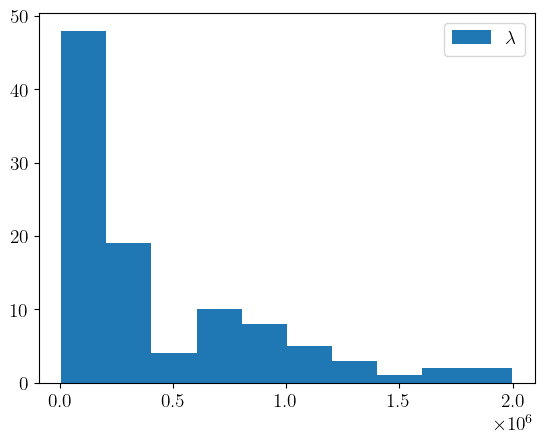

In [42]:
plt.hist(df['true_objective_func'], label='$\lambda$')
plt.legend()

In [43]:
param_names = list(PARAM_DICT.keys())
params = [param_name.split(':')[1] for param_name in param_names]
print(params)
print(len(params))

['aLund', 'bLund', 'aExtraSQuark', 'sigma', 'enhancedFraction', 'ProbStoUD', 'probQQtoQ', 'probSQtoQQ', 'alphaSvalue', 'pTmin']
10


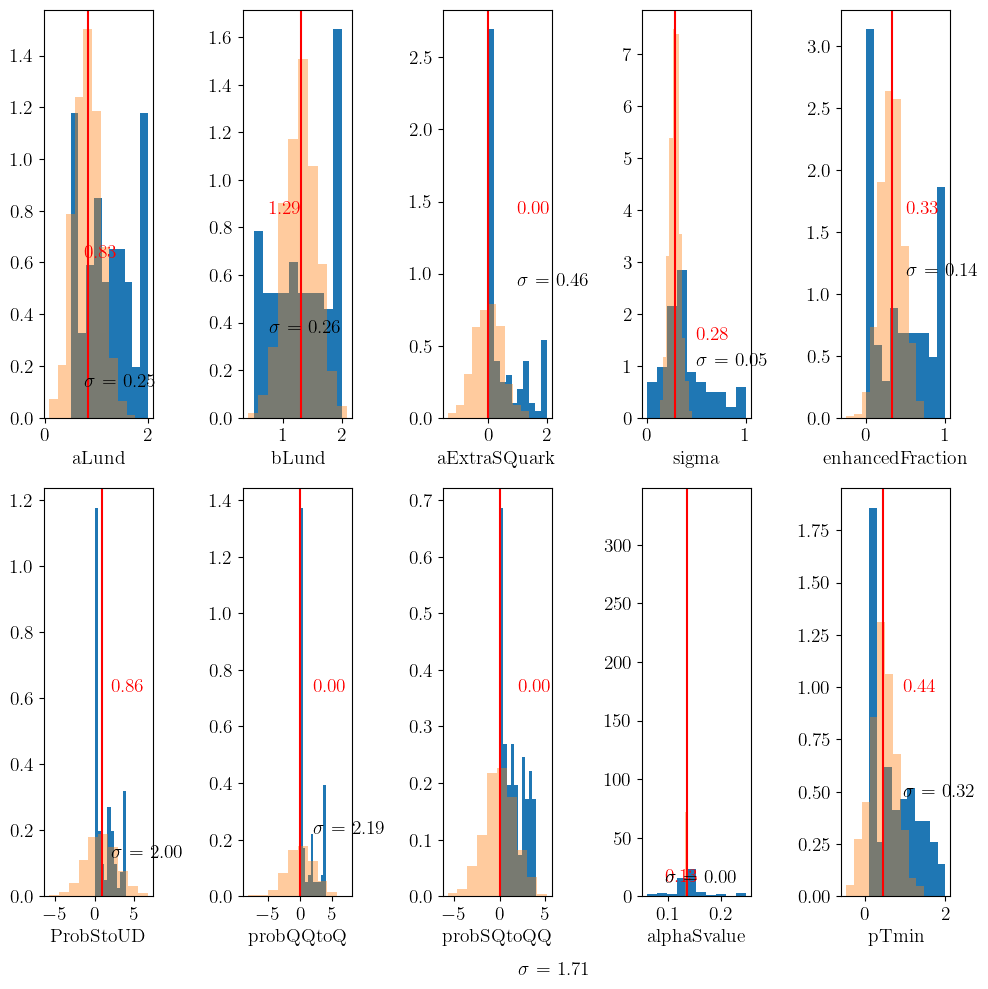

In [44]:
param_vals = [df[param] for param in params]
full_vals = np.stack(param_vals)
full_cov = np.cov(full_vals)

fig, ax = plt.subplots(2,5, figsize=(10,10))
ax = ax.ravel()
stds = np.diagonal(full_cov)
for i, param in enumerate(params):
    vals = df[param].values
    std2 = stds[i]
    ax[i].hist(vals, density=True)
    ax[i].set_xlabel(param)
    best_param = best_parameters_reduced[param]
    ax[i].axvline(x=best_param, color = 'r')
    x_pos = (vals.max() - vals.min())/2
    y_pos = (ax[i].get_ylim()[1] - ax[i].get_ylim()[0])/2
    ax[i].text(y=y_pos, x=x_pos, s=f'{best_param:.2f}', color='r')
    ax[i].text(y=y_pos - 0.5, x=x_pos, s=f'$\sigma$ = {std2:.2f}', color='k')
    gauss = np.random.normal(best_param, std2, size=1000)
    ax[i].hist(gauss, density=True, alpha=0.4)
plt.tight_layout()

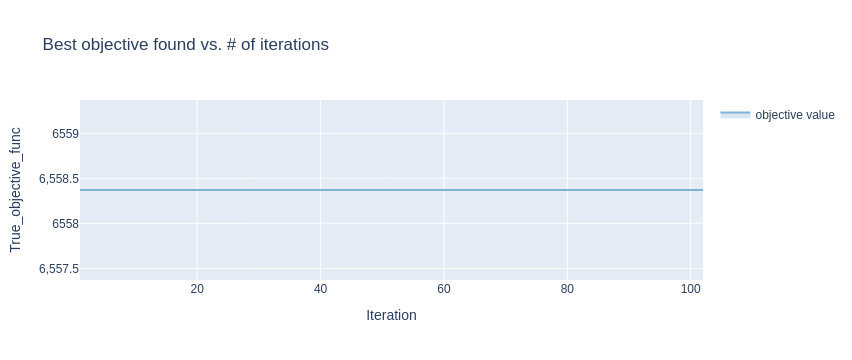

In [109]:
render(ax_client.get_optimization_trace())

[INFO 06-10 15:40:01] ax.service.ax_client: Retrieving contour plot with parameter 'aLund' on X-axis and 'bLund' on Y-axis, for metric 'true_objective_func'. Remaining parameters are affixed to the middle of their range.


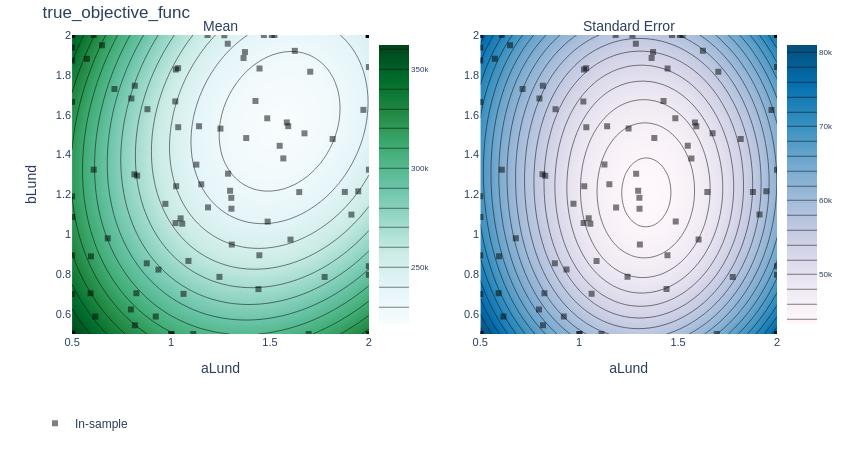

In [46]:
import plotly.graph_objects as go

# fig = go.Figure()
# fig.add_trace(
render(ax_client.get_contour_plot(param_x="aLund", param_y="bLund",))
# )


# fig.show()
# fig.write_image("images/Lund_a_b_countour.pdf")

in area where you have high uncertainty, the mean value function is not the same as the true_objective_func

In [171]:
ax_client.get_trial(74)

Trial(experiment_name='Ax_Tune_Pythia', index=74, status=TrialStatus.COMPLETED, arm=Arm(name='74_0', parameters={'aLund': 0.8288417360981628, 'bLund': 1.294260949803888, 'aExtraSQuark': 0.0, 'sigma': 0.28270433461198136, 'enhancedFraction': 0.3283577270883097, 'ProbStoUD': 0.8567285770760795, 'probQQtoQ': 0.0, 'probSQtoQQ': 0.0, 'alphaSvalue': 0.13466724312022288, 'pTmin': 0.4412077388227844}))

In [174]:
cost_func(**{'aLund': 0.8288417360981628, 'bLund': 1.294260949803888, 'aExtraSQuark': 0.0, 'sigma': 0.28270433461198136, 'enhancedFraction': 0.3283577270883097, 'ProbStoUD': 0.8567285770760795, 'probQQtoQ': 0.0, 'probSQtoQQ': 0.0, 'alphaSvalue': 0.13466724312022288, 'pTmin': 0.4412077388227844})

51495.13854112796

in an area of lower uncertainty in the mean, the mean is more like true_objective_func

In [187]:
ax_client.get_trial(18)

Trial(experiment_name='Ax_Tune_Pythia', index=18, status=TrialStatus.COMPLETED, arm=Arm(name='18_0', parameters={'aLund': 1.5851200097240508, 'bLund': 1.5611877385526896, 'aExtraSQuark': 0.41786912456154823, 'sigma': 0.7790100071579218, 'enhancedFraction': 0.04375256225466728, 'ProbStoUD': 2.042041890323162, 'probQQtoQ': 0.37497202679514885, 'probSQtoQQ': 0.1320575214922428, 'alphaSvalue': 0.11459038011729716, 'pTmin': 1.6784770833328366}))

In [189]:
cost_func(**{'aLund': 1.5851200097240508, 'bLund': 1.5611877385526896, 'aExtraSQuark': 0.41786912456154823, 'sigma': 0.7790100071579218, 'enhancedFraction': 0.04375256225466728, 'ProbStoUD': 2.042041890323162, 'probQQtoQ': 0.37497202679514885, 'probSQtoQQ': 0.1320575214922428, 'alphaSvalue': 0.11459038011729716, 'pTmin': 1.6784770833328366})

476424.5469757713

[INFO 06-10 15:40:18] ax.service.ax_client: Retrieving contour plot with parameter 'aLund' on X-axis and 'sigma' on Y-axis, for metric 'true_objective_func'. Remaining parameters are affixed to the middle of their range.


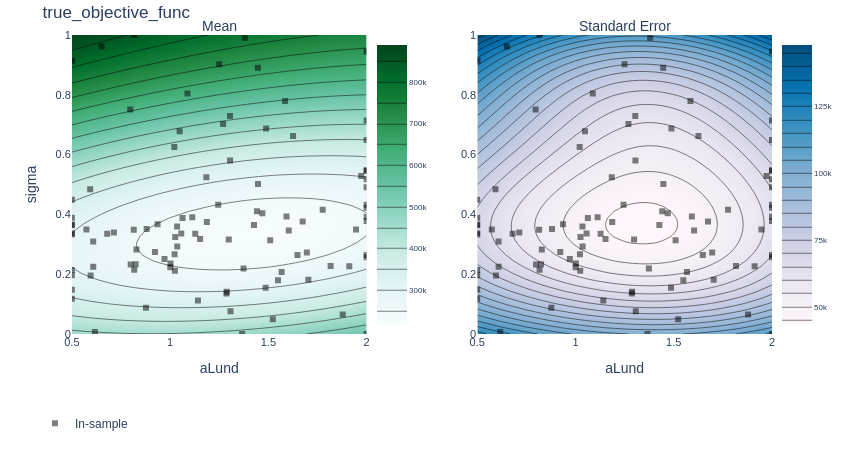

In [47]:
render(ax_client.get_contour_plot(param_x="aLund", param_y="sigma",))

[INFO 06-10 15:40:24] ax.service.ax_client: Retrieving contour plot with parameter 'aExtraSQuark' on X-axis and 'sigma' on Y-axis, for metric 'true_objective_func'. Remaining parameters are affixed to the middle of their range.


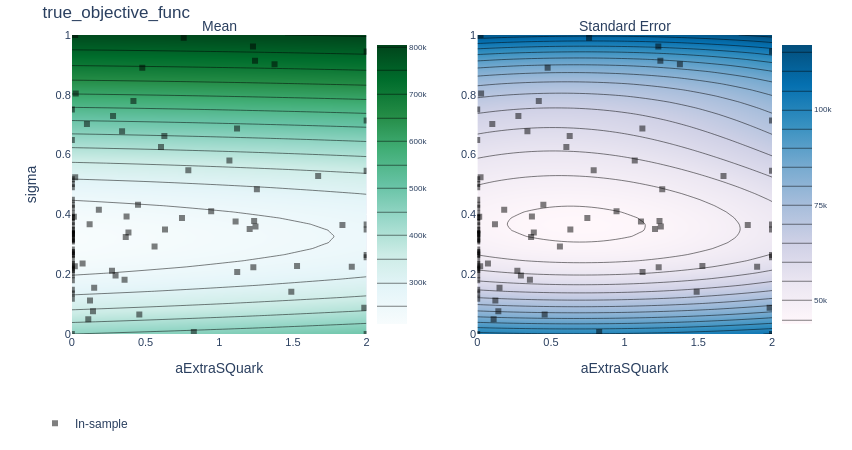

In [48]:
render(ax_client.get_contour_plot(param_x="aExtraSQuark", param_y="sigma",))

[INFO 06-10 15:40:28] ax.service.ax_client: Retrieving contour plot with parameter 'probQQtoQ' on X-axis and 'sigma' on Y-axis, for metric 'true_objective_func'. Remaining parameters are affixed to the middle of their range.


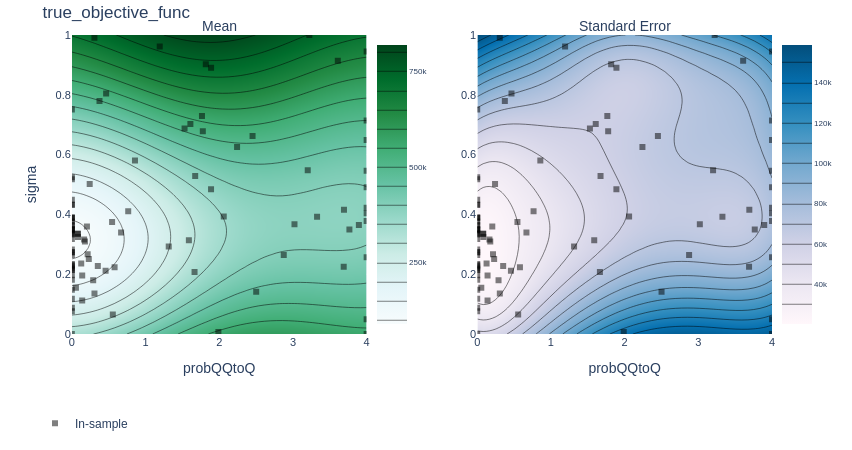

In [49]:
render(ax_client.get_contour_plot(param_x="probQQtoQ", param_y="sigma",))

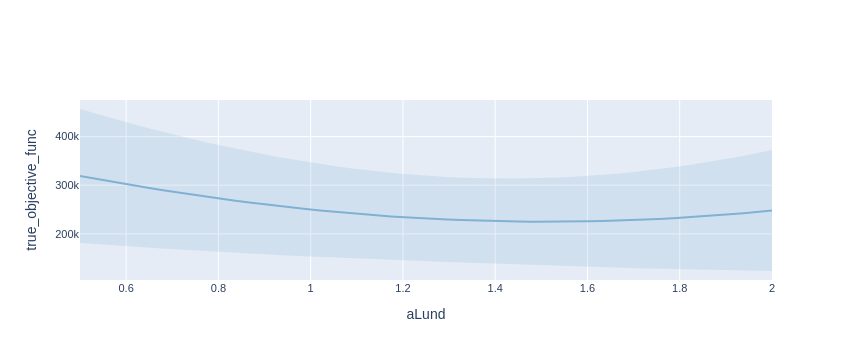

In [50]:
from ax.plot.slice import plot_slice

model = ax_client.generation_strategy.model
render(plot_slice(model, "aLund", "true_objective_func"))

In [195]:
model.model.botorch_acqf_class

botorch.acquisition.logei.qLogNoisyExpectedImprovement

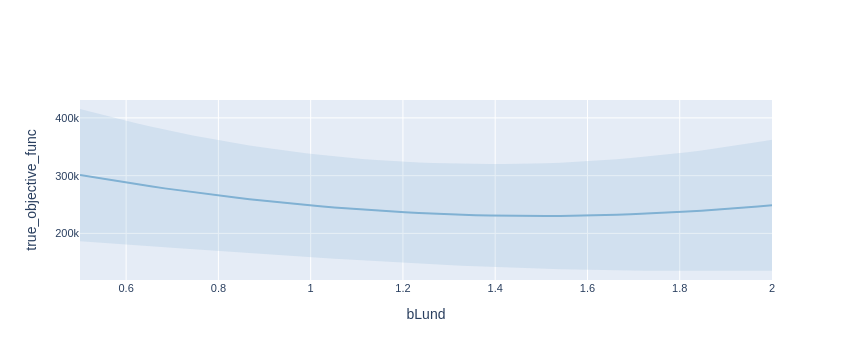

In [51]:
render(plot_slice(model, "bLund", "true_objective_func"))

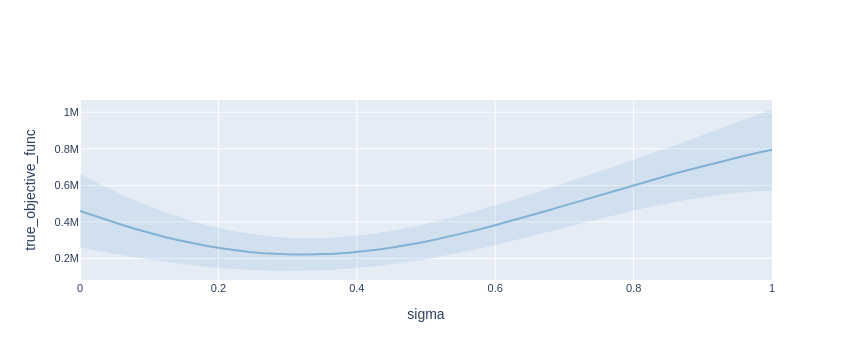

In [52]:
render(plot_slice(model, "sigma", "true_objective_func"))

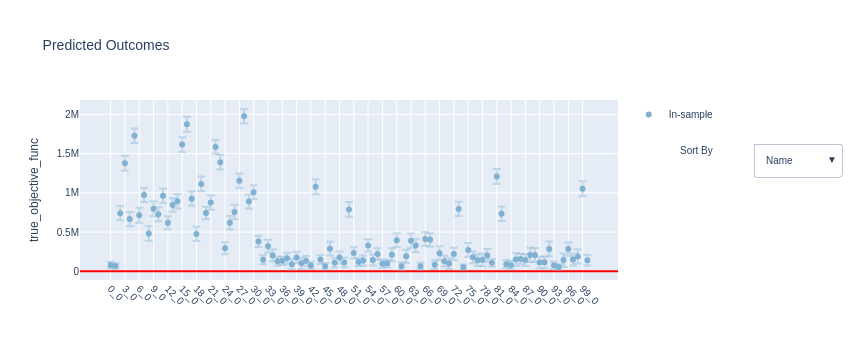

In [53]:
from ax.plot.scatter import plot_fitted
render(plot_fitted(model, metric="true_objective_func", rel=False))

In [54]:
ax_client.get_best_trial()

(101,
 {'aLund': 0.8288417360981628,
  'bLund': 1.294260949803888,
  'aExtraSQuark': 0.0,
  'sigma': 0.28270433461198136,
  'enhancedFraction': 0.3283577270883097,
  'ProbStoUD': 0.8567285770760795,
  'probQQtoQ': 0.0,
  'probSQtoQQ': 0.0,
  'alphaSvalue': 0.13466724312022288,
  'pTmin': 0.4412077388227844},
 ({'true_objective_func': 49053.80116245104},
  {'true_objective_func': {'true_objective_func': 347657588.190936}}))

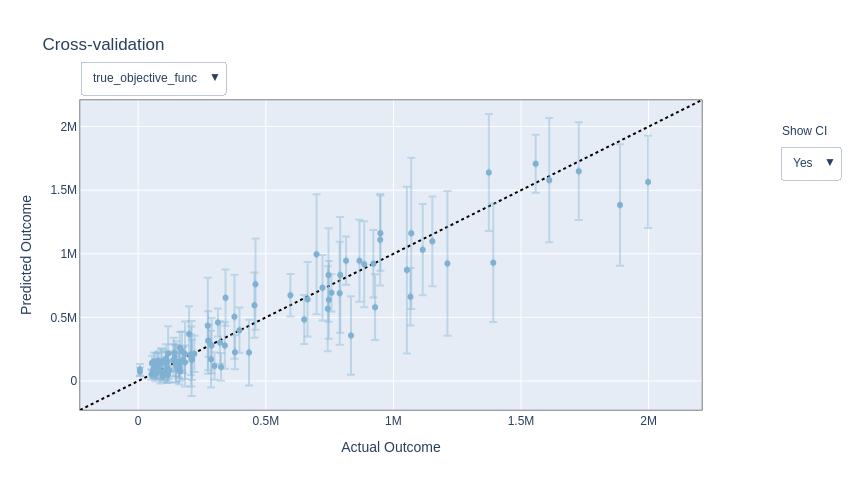

In [55]:
from ax.modelbridge.cross_validation import cross_validate
from ax.plot.diagnostic import interact_cross_validation

cv_results = cross_validate(model)
render(interact_cross_validation(cv_results))

----

## Validate the results

1. Make the pythia card with the best parameters based on the Bayesian Optimization above
2. Run the pythia card with 300,000 events yielding a test.yoda validation output
3. convert yoda histograms to pandas dataframes, filter histograms and plot result agreement with data

In [56]:
def make_pythia_valid_card(best_parameters):
    
    cards_dir = os.path.join(os.getcwd(), "BO_Cards")
    filename = f"ALEPH_1996_S3486095_BO_card_valid.cmnd"
    file_path = os.path.join(cards_dir, filename)
    with open(file_path,'w') as f:
        first_block="""Main:numberOfEvents = 250000          ! number of events to generate
Next:numberShowEvent = 0           ! suppress full listing of first events
# random seed
Random:setSeed = on
Random:seed= 0
! 2) Beam parameter settings.
Beams:idA = 11                ! first beam,  e- = 11
Beams:idB = -11                ! second beam, e+ = -11
Beams:eCM = 91.2               ! CM energy of collision
# Pythia 8 settings for LEP
# Hadronic decays including b quarks, with ISR photons switched off
WeakSingleBoson:ffbar2gmZ = on
23:onMode = off
23:onIfAny = 1 2 3 4 5
PDF:lepton = off
SpaceShower:QEDshowerByL = off\n\n"""
        f.write(first_block)
        # f.write(f"Random:seed={indx+1}")

        f.write("StringZ:aLund = {}\n\n".format(best_parameters["aLund"]))
        f.write("StringZ:bLund = {}\n\n".format(best_parameters["bLund"]))
        # f.write("StringZ:rFactC = {}\n\n".format(best_parameters["rFactC"]))
        # f.write("StringZ:rFactB = {}\n\n".format(best_parameters["rFactB"]))
        f.write("StringZ:aExtraSQuark = {}\n\n".format(best_parameters["aExtraSQuark"]))
        # f.write("StringZ:aExtraDiquark = {}\n\n".format(best_parameters["aExtraDiquark"]))
        f.write("StringPT:sigma = {}\n\n".format(best_parameters["sigma"]))
        f.write("StringPT:enhancedFraction = {}\n\n".format(best_parameters["enhancedFraction"]))
        # f.write("StringPT:enhancedWidth = {}\n\n".format(best_parameters["enhancedWidth"]))
        f.write("StringFlav:ProbStoUD = {}\n\n".format(best_parameters["ProbStoUD"]))
        f.write("StringFlav:probQQtoQ = {}\n\n".format(best_parameters["probQQtoQ"]))
        f.write("StringFlav:probSQtoQQ = {}\n\n".format(best_parameters["probSQtoQQ"]))
        # f.write("StringFlav:ProbQQ1toQQ0 = {}\n\n".format(best_parameters["ProbQQ1toQQ0"]))
        f.write("TimeShower:alphaSvalue = {}\n\n".format(best_parameters["alphaSvalue"]))
        f.write("TimeShower:pTmin = {}\n\n".format(best_parameters["pTmin"]))
def run_valid_card(best_parameters):
    
    # step 1: write .cmnd file 
    make_pythia_valid_card(best_parameters)
    #step 2 run main42 and rivet
    os.system("""./main42 BO_Cards/ALEPH_1996_S3486095_BO_card_valid.cmnd /media/ali/DATA/TEMP/ALEPH_1996_S3486095_card_valid.fifo
    rivet -o ALEPH_1996_S3486095_hist_valid_0.yoda -a ALEPH_1996_S3486095 /media/ali/DATA/TEMP/ALEPH_1996_S3486095_card_valid.fifo

    rm /media/ali/DATA/TEMP/ALEPH_1996_S3486095_card_valid.fifo
    mv ALEPH_1996_S3486095_hist_valid_0.yoda ALEPH_YODAS_BayesOpt/""")

In [57]:
run_valid_card(best_parameters_reduced)


 >>> PYTHIA settings will be read from file BO_Cards/ALEPH_1996_S3486095_BO_card_valid.cmnd <<< 
 >>> HepMC events will be written to file /media/ali/DATA/TEMP/ALEPH_1996_S3486095_card_valid.fifo <<< 


 *------------------------------------------------------------------------------------* 
 |                                                                                    | 
 |  *------------------------------------------------------------------------------*  | 
 |  |                                                                              |  | 
 |  |                                                                              |  | 
 |  |   PPP   Y   Y  TTTTT  H   H  III    A      Welcome to the Lund Monte Carlo!  |  | 
 |  |   P  P   Y Y     T    H   H   I    A A     This is PYTHIA version 8.309      |  | 
 |  |   PPP     Y      T    HHHHH   I   AAAAA    Last date of change: 16 Feb 2023  |  | 
 |  |   P       Y      T    H   H   I   A   A                                      |

Rivet 3.1.9 running on machine ba99a65a1f23 (x86_64) at 2024-06-10 15:45:17
Reading events from '/media/ali/DATA/TEMP/ALEPH_1996_S3486095_card_valid.fifo'
Event 100 (0:00:01 elapsed)
Event 200 (0:00:01 elapsed)
Event 300 (0:00:01 elapsed)
Event 400 (0:00:01 elapsed)
Event 500 (0:00:02 elapsed)
Event 600 (0:00:02 elapsed)
Event 700 (0:00:02 elapsed)
Event 800 (0:00:02 elapsed)
Event 900 (0:00:02 elapsed)
Event 1000 (0:00:02 elapsed)
Event 1100 (0:00:02 elapsed)
Event 1200 (0:00:02 elapsed)
Event 1300 (0:00:02 elapsed)
Event 1400 (0:00:02 elapsed)
Event 1500 (0:00:03 elapsed)
Event 1600 (0:00:03 elapsed)
Event 1700 (0:00:04 elapsed)
Event 1800 (0:00:04 elapsed)
Event 1900 (0:00:05 elapsed)
Event 2000 (0:00:05 elapsed)
Event 2100 (0:00:05 elapsed)
Event 2200 (0:00:06 elapsed)
Event 2300 (0:00:06 elapsed)
Event 2400 (0:00:06 elapsed)
Event 2500 (0:00:06 elapsed)
Event 2600 (0:00:06 elapsed)
Event 2700 (0:00:06 elapsed)
Event 2800 (0:00:06 elapsed)
Event 2900 (0:00:06 elapsed)
Event 3000 (0





Rivet.AnalysisHandler: INFO  Using named weights


In [58]:
importlib.reload(yoda2numpy_BayesOpt)
from yoda2numpy_BayesOpt import Yoda2Numpy

def get_valid_data():
    # tracemalloc.start()
    yoda2numpy = Yoda2Numpy()
    files = list(glob('ALEPH_YODAS_BayesOpt/*.yoda'))
    M = len(files)
    # M = 
    generated_indices = []
    for file in files[:M]:
        index = file.split('_')[-1].split('.')[0]
        generated_indices.append(int(index))    
    generated_indices.sort()
    print(generated_indices)
    # # --- SIM
    print(f'looping over {M:d} sim yoda files...\n')
    # dfsims = []
    dfsims_valid = {}
    for ii in tqdm(generated_indices):    
        # index here should match the index of the file
        # dfsims.append( yoda2numpy.todf( yoda2numpy('sim', index=ii) ) )
        dfsims_valid[ii]= yoda2numpy.todf( yoda2numpy('val', index=ii) ) 

    # # --- NEW
    # print(f'looping over {M:d} new yoda files...\n')
    # # dfnews = []
    # # for ii in tqdm(range(M)):
    # #     dfnews.append( yoda2numpy.todf( yoda2numpy('new', index=ii) ) )

    print()
    # key = '/ALEPH_1996_S3486095/d01-x01-y01'
    # dfsim = dfsims[0][key]
    
    dfdata = yoda2numpy.todf( yoda2numpy('dat') )
    
    return dfdata, dfsims_valid, generated_indices

In [59]:
dfdata, dfsims_valid, generated_indices = get_valid_data()

[0]
looping over 1 sim yoda files...



100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 11.62it/s]

using filename ALEPH_YODAS_BayesOpt/ALEPH_1996_S3486095_hist_valid_0.yoda

using filename ALEPH_YODAS_BayesOpt/data/ALEPH_1996_S3486095.yoda


In [60]:
print(generated_indices)
# print(dfsims)
print('DATA DATAFRAME')
print(dfdata['/REF/ALEPH_1996_S3486095/d01-x01-y01'].head())
print('FIRST SIM-VALID DATAFRAME')
print(dfsims_valid[generated_indices[0]]['/ALEPH_1996_S3486095/d01-x01-y01'].head())

[0]
DATA DATAFRAME
     xval   xerr-   xerr+       yval     yerr-     yerr+
0  0.0025  0.0025  0.0025  12.360000  0.407922  0.407922
1  0.0075  0.0025  0.0025  23.330000  0.254951  0.254951
2  0.0125  0.0025  0.0025  20.230000  0.156205  0.156205
3  0.0175  0.0025  0.0025  16.690001  0.120416  0.120416
4  0.0225  0.0025  0.0025  13.410000  0.100000  0.100000
FIRST SIM-VALID DATAFRAME
    xlow  xhigh       sumw     sumw2     sumwx    sumwx2  numEntries
0  0.000  0.005  11.871200  0.009497  0.040644  0.030535     14839.0
1  0.005  0.010  23.425600  0.018740  0.175619  0.272828     29282.0
2  0.010  0.015  20.964001  0.016771  0.260435  0.655825     26205.0
3  0.015  0.020  17.022400  0.013618  0.296509  1.040052     21278.0
4  0.020  0.025  13.756800  0.011005  0.308179  1.386446     17196.0


In [61]:
data_keys, mc_keys = get_hist_names(dfdata)
filtered_data_keys, filtered_mc_keys = filter_keys(dfdata, dfsims_valid, data_keys, mc_keys)

 new data keys ['/REF/ALEPH_1996_S3486095/d01-x01-y01', '/REF/ALEPH_1996_S3486095/d02-x01-y01', '/REF/ALEPH_1996_S3486095/d03-x01-y01', '/REF/ALEPH_1996_S3486095/d04-x01-y01', '/REF/ALEPH_1996_S3486095/d05-x01-y01', '/REF/ALEPH_1996_S3486095/d06-x01-y01', '/REF/ALEPH_1996_S3486095/d07-x01-y01', '/REF/ALEPH_1996_S3486095/d08-x01-y01', '/REF/ALEPH_1996_S3486095/d09-x01-y01', '/REF/ALEPH_1996_S3486095/d10-x01-y01', '/REF/ALEPH_1996_S3486095/d11-x01-y01', '/REF/ALEPH_1996_S3486095/d12-x01-y01', '/REF/ALEPH_1996_S3486095/d17-x01-y01', '/REF/ALEPH_1996_S3486095/d18-x01-y01', '/REF/ALEPH_1996_S3486095/d25-x01-y01', '/REF/ALEPH_1996_S3486095/d26-x01-y01', '/REF/ALEPH_1996_S3486095/d27-x01-y01', '/REF/ALEPH_1996_S3486095/d28-x01-y01', '/REF/ALEPH_1996_S3486095/d29-x01-y01', '/REF/ALEPH_1996_S3486095/d30-x01-y01', '/REF/ALEPH_1996_S3486095/d31-x01-y01', '/REF/ALEPH_1996_S3486095/d32-x01-y01', '/REF/ALEPH_1996_S3486095/d33-x01-y01', '/REF/ALEPH_1996_S3486095/d34-x01-y01', '/REF/ALEPH_1996_S348609

In [62]:
reduced_data_keys, reduced_mc_keys = reduce_filtered_keys(filtered_data_keys, filtered_mc_keys)
print(reduced_data_keys, reduced_mc_keys)
print(f'length of reduced data keys = {len(reduced_data_keys)}')
print(f'length of reduced mc keys = {len(reduced_mc_keys)}')

['/REF/ALEPH_1996_S3486095/d01-x01-y01', '/REF/ALEPH_1996_S3486095/d02-x01-y01', '/REF/ALEPH_1996_S3486095/d03-x01-y01', '/REF/ALEPH_1996_S3486095/d04-x01-y01', '/REF/ALEPH_1996_S3486095/d05-x01-y01', '/REF/ALEPH_1996_S3486095/d06-x01-y01', '/REF/ALEPH_1996_S3486095/d07-x01-y01', '/REF/ALEPH_1996_S3486095/d08-x01-y01', '/REF/ALEPH_1996_S3486095/d09-x01-y01', '/REF/ALEPH_1996_S3486095/d10-x01-y01', '/REF/ALEPH_1996_S3486095/d11-x01-y01', '/REF/ALEPH_1996_S3486095/d12-x01-y01', '/REF/ALEPH_1996_S3486095/d17-x01-y01', '/REF/ALEPH_1996_S3486095/d18-x01-y01', '/REF/ALEPH_1996_S3486095/d25-x01-y01', '/REF/ALEPH_1996_S3486095/d26-x01-y01', '/REF/ALEPH_1996_S3486095/d27-x01-y01', '/REF/ALEPH_1996_S3486095/d28-x01-y01', '/REF/ALEPH_1996_S3486095/d29-x01-y01', '/REF/ALEPH_1996_S3486095/d30-x01-y01', '/REF/ALEPH_1996_S3486095/d31-x01-y01', '/REF/ALEPH_1996_S3486095/d32-x01-y01', '/REF/ALEPH_1996_S3486095/d33-x01-y01', '/REF/ALEPH_1996_S3486095/d34-x01-y01', '/REF/ALEPH_1996_S3486095/d37-x01-y01',

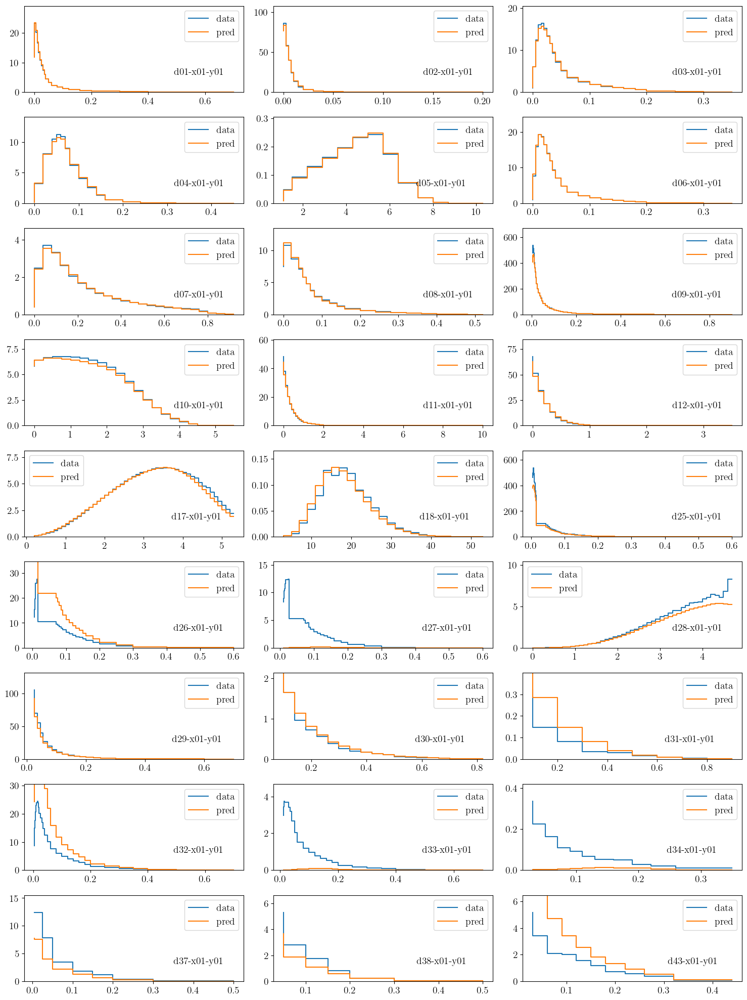

In [63]:
importlib.reload(pythia_SBI_utils)
from pythia_SBI_utils import * 

hists = make_hists(dfdata, dfsims_valid[0], reduced_data_keys, reduced_mc_keys)

plot_dist(reduced_data_keys, hists, filename=f'images/Ax_BayesianOpt_Valid_Best_fit_hists_reduced_params_{N_ITER}_iter_RBF_kernel.pdf')

In [80]:
def plot_model_chi2_vs_param(param, reference_dict, ax):
    PARAM_DICT_small = {key.split(':')[1] : val for key,val in PARAM_DICT.items()}
    # param = 'aLund'
    N_points = 1000
    # reference_dict = MONASH_DICT
    param_linspace =  np.linspace(PARAM_DICT_small[param][0], PARAM_DICT_small[param][1], N_points)
    param_observation_dicts = []
    for val in param_linspace:
        new_dict = reference_dict.copy()
        new_dict[param] = val
        param_observation_dicts.append(new_dict)
    
    means_a, covs_a = model.predict([
            ObservationFeatures(parameters=pointi) for pointi in param_observation_dicts
        ]
    )

    chi2_means = np.array(list(means_a.values())[0])
    chi2_covs = np.sqrt(np.array(covs_a['true_objective_func']['true_objective_func']))
    
    ax.plot(param_linspace, chi2_means, c='k', linewidth=3)

    ax.set_ylim(0, chi2_means.max())
    ypos = (ax.get_ylim()[1] -ax.get_ylim()[0])/2
    xpos = best_parameters_reduced[param] + 0.05
    ax.text(x= xpos, y=ypos, s= '{:.3f}'.format(best_parameters_reduced[param]), color='r')
    ax.fill_between(x=param_linspace, y1=chi2_means-chi2_covs,y2=chi2_means+chi2_covs, alpha=0.3, color='b')
    ax.set_xlabel(param, fontsize=22)
    ax.set_ylabel('GP $\lambda$', fontsize=22)
    ax.scatter(df[param], df['true_objective_func'], color='green')
    ax.axvline(x=best_parameters_reduced[param], color='r')

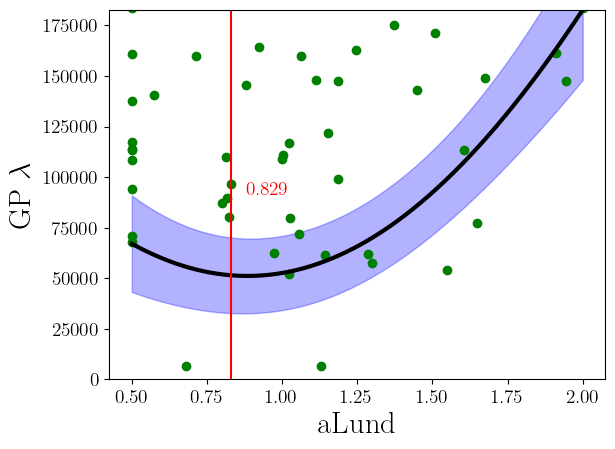

In [81]:
fig, ax = plt.subplots(1,1)
plot_model_chi2_vs_param(param='aLund', reference_dict=best_parameters_reduced, ax=ax)

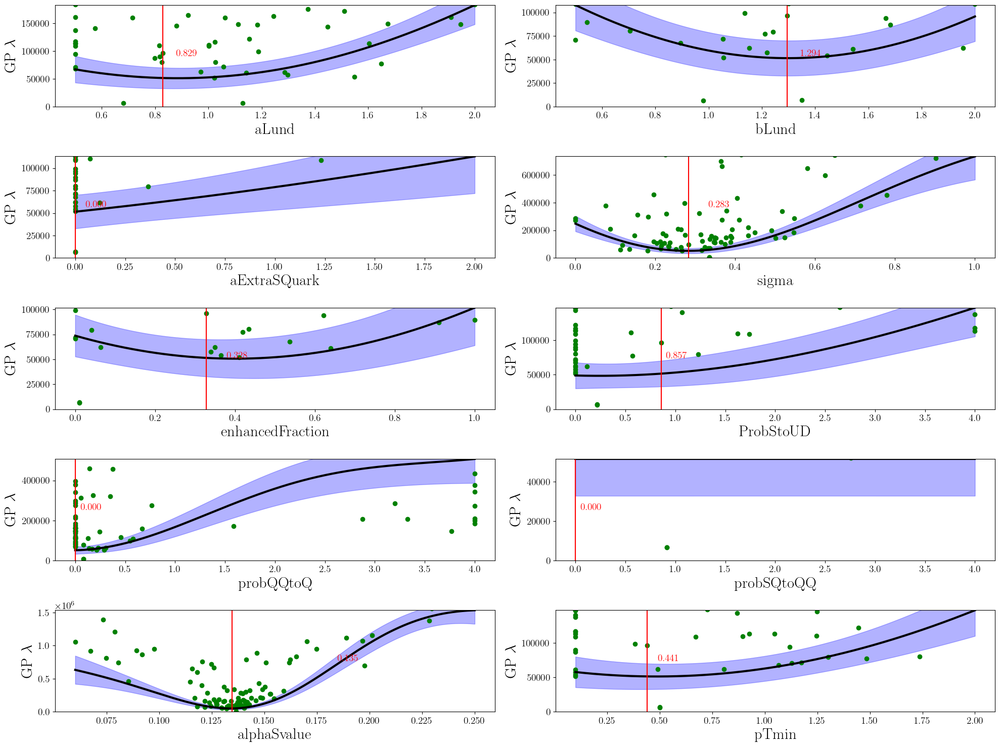

In [83]:
fig, ax = plt.subplots(5, 2, figsize=(20,15))
ax = ax.ravel()
for i, axi in enumerate(ax):
    params = list(REDUCED_MONASH_DICT.keys())
    plot_model_chi2_vs_param(param=params[i], reference_dict=best_parameters_reduced, ax=axi)

plt.tight_layout()
# plt.savefig(f'images/GP_lambda_vs_param_all_params.pdf')

# Get profile likelihood of each parameter with Minuit, and the total covariance matrix

In [84]:
import iminuit
from iminuit import Minuit

In [85]:
def cost_func(aLund, 
             bLund,
            aExtraSQuark,
            sigma,
            enhancedFraction,
            ProbStoUD,
            probQQtoQ,
            probSQtoQQ,
            alphaSvalue,
            pTmin):
    
    params_dict = {
    "aLund" : aLund, 
    "bLund" : bLund,
    "aExtraSQuark": aExtraSQuark,
    "sigma":sigma,
    "enhancedFraction":enhancedFraction,
    "ProbStoUD":ProbStoUD,
    "probQQtoQ":probQQtoQ,
    "probSQtoQQ":probSQtoQQ,
    "alphaSvalue": alphaSvalue,
    "pTmin": pTmin
    }
    means, covs = model.predict([
            ObservationFeatures(parameters=params_dict)
        ]
    )
    return means['true_objective_func'][0]

In [164]:
# mean value func at BO point
cost_func(**best_parameters_reduced)

51495.13854112796

In [87]:
limits = list(PARAM_DICT.values())

In [88]:
m = Minuit(cost_func, **best_parameters_reduced)
m.limits = limits

In [89]:
m.migrad(ncall=500000)

┌─────────────────────────────────────────────────────────────────────────┐
│                                Migrad                                   │
├──────────────────────────────────┬──────────────────────────────────────┤
│ FCN = 3.8e+04                    │              Nfcn = 312              │
│ EDM = 0.000195 (Goal: 0.0002)    │            time = 0.5 sec            │
├──────────────────────────────────┼──────────────────────────────────────┤
│          Valid Minimum           │   Below EDM threshold (goal x 10)    │
├──────────────────────────────────┼──────────────────────────────────────┤
│     SOME parameters at limit     │           Below call limit           │
├──────────────────────────────────┼──────────────────────────────────────┤
│             Hesse ok             │         Covariance accurate          │
└──────────────────────────────────┴──────────────────────────────────────┘
┌───┬──────────────────┬───────────┬───────────┬────────────┬────────────┬─────────┬─────────┬───────┐
│   │ Name             │   Value   │ Hesse Err │ Minos Err- │ Minos Err+ │ Limit-  │ Limit+  │ Fixed │
├───┼──────────────────┼───────────┼───────────┼────────────┼────────────┼─────────┼─────────┼───────┤
│ 0 │ aLund            │  0.9260   │  0.0035   │            │            │   0.5   │    2    │       │
│ 1 │ bLund            │   1.125   │   0.004   │            │            │   0.5   │    2    │       │
│ 2 │ aExtraSQuark     │     0     │  0.04e-3  │            │            │    0    │    2    │       │
│ 3 │ sigma            │ 246.8e-3  │  0.7e-3   │            │            │    0    │    1    │       │
│ 4 │ enhancedFraction │  0.4848   │  0.0033   │            │            │    0    │    1    │       │
│ 5 │ ProbStoUD        │     0     │  0.07e-3  │            │            │    0    │    4    │       │
│ 6 │ probQQtoQ        │  0.0862   │  0.0031   │            │            │    0    │    4    │       │
│ 7 │ probSQtoQQ       │     0     │     4     │            │            │    0    │    4    │       │
│ 8 │ alphaSvalue      │ 131.83e-3 │  0.07e-3  │            │            │  0.06   │  0.25   │       │
│ 9 │ pTmin            │   0.587   │   0.005   │            │            │   0.1   │    2    │       │
└───┴──────────────────┴───────────┴───────────┴────────────┴────────────┴─────────┴─────────┴───────┘
┌──────────────────┬───────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────┐
│                  │            aLund            bLund     aExtraSQuark            sigma enhancedFraction        ProbStoUD        probQQtoQ       probSQtoQQ      alphaSvalue            pTmin │
├──────────────────┼───────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────┤
│            aLund │         1.21e-05         0.004e-3        131.8e-15           0.7e-6        -0.002e-3      -341.06e-15             3e-6                0            82e-9               -0 │
│            bLund │         0.004e-3         1.44e-05       -245.5e-15               -0         0.001e-3       109.12e-15             3e-6               -0            87e-9        -0.007e-3 │
│     aExtraSQuark │        131.8e-15       -245.5e-15         3.65e-16         47.1e-15        -87.5e-15                0         83.0e-15                0         -2.9e-15        345.8e-15 │
│            sigma │           0.7e-6               -0         47.1e-15         5.24e-07          -1.4e-6       -35.87e-15           0.2e-6                0            16e-9           0.4e-6 │
│ enhancedFraction │        -0.002e-3         0.001e-3        -87.5e-15          -1.4e-6         1.06e-05       158.13e-15            -1e-6               -0           -48e-9        -0.003e-3 │
│        ProbStoUD │      -341.06e-15       109.12e-15                0       -35.87e-15       158.13e

In [90]:
best_parameters_reduced

{'aLund': 0.8288417360981628,
 'bLund': 1.294260949803888,
 'aExtraSQuark': 0.0,
 'sigma': 0.28270433461198136,
 'enhancedFraction': 0.3283577270883097,
 'ProbStoUD': 0.8567285770760795,
 'probQQtoQ': 0.0,
 'probSQtoQQ': 0.0,
 'alphaSvalue': 0.13466724312022288,
 'pTmin': 0.4412077388227844}

In [91]:
m.minos()

┌─────────────────────────────────────────────────────────────────────────┐
│                                Migrad                                   │
├──────────────────────────────────┬──────────────────────────────────────┤
│ FCN = 3.8e+04                    │             Nfcn = 2915              │
│ EDM = 0.000195 (Goal: 0.0002)    │            time = 2.7 sec            │
├──────────────────────────────────┼──────────────────────────────────────┤
│          Valid Minimum           │   Below EDM threshold (goal x 10)    │
├──────────────────────────────────┼──────────────────────────────────────┤
│     SOME parameters at limit     │           Below call limit           │
├──────────────────────────────────┼──────────────────────────────────────┤
│             Hesse ok             │         Covariance accurate          │
└──────────────────────────────────┴──────────────────────────────────────┘
┌───┬──────────────────┬───────────┬───────────┬────────────┬────────────┬─────────┬─────────┬───────┐
│   │ Name             │   Value   │ Hesse Err │ Minos Err- │ Minos Err+ │ Limit-  │ Limit+  │ Fixed │
├───┼──────────────────┼───────────┼───────────┼────────────┼────────────┼─────────┼─────────┼───────┤
│ 0 │ aLund            │  0.9260   │  0.0035   │  -0.0034   │   0.0035   │   0.5   │    2    │       │
│ 1 │ bLund            │   1.125   │   0.004   │   -0.004   │   0.004    │   0.5   │    2    │       │
│ 2 │ aExtraSQuark     │  2.2e-12  │42006115.7e-12│  -2.2e-12  │40032186.9e-12│    0    │    2    │       │
│ 3 │ sigma            │ 246.8e-3  │  0.7e-3   │  -0.8e-3   │   0.9e-3   │    0    │    1    │       │
│ 4 │ enhancedFraction │  0.4848   │  0.0033   │  -0.0034   │   0.0033   │    0    │    1    │       │
│ 5 │ ProbStoUD        │ 0.13e-12  │69497349.19e-12│ -0.13e-12  │69485162.10e-12│    0    │    4    │       │
│ 6 │ probQQtoQ        │  0.0862   │  0.0031   │  -0.0031   │   0.0031   │    0    │    4    │       │
│ 7 │ probSQtoQQ       │   5e-12   │3951601906882e-12│   -5e-12   │3658679941268e-12│    0    │    4    │       │
│ 8 │ alphaSvalue      │ 131.83e-3 │  0.07e-3  │  -0.07e-3  │  0.07e-3   │  0.06   │  0.25   │       │
│ 9 │ pTmin            │   0.587   │   0.005   │   -0.006   │   0.006    │   0.1   │    2    │       │
└───┴──────────────────┴───────────┴───────────┴────────────┴────────────┴─────────┴─────────┴───────┘
┌──────────┬───────────────────────┬───────────────────────┬───────────────────────┬───────────────────────┬───────────────────────┬───────────────────────┬───────────────────────┬───────────────────────┬───────────────────────┬───────────────────────┐
│          │         aLund         │         bLund         │     aExtraSQuark      │         sigma         │   enhancedFraction    │       ProbStoUD       │       probQQtoQ       │      probSQtoQQ       │      alphaSvalue      │         pTmin         │
├──────────┼───────────┬───────────┼───────────┬───────────┼───────────┬───────────┼───────────┬───────────┼───────────┬───────────┼───────────┬───────────┼───────────┬───────────┼───────────┬───────────┼───────────┬───────────┼───────────┬───────────┤
│  Error   │  -0.0034  │  0.0035   │  -0.004   │   0.004   │ -2.2e-12  │40032186.9e-12│  -0.8e-3  │  0.9e-3   │  -0.0034  │  0.0033   │ -0.13e-12 │69485162.10e-12│  -0.0031  │  0.0031   │  -5e-12   │3658679941268e-12│ -0.07e-3  │  0.07e-3  │  -0.006   │   0.006   │
│  Valid   │   True    │   True    │   True    │   True    │   True    │   True    │   True    │   True    │   True    │   True    │   True    │   True    │   True    │   True    │   True    │   True    │   True    │   True    │   True    │   True    │
│ At Limit │   False   │   False   │   False   │   False   │   True    │   False   │   False   │   False   │   False   │   False   │   True    │   False   │   False   │   False   │   True    │   False   │   False   │   False   │   False   │   False   │
│ Max FCN  │   False   │   False   │   False   │   False   │   False   │   False   │   False

In [260]:
cost_func_at_BO = cost_func(**best_parameters_reduced)
print(f'cost function at BO point = {cost_func_at_BO}')
scale_vals = [1.05,1.1]
for scale in scale_vals:
    scaled_point_BO = {}
    for key, val in best_parameters_reduced.items():
        scaled_point_BO[key] = val * scale
    print()
    print(f'cost function at BO point scaled by {scale} = {cost_func(**scaled_point_BO)}')


cost function at BO point = 5184.530222962749

cost function at BO point scaled by 1.05 = 17634.119297232246

cost function at BO point scaled by 1.1 = 50598.71060815499


In [261]:
minos_points = m.values.to_dict()
minos_points

{'aLund': 0.5778117622792757,
 'bLund': 0.9600374450150893,
 'aExtraSQuark': 0.537231133686081,
 'sigma': 0.3199225654263836,
 'enhancedFraction': 0.03614626382569172,
 'ProbStoUD': 0.23304917378354353,
 'probQQtoQ': 0.09676983002509686,
 'probSQtoQQ': 1.5935087782247985,
 'alphaSvalue': 0.13622136230557338,
 'pTmin': 0.43017166568309007}

In [262]:
cost_func_at_minuit = cost_func(**minos_points)
print(f'cost function at Minuit point = {cost_func_at_minuit}')
scale_vals = [1.05,1.1]
for scale in scale_vals:
    scaled_point_minuit = {}
    for key, val in minos_points.items():
        scaled_point_minuit[key] = val * scale
    print()
    print(f'cost function at Minuit point scaled by {scale} = {cost_func(**scaled_point_minuit)}')


cost function at Minuit point = 4532.204663255259

cost function at Minuit point scaled by 1.05 = 18386.942152152253

cost function at Minuit point scaled by 1.1 = 54476.715480456645


Minos is deeper minimum than BO

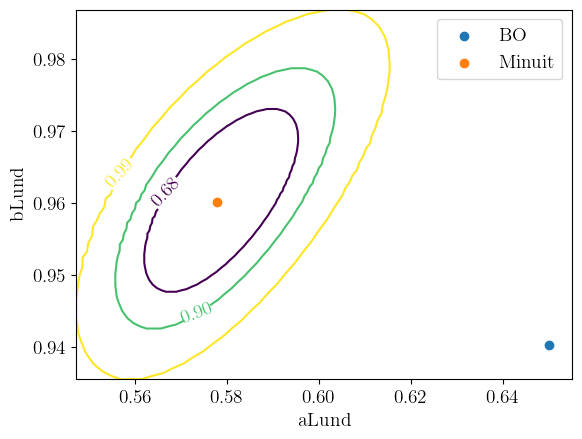

In [264]:
m.draw_mncontour('aLund','bLund', cl=(0.68, 0.9, 0.99))
plt.scatter(best_parameters_reduced['aLund'], best_parameters_reduced['bLund'], label='BO')
plt.scatter(m.values['aLund'], m.values['bLund'], label='Minuit')
plt.legend()

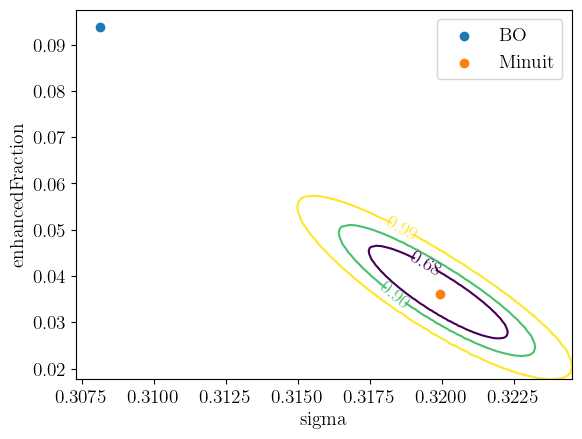

In [227]:
m.draw_mncontour('sigma','enhancedFraction', cl=(0.68, 0.9, 0.99))
plt.scatter(best_parameters_reduced['sigma'], best_parameters_reduced['enhancedFraction'], label='BO')
plt.scatter(m.values['sigma'], m.values['enhancedFraction'], label='Minuit')
plt.legend()

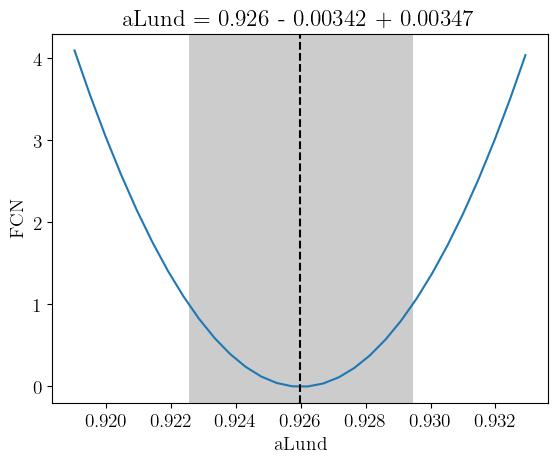

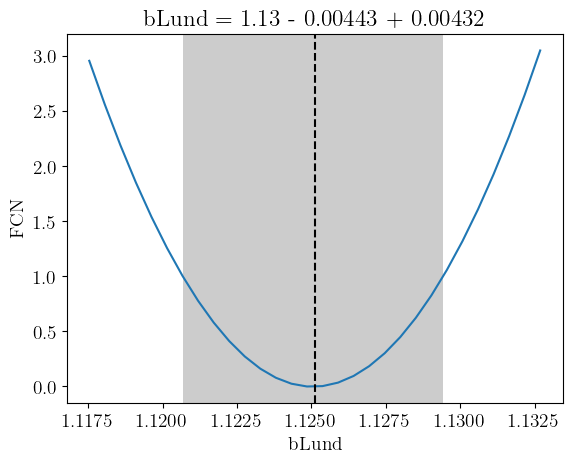

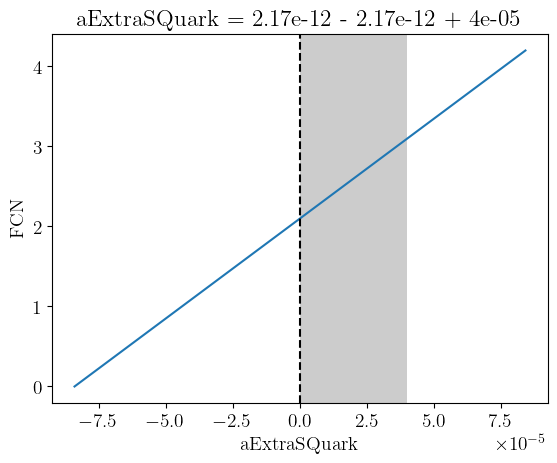

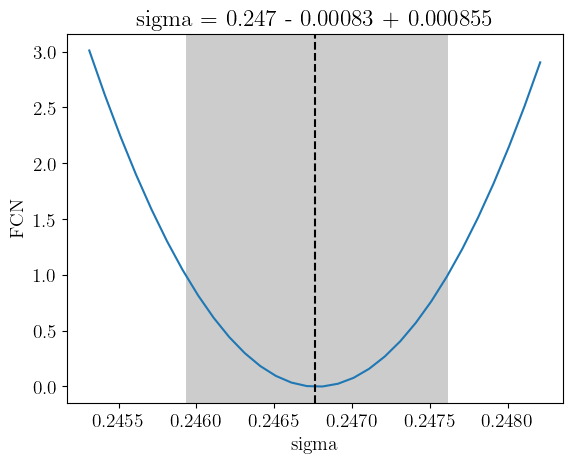

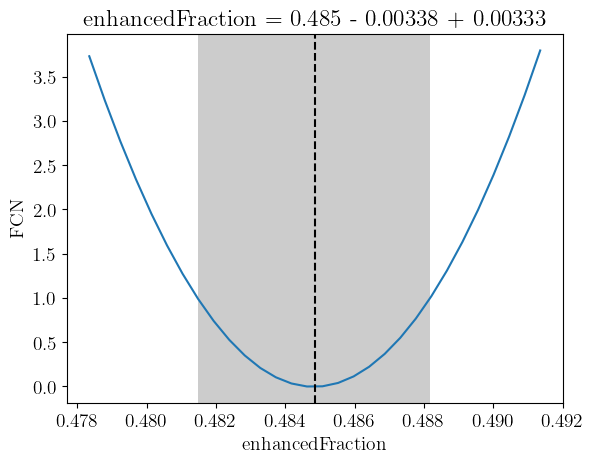

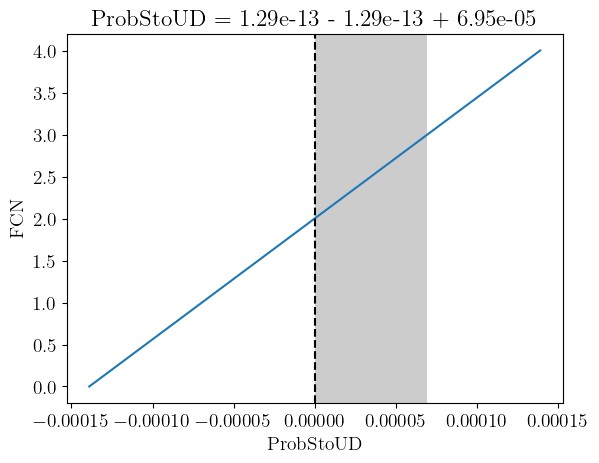

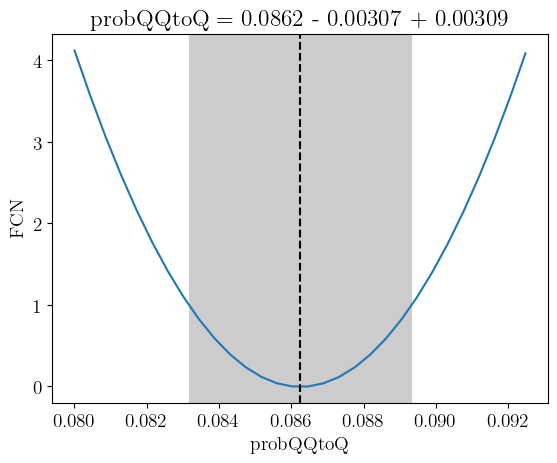

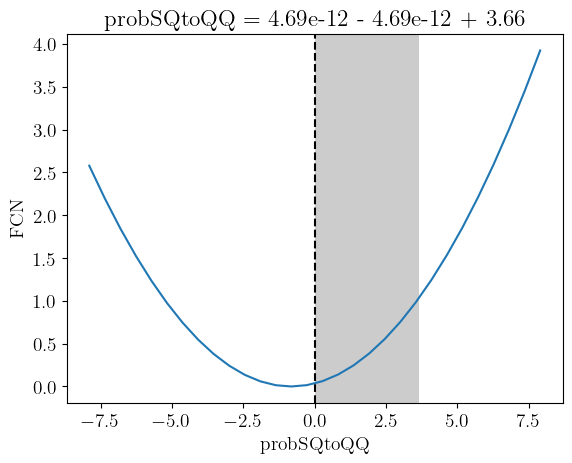

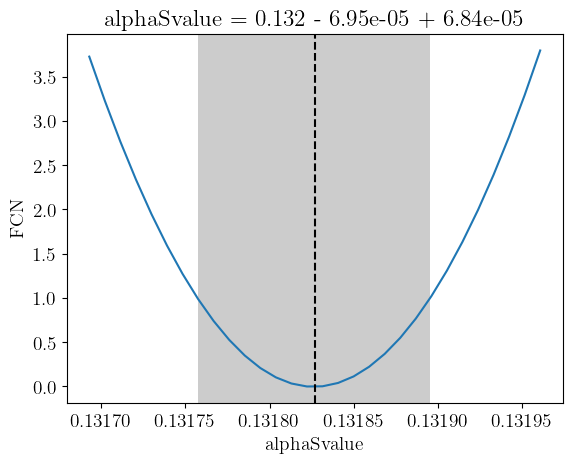

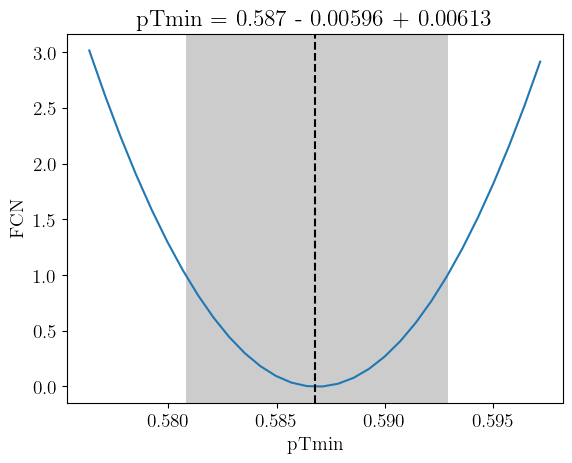

In [118]:
for param in params:
    plt.figure()
    m.draw_mnprofile(param)

In [229]:
covariance = m.covariance
covariance

,aLund,bLund,aExtraSQuark,sigma,enhancedFraction,ProbStoUD,probQQtoQ,probSQtoQQ,alphaSvalue,pTmin
aLund,0.000123,0.06e-3 (0.659),0.23e-3 (0.594),-11.0e-6 (-0.614),0.05e-3 (0.659),-4.2e-6 (-0.249),-1.9e-6 (-0.279),0.18e-3 (0.538),-0.742e-6 (-0.608),-0.04e-3 (-0.526)
bLund,0.06e-3 (0.659),7.07e-05,0.12e-3 (0.403),-5.9e-6 (-0.438),0.03e-3 (0.487),-1.9e-6 (-0.143),-1.5e-6 (-0.288),0.09e-3 (0.350),-0.372e-6 (-0.402),-0.02e-3 (-0.386)
aExtraSQuark,0.23e-3 (0.594),0.12e-3 (0.403),0.00123,-49.8e-6 (-0.880),0.21e-3 (0.890),-7.0e-6 (-0.130),-4.8e-6 (-0.224),0.9e-3 (0.871),-2.929e-6 (-0.759),-0.17e-3 (-0.800)
sigma,-11.0e-6 (-0.614),-5.9e-6 (-0.438),-49.8e-6 (-0.880),2.61e-06,-9.6e-6 (-0.885),0.4e-6 (0.145),0.3e-6 (0.301),-41.0e-6 (-0.832),0.144e-6 (0.812),7.7e-6 (0.773)
enhancedFraction,0.05e-3 (0.659),0.03e-3 (0.487),0.21e-3 (0.890),-9.6e-6 (-0.885),4.5e-05,-1.9e-6 (-0.185),-1.2e-6 (-0.290),0.17e-3 (0.846),-0.585e-6 (-0.792),-0.03e-3 (-0.776)
ProbStoUD,-4.2e-6 (-0.249),-1.9e-6 (-0.143),-7.0e-6 (-0.130),0.4e-6 (0.145),-1.9e-6 (-0.185),2.36e-06,-0.1e-6 (-0.099),-6.4e-6 (-0.138),0.030e-6 (0.177),1.2e-6 (0.127)
probQQtoQ,-1.9e-6 (-0.279),-1.5e-6 (-0.288),-4.8e-6 (-0.224),0.3e-6 (0.301),-1.2e-6 (-0.290),-0.1e-6 (-0.099),3.76e-07,-4.0e-6 (-0.213),0.027e-6 (0.406),0.8e-6 (0.216)
probSQtoQQ,0.18e-3 (0.538),0.09e-3 (0.350),0.9e-3 (0.871),-41.0e-6 (-0.832),0.17e-3 (0.846),-6.4e-6 (-0.138),-4.0e-6 (-0.213),0.000932,-2.483e-6 (-0.739),-0.14e-3 (-0.750)
alphaSvalue,-0.742e-6 (-0.608),-0.372e-6 (-0.402),-2.929e-6 (-0.759),0.144e-6 (0.812),-0.585e-6 (-0.792),0.030e-6 (0.177),0.027e-6 (0.406),-2.483e-6 (-0.739),1.21e-08,0.457e-6 (0.677)
pTmin,-0.04e-3 (-0.526),-0.02e-3 (-0.386),-0.17e-3 (-0.800),7.7e-6 (0.773),-0.03e-3 (-0.776),1.2e-6 (0.127),0.8e-6 (0.216),-0.14e-3 (-0.750),0.457e-6 (0.677),3.76e-05


In [230]:
covariance.correlation()

,aLund,bLund,aExtraSQuark,sigma,enhancedFraction,ProbStoUD,probQQtoQ,probSQtoQQ,alphaSvalue,pTmin
aLund,1,0.7,0.6,-0.6,0.7,-0.2,-0.3,0.5,-0.6,-0.5
bLund,0.7,1,0.4,-0.4,0.5,-0.1,-0.3,0.4,-0.4,-0.4
aExtraSQuark,0.6,0.4,1,-0.9,0.9,-0.1,-0.2,0.9,-0.8,-0.8
sigma,-0.6,-0.4,-0.9,1,-0.9,0.1,0.3,-0.8,0.8,0.8
enhancedFraction,0.7,0.5,0.9,-0.9,1,-0.2,-0.3,0.8,-0.8,-0.8
ProbStoUD,-0.2,-0.1,-0.1,0.1,-0.2,1,-0.1,-0.1,0.2,0.1
probQQtoQ,-0.3,-0.3,-0.2,0.3,-0.3,-0.1,1,-0.2,0.4,0.2
probSQtoQQ,0.5,0.4,0.9,-0.8,0.8,-0.1,-0.2,1,-0.7,-0.8
alphaSvalue,-0.6,-0.4,-0.8,0.8,-0.8,0.2,0.4,-0.7,1,0.7
pTmin,-0.5,-0.4,-0.8,0.8,-0.8,0.1,0.2,-0.8,0.7,1


## Validate the results with the Minuit best fit point

In [265]:
run_valid_card(minos_points)


 >>> PYTHIA settings will be read from file BO_Cards/ALEPH_1996_S3486095_BO_card_valid.cmnd <<< 
 >>> HepMC events will be written to file /media/ali/DATA/TEMP/ALEPH_1996_S3486095_card_valid.fifo <<< 


 *------------------------------------------------------------------------------------* 
 |                                                                                    | 
 |  *------------------------------------------------------------------------------*  | 
 |  |                                                                              |  | 
 |  |                                                                              |  | 
 |  |   PPP   Y   Y  TTTTT  H   H  III    A      Welcome to the Lund Monte Carlo!  |  | 
 |  |   P  P   Y Y     T    H   H   I    A A     This is PYTHIA version 8.309      |  | 
 |  |   PPP     Y      T    HHHHH   I   AAAAA    Last date of change: 16 Feb 2023  |  | 
 |  |   P       Y      T    H   H   I   A   A                                      |

Rivet 3.1.9 running on machine cf9fd2c43a7b (x86_64) at 2024-06-06 21:29:01
Reading events from '/media/ali/DATA/TEMP/ALEPH_1996_S3486095_card_valid.fifo'
Event 100 (0:00:01 elapsed)
Event 200 (0:00:01 elapsed)
Event 300 (0:00:01 elapsed)
Event 400 (0:00:01 elapsed)
Event 500 (0:00:01 elapsed)
Event 600 (0:00:01 elapsed)
Event 700 (0:00:01 elapsed)
Event 800 (0:00:02 elapsed)
Event 900 (0:00:02 elapsed)
Event 1000 (0:00:02 elapsed)
Event 1100 (0:00:02 elapsed)
Event 1200 (0:00:02 elapsed)
Event 1300 (0:00:02 elapsed)
Event 1400 (0:00:02 elapsed)
Event 1500 (0:00:03 elapsed)
Event 1600 (0:00:03 elapsed)
Event 1700 (0:00:03 elapsed)
Event 1800 (0:00:04 elapsed)
Event 1900 (0:00:04 elapsed)
Event 2000 (0:00:04 elapsed)
Event 2100 (0:00:04 elapsed)
Event 2200 (0:00:04 elapsed)
Event 2300 (0:00:04 elapsed)
Event 2400 (0:00:04 elapsed)
Event 2500 (0:00:05 elapsed)
Event 2600 (0:00:05 elapsed)
Event 2700 (0:00:05 elapsed)
Event 2800 (0:00:05 elapsed)
Event 2900 (0:00:05 elapsed)
Event 3000 (0





Rivet.AnalysisHandler: INFO  Using named weights


In [266]:
dfdata, dfsims_valid, generated_indices = get_valid_data()

[0, 0]
looping over 2 sim yoda files...



 50%|████████████████████████████████████████████████████████████████████████████████████████                                                                                        | 1/2 [00:00<00:00,  6.79it/s]

using filename ALEPH_YODAS_BayesOpt/ALEPH_1996_S3486095_hist_valid_0.yoda
using filename ALEPH_YODAS_BayesOpt/ALEPH_1996_S3486095_hist_valid_0.yoda


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:00<00:00,  7.63it/s]


using filename ALEPH_YODAS_BayesOpt/data/ALEPH_1996_S3486095.yoda


In [267]:
print(generated_indices)
# print(dfsims)
print('DATA DATAFRAME')
print(dfdata['/REF/ALEPH_1996_S3486095/d01-x01-y01'].head())
print('FIRST SIM-VALID DATAFRAME')
print(dfsims_valid[generated_indices[0]]['/ALEPH_1996_S3486095/d01-x01-y01'].head())

[0, 0]
DATA DATAFRAME
     xval   xerr-   xerr+       yval     yerr-     yerr+
0  0.0025  0.0025  0.0025  12.360000  0.407922  0.407922
1  0.0075  0.0025  0.0025  23.330000  0.254951  0.254951
2  0.0125  0.0025  0.0025  20.230000  0.156205  0.156205
3  0.0175  0.0025  0.0025  16.690001  0.120416  0.120416
4  0.0225  0.0025  0.0025  13.410000  0.100000  0.100000
FIRST SIM-VALID DATAFRAME
    xlow  xhigh       sumw     sumw2     sumwx    sumwx2  numEntries
0  0.000  0.005  12.448800  0.009959  0.042464  0.031830     15561.0
1  0.005  0.010  23.898399  0.019119  0.178911  0.277557     29873.0
2  0.010  0.015  20.910400  0.016728  0.259191  0.651228     26138.0
3  0.015  0.020  17.056801  0.013645  0.296816  1.040128     21321.0
4  0.020  0.025  13.781600  0.011025  0.309051  1.391788     17227.0


In [268]:
data_keys, mc_keys = get_hist_names(dfdata)
filtered_data_keys, filtered_mc_keys = filter_keys(dfdata, dfsims_valid, data_keys, mc_keys)

 new data keys ['/REF/ALEPH_1996_S3486095/d01-x01-y01', '/REF/ALEPH_1996_S3486095/d02-x01-y01', '/REF/ALEPH_1996_S3486095/d03-x01-y01', '/REF/ALEPH_1996_S3486095/d04-x01-y01', '/REF/ALEPH_1996_S3486095/d05-x01-y01', '/REF/ALEPH_1996_S3486095/d06-x01-y01', '/REF/ALEPH_1996_S3486095/d07-x01-y01', '/REF/ALEPH_1996_S3486095/d08-x01-y01', '/REF/ALEPH_1996_S3486095/d09-x01-y01', '/REF/ALEPH_1996_S3486095/d10-x01-y01', '/REF/ALEPH_1996_S3486095/d11-x01-y01', '/REF/ALEPH_1996_S3486095/d12-x01-y01', '/REF/ALEPH_1996_S3486095/d17-x01-y01', '/REF/ALEPH_1996_S3486095/d18-x01-y01', '/REF/ALEPH_1996_S3486095/d25-x01-y01', '/REF/ALEPH_1996_S3486095/d26-x01-y01', '/REF/ALEPH_1996_S3486095/d27-x01-y01', '/REF/ALEPH_1996_S3486095/d28-x01-y01', '/REF/ALEPH_1996_S3486095/d29-x01-y01', '/REF/ALEPH_1996_S3486095/d30-x01-y01', '/REF/ALEPH_1996_S3486095/d31-x01-y01', '/REF/ALEPH_1996_S3486095/d32-x01-y01', '/REF/ALEPH_1996_S3486095/d33-x01-y01', '/REF/ALEPH_1996_S3486095/d34-x01-y01', '/REF/ALEPH_1996_S348609

In [269]:
reduced_data_keys, reduced_mc_keys = reduce_filtered_keys(filtered_data_keys, filtered_mc_keys)
print(reduced_data_keys, reduced_mc_keys)
print(f'length of reduced data keys = {len(reduced_data_keys)}')
print(f'length of reduced mc keys = {len(reduced_mc_keys)}')

['/REF/ALEPH_1996_S3486095/d01-x01-y01', '/REF/ALEPH_1996_S3486095/d02-x01-y01', '/REF/ALEPH_1996_S3486095/d03-x01-y01', '/REF/ALEPH_1996_S3486095/d04-x01-y01', '/REF/ALEPH_1996_S3486095/d05-x01-y01', '/REF/ALEPH_1996_S3486095/d06-x01-y01', '/REF/ALEPH_1996_S3486095/d07-x01-y01', '/REF/ALEPH_1996_S3486095/d08-x01-y01', '/REF/ALEPH_1996_S3486095/d09-x01-y01', '/REF/ALEPH_1996_S3486095/d10-x01-y01', '/REF/ALEPH_1996_S3486095/d11-x01-y01', '/REF/ALEPH_1996_S3486095/d12-x01-y01', '/REF/ALEPH_1996_S3486095/d17-x01-y01', '/REF/ALEPH_1996_S3486095/d18-x01-y01', '/REF/ALEPH_1996_S3486095/d25-x01-y01', '/REF/ALEPH_1996_S3486095/d26-x01-y01', '/REF/ALEPH_1996_S3486095/d27-x01-y01', '/REF/ALEPH_1996_S3486095/d28-x01-y01', '/REF/ALEPH_1996_S3486095/d29-x01-y01', '/REF/ALEPH_1996_S3486095/d30-x01-y01', '/REF/ALEPH_1996_S3486095/d31-x01-y01', '/REF/ALEPH_1996_S3486095/d32-x01-y01', '/REF/ALEPH_1996_S3486095/d33-x01-y01', '/REF/ALEPH_1996_S3486095/d34-x01-y01', '/REF/ALEPH_1996_S3486095/d37-x01-y01',

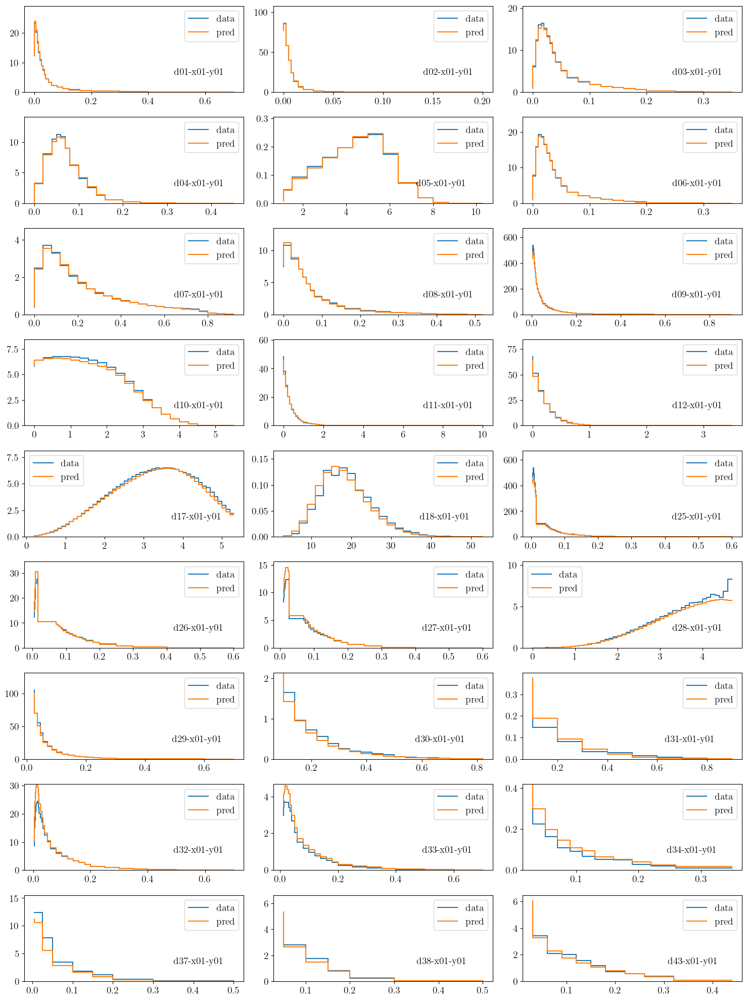

In [270]:
importlib.reload(pythia_SBI_utils)
from pythia_SBI_utils import * 

hists = make_hists(dfdata, dfsims_valid[0], reduced_data_keys, reduced_mc_keys)

plot_dist(reduced_data_keys, hists, filename=f'images/Ax_Minuit_Valid_Best_fit_hists_reduced_params_{N_ITER}_iter.pdf')

In [110]:
import emcee

In [111]:
REDUCED_MONASH_DICT

{'aLund': 0.68,
 'bLund': 0.98,
 'aExtraSQuark': 0.0,
 'sigma': 0.335,
 'enhancedFraction': 0.01,
 'ProbStoUD': 0.217,
 'probQQtoQ': 0.081,
 'probSQtoQQ': 0.915,
 'alphaSvalue': 0.1365,
 'pTmin': 0.5}

In [123]:
Monash_init_points = np.array(list(REDUCED_MONASH_DICT.values()))
Monash_init_points= Monash_init_points.reshape(1,10)
Monash_init_points.shape

(1, 10)

In [124]:
minos_points

NameError: name 'minos_points' is not defined

In [125]:
minos_init_points = np.array(list(REDUCED_MONASH_DICT.values()))
minos_init_points= minos_init_points.reshape(1,10)
minos_init_points.shape

(1, 10)

In [126]:
init_points = np.concatenate([Monash_init_points,minos_init_points])
init_points.shape

(2, 10)

In [143]:
p0_monash = np.repeat(Monash_init_points,nwalkers,axis=0)
Monash_init_points.flatten()

array([0.68  , 0.98  , 0.    , 0.335 , 0.01  , 0.217 , 0.081 , 0.915 ,
       0.1365, 0.5   ])

In [161]:
def get_mvn_samples(mu,cov,n,d):
    samples = np.zeros((n,d))
    for i in range(n-1):      
        samples[i,:] = np.random.multivariate_normal(mu, cov, 1)
    
    return samples

init_params = get_mvn_samples(mu=Monash_init_points.flatten(), cov=np.random.randn(10,10), n=nwalkers, d=10)

/tmp/ipykernel_57/421964683.py:4: RuntimeWarning:

covariance is not symmetric positive-semidefinite.



In [162]:
init_params.shape

(22, 10)

In [163]:
def cost_func_emcee(params):
    aLund, bLund, aExtraSQuark, sigma,enhancedFraction,ProbStoUD,probQQtoQ,probSQtoQQ,alphaSvalue,pTmin = params
    
    params_dict = {
    "aLund" : aLund, 
    "bLund" : bLund,
    "aExtraSQuark": aExtraSQuark,
    "sigma":sigma,
    "enhancedFraction":enhancedFraction,
    "ProbStoUD":ProbStoUD,
    "probQQtoQ":probQQtoQ,
    "probSQtoQQ":probSQtoQQ,
    "alphaSvalue": alphaSvalue,
    "pTmin": pTmin
    }
    means, covs = model.predict([
            ObservationFeatures(parameters=params_dict)
        ]
    )
    
    result= means['true_objective_func'][0]
    if np.isnan(result):
        result = -np.inf
    if any(np.isinf(params)):
        result = -np.inf
    
    return result


ndim=10
nwalkers = 22 #has to be even, preferabbly a multiple of n_params
nparams=10
n_burn    = 500 # "burn-in" period to let chains stabilize
n_steps = 5000   # number of MCMC steps to take after burn-in


filename = 'EMCEE_SAMPLER.h5'
backend = emcee.backends.HDFBackend(filename)
backend.reset(nwalkers, ndim)
p0 = np.random.randn(nwalkers, ndim)

#you can access the sampler later (to check convergence, etc) by sampler = emcee.backends.HDFBackend(filename)
#Start the sampler. first arg=number of walkers, second: number of parameters, third the log likelihood, threads gives you th eoption to use more cores
sampler = emcee.EnsembleSampler(nwalkers, nparams, cost_func_emcee, backend = backend, threads=12)

#DO THE BIRN IN, RUN MCMC WITHOUT STORING THE RESULTS
pos, prob, state = sampler.run_mcmc(init_params, n_burn, progress=True, store=True)
# sampler.reset()

# Sample again, starting from end burn-in state (starting at pos and ending at nsteops)

state = sampler.run_mcmc(init_params, n_steps, progress=True, store=True)

##########GET THE ACTUAL SAMPLES. Samples will have shape (n_walkers, n_params), eg. samples[:,0] is the density of the first parameter
samples = sampler.get_chain(discard=n_burn, thin=15, flat=True)

 52%|█████████████████████████████████████████████████████████████████████████████████████████▏                                                                                | 2622/5000 [01:44<01:35, 24.98it/s]


ValueError: At least one parameter value was infinite

In [150]:
samples.shape

(546, 10)

(array([  1.,   0.,   1.,   3., 533.,   3.,   2.,   0.,   1.,   2.]),
 array([-7.58290223e+69, -6.03016360e+69, -4.47742498e+69, -2.92468636e+69,
        -1.37194773e+69,  1.80790891e+68,  1.73352951e+69,  3.28626814e+69,
         4.83900676e+69,  6.39174539e+69,  7.94448401e+69]),
 <BarContainer object of 10 artists>)

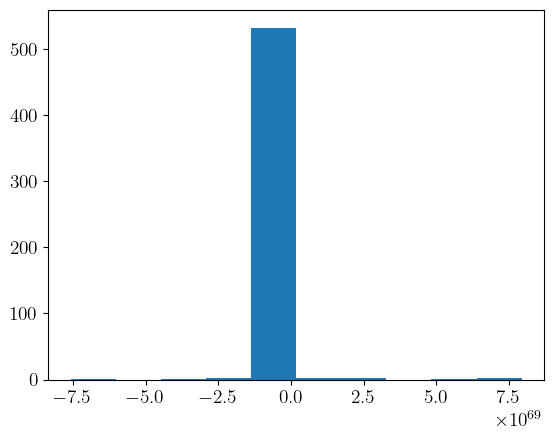

In [151]:
plt.hist(samples[:,0])

(array([  2160.,  20968.,  63290., 126149., 210493., 409447., 127348.,
         65753.,  21571.,   2821.]),
 array([-1.75950147e+154, -1.41072542e+154, -1.06194936e+154,
        -7.13173307e+153, -3.64397252e+153, -1.56211959e+152,
         3.33154860e+153,  6.81930916e+153,  1.03070697e+154,
         1.37948303e+154,  1.72825908e+154]),
 <BarContainer object of 10 artists>)

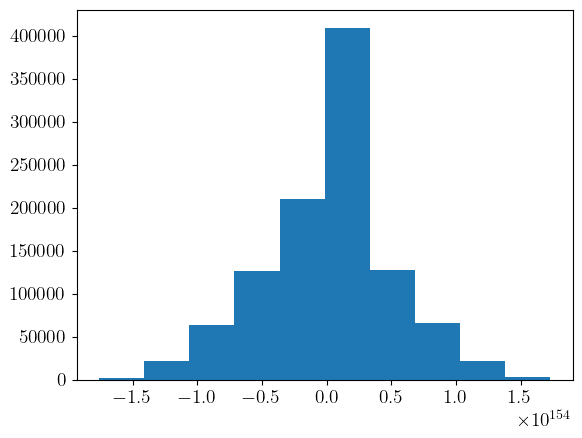

In [360]:
plt.hist(samples[:,1])